In [1]:
%config Completer.use_jedi = False

In [2]:
%load_ext autoreload
%autoreload 2

In [53]:
# from arch.bootstrap import StationaryBootstrap
# from arch.bootstrap import IndependentSamplesBootstrap
# from arch.bootstrap import bootstrapped_difference
# from bootstrapped import bootstrap as bs
# from bootstrapped import compare_functions as cf
import hdbscan
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.pyplot as plt
import matplotlib as mpl
import math
import numpy as np
import os
import pandas as pd
import pickle
import random
from scipy.optimize import nnls
from scipy.optimize import curve_fit
from scipy.optimize import minimize
import scipy
import scipy.cluster.hierarchy as sch
from scipy.stats import mannwhitneyu, normaltest
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.cluster import affinity_propagation
from sklearn.metrics import pairwise_distances
from sklearn.decomposition import PCA
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import LinearRegression
from sklearn.datasets import make_regression
from joblib import Parallel, delayed
# import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statannotations.Annotator import Annotator
import umap
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

In [4]:
from utils import create_abundance_header_new, compute_cons_abun_prod, hierarchical_cluster_metabs, \
    get_metabs_clusters, avg_consumption_df, fit_ss_Ri, match_lhs_rhs_fit, \
    blindly_pred_abun_growth, fit_dynamic_Ri, compute_growth_ratio_iterate_blind_seq, \
    blindly_pred_abun_growth_seq, blindly_pred_abun_loggrowth, remove_passages, fit_dynamic_Ri_with_sim_inoc, \
    fit_dynamic_Ri_with_sim_inoc_bal, compute_Ri_dynamic_goodness_of_fit, \
    plot_panel_pred_vs_obs_abundance_blind, compute_growth_ratio_iterate_blind, \
    blindly_pred_abun_growth_without_inoc

# Get data

In [6]:
# directory with all data
data_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'data', 'jin_pollard'))

In [7]:
# metabolite names and indices of the selected metabolites (metabolites used for the 
# species-metabolite consumption matrix, c_species^metabolite)
file_metabNames = os.path.join(data_dir, 
                                "metabolites_list_FC.csv")
df_metabNames = pd.read_csv(file_metabNames, sep=",", header=0)

file_metabIds = os.path.join(data_dir, 
                                "metabolite_indices.csv")
df_metabIds = pd.read_csv(file_metabIds, sep=",", header=None)

metab_names = df_metabNames.iloc[:, 1].values[df_metabIds.iloc[:, 0].values - 1]

unique_, counts_ = np.unique(metab_names, return_counts=True)

id_rep = np.where(counts_ > 1)[0]

for rep_ in id_rep:
    id_m = np.where(metab_names == unique_[rep_])[0]
    
    for count_, id_ in enumerate(id_m):
        metab_names[id_] = f'{metab_names[id_]}_{count_}'

In [8]:
metab_names

array(['GALACTOSAMINE', 'N-METHYL-ASPARTIC ACID_0',
       '2-AMINO-2-METHYLPROPANOIC ACID', 'NICOTINIC ACID', 'OLEIC ACID',
       'MANNOSE 6-PHOSPHATE', 'VALINE_0', 'SUCROSE_0', 'THREONINE_0',
       'BETA-ALANINE_0', '1,3-DIAMINOPROPANE', '3-HYDROXYPROPIONIC ACID',
       '5,6-DIHYDROURACIL', '1-METHYL-HYDANTOIN', 'SUCCINIC ACID',
       '2-HYDROXY-2-METHYLBUTYRIC ACID', '5-METHYLCYTOSINE',
       '3-HYDROXY-2-METHYL-4-PYRONE', 'PIPECOLIC ACID', 'CINNAMALDEHYDE',
       'N-BENZYLFORMAMIDE', 'UROCANIC ACID', 'ETHANOLAMINE PHOSPHATE',
       '8-HYDROXYQUINOLINE_0', 'SPERMIDINE', '3-AMINOSALICYLIC ACID',
       'CARNITINE', '2-(4-HYDROXYPHENYL)PROPIONIC ACID',
       'AMINO(4-HYDROXYCYCLOHEXYL)ACETIC ACID', 'PHOSPHOCHOLINE',
       '3,4-DIHYDROXY-PHENYLALANINE', 'OMEGA-HYDROXYDODECANOIC ACID',
       'PROPIONYLCARNITINE', 'N-ACETYL-TYROSINE',
       'TRYPTOPHAN ETHYL ESTER', 'CYSTINE', 'N1-ACETYLSPERMINE',
       'HEPTADECANOIC ACID', '1-METHYLADENOSINE', 'STEARIC ACID',
       'RAC-GL

In [9]:
# species names and indices of the selected species (metabolites used for the 
# species abundance matrix, B_species_k)
file_speciesNames = os.path.join(data_dir, 
                                "species_list.csv")
df_speciesNames = pd.read_csv(file_speciesNames, sep=",", header=0)

file_speciesIds = os.path.join(data_dir, 
                                "species_indices.csv")
df_speciesIds = pd.read_csv(file_speciesIds, sep=",", header=None)
species_names = df_speciesNames.iloc[:, 0].values[df_speciesIds.iloc[:, 0].values - 1]

In [10]:
species_names

array(['Acidaminococcus fermentans DSMZ 20731',
       'Acidaminococcus intestini D21 BEI HM-81',
       'Anaerostipes caccae DSMZ 14662',
       'Anaerotruncus colihominis DSMZ 17241',
       'Bacteroides caccae ATCC 43185',
       'Bacteroides cellulosilyticus DSMZ 14838',
       'Bacteroides coprophilus DSMZ 18228',
       'Bacteroides dorei 5_1_36/D4 BEI HM-29',
       'Bacteroides dorei DSMZ 17855', 'Bacteroides eggerthii ATCC 27754',
       'Bacteroides finegoldii DSMZ 17565',
       'Bacteroides fragilis 3_1_12 BEI HM-20',
       'Bacteroides intestinalis DSMZ 17393',
       'Bacteroides ovatus ATCC 8483', 'Bacteroides plebeius DSMZ 17135',
       'Bacteroides sp. 1_1_6 BEI HM-23',
       'Bacteroides sp. 2_1_16 BEI HM-58',
       'Bacteroides sp. 2_1_22 BEI HM-18',
       'Bacteroides sp. 3_1_19 BEI HM-19',
       'Bacteroides sp. 9_1_42FAA BEI HM-27',
       'Bacteroides sp. D20 BEI HM-189',
       'Bacteroides stercoris ATCC 43183',
       'Bacteroides thetaiotaomicron VPI 54

In [11]:
# species-metabolite consumption matrix, c_species^metabolite
file_speciesProd = os.path.join(data_dir, 
                                "species_metabolite_production_matrix.csv")
thresh_zero_prod = 0
df_speciesProd = pd.read_csv(file_speciesProd, sep=",", header=None)
df_speciesProd[df_speciesProd == 0] = thresh_zero_prod
# num_species, num_metabs = df_speciesProd.shape

In [12]:
# species-metabolite consumption matrix, c_species^metabolite
file_speciesMetab = os.path.join(data_dir, 
                                "species_metabolite_consumption_matrix.csv")
thresh_zero_metab = 0
df_speciesMetab = pd.read_csv(file_speciesMetab, sep=",", header=None)
df_speciesMetab[df_speciesMetab == 0] = thresh_zero_metab
num_species, num_metabs = df_speciesMetab.shape
df_speciesMetab.columns = metab_names
df_speciesMetab.index = species_names

In [13]:
# species abundances for all passages and bioreplicates
num_passages = 6
num_bioRep = 3
file_speciesAbun = os.path.join(data_dir, 
                                "species_abundances.csv")
df_speciesAbun = pd.read_csv(file_speciesAbun, sep=",", header=None)
df_speciesAbun.columns = create_abundance_header_new(num_bioRep=num_bioRep, num_passages=num_passages)
df_speciesAbun_raw = df_speciesAbun.copy()
thresh_zero = 1e-8
df_speciesAbun[df_speciesAbun == 0] = thresh_zero
df_speciesAbun.index = species_names
df_speciesAbun_T = df_speciesAbun.copy()
df_speciesAbun_T = df_speciesAbun_T.transpose()

In [14]:
# species abundances for all passages and bioreplicates
num_passages = 6
num_bioRep = 3
file_speciesAbun_super_agar = os.path.join(data_dir, 
                                "species_abundances_plain_agar_supernatant.csv")
df_speciesAbun_super_agar = pd.read_csv(file_speciesAbun_super_agar, sep=",", header=None)
df_speciesAbun_super_agar.columns = \
    create_abundance_header_new(num_bioRep=num_bioRep, num_passages=num_passages)
df_speciesAbun_super_agar_raw = df_speciesAbun_super_agar.copy()
thresh_zero = 1e-8
df_speciesAbun_super_agar[df_speciesAbun_super_agar == 0] = thresh_zero
df_speciesAbun_super_agar.index = species_names
df_speciesAbun_super_agar_T = df_speciesAbun_super_agar.copy()
df_speciesAbun_super_agar_T = df_speciesAbun_super_agar_T.transpose()

SignificanceResult(statistic=0.7735208443503792, pvalue=1.877235066355581e-226)
PearsonRResult(statistic=0.6904302686235646, pvalue=2.24458824211391e-161)


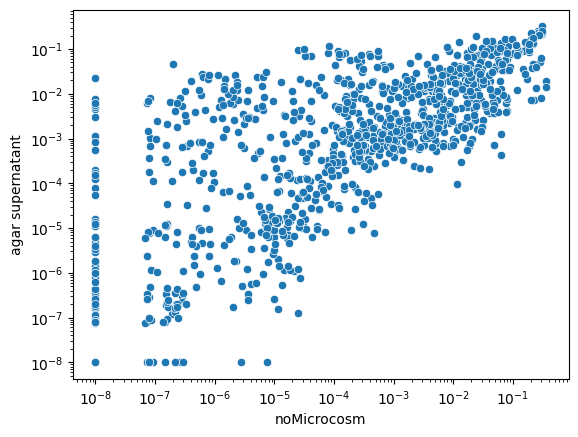

In [15]:
y = np.array(df_speciesAbun_super_agar).flatten()
x = np.array(df_speciesAbun).flatten()
plt_ = sns.scatterplot(x=x, y=y)
plt_.set_xscale("log", base=10)
plt_.set_yscale("log", base=10)
plt_.set_xlabel("noMicrocosm")
plt_.set_ylabel("agar supernatant")
print(scipy.stats.spearmanr(x, y))
print(scipy.stats.pearsonr(x, y))

In [16]:
# species abundances for all passages and bioreplicates
num_passages = 6
num_bioRep = 3
file_speciesAbun_mucin = os.path.join(data_dir, 
                                "species_abundances_mucin_supernatant.csv")
df_speciesAbun_mucin = pd.read_csv(file_speciesAbun_mucin, sep=",", header=None)
df_speciesAbun_mucin.columns = \
    create_abundance_header_new(num_bioRep=num_bioRep, num_passages=num_passages)
df_speciesAbun_mucin_raw = df_speciesAbun_mucin.copy()
thresh_zero = 1e-8
df_speciesAbun_mucin[df_speciesAbun_mucin == 0] = thresh_zero
df_speciesAbun_mucin.index = species_names
df_speciesAbun_mucin_T = df_speciesAbun_mucin.copy()
df_speciesAbun_mucin_T = df_speciesAbun_mucin_T.transpose()

SignificanceResult(statistic=0.9198071163033489, pvalue=0.0)
PearsonRResult(statistic=0.8890501181858017, pvalue=0.0)


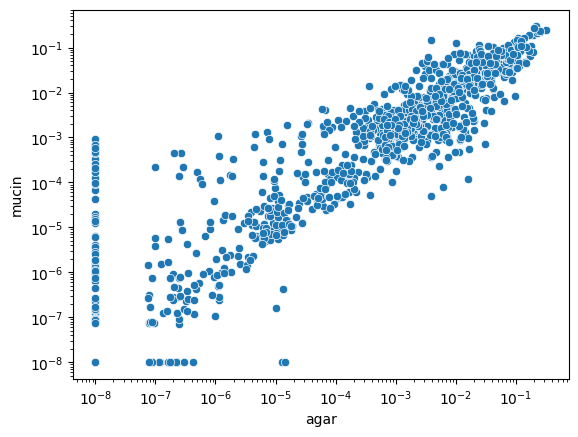

In [17]:
x = np.array(df_speciesAbun_super_agar).flatten()
# x = np.array(df_speciesAbun).flatten()
y = np.array(df_speciesAbun_mucin).flatten()
plt_ = sns.scatterplot(x=x, y=y)
plt_.set_xscale("log", base=10)
plt_.set_yscale("log", base=10)
# plt_.set_xlabel("noMicrocosm")
plt_.set_xlabel("agar")
plt_.set_ylabel("mucin")
print(scipy.stats.spearmanr(x, y))
print(scipy.stats.pearsonr(x, y))

In [19]:

file_speciesAbun = os.path.join(data_dir, 
                                "species_abundances_inoculum.csv")
df_speciesAbun_inoc = pd.read_csv(file_speciesAbun, sep=",", header=None)
df_speciesAbun_inoc.columns = ["inoculum"]
df_speciesAbun_inoc[df_speciesAbun_inoc == 0] = thresh_zero
df_speciesAbun_inoc.index = species_names

In [20]:
# consumption, abundance product. Sum of species-metabolite consumption matrix, c_species^metabolite, for each 
# metabolite for each passage (and replicate) across all the species
# df_cons_abun_prod = df_speciesAbun_T.dot(df_speciesMetab)
df_cons_abun_prod = compute_cons_abun_prod(df_speciesMetab=df_speciesMetab, 
                                           df_speciesAbun=df_speciesAbun)
df_cons_abun_prod_avg = df_cons_abun_prod.mean(axis=0)
id_metabs_sorted = np.argsort(df_cons_abun_prod_avg)[::-1]

In [21]:
passages_ = np.array(['p1', 'p2', 'p3', 'p4', 'p5', 'p6'])
reps_ = np.array(['r0', 'r1', 'r2'])
df_speciesAbun_ratio = pd.DataFrame()
df_speciesAbun_ratio_corr = pd.DataFrame()
df_speciesAbun_new = pd.DataFrame()
df_speciesAbun_prev = pd.DataFrame()
df_speciesAbun_next = pd.DataFrame()
df_speciesAbun_split = pd.DataFrame()
count_ = 0
brep_vec = list(range(num_bioRep))
for rep_ in reps_:
    for pass_ in range(1, len(passages_)):
        col_1 = passages_[pass_ - 1] + "_" + rep_
        col_2 = passages_[pass_] + "_" + rep_
        
        df_speciesAbun_prev[col_2] = df_speciesAbun[col_1].values
        df_speciesAbun_next[col_2] = df_speciesAbun[col_2].values
        
        array_1 = np.array(df_speciesAbun[col_2].values / df_speciesAbun[col_1].values)
        array_2 = np.array(df_speciesAbun[col_2].values)
        array_3 = np.array(df_speciesAbun[col_1].values)
        
        df_speciesAbun_new[col_1] = df_speciesAbun[col_1].values
        df_speciesAbun_new[col_2] = df_speciesAbun[col_2].values
        df_speciesAbun_ratio[col_2] = array_1.copy()
        df_speciesAbun_ratio_corr[col_2] = array_1.copy()
        id_ = np.where((array_3 == thresh_zero) & (array_2 == thresh_zero))[0]
#         id_ = np.where((array_2 == thresh_zero))[0]
#         id_ = np.where(array_1 == 1)[0]
        
        if len(id_) > 0:
            df_speciesAbun_ratio.iloc[id_, count_] = -1
            rep_alt = list(set(reps_) - set([rep_]))
            ratio_vec = []
            for id_tmp in id_:
                abun_alt_ratio = []
                for rep__ in rep_alt:
                    col_1_ = passages_[pass_ - 1] + "_" + rep__
                    col_2_ = passages_[pass_] + "_" + rep__
                    val_1 = df_speciesAbun[col_1_].values[id_tmp]
                    val_2 = df_speciesAbun[col_2_].values[id_tmp]
                    if (val_1 != thresh_zero) | (val_2 != thresh_zero):
                        abun_alt_ratio.append(val_2 / val_1)
                if len(abun_alt_ratio) != 0:
                    df_speciesAbun_ratio_corr.iloc[id_tmp, count_] = \
                        np.exp(np.mean(np.log10(np.array(abun_alt_ratio))))
                else:
                    df_speciesAbun_ratio_corr.iloc[id_tmp, count_] = -1
                
        count_ += 1

In [22]:
# previous and next abundances for supernatant agar
passages_ = np.array(['p1', 'p2', 'p3', 'p4', 'p5', 'p6'])
reps_ = np.array(['r0', 'r1', 'r2'])
df_speciesAbun_super_agar_ratio = pd.DataFrame()
df_speciesAbun_super_agar_ratio_corr = pd.DataFrame()
df_speciesAbun_super_agar_new = pd.DataFrame()
df_speciesAbun_super_agar_prev = pd.DataFrame()
df_speciesAbun_super_agar_next = pd.DataFrame()
df_speciesAbun_super_agar_split = pd.DataFrame()
count_ = 0
brep_vec = list(range(num_bioRep))
for rep_ in reps_:
    for pass_ in range(1, len(passages_)):
        col_1 = passages_[pass_ - 1] + "_" + rep_
        col_2 = passages_[pass_] + "_" + rep_
        
        df_speciesAbun_super_agar_prev[col_2] = df_speciesAbun_super_agar[col_1].values
        df_speciesAbun_super_agar_next[col_2] = df_speciesAbun_super_agar[col_2].values
        
        array_1 = np.array(df_speciesAbun_super_agar[col_2].values / df_speciesAbun_super_agar[col_1].values)
        array_2 = np.array(df_speciesAbun_super_agar[col_2].values)
        array_3 = np.array(df_speciesAbun_super_agar[col_1].values)
        
        df_speciesAbun_super_agar_new[col_1] = df_speciesAbun_super_agar[col_1].values
        df_speciesAbun_super_agar_new[col_2] = df_speciesAbun_super_agar[col_2].values
        df_speciesAbun_super_agar_ratio[col_2] = array_1.copy()
        df_speciesAbun_super_agar_ratio_corr[col_2] = array_1.copy()
        id_ = np.where((array_3 == thresh_zero) & (array_2 == thresh_zero))[0]
#         id_ = np.where((array_2 == thresh_zero))[0]
#         id_ = np.where(array_1 == 1)[0]
        
        if len(id_) > 0:
            df_speciesAbun_super_agar_ratio.iloc[id_, count_] = -1
            rep_alt = list(set(reps_) - set([rep_]))
            ratio_vec = []
            for id_tmp in id_:
                Abun_super_agar_alt_ratio = []
                for rep__ in rep_alt:
                    col_1_ = passages_[pass_ - 1] + "_" + rep__
                    col_2_ = passages_[pass_] + "_" + rep__
                    val_1 = df_speciesAbun_super_agar[col_1_].values[id_tmp]
                    val_2 = df_speciesAbun_super_agar[col_2_].values[id_tmp]
                    if (val_1 != thresh_zero) | (val_2 != thresh_zero):
                        Abun_super_agar_alt_ratio.append(val_2 / val_1)
                if len(Abun_super_agar_alt_ratio) != 0:
                    df_speciesAbun_super_agar_ratio_corr.iloc[id_tmp, count_] = \
                        np.exp(np.mean(np.log10(np.array(Abun_super_agar_alt_ratio))))
                else:
                    df_speciesAbun_super_agar_ratio_corr.iloc[id_tmp, count_] = -1
                
        count_ += 1

In [23]:
# previous and next abundances for mucin agar
passages_ = np.array(['p1', 'p2', 'p3', 'p4', 'p5', 'p6'])
reps_ = np.array(['r0', 'r1', 'r2'])
df_speciesAbun_mucin_ratio = pd.DataFrame()
df_speciesAbun_mucin_ratio_corr = pd.DataFrame()
df_speciesAbun_mucin_new = pd.DataFrame()
df_speciesAbun_mucin_prev = pd.DataFrame()
df_speciesAbun_mucin_next = pd.DataFrame()
df_speciesAbun_mucin_split = pd.DataFrame()
count_ = 0
brep_vec = list(range(num_bioRep))
for rep_ in reps_:
    for pass_ in range(1, len(passages_)):
        col_1 = passages_[pass_ - 1] + "_" + rep_
        col_2 = passages_[pass_] + "_" + rep_
        
        df_speciesAbun_mucin_prev[col_2] = df_speciesAbun_mucin[col_1].values
        df_speciesAbun_mucin_next[col_2] = df_speciesAbun_mucin[col_2].values
        
        array_1 = np.array(df_speciesAbun_mucin[col_2].values / df_speciesAbun_mucin[col_1].values)
        array_2 = np.array(df_speciesAbun_mucin[col_2].values)
        array_3 = np.array(df_speciesAbun_mucin[col_1].values)
        
        df_speciesAbun_mucin_new[col_1] = df_speciesAbun_mucin[col_1].values
        df_speciesAbun_mucin_new[col_2] = df_speciesAbun_mucin[col_2].values
        df_speciesAbun_mucin_ratio[col_2] = array_1.copy()
        df_speciesAbun_mucin_ratio_corr[col_2] = array_1.copy()
        id_ = np.where((array_3 == thresh_zero) & (array_2 == thresh_zero))[0]
#         id_ = np.where((array_2 == thresh_zero))[0]
#         id_ = np.where(array_1 == 1)[0]
        
        if len(id_) > 0:
            df_speciesAbun_mucin_ratio.iloc[id_, count_] = -1
            rep_alt = list(set(reps_) - set([rep_]))
            ratio_vec = []
            for id_tmp in id_:
                Abun_mucin_alt_ratio = []
                for rep__ in rep_alt:
                    col_1_ = passages_[pass_ - 1] + "_" + rep__
                    col_2_ = passages_[pass_] + "_" + rep__
                    val_1 = df_speciesAbun_mucin[col_1_].values[id_tmp]
                    val_2 = df_speciesAbun_mucin[col_2_].values[id_tmp]
                    if (val_1 != thresh_zero) | (val_2 != thresh_zero):
                        Abun_mucin_alt_ratio.append(val_2 / val_1)
                if len(Abun_mucin_alt_ratio) != 0:
                    df_speciesAbun_mucin_ratio_corr.iloc[id_tmp, count_] = \
                        np.exp(np.mean(np.log10(np.array(Abun_mucin_alt_ratio))))
                else:
                    df_speciesAbun_mucin_ratio_corr.iloc[id_tmp, count_] = -1
                
        count_ += 1

SignificanceResult(statistic=0.7021738744023178, pvalue=2.1431366586293513e-29)
PearsonRResult(statistic=0.4646599522178642, pvalue=1.6352848782187748e-11)


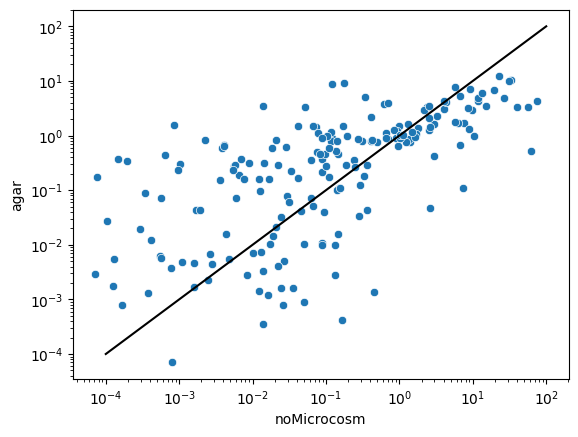

In [24]:
pass_ = 0
id_pass = [pass_, pass_ + 5, pass_ + 10] 
x = np.array(df_speciesAbun_ratio.iloc[:, id_pass]).flatten()
# x = np.array(df_speciesAbun).flatten()
y = np.array(df_speciesAbun_super_agar_ratio.iloc[:, id_pass]).flatten()
plt_ = sns.scatterplot(x=x, y=y)
plt_.set_xscale("log", base=10)
plt_.set_yscale("log", base=10)
plt_.set_xlabel("noMicrocosm")
plt_.set_ylabel("agar")
plt_.plot([1e-4, 1e2], [1e-4, 1e2], c="black")
# plt_.set_ylabel("mucin")
print(scipy.stats.spearmanr(x, y))
print(scipy.stats.pearsonr(x, y))

# parameters setup

In [25]:
date_ = '20230517'
distance_metric = 'euclidean'
# distance_metric = 'correlation'
metab_cluster_mean_func = 'geometric'
metab_cluster_mean_func = "linear"
clustering_method = "hdbscan"
clustering_method = "hierarch_clust"
random_seed = 635
# random_seed = 9876
# random_seed = 7360
# microcosm_type = "supernatantAgar"
# microcosm_type = "mucin"
microcosm_type = "noMicrocosm"

In [26]:
if microcosm_type == "noMicrocosm":
    df_speciesAbun_mdl = df_speciesAbun.copy()
    df_speciesAbun_prev_mdl = df_speciesAbun_prev.copy()
    df_speciesAbun_next_mdl = df_speciesAbun_next.copy()
    df_speciesAbun_ratio_mdl = df_speciesAbun_ratio.copy()
elif microcosm_type == "supernatantAgar":
    df_speciesAbun_mdl = df_speciesAbun_super_agar.copy()
    df_speciesAbun_prev_mdl = df_speciesAbun_super_agar_prev.copy()
    df_speciesAbun_next_mdl = df_speciesAbun_super_agar_next.copy()
    df_speciesAbun_ratio_mdl = df_speciesAbun_super_agar_ratio.copy()
elif microcosm_type == "mucin":
    df_speciesAbun_mdl = df_speciesAbun_mucin.copy()
    df_speciesAbun_prev_mdl = df_speciesAbun_mucin_prev.copy()
    df_speciesAbun_next_mdl = df_speciesAbun_mucin_next.copy()
    df_speciesAbun_ratio_mdl = df_speciesAbun_mucin_ratio.copy()

## Embed species metabolite consumption matrix using umap, project to 10 dimensional space for clustering later

In [27]:
dim_project = 20
n_clusters_kmean = 60
n_clusters_hclust = 70
X = df_speciesMetab.copy().T
reducer = umap.UMAP(metric=distance_metric, n_components=dim_project, random_state=random_seed)
embedding = reducer.fit_transform(X)

## shannon-jensen divergence between replicates over passages

In [28]:
div_js = np.zeros(((num_passages), 3))
for pass_ in range(num_passages):
    count_ = 0
    if pass_ == 0:
        comp_type = []
#         comp_int_type = []
    reps_ = {}
    reps_[0] = np.array(df_speciesAbun_mdl)[:, [pass_]]
    reps_[1] = np.array(df_speciesAbun_mdl)[:, [pass_ + num_passages]]
    reps_[2] = np.array(df_speciesAbun_mdl)[:, [pass_ + 2 * num_passages]]
    for r_1 in range(2):
        for r_2 in range(r_1 + 1, 3):
            if pass_ == 0:
                comp_type.append(f'r{r_1} vs r{r_2}')
#                 comp_int_type.append(count_)
            div_js[pass_, count_] = scipy.spatial.distance.jensenshannon(reps_[r_1], reps_[r_2])
            count_ += 1

Text(0, 0.5, 'Jensen-Shannon divergence')

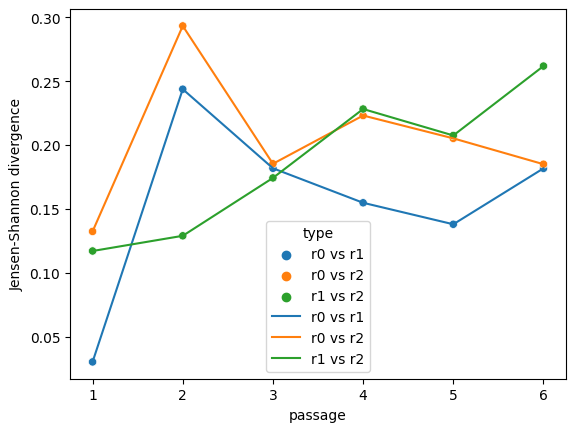

In [29]:
x = np.array(list(np.arange(num_passages) + 1) * 3).flatten()
y = div_js.flatten(order='F')
col_ = np.tile(np.array(comp_type).reshape((1, num_bioRep)), np.array([num_passages, 1]))
df_plt = pd.DataFrame(data={"x" : x, "y" : y, "type" : col_.flatten(order='F')})
plt_ = sns.scatterplot(df_plt, x="x", y="y", hue="type")
plt_ = sns.lineplot(df_plt, x="x", y="y", hue="type")
plt_.set_xlabel("passage")
plt_.set_ylabel("Jensen-Shannon divergence")

In [39]:
corr_rep = np.zeros((num_passages, 3))
corrpval_rep = np.zeros((num_passages, 3))
slope_rep = np.zeros((num_passages, 3))
for pass_ in range(num_passages):
    count_ = 0
    if pass_ == 0:
        comp_type = []
    for rep_1 in range(2):
        id_1 = [pass_ + rep_1 * num_passages]
        for rep_2 in range(rep_1 + 1, 3):
            if pass_ == 0:
                comp_type.append(f'r{rep_1} vs r{rep_2}')
            id_2 = [pass_ + rep_2 * num_passages]
            x = df_speciesAbun_mdl.iloc[:, id_1].copy()
            y = df_speciesAbun_mdl.iloc[:, id_2].copy()
            tmp = scipy.stats.pearsonr(np.log10(x.values.flatten()), np.log10(y.values.flatten()))
            corr_rep[pass_, count_] = tmp[0]
            corrpval_rep[pass_, count_] = tmp[1]
            
            x = np.array(x.values)
            reg = LinearRegression(fit_intercept=False).fit(x.reshape((len(x), 1)), y)
            slope_rep[pass_, count_] = reg.coef_[0][0]
            
            count_ += 1
        
            

Text(0, 0.5, 'correlation')

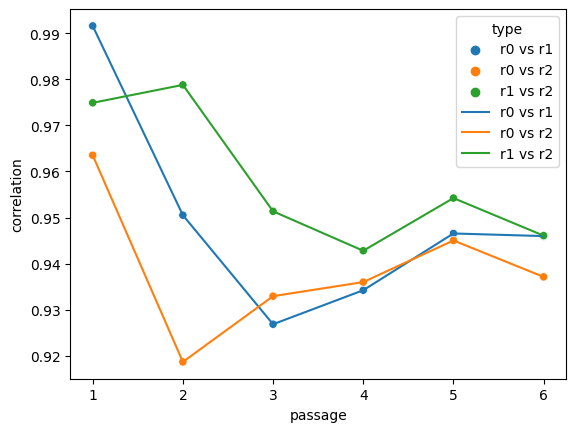

In [31]:
x = np.array(list(np.arange(num_passages) + 1) * 3).flatten()
y = corr_rep.flatten(order='F')
col_ = np.tile(np.array(comp_type).reshape((1, num_bioRep)), np.array([num_passages, 1]))
df_plt = pd.DataFrame(data={"x" : x, "y" : y, "type" : col_.flatten(order='F')})
plt_ = sns.scatterplot(df_plt, x="x", y="y", hue="type")
plt_ = sns.lineplot(df_plt, x="x", y="y", hue="type")
plt_.set_xlabel("passage")
plt_.set_ylabel("correlation")

Text(0, 0.5, 'slope (y vs x)')

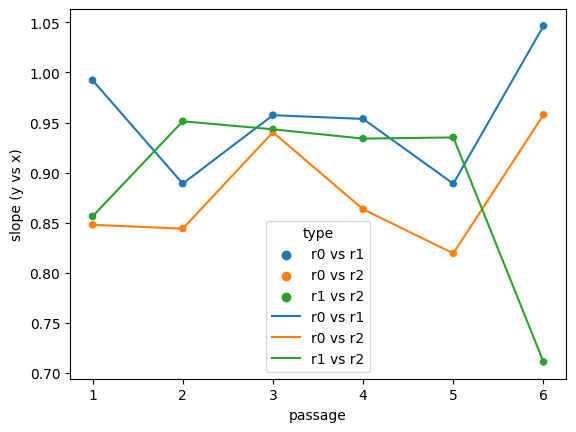

In [41]:
x = np.array(list(np.arange(num_passages) + 1) * 3).flatten()
y = slope_rep.flatten(order='F')
col_ = np.tile(np.array(comp_type).reshape((1, num_bioRep)), np.array([num_passages, 1]))
df_plt = pd.DataFrame(data={"x" : x, "y" : y, "type" : col_.flatten(order='F')})
plt_ = sns.scatterplot(df_plt, x="x", y="y", hue="type")
plt_ = sns.lineplot(df_plt, x="x", y="y", hue="type")
plt_.set_xlabel("passage")
plt_.set_ylabel("slope (y vs x)")

### Fit dynamic Ri for passage transitions 1->2 and 2->3 with all metabolites and no clusters

In [45]:
date_ = '20230530'
n_repeats = 10
rand_seed = 7363
np.random.seed(rand_seed)
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_compare_greedy_rm_metabs' + \
                                        f'_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2_2to3'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_for_paper_Ri_fit_dynamic' + \
                                         f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'.pickle'))
Ri_dynamic_obj = {}
# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_cluster, \
#                                 df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                 df_speciesAbun_ratio_mdl, p_vec_new, \
#                                 file_save, num_passages=5, pass_rm=[1, 2, 3, 4])
pass_keep = np.arange(num_passages - 1)
id_keep = list(pass_keep) + list(pass_keep + num_passages - 1) + list(pass_keep + 2 * (num_passages - 1))
pass_rm = [2, 3, 4]
Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab, \
                                df_speciesAbun_prev_mdl.iloc[:, id_keep], \
                                df_speciesAbun_next_mdl.iloc[:, id_keep], \
                                df_speciesAbun_ratio_mdl.iloc[:, id_keep], p_vec_new, \
                                file_save, num_passages=5, pass_rm=pass_rm, num_brep=3)
# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab, \
#                                       df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                       df_speciesAbun_ratio_mdl, p_vec_new, \
#                                       file_save, num_passages=5, pass_rm=[3, 4])
# Ri_dynamic_obj = fit_ss_Ri(df_speciesMetab, df_speciesAbun_mdl, \
#                                       df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                       df_speciesAbun_ratio_mdl, \
#                                       file_save, num_passages=6, pass_rm=[0, 1, 2])
# Ri_ss_obj =  fit_ss_Ri(df_speciesMetab_cluster, df_speciesAbun_mdl, \
#                        df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                        df_speciesAbun_ratio_mdl, \
#                        file_save=file_save, num_passages=6, pass_rm=pass_rm)

with open(file_save, "wb") as file_:
     pickle.dump(Ri_dynamic_obj, file_) 

count = 0, p_tmp = 0.001


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 1, p_tmp = 0.01


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 2, p_tmp = 0.05


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 3, p_tmp = 0.06


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 4, p_tmp = 0.07


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 5, p_tmp = 0.08


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 6, p_tmp = 0.09


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 7, p_tmp = 0.1


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 8, p_tmp = 0.125


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 9, p_tmp = 0.15


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 10, p_tmp = 0.175


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 11, p_tmp = 0.2


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 12, p_tmp = 0.3


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 13, p_tmp = 0.4


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 14, p_tmp = 0.5


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/Tar

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/Tar

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/Tar

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/Tar

count = 15, p_tmp = 0.55


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 16, p_tmp = 0.6


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 17, p_tmp = 0.65


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 18, p_tmp = 0.7


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

In [ ]:
date_ = '20230523'
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
pass_rm = [0, 1, 2]
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_compare_greedy_rm_metabs' + \
                                        f'_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2_2to3'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_for_paper_Ri_fit_dynamic' + \
                                         f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'.pickle'))

with open(file_save, "rb") as file_:
    Ri_dynamic_obj = pickle.load(file_) 
    
Ri_noMicrocosm_dynamicAll_fit_all = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_all']
Ri_noMicrocosm_dynamicAll_fit_avg = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_avg']
Ri_noMicrocosm_dynamicAll_fit_joint = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_joint']

In [46]:
Ri_noMicrocosm_dynamicAll_fit_all = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_all']
Ri_noMicrocosm_dynamicAll_fit_avg = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_avg']
Ri_noMicrocosm_dynamicAll_fit_joint = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_joint']

count = 0, p = 0.001


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 1, p = 0.01


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 2, p = 0.05


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 3, p = 0.06


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 4, p = 0.07


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 5, p = 0.08


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 6, p = 0.09


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 7, p = 0.1


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 8, p = 0.125


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 9, p = 0.15


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 10, p = 0.175


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 11, p = 0.2


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 12, p = 0.3


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 13, p = 0.4


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 14, p = 0.5


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1182: RuntimeWarning: divide by zero encountered in log10
  y = np.log10(rhs_)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)
/home/atheistpoet/anaconda3/envs/scvi_cell_cycle_env/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4446: RuntimeWarning: invalid value encountered in subtract
  ym = y.astype(dtype) - ymean


ValueError: array must not contain infs or NaNs

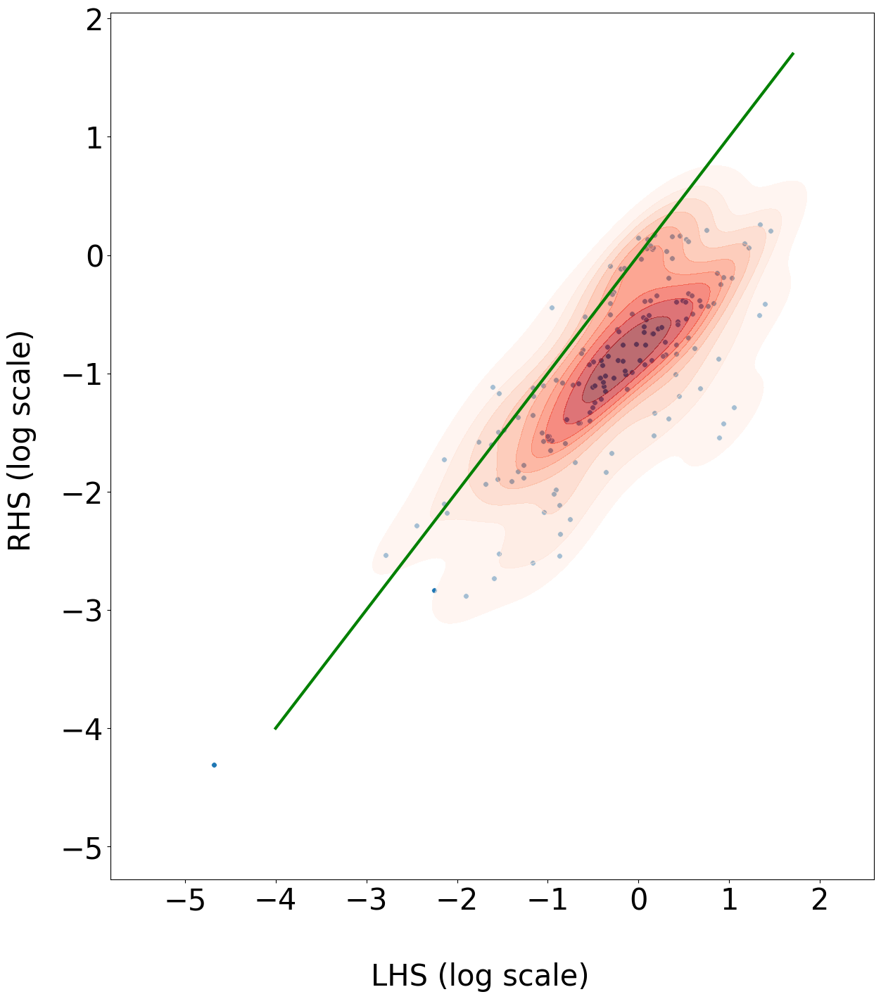

In [48]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_compare_greedy_rm_metabs' + \
                                        f'_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2_2to3', \
                                        f'RHS_vs_LHS', 'dynamic'))

if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

for count_p, p_tmp in enumerate(p_vec_new):
    print(f'count = {count_p}, p = {p_tmp}')
    save_file = os.path.abspath(os.path.join(save_dir, 
                                             f'{date_}_for_paper_RHS_vs_LHS_dynamic_Ri_fit_dynamic_p{p_tmp}.png'))

    match_lhs_rhs_fit(Ri_noMicrocosm_dynamicAll_fit_joint[count_p], \
                      df_speciesMetab, df_speciesAbun_prev_mdl, \
                      df_speciesAbun_next_mdl, df_speciesAbun_ratio_mdl, save_file, pass_rm=[0, 2, 3, 4], \
                      num_passages=5, fit_type="dynamic", p_tmp=p_tmp)
#     match_lhs_rhs_fit(Ri_noMicrocosm_dynamicAll_fit_joint[count_p], \
#                       df_speciesMetab_cluster, df_speciesAbun_mdl, save_file, pass_rm=[0, 1, 2], \
#                       num_passages=6)

count = 0, p = 0.001


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 1, p = 0.01


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 2, p = 0.05


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 3, p = 0.06


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 4, p = 0.07


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 5, p = 0.08


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 6, p = 0.09


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 7, p = 0.1


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 8, p = 0.125


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 9, p = 0.15


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 10, p = 0.175


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 11, p = 0.2


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 12, p = 0.3


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 13, p = 0.4


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)


count = 14, p = 0.5


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1182: RuntimeWarning: divide by zero encountered in log10
  y = np.log10(rhs_)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1195: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=30)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1196: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=30)
/home/atheistpoet/anaconda3/envs/scvi_cell_cycle_env/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4446: RuntimeWarning: invalid value encountered in subtract
  ym = y.astype(dtype) - ymean


ValueError: array must not contain infs or NaNs

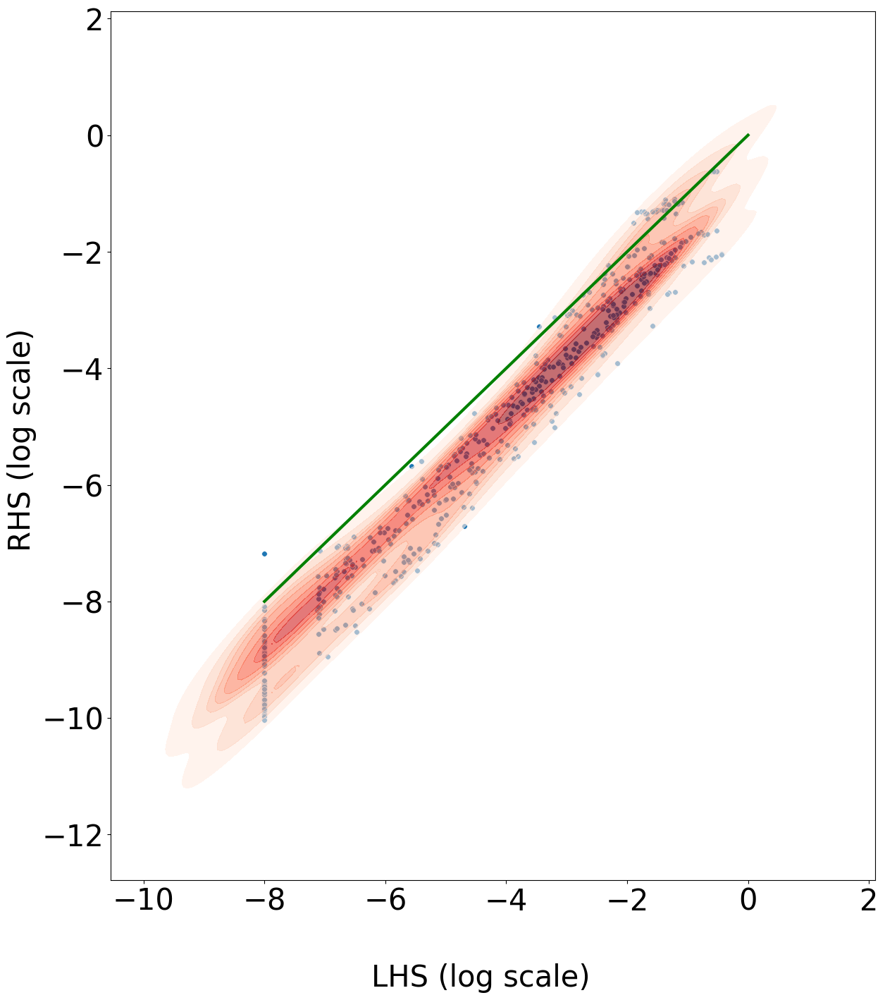

In [49]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_compare_greedy_rm_metabs' + \
                                        f'_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2_2to3', \
                                        f'RHS_vs_LHS', 'steady_state'))

if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

for count_p, p_tmp in enumerate(p_vec_new):
    print(f'count = {count_p}, p = {p_tmp}')
    save_file = os.path.abspath(os.path.join(save_dir, 
                                             f'{date_}_for_paper_RHS_vs_LHS_steady_state' + \
                                             f'_Ri_fit_dynamic_p{p_tmp}.png'))

    match_lhs_rhs_fit(Ri_noMicrocosm_dynamicAll_fit_joint[count_p], \
                      df_speciesMetab, df_speciesAbun_mdl, \
                      df_speciesAbun_mdl, df_speciesAbun_mdl, save_file, pass_rm=[0, 1, 2], \
                      num_passages=6, fit_type="steady_state", p_tmp=p_tmp)
#     match_lhs_rhs_fit(Ri_noMicrocosm_dynamicAll_fit_joint[count_p], \
#                       df_speciesMetab_cluster, df_speciesAbun_mdl, save_file, pass_rm=[0, 1, 2], \
#                       num_passages=6)

In [50]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_compare_greedy_rm_metabs' + \
                                        f'_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                                    f'_pass_1to2_2to3')) 
# df_speciesMetab_cluster_tmp = df_speciesMetab_cluster.copy()
# df_speciesMetab_cluster_tmp[df_speciesMetab_cluster == 0] = 1e-6
blindly_pred_abun_growth_without_inoc(p_vec_new, df_speciesMetab, \
                                      df_speciesAbun_inoc, df_speciesAbun_mdl, \
                                      df_speciesAbun_prev_mdl, \
                                      df_speciesAbun_ratio_mdl, \
                                      Ri_noMicrocosm_dynamicAll_fit_joint, save_dir, save_dir, \
                                      save_dir, num_passages=6, num_iter=100, \
                                      thresh_zero=1e-8, Ri_ss=False)

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1977: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:2106: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:2107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1977: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:2106: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:2107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1977: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:2106: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:2107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1977: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:2106: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:2107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1977: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:2106: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:2107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1977: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:2106: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:2107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1977: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:2106: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:2107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1977: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:2106: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:2107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1977: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:2106: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:2107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1977: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:2106: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:2107: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=20)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:1976: UserWarning: FixedFormatter should only be used together with FixedLocator


In [59]:
def Ri_fit_func(df_speciesMetab, id_rm_list, df_speciesAbun_inoc, \
                df_speciesAbun_mdl, df_speciesAbun_prev_mdl, \
                df_speciesAbun_next_mdl, \
                df_speciesAbun_ratio_mdl, p_tmp, num_passages, num_bioRep=num_bioRep):
    num_metabs_clust = df_speciesMetab.shape[1]
    RMSE_mat = np.zeros((num_passages - 1, 2))
    df_speciesMetab_tmp = df_speciesMetab.copy()
    id_keep = list(set(range(num_metabs_clust)) - set(id_rm_list))
    df_speciesMetab_tmp = df_speciesMetab_tmp.iloc[:, id_keep]
    Ri_obj = fit_dynamic_Ri(df_speciesMetab_tmp, \
                            df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
                            df_speciesAbun_ratio_mdl, [p_tmp], \
                            "dummy", num_passages=5, pass_rm=[2, 3, 4], \
                            save_data=False, verbose=False, method="linear", alpha=0, \
                            use_loo=False)

    Ri_avg = Ri_obj['Ri_noMicrocosm_dynamicAll_fit_joint'][0].copy()
    Ri_tmp = np.zeros((num_metabs_clust))
    Ri_tmp[id_keep] = Ri_avg.copy()
#         nnz_metabs[count_a] = len(np.where((Ri_avg > 0) & (Ri_tmp == 0))[0])


    Ri_fit = {0: Ri_avg}
    RMSE_sens_complete = np.zeros((num_passages - 1, 2))
    sens_obj_all, RMSE_obj_all = \
        blindly_pred_abun_growth_without_inoc([p_tmp], df_speciesMetab_tmp, \
                                              df_speciesAbun_inoc, df_speciesAbun_mdl, \
                                              df_speciesAbun_prev_mdl, \
                                              df_speciesAbun_ratio_mdl, \
                                              Ri_fit, "dummy", "dummy", \
                                              "dummy", num_passages=6, num_iter=100, \
                                              thresh_zero=1e-8, Ri_ss=False, plot_=False, \
                                              save_data_obj=False, \
                                              return_sensitivity_ana=True)
    for pass_ in range(num_passages - 1):
        RMSE_mat[pass_, 0] = RMSE_obj_all[pass_]["abundance"]
        RMSE_mat[pass_, 1] = RMSE_obj_all[pass_]["growth_ratio"]
    return {'RMSE' : RMSE_mat}

In [111]:
def pareto_optimal_solution(objective1, objective2):
    # Function to check dominance
    def is_dominated(obj1, obj2):
        return np.all(obj1 >= obj2) and np.any(obj1 > obj2)
    
    objectives = np.column_stack((objective1, objective2))

    # Find the Pareto optimal parameter
    pareto_optimal_indices = []
    for i, obj in enumerate(objectives):
        if not any(is_dominated(obj, objectives[j]) for j in range(len(objectives))):
            pareto_optimal_indices.append(i)
    return pareto_optimal_indices

In [107]:
id_pareto = pareto_optimal_solution(-RMSE_mat[:, 0, 0], -RMSE_mat[:, 1, 0])
objectives = np.column_stack((RMSE_mat[:, 0, 0], RMSE_mat[:, 1, 0]))
objectives[id_pareto, :]
# np.random.choice([0], 1, replace=False)[0]
# RMSE_mat

array([[-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.],
       [-1., -1.]])

In [112]:
num_metabs_rm = 200
metab_rm_list = []
RMSE_traj = -1 * np.ones((num_metabs_rm, num_passages - 1, 2))

date_ = '20230530'
n_repeats = 100
perc_metabs_keep = 0.9
rand_seed = 7363
np.random.seed(rand_seed)
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
count_p = 7
num_metabs_clust = df_speciesMetab.shape[1]
for l_ in range(num_metabs_rm):
    print(f'loop = {l_}')
    if l_ == 0:
        id_nnz_metabs = np.where(Ri_noMicrocosm_dynamicAll_fit_joint[count_p] > 0)[0]
    else:
        id_nnz_metabs = np.where(Ri_running > 0)[0]
    
    # Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_cluster, \
    #                                 df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
    #                                 df_speciesAbun_ratio_mdl, p_vec_new, \
    #                                 file_save, num_passages=5, pass_rm=[1, 2, 3, 4])
    RMSE_mat = -1 * np.ones((len(id_nnz_metabs), num_passages - 1, 2))
    nnz_metabs = np.zeros((len(id_nnz_metabs)))

    id_rm_vec_list = []
    for count_a, id_rm in enumerate(id_nnz_metabs):
        id_rm_list = metab_rm_list + [id_rm]
        id_rm_vec_list.append(id_rm_list)
    
    out = Parallel(n_jobs=10, verbose=100, pre_dispatch='1.5*n_jobs')(
        delayed(Ri_fit_func)(df_speciesMetab, id_rm_vec_list[sample_], \
                             df_speciesAbun_inoc, df_speciesAbun_mdl, \
                             df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
                             df_speciesAbun_ratio_mdl, p_vec_new[count_p], \
                             num_passages, num_bioRep=num_bioRep) for sample_ in range(len(id_nnz_metabs)))
    for count_a, d in enumerate(out):
        RMSE_mat[count_a, :, :] = d['RMSE'].copy()
    
#     for count_a, id_rm in enumerate(id_nnz_metabs):
# #         print(f'loop = {count_a}')
#         df_speciesMetab_tmp = df_speciesMetab.copy()
#         id_rm_list = metab_rm_list + [id_rm]
#         id_keep = list(set(range(num_metabs_clust)) - set(id_rm_list))
#         df_speciesMetab_tmp = df_speciesMetab_tmp.iloc[:, id_keep]
#         Ri_obj = fit_dynamic_Ri(df_speciesMetab_tmp, \
#                                 df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                 df_speciesAbun_ratio_mdl, [p_vec_new[count_p]], \
#                                 file_save, num_passages=5, pass_rm=[1, 2, 3, 4], \
#                                 save_data=False, verbose=False, method="linear", alpha=0, \
#                                 use_loo=False)
        
#         Ri_avg = Ri_obj['Ri_noMicrocosm_dynamicAll_fit_joint'][0].copy()
#         Ri_tmp = np.zeros((num_metabs_clust))
#         Ri_tmp[id_keep] = Ri_avg.copy()
# #         nnz_metabs[count_a] = len(np.where((Ri_avg > 0) & (Ri_tmp == 0))[0])


#         Ri_fit = {0: Ri_avg}
#         RMSE_sens_complete = np.zeros((num_passages - 1, 2))
#         sens_obj_all, RMSE_obj_all = \
#             blindly_pred_abun_growth_without_inoc([p_vec_new[count_p]], df_speciesMetab_tmp, \
#                                                   df_speciesAbun_inoc, df_speciesAbun_mdl, \
#                                                   df_speciesAbun_prev_mdl, \
#                                                   df_speciesAbun_ratio_mdl, \
#                                                   Ri_fit, "dummy", "dummy", \
#                                                   "dummy", num_passages=6, num_iter=100, \
#                                                   thresh_zero=1e-8, Ri_ss=False, plot_=False, \
#                                                   save_data_obj=False, \
#                                                   return_sensitivity_ana=True)
#         for pass_ in range(num_passages - 1):
#             RMSE_mat[count_a, pass_, 0] = RMSE_obj_all[pass_]["abundance"]
#             RMSE_mat[count_a, pass_, 1] = RMSE_obj_all[pass_]["growth_ratio"]
            
#     id_ = np.where(RMSE_mat[:, 0, 0] == np.min(RMSE_mat[:, 0, 0]))[0][0]
    if l_ > 0:
        obj_1 = np.hstack([RMSE_traj[l_ - 1, 0, 0], RMSE_mat[:, 0, 0]])
        obj_2 = np.hstack([RMSE_traj[l_ - 1, 1, 0], RMSE_mat[:, 1, 0]])
    else:
        obj_1 = np.hstack([np.inf, RMSE_mat[:, 0, 0]])
        obj_2 = np.hstack([np.inf, RMSE_mat[:, 1, 0]])
    id_ = pareto_optimal_solution(obj_1, obj_2)
    if (len(id_) > 1) or (len(id_) == 1 and id_[0] != 0):
        id_ = np.array(list(set(list(id_)) - set([0])))
        id_ = np.random.choice(id_, 1, replace=False)[0] - 1
        df_speciesMetab_tmp = df_speciesMetab.copy()
        id_rm_list = metab_rm_list + [id_nnz_metabs[id_]]
        id_keep = list(set(range(num_metabs_clust)) - set(id_rm_list))
        df_speciesMetab_tmp = df_speciesMetab_tmp.iloc[:, id_keep]
        Ri_obj = fit_dynamic_Ri(df_speciesMetab_tmp, \
                                df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
                                df_speciesAbun_ratio_mdl, [p_vec_new[count_p]], \
                                file_save, num_passages=5, pass_rm=[1, 2, 3, 4], \
                                save_data=False, verbose=False, method="linear", alpha=0, \
                                use_loo=False)

        Ri_avg = Ri_obj['Ri_noMicrocosm_dynamicAll_fit_joint'][0].copy()
        Ri_running = np.zeros((num_metabs_clust))
        Ri_running[id_keep] = Ri_avg.copy()
        metab_rm_list += [id_nnz_metabs[id_]]
        RMSE_traj[l_, :, 0] = RMSE_mat[id_, :, 0].copy()
        RMSE_traj[l_, :, 1] = RMSE_mat[id_, :, 1].copy()
    else:
        metab_rm_list += [-1]
        if (len(id_) == 1 and id_[0] == 0 and l_ > 0):
            RMSE_traj[l_, :, 0] = RMSE_traj[l_ - 1, :, 0].copy()
            RMSE_traj[l_, :, 1] = RMSE_traj[l_ - 1, :, 1].copy()
    print(f'loop = {l_}, RMSE pass 1 = {RMSE_mat[id_, 0, 0]}')
    print(f'loop = {l_}, RMSE pass 2 = {RMSE_mat[id_, 1, 0]}')
    
save_obj = {"metab_rm_list" : metab_rm_list, \
            "RMSE_traj" : RMSE_traj}


save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_compare_greedy_rm_metabs' + \
                                        f'_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2_2to3'))
save_file = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_greedily_remove_metabs_nocluster' + \
                                         f'.pickle'))
with open(save_file, "wb") as file_:
     pickle.dump(save_obj, file_) 

loop = 0
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    5.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    5.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    6.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    7.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    7.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    8.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    9.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    9.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:   10.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:   10.5s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:   10.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:   10.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:   11.6s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:   11.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:   12.0s
[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:   12.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   12.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   13.2s
[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   13.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   13.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   14.3s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   14.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   15.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   15.7s
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   15.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   16.1s
[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   16.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   16.4s
[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   16.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   17.2s
[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   17.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   18.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   19.2s
[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   19.2s
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   19.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  41 tasks      | elapsed:   19.4s
[Parallel(n_jobs=10)]: Done  42 tasks      | elapsed:   19.9s
[Parallel(n_jobs=10)]: Done  43 tasks      | elapsed:   19.9s
[Parallel(n_jobs=10)]: Done  44 tasks      | elapsed:   20.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  45 tasks      | elapsed:   20.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  46 tasks      | elapsed:   21.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  47 tasks      | elapsed:   22.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  48 tasks      | elapsed:   22.5s
[Parallel(n_jobs=10)]: Done  49 out of  62 | elapsed:   22.6s remaining:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  50 out of  62 | elapsed:   22.8s remaining:    5.5s
[Parallel(n_jobs=10)]: Done  51 out of  62 | elapsed:   22.8s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  52 out of  62 | elapsed:   23.4s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  53 out of  62 | elapsed:   23.8s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  54 out of  62 | elapsed:   23.9s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  55 out of  62 | elapsed:   24.0s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  56 out of  62 | elapsed:   24.8s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  57 out of  62 | elapsed:   25.4s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  58 out of  62 | elapsed:   25.5s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  59 out of  62 | elapsed:   25.6s remaining:    1.3s
[Parallel(n_jobs=10)]: Done  60 out of  62 | elapsed:   25.7s remaining:    0.9s
[Parallel(n_jobs=10)]: Done  62 out of  62 | elapsed:   26.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  62 out of  62 | elapsed:   26.2s finished
loop = 0, RMSE pass 1 = 0.8769408472729093
loop = 0, RMSE pass 2 = 0.95744842038143
loop = 1
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    4.5s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    4.5s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.5s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.5s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.5s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.5s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.5s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.6s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.7s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.5s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.8s
[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   11.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.3s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.8s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.8s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.8s
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.9s
[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   13.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   13.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   13.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   14.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   14.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   15.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   16.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   16.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   16.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   17.2s
[Parallel(n_jobs=10)]: Done  41 tasks      | elapsed:   17.3s
[Parallel(n_jobs=10)]: Done  42 tasks      | elapsed:   17.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  43 out of  56 | elapsed:   17.4s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  44 out of  56 | elapsed:   17.7s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  45 out of  56 | elapsed:   17.9s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  46 out of  56 | elapsed:   19.5s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  47 out of  56 | elapsed:   19.5s remaining:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  48 out of  56 | elapsed:   19.7s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  49 out of  56 | elapsed:   20.4s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  50 out of  56 | elapsed:   20.5s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  51 out of  56 | elapsed:   20.7s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  52 out of  56 | elapsed:   20.7s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  53 out of  56 | elapsed:   20.8s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  54 out of  56 | elapsed:   21.1s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  56 out of  56 | elapsed:   22.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  56 out of  56 | elapsed:   22.0s finished
loop = 1, RMSE pass 1 = 0.8828846941293709
loop = 1, RMSE pass 2 = 0.9392225832110939
loop = 2
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.7s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.8s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.9s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.8s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   10.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   12.2s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.2s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.6s
[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.6s
[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   12.6s
[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   12.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   13.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   14.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   14.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   15.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   16.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   16.3s
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   16.5s
[Parallel(n_jobs=10)]: Done  41 tasks      | elapsed:   16.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  42 out of  55 | elapsed:   16.6s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  43 out of  55 | elapsed:   16.6s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  44 out of  55 | elapsed:   17.0s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  45 out of  55 | elapsed:   17.2s remaining:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  46 out of  55 | elapsed:   18.2s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  47 out of  55 | elapsed:   18.8s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  48 out of  55 | elapsed:   19.7s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  49 out of  55 | elapsed:   19.8s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  50 out of  55 | elapsed:   19.8s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  51 out of  55 | elapsed:   19.9s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  52 out of  55 | elapsed:   19.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  53 out of  55 | elapsed:   20.0s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  55 out of  55 | elapsed:   20.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  55 out of  55 | elapsed:   20.2s finished
loop = 2, RMSE pass 1 = 0.8751129381083506
loop = 2, RMSE pass 2 = 0.9301587766018501
loop = 3
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.4s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.5s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.0s
[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   10.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   11.9s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.1s
[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   13.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   13.6s
[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   13.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   13.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   15.3s
[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   15.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   15.8s
[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   15.9s
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   16.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  41 out of  54 | elapsed:   16.3s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  42 out of  54 | elapsed:   16.9s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  43 out of  54 | elapsed:   17.0s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  44 out of  54 | elapsed:   17.5s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  45 out of  54 | elapsed:   18.0s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  46 out of  54 | elapsed:   18.3s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  47 out of  54 | elapsed:   19.3s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  48 out of  54 | elapsed:   19.5s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  49 out of  54 | elapsed:   19.8s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  50 out of  54 | elapsed:   19.9s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  51 out of  54 | elapsed:   20.1s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  52 out of  54 | elapsed:   20.1s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  54 out of  54 | elapsed:   20.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  54 out of  54 | elapsed:   20.8s finished
loop = 3, RMSE pass 1 = 0.8582410843270445
loop = 3, RMSE pass 2 = 0.9180664296881375
loop = 4
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.1s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.3s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.8s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.8s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.9s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   12.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.2s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.6s
[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   12.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   14.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   15.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   15.6s
[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   15.6s
[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   15.8s
[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   15.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   15.9s
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   16.0s
[Parallel(n_jobs=10)]: Done  41 tasks      | elapsed:   16.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  42 tasks      | elapsed:   16.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  43 out of  56 | elapsed:   18.2s remaining:    5.5s
[Parallel(n_jobs=10)]: Done  44 out of  56 | elapsed:   18.4s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  45 out of  56 | elapsed:   18.7s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  46 out of  56 | elapsed:   19.5s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  47 out of  56 | elapsed:   19.7s remaining:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  48 out of  56 | elapsed:   20.2s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  49 out of  56 | elapsed:   20.2s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  50 out of  56 | elapsed:   20.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  51 out of  56 | elapsed:   20.4s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  52 out of  56 | elapsed:   20.5s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  53 out of  56 | elapsed:   21.3s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  54 out of  56 | elapsed:   21.5s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  56 out of  56 | elapsed:   22.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  56 out of  56 | elapsed:   22.4s finished
loop = 4, RMSE pass 1 = 0.8591921690256491
loop = 4, RMSE pass 2 = 0.9133324075502677
loop = 5
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.2s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.4s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    8.7s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   10.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   10.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.7s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   11.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.5s
[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.6s
[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   12.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   12.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   13.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   13.9s
[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   14.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   15.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   15.8s
[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   15.8s
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   15.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  41 tasks      | elapsed:   16.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  42 tasks      | elapsed:   16.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  43 tasks      | elapsed:   16.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  44 tasks      | elapsed:   16.9s
[Parallel(n_jobs=10)]: Done  45 out of  58 | elapsed:   17.0s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  46 out of  58 | elapsed:   17.6s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  47 out of  58 | elapsed:   18.8s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  48 out of  58 | elapsed:   19.4s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  49 out of  58 | elapsed:   19.4s remaining:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  50 out of  58 | elapsed:   19.8s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  51 out of  58 | elapsed:   20.0s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  52 out of  58 | elapsed:   20.0s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  53 out of  58 | elapsed:   20.4s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  54 out of  58 | elapsed:   20.4s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  55 out of  58 | elapsed:   20.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  56 out of  58 | elapsed:   20.9s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  58 out of  58 | elapsed:   21.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  58 out of  58 | elapsed:   21.9s finished
loop = 5, RMSE pass 1 = 0.875654903969469
loop = 5, RMSE pass 2 = 0.9030420768445973
loop = 6
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.9s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.9s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    8.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:    9.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.1s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.6s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   11.7s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   11.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   11.9s
[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.0s
[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   12.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   13.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   13.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   14.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   15.1s
[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   15.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   15.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   15.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   16.2s
[Parallel(n_jobs=10)]: Done  41 tasks      | elapsed:   16.3s
[Parallel(n_jobs=10)]: Done  42 tasks      | elapsed:   16.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  43 tasks      | elapsed:   16.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  44 tasks      | elapsed:   18.2s
[Parallel(n_jobs=10)]: Done  45 tasks      | elapsed:   18.3s
[Parallel(n_jobs=10)]: Done  46 tasks      | elapsed:   18.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  47 tasks      | elapsed:   18.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  48 tasks      | elapsed:   19.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  49 out of  62 | elapsed:   19.9s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  50 out of  62 | elapsed:   20.3s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  51 out of  62 | elapsed:   20.6s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  52 out of  62 | elapsed:   20.7s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  53 out of  62 | elapsed:   20.8s remaining:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  54 out of  62 | elapsed:   21.4s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  55 out of  62 | elapsed:   21.4s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  56 out of  62 | elapsed:   21.5s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  57 out of  62 | elapsed:   21.8s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  58 out of  62 | elapsed:   22.7s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  59 out of  62 | elapsed:   23.6s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  60 out of  62 | elapsed:   23.7s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  62 out of  62 | elapsed:   23.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  62 out of  62 | elapsed:   23.8s finished
loop = 6, RMSE pass 1 = 0.874532245624146
loop = 6, RMSE pass 2 = 0.9006899489999535
loop = 7
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.4s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.0s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.1s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.1s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.3s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   10.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.2s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.2s
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   13.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   14.1s
[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   14.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   14.7s
[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   14.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   15.5s
[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   15.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   16.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   16.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  41 tasks      | elapsed:   16.9s
[Parallel(n_jobs=10)]: Done  42 tasks      | elapsed:   17.0s
[Parallel(n_jobs=10)]: Done  43 tasks      | elapsed:   17.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  44 tasks      | elapsed:   18.0s
[Parallel(n_jobs=10)]: Done  45 tasks      | elapsed:   18.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  46 tasks      | elapsed:   18.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  47 tasks      | elapsed:   19.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  48 tasks      | elapsed:   19.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  49 out of  62 | elapsed:   20.3s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  50 out of  62 | elapsed:   20.3s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  51 out of  62 | elapsed:   20.6s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  52 out of  62 | elapsed:   21.0s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  53 out of  62 | elapsed:   21.2s remaining:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  54 out of  62 | elapsed:   21.8s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  55 out of  62 | elapsed:   21.9s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  56 out of  62 | elapsed:   22.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  57 out of  62 | elapsed:   22.8s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  58 out of  62 | elapsed:   23.3s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  59 out of  62 | elapsed:   23.4s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  60 out of  62 | elapsed:   23.7s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  62 out of  62 | elapsed:   24.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  62 out of  62 | elapsed:   24.0s finished
loop = 7, RMSE pass 1 = 0.8666367005632166
loop = 7, RMSE pass 2 = 0.9227686724872122
loop = 8
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.4s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.5s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.9s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    9.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:   10.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   10.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.9s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   12.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   12.8s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   12.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   13.0s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   13.1s
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   13.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   13.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   14.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   14.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   15.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   16.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   16.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   17.0s
[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   17.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   17.4s
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   17.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  41 tasks      | elapsed:   17.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  42 tasks      | elapsed:   18.5s
[Parallel(n_jobs=10)]: Done  43 tasks      | elapsed:   18.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  44 tasks      | elapsed:   20.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  45 tasks      | elapsed:   20.8s
[Parallel(n_jobs=10)]: Done  46 tasks      | elapsed:   20.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  47 tasks      | elapsed:   21.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  48 out of  61 | elapsed:   21.9s remaining:    5.9s
[Parallel(n_jobs=10)]: Done  49 out of  61 | elapsed:   21.9s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  50 out of  61 | elapsed:   22.0s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  51 out of  61 | elapsed:   22.3s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  52 out of  61 | elapsed:   23.0s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  53 out of  61 | elapsed:   23.1s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  54 out of  61 | elapsed:   24.2s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  55 out of  61 | elapsed:   24.8s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  56 out of  61 | elapsed:   24.9s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  57 out of  61 | elapsed:   25.0s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  58 out of  61 | elapsed:   25.4s remaining:    1.3s
[Parallel(n_jobs=10)]: Done  59 out of  61 | elapsed:   25.4s remaining:    0.9s
[Parallel(n_jobs=10)]: Done  61 out of  61 | elapsed:   25.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  61 out of  61 | elapsed:   25.8s finished
loop = 8, RMSE pass 1 = 0.8564309763420657
loop = 8, RMSE pass 2 = 0.9499467489257156
loop = 9
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.6s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.7s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.6s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.6s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   12.3s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   12.4s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.6s
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.7s
[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   12.9s
[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   13.0s
[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   14.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   15.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   15.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   15.8s
[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   15.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   16.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   16.8s
[Parallel(n_jobs=10)]: Done  41 tasks      | elapsed:   16.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  42 tasks      | elapsed:   17.3s
[Parallel(n_jobs=10)]: Done  43 tasks      | elapsed:   17.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  44 tasks      | elapsed:   18.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  45 tasks      | elapsed:   19.2s
[Parallel(n_jobs=10)]: Done  46 out of  59 | elapsed:   19.3s remaining:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  47 out of  59 | elapsed:   19.7s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  48 out of  59 | elapsed:   20.2s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  49 out of  59 | elapsed:   20.5s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  50 out of  59 | elapsed:   20.9s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  51 out of  59 | elapsed:   21.1s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  52 out of  59 | elapsed:   21.4s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  53 out of  59 | elapsed:   21.5s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  54 out of  59 | elapsed:   22.2s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  55 out of  59 | elapsed:   22.9s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  56 out of  59 | elapsed:   23.0s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  57 out of  59 | elapsed:   23.5s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  59 out of  59 | elapsed:   23.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  59 out of  59 | elapsed:   23.7s finished
loop = 9, RMSE pass 1 = 0.856339236399187
loop = 9, RMSE pass 2 = 0.9460896289075196
loop = 10
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.4s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.4s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.9s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    8.3s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.5s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.7s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.7s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.8s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   10.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   12.0s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   12.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   12.4s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.6s
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.7s
[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   13.1s
[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   13.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   14.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   14.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   15.6s
[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   15.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   15.9s
[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   16.0s
[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   16.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   16.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  41 tasks      | elapsed:   16.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  42 tasks      | elapsed:   17.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  43 tasks      | elapsed:   17.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  44 tasks      | elapsed:   17.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  45 tasks      | elapsed:   19.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  46 tasks      | elapsed:   19.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  47 out of  60 | elapsed:   19.7s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  48 out of  60 | elapsed:   19.7s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  49 out of  60 | elapsed:   19.9s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  50 out of  60 | elapsed:   20.0s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  51 out of  60 | elapsed:   20.0s remaining:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  52 out of  60 | elapsed:   20.3s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  53 out of  60 | elapsed:   20.5s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  54 out of  60 | elapsed:   20.8s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  55 out of  60 | elapsed:   22.2s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  56 out of  60 | elapsed:   22.4s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  57 out of  60 | elapsed:   22.4s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  58 out of  60 | elapsed:   22.5s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  60 out of  60 | elapsed:   22.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  60 out of  60 | elapsed:   22.6s finished
loop = 10, RMSE pass 1 = 0.8562301174896032
loop = 10, RMSE pass 2 = 0.9453880971533735
loop = 11
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.4s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.3s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.3s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.4s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.3s
[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.5s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.8s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   11.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.6s
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.7s
[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   13.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   13.4s
[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   13.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   14.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   15.5s
[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   15.5s
[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   15.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   16.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   16.2s
[Parallel(n_jobs=10)]: Done  41 tasks      | elapsed:   16.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  42 tasks      | elapsed:   16.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  43 tasks      | elapsed:   17.1s
[Parallel(n_jobs=10)]: Done  44 tasks      | elapsed:   17.2s
[Parallel(n_jobs=10)]: Done  45 tasks      | elapsed:   17.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  46 out of  59 | elapsed:   18.7s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  47 out of  59 | elapsed:   19.1s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  48 out of  59 | elapsed:   19.5s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  49 out of  59 | elapsed:   19.7s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  50 out of  59 | elapsed:   19.9s remaining:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  51 out of  59 | elapsed:   20.1s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  52 out of  59 | elapsed:   20.3s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  53 out of  59 | elapsed:   20.4s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  54 out of  59 | elapsed:   20.6s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  55 out of  59 | elapsed:   20.6s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  56 out of  59 | elapsed:   21.2s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  57 out of  59 | elapsed:   21.9s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  59 out of  59 | elapsed:   22.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  59 out of  59 | elapsed:   22.3s finished
loop = 11, RMSE pass 1 = 0.8444482629238327
loop = 11, RMSE pass 2 = 0.9835310144808372
loop = 12
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.8s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.3s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.8s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.9s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.2s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.3s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   11.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   11.7s
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   11.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   12.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   13.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   14.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   15.5s
[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   15.6s
[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   15.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   15.7s
[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   15.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   16.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  41 tasks      | elapsed:   16.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  42 tasks      | elapsed:   17.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  43 tasks      | elapsed:   17.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  44 tasks      | elapsed:   18.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  45 out of  58 | elapsed:   19.6s remaining:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  46 out of  58 | elapsed:   19.9s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  47 out of  58 | elapsed:   20.0s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  48 out of  58 | elapsed:   20.1s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  49 out of  58 | elapsed:   20.1s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  50 out of  58 | elapsed:   20.1s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  51 out of  58 | elapsed:   20.5s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  52 out of  58 | elapsed:   20.7s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  53 out of  58 | elapsed:   21.1s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  54 out of  58 | elapsed:   21.7s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  55 out of  58 | elapsed:   22.3s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  56 out of  58 | elapsed:   22.9s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  58 out of  58 | elapsed:   23.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  58 out of  58 | elapsed:   23.0s finished
loop = 12, RMSE pass 1 = 0.843943734575169
loop = 12, RMSE pass 2 = 0.9838755664109957
loop = 13
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.6s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.0s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.1s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:   10.8s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   10.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   11.1s
[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.6s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.9s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.3s
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   14.3s
[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   14.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   14.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   15.2s
[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   15.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   15.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   16.2s
[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   16.2s
[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   16.4s
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   16.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  41 tasks      | elapsed:   18.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  42 tasks      | elapsed:   18.4s
[Parallel(n_jobs=10)]: Done  43 tasks      | elapsed:   18.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  44 tasks      | elapsed:   19.0s
[Parallel(n_jobs=10)]: Done  45 out of  58 | elapsed:   19.0s remaining:    5.5s
[Parallel(n_jobs=10)]: Done  46 out of  58 | elapsed:   19.2s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  47 out of  58 | elapsed:   20.1s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  48 out of  58 | elapsed:   20.3s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  49 out of  58 | elapsed:   20.4s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  50 out of  58 | elapsed:   20.4s remaining:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  51 out of  58 | elapsed:   21.8s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  52 out of  58 | elapsed:   21.9s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  53 out of  58 | elapsed:   22.1s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  54 out of  58 | elapsed:   22.4s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  55 out of  58 | elapsed:   22.5s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  56 out of  58 | elapsed:   22.5s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  58 out of  58 | elapsed:   23.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  58 out of  58 | elapsed:   23.3s finished
loop = 13, RMSE pass 1 = 0.8436426645360499
loop = 13, RMSE pass 2 = 0.9865054441022563
loop = 14
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    7.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    7.3s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.3s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.4s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.4s
[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:   10.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   11.4s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   11.5s
[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.6s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   12.0s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.1s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   14.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   15.1s
[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   15.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   15.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   15.8s
[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   15.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   16.1s
[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   16.1s
[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   16.1s
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   16.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  41 tasks      | elapsed:   18.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  42 tasks      | elapsed:   18.7s
[Parallel(n_jobs=10)]: Done  43 tasks      | elapsed:   18.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  44 tasks      | elapsed:   19.2s
[Parallel(n_jobs=10)]: Done  45 out of  58 | elapsed:   19.3s remaining:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  46 out of  58 | elapsed:   19.6s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  47 out of  58 | elapsed:   19.8s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  48 out of  58 | elapsed:   19.9s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  49 out of  58 | elapsed:   20.3s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  50 out of  58 | elapsed:   20.7s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  51 out of  58 | elapsed:   21.6s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  52 out of  58 | elapsed:   22.3s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  53 out of  58 | elapsed:   22.3s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  54 out of  58 | elapsed:   22.3s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  55 out of  58 | elapsed:   22.6s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  56 out of  58 | elapsed:   22.9s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  58 out of  58 | elapsed:   23.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  58 out of  58 | elapsed:   23.3s finished
loop = 14, RMSE pass 1 = 0.8407676153840241
loop = 14, RMSE pass 2 = 0.9882687885160922
loop = 15
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.4s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.4s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.0s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.2s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   12.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   12.3s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   12.4s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.4s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.6s
[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.6s
[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   12.8s
[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   12.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   15.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   15.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   15.6s
[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   15.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   16.3s
[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   16.4s
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   16.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  41 tasks      | elapsed:   16.6s
[Parallel(n_jobs=10)]: Done  42 tasks      | elapsed:   16.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  43 tasks      | elapsed:   16.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  44 out of  57 | elapsed:   18.4s remaining:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  45 out of  57 | elapsed:   18.6s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  46 out of  57 | elapsed:   19.4s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  47 out of  57 | elapsed:   19.4s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  48 out of  57 | elapsed:   19.5s remaining:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  49 out of  57 | elapsed:   20.1s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  50 out of  57 | elapsed:   20.4s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  51 out of  57 | elapsed:   20.4s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  52 out of  57 | elapsed:   20.5s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  53 out of  57 | elapsed:   20.6s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  54 out of  57 | elapsed:   21.3s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  55 out of  57 | elapsed:   21.5s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  57 out of  57 | elapsed:   22.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  57 out of  57 | elapsed:   22.2s finished
loop = 15, RMSE pass 1 = 0.8424898815221863
loop = 15, RMSE pass 2 = 0.9763244213264675
loop = 16
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.8s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.3s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   12.0s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   12.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.6s
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.7s
[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   12.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   13.9s
[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   14.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   14.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   15.3s
[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   15.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   15.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  39 out of  52 | elapsed:   16.5s remaining:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  40 out of  52 | elapsed:   17.0s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  41 out of  52 | elapsed:   17.0s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  42 out of  52 | elapsed:   17.1s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  43 out of  52 | elapsed:   17.2s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  44 out of  52 | elapsed:   17.9s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  45 out of  52 | elapsed:   18.0s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  46 out of  52 | elapsed:   18.4s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  47 out of  52 | elapsed:   19.3s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  48 out of  52 | elapsed:   19.5s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  49 out of  52 | elapsed:   19.8s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  50 out of  52 | elapsed:   19.9s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  52 out of  52 | elapsed:   20.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  52 out of  52 | elapsed:   20.1s finished
loop = 16, RMSE pass 1 = 0.8536388991686612
loop = 16, RMSE pass 2 = 0.9424992870418258
loop = 17
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.5s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.7s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.7s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.3s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.4s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   10.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   11.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.2s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   12.0s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   12.0s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.1s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   14.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   14.9s
[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   15.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   15.3s
[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   15.4s
[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   15.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   15.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   16.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   16.5s
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   16.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  41 tasks      | elapsed:   17.9s
[Parallel(n_jobs=10)]: Done  42 tasks      | elapsed:   18.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  43 tasks      | elapsed:   18.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  44 out of  57 | elapsed:   19.0s remaining:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  45 out of  57 | elapsed:   19.3s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  46 out of  57 | elapsed:   19.4s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  47 out of  57 | elapsed:   19.6s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  48 out of  57 | elapsed:   20.0s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  49 out of  57 | elapsed:   20.0s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  50 out of  57 | elapsed:   20.2s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  51 out of  57 | elapsed:   21.3s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  52 out of  57 | elapsed:   21.7s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  53 out of  57 | elapsed:   22.1s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  54 out of  57 | elapsed:   22.4s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  55 out of  57 | elapsed:   22.5s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  57 out of  57 | elapsed:   23.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  57 out of  57 | elapsed:   23.0s finished
loop = 17, RMSE pass 1 = 0.8672882260947463
loop = 17, RMSE pass 2 = 0.920232339666241
loop = 18
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.6s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.7s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   10.0s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   12.0s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   12.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   13.1s
[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   13.2s
[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   13.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   14.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   14.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   15.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   16.0s
[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   16.1s
[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   16.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   16.4s
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   16.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  41 tasks      | elapsed:   16.7s
[Parallel(n_jobs=10)]: Done  42 tasks      | elapsed:   17.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  43 tasks      | elapsed:   17.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  44 tasks      | elapsed:   18.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  45 out of  58 | elapsed:   18.8s remaining:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  46 out of  58 | elapsed:   19.1s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  47 out of  58 | elapsed:   19.2s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  48 out of  58 | elapsed:   20.0s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  49 out of  58 | elapsed:   20.5s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  50 out of  58 | elapsed:   20.7s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  51 out of  58 | elapsed:   20.8s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  52 out of  58 | elapsed:   20.9s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  53 out of  58 | elapsed:   21.4s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  54 out of  58 | elapsed:   21.5s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  55 out of  58 | elapsed:   21.6s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  56 out of  58 | elapsed:   22.0s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  58 out of  58 | elapsed:   22.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  58 out of  58 | elapsed:   22.7s finished
loop = 18, RMSE pass 1 = 0.8671658357620855
loop = 18, RMSE pass 2 = 0.9200291786761527
loop = 19
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.0s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.5s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.3s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.4s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.4s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.3s
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   12.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   13.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   14.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   15.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   15.2s
[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   15.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   15.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   15.9s
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   16.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  41 tasks      | elapsed:   16.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  42 tasks      | elapsed:   17.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  43 tasks      | elapsed:   17.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  44 out of  57 | elapsed:   18.2s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  45 out of  57 | elapsed:   18.4s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  46 out of  57 | elapsed:   18.4s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  47 out of  57 | elapsed:   19.3s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  48 out of  57 | elapsed:   19.5s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  49 out of  57 | elapsed:   19.6s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  50 out of  57 | elapsed:   19.6s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  51 out of  57 | elapsed:   19.8s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  52 out of  57 | elapsed:   20.2s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  53 out of  57 | elapsed:   20.8s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  54 out of  57 | elapsed:   21.0s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  55 out of  57 | elapsed:   21.4s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  57 out of  57 | elapsed:   22.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  57 out of  57 | elapsed:   22.1s finished
loop = 19, RMSE pass 1 = 0.8671658357620855
loop = 19, RMSE pass 2 = 0.9200291786761527
loop = 20
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.4s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.8s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    8.4s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.7s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.7s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.9s
[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   12.6s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   12.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.9s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.9s
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   13.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   13.1s
[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   13.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   13.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   13.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   14.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   15.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   16.3s
[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   16.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   16.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   16.9s
[Parallel(n_jobs=10)]: Done  41 tasks      | elapsed:   17.1s
[Parallel(n_jobs=10)]: Done  42 out of  55 | elapsed:   17.1s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  43 out of  55 | elapsed:   17.3s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  44 out of  55 | elapsed:   17.5s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  45 out of  55 | elapsed:   17.9s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  46 out of  55 | elapsed:   18.6s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  47 out of  55 | elapsed:   19.3s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  48 out of  55 | elapsed:   20.3s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  49 out of  55 | elapsed:   20.5s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  50 out of  55 | elapsed:   20.7s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  51 out of  55 | elapsed:   20.9s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  52 out of  55 | elapsed:   21.0s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  53 out of  55 | elapsed:   21.1s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  55 out of  55 | elapsed:   21.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  55 out of  55 | elapsed:   21.2s finished
loop = 20, RMSE pass 1 = 0.8743752479492944
loop = 20, RMSE pass 2 = 0.9175190408107012
loop = 21
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.6s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.3s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:   10.2s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   10.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.9s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.2s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.3s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   11.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   11.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   13.2s
[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   13.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   14.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   14.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   14.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   15.1s
[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   15.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   15.9s
[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   16.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   16.1s
[Parallel(n_jobs=10)]: Done  41 tasks      | elapsed:   16.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  42 tasks      | elapsed:   16.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  43 tasks      | elapsed:   17.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  44 tasks      | elapsed:   18.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  45 out of  58 | elapsed:   18.6s remaining:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  46 out of  58 | elapsed:   19.0s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  47 out of  58 | elapsed:   19.3s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  48 out of  58 | elapsed:   19.4s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  49 out of  58 | elapsed:   19.4s remaining:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  50 out of  58 | elapsed:   20.1s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  51 out of  58 | elapsed:   20.3s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  52 out of  58 | elapsed:   20.3s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  53 out of  58 | elapsed:   20.9s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  54 out of  58 | elapsed:   21.4s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  55 out of  58 | elapsed:   21.6s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  56 out of  58 | elapsed:   21.8s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  58 out of  58 | elapsed:   22.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  58 out of  58 | elapsed:   22.4s finished
loop = 21, RMSE pass 1 = 0.8391003703497553
loop = 21, RMSE pass 2 = 0.9446428518640948
loop = 22
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.8s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.5s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.1s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.1s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.8s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   12.0s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.6s
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   13.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   13.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   14.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   15.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   15.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   15.7s
[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   15.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   16.2s
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   16.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  41 tasks      | elapsed:   16.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  42 tasks      | elapsed:   16.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  43 tasks      | elapsed:   17.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  44 tasks      | elapsed:   17.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  45 tasks      | elapsed:   19.1s
[Parallel(n_jobs=10)]: Done  46 tasks      | elapsed:   19.2s
[Parallel(n_jobs=10)]: Done  47 tasks      | elapsed:   19.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  48 tasks      | elapsed:   19.4s
[Parallel(n_jobs=10)]: Done  49 tasks      | elapsed:   20.0s
[Parallel(n_jobs=10)]: Done  50 out of  63 | elapsed:   20.0s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  51 out of  63 | elapsed:   20.1s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  52 out of  63 | elapsed:   20.3s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  53 out of  63 | elapsed:   21.0s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  54 out of  63 | elapsed:   21.0s remaining:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  55 out of  63 | elapsed:   22.0s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  56 out of  63 | elapsed:   22.2s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  57 out of  63 | elapsed:   22.8s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  58 out of  63 | elapsed:   23.0s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  59 out of  63 | elapsed:   23.3s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  60 out of  63 | elapsed:   23.7s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  61 out of  63 | elapsed:   23.7s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  63 out of  63 | elapsed:   24.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  63 out of  63 | elapsed:   24.2s finished
loop = 22, RMSE pass 1 = 0.836973309073724
loop = 22, RMSE pass 2 = 0.9906201700622275
loop = 23
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.4s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.4s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.4s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.4s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.3s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:   10.5s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   10.5s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.8s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   10.9s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   10.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.8s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   11.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   13.6s
[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   13.6s
[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   13.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   14.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   15.1s
[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   15.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   16.0s
[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   16.1s
[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   16.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   16.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  41 tasks      | elapsed:   16.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  42 tasks      | elapsed:   17.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  43 tasks      | elapsed:   17.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  44 out of  57 | elapsed:   17.5s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  45 out of  57 | elapsed:   18.7s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  46 out of  57 | elapsed:   19.1s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  47 out of  57 | elapsed:   19.5s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  48 out of  57 | elapsed:   19.5s remaining:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  49 out of  57 | elapsed:   19.8s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  50 out of  57 | elapsed:   20.2s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  51 out of  57 | elapsed:   20.4s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  52 out of  57 | elapsed:   20.6s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  53 out of  57 | elapsed:   20.8s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  54 out of  57 | elapsed:   21.2s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  55 out of  57 | elapsed:   21.8s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  57 out of  57 | elapsed:   22.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  57 out of  57 | elapsed:   22.2s finished
loop = 23, RMSE pass 1 = 0.83117807530192
loop = 23, RMSE pass 2 = 1.0121092038853376
loop = 24
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.9s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.1s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.1s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.1s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.7s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   12.1s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   12.1s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.2s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.3s
[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.4s
[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   12.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   12.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   15.1s
[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   15.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   15.3s
[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   15.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   15.9s
[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   16.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   16.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  41 tasks      | elapsed:   16.6s
[Parallel(n_jobs=10)]: Done  42 tasks      | elapsed:   16.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  43 tasks      | elapsed:   16.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  44 tasks      | elapsed:   18.4s
[Parallel(n_jobs=10)]: Done  45 tasks      | elapsed:   18.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  46 out of  59 | elapsed:   18.8s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  47 out of  59 | elapsed:   19.6s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  48 out of  59 | elapsed:   19.6s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  49 out of  59 | elapsed:   20.2s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  50 out of  59 | elapsed:   20.5s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  51 out of  59 | elapsed:   20.5s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  52 out of  59 | elapsed:   20.8s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  53 out of  59 | elapsed:   21.0s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  54 out of  59 | elapsed:   21.9s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  55 out of  59 | elapsed:   22.3s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  56 out of  59 | elapsed:   22.3s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  57 out of  59 | elapsed:   22.7s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  59 out of  59 | elapsed:   23.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  59 out of  59 | elapsed:   23.4s finished
loop = 24, RMSE pass 1 = 0.8359007570510462
loop = 24, RMSE pass 2 = 1.002468633644571
loop = 25
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.8s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.7s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.3s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.5s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:   10.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   10.2s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   12.4s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   12.4s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.6s
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   13.3s
[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   13.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   15.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   15.8s
[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   15.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   16.0s
[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   16.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   16.5s
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   16.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  41 tasks      | elapsed:   17.0s
[Parallel(n_jobs=10)]: Done  42 tasks      | elapsed:   17.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  43 out of  56 | elapsed:   17.7s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  44 out of  56 | elapsed:   18.5s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  45 out of  56 | elapsed:   18.9s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  46 out of  56 | elapsed:   19.4s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  47 out of  56 | elapsed:   20.1s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  48 out of  56 | elapsed:   20.1s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  49 out of  56 | elapsed:   20.3s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  50 out of  56 | elapsed:   20.5s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  51 out of  56 | elapsed:   20.5s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  52 out of  56 | elapsed:   20.9s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  53 out of  56 | elapsed:   21.3s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  54 out of  56 | elapsed:   21.4s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  56 out of  56 | elapsed:   22.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  56 out of  56 | elapsed:   22.1s finished
loop = 25, RMSE pass 1 = 0.8350320022176753
loop = 25, RMSE pass 2 = 1.0010331460317332
loop = 26
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.5s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.1s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   12.1s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   12.1s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.4s
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   13.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   13.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   15.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   15.7s
[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   15.7s
[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   15.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   16.1s
[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   16.2s
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   16.2s
[Parallel(n_jobs=10)]: Done  41 out of  54 | elapsed:   16.3s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  42 out of  54 | elapsed:   16.3s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  43 out of  54 | elapsed:   17.4s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  44 out of  54 | elapsed:   18.0s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  45 out of  54 | elapsed:   18.5s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  46 out of  54 | elapsed:   18.9s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  47 out of  54 | elapsed:   19.7s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  48 out of  54 | elapsed:   19.7s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  49 out of  54 | elapsed:   19.8s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  50 out of  54 | elapsed:   19.9s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  51 out of  54 | elapsed:   20.2s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  52 out of  54 | elapsed:   20.2s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  54 out of  54 | elapsed:   20.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  54 out of  54 | elapsed:   20.7s finished
loop = 26, RMSE pass 1 = 0.8302447210177472
loop = 26, RMSE pass 2 = 0.9917482800621267
loop = 27
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.4s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.8s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.1s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.5s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    8.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.2s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.7s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   11.8s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   11.8s
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   11.9s
[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   11.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   12.1s
[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   12.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   13.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   14.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   14.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   15.3s
[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   15.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   15.9s
[Parallel(n_jobs=10)]: Done  40 out of  53 | elapsed:   16.0s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  41 out of  53 | elapsed:   16.2s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  42 out of  53 | elapsed:   16.2s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  43 out of  53 | elapsed:   16.4s remaining:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  44 out of  53 | elapsed:   16.8s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  45 out of  53 | elapsed:   17.3s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  46 out of  53 | elapsed:   17.4s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  47 out of  53 | elapsed:   18.4s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  48 out of  53 | elapsed:   18.7s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  49 out of  53 | elapsed:   19.1s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  50 out of  53 | elapsed:   19.2s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  51 out of  53 | elapsed:   19.2s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  53 out of  53 | elapsed:   19.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  53 out of  53 | elapsed:   19.4s finished
loop = 27, RMSE pass 1 = 0.8302447210177472
loop = 27, RMSE pass 2 = 0.9917482800621267
loop = 28
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.5s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.4s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   10.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   10.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.5s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   11.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   13.1s
[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   13.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   13.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   14.1s
[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   14.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   14.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   14.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   15.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   15.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  40 out of  53 | elapsed:   16.0s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  41 out of  53 | elapsed:   16.6s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  42 out of  53 | elapsed:   17.0s remaining:    4.4s
[Parallel(n_jobs=10)]: Done  43 out of  53 | elapsed:   17.0s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  44 out of  53 | elapsed:   17.7s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  45 out of  53 | elapsed:   17.7s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  46 out of  53 | elapsed:   17.8s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  47 out of  53 | elapsed:   18.1s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  48 out of  53 | elapsed:   18.8s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  49 out of  53 | elapsed:   19.0s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  50 out of  53 | elapsed:   19.5s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  51 out of  53 | elapsed:   19.6s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  53 out of  53 | elapsed:   20.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  53 out of  53 | elapsed:   20.0s finished
loop = 28, RMSE pass 1 = 0.8302447210177472
loop = 28, RMSE pass 2 = 0.9917482800621267
loop = 29
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.5s
[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.6s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   10.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.5s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   11.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.2s
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.8s
[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   12.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   13.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   14.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   14.4s
[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   14.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   15.7s
[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   15.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   16.3s
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   16.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  41 out of  54 | elapsed:   16.6s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  42 out of  54 | elapsed:   16.9s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  43 out of  54 | elapsed:   17.1s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  44 out of  54 | elapsed:   17.4s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  45 out of  54 | elapsed:   18.0s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  46 out of  54 | elapsed:   18.2s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  47 out of  54 | elapsed:   19.2s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  48 out of  54 | elapsed:   19.4s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  49 out of  54 | elapsed:   19.7s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  50 out of  54 | elapsed:   20.1s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  51 out of  54 | elapsed:   20.1s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  52 out of  54 | elapsed:   20.1s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  54 out of  54 | elapsed:   20.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  54 out of  54 | elapsed:   20.2s finished
loop = 29, RMSE pass 1 = 0.8302447210177472
loop = 29, RMSE pass 2 = 0.9917482800621267
loop = 30
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.8s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.4s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.9s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   12.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.5s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.6s
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.7s
[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   12.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   13.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   15.6s
[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   15.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   15.8s
[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   16.0s
[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   16.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   16.1s
[Parallel(n_jobs=10)]: Done  40 out of  53 | elapsed:   16.3s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  41 out of  53 | elapsed:   16.9s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  42 out of  53 | elapsed:   17.1s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  43 out of  53 | elapsed:   17.1s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  44 out of  53 | elapsed:   19.2s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  45 out of  53 | elapsed:   19.5s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  46 out of  53 | elapsed:   19.6s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  47 out of  53 | elapsed:   19.8s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  48 out of  53 | elapsed:   19.9s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  49 out of  53 | elapsed:   19.9s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  50 out of  53 | elapsed:   20.3s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  51 out of  53 | elapsed:   20.5s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  53 out of  53 | elapsed:   20.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  53 out of  53 | elapsed:   20.9s finished
loop = 30, RMSE pass 1 = 0.8302441353280235
loop = 30, RMSE pass 2 = 0.9917898981581056
loop = 31
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.4s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.4s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.3s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    8.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.4s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.7s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.7s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   10.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   12.1s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   12.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   12.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   12.6s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.6s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   13.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   13.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   14.3s
[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   14.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   15.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   15.9s
[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   16.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   16.4s
[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   16.4s
[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   16.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   16.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  41 tasks      | elapsed:   17.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  42 tasks      | elapsed:   17.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  43 out of  56 | elapsed:   18.5s remaining:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  44 out of  56 | elapsed:   19.0s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  45 out of  56 | elapsed:   19.1s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  46 out of  56 | elapsed:   19.6s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  47 out of  56 | elapsed:   20.0s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  48 out of  56 | elapsed:   20.4s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  49 out of  56 | elapsed:   20.6s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  50 out of  56 | elapsed:   20.7s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  51 out of  56 | elapsed:   21.0s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  52 out of  56 | elapsed:   21.3s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  53 out of  56 | elapsed:   21.6s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  54 out of  56 | elapsed:   21.9s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  56 out of  56 | elapsed:   22.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  56 out of  56 | elapsed:   22.3s finished
loop = 31, RMSE pass 1 = 0.8337858523616428
loop = 31, RMSE pass 2 = 0.9869819963459509
loop = 32
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:   10.1s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   10.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.5s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   11.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   13.1s
[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   13.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   13.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   14.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   15.3s
[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   15.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   15.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   15.9s
[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   16.0s
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   16.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  41 tasks      | elapsed:   16.2s
[Parallel(n_jobs=10)]: Done  42 out of  55 | elapsed:   16.4s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  43 out of  55 | elapsed:   16.9s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  44 out of  55 | elapsed:   18.7s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  45 out of  55 | elapsed:   18.8s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  46 out of  55 | elapsed:   18.8s remaining:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  47 out of  55 | elapsed:   19.3s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  48 out of  55 | elapsed:   19.3s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  49 out of  55 | elapsed:   19.7s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  50 out of  55 | elapsed:   19.8s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  51 out of  55 | elapsed:   20.0s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  52 out of  55 | elapsed:   20.2s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  53 out of  55 | elapsed:   20.6s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  55 out of  55 | elapsed:   21.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  55 out of  55 | elapsed:   21.5s finished
loop = 32, RMSE pass 1 = 0.8356521115072506
loop = 32, RMSE pass 2 = 0.984972071496625
loop = 33
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    7.0s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.0s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   10.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.6s
[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   10.9s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.8s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   11.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   13.6s
[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   13.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   13.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   14.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   15.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   15.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   15.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   16.4s
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   16.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  41 tasks      | elapsed:   16.8s
[Parallel(n_jobs=10)]: Done  42 out of  55 | elapsed:   16.9s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  43 out of  55 | elapsed:   16.9s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  44 out of  55 | elapsed:   17.4s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  45 out of  55 | elapsed:   17.8s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  46 out of  55 | elapsed:   19.0s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  47 out of  55 | elapsed:   19.3s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  48 out of  55 | elapsed:   19.5s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  49 out of  55 | elapsed:   20.1s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  50 out of  55 | elapsed:   20.2s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  51 out of  55 | elapsed:   20.2s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  52 out of  55 | elapsed:   20.3s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  53 out of  55 | elapsed:   20.3s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  55 out of  55 | elapsed:   20.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  55 out of  55 | elapsed:   20.5s finished
loop = 33, RMSE pass 1 = 0.83771275343229
loop = 33, RMSE pass 2 = 0.9817824335948031
loop = 34
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.0s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.0s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   12.0s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   12.0s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   12.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.7s
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.9s
[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   13.0s
[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   13.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   14.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   15.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   15.4s
[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   15.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   16.2s
[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   16.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   16.6s
[Parallel(n_jobs=10)]: Done  41 tasks      | elapsed:   16.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  42 tasks      | elapsed:   17.2s
[Parallel(n_jobs=10)]: Done  43 out of  56 | elapsed:   17.3s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  44 out of  56 | elapsed:   17.3s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  45 out of  56 | elapsed:   18.4s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  46 out of  56 | elapsed:   19.4s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  47 out of  56 | elapsed:   19.5s remaining:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  48 out of  56 | elapsed:   19.9s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  49 out of  56 | elapsed:   20.1s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  50 out of  56 | elapsed:   20.2s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  51 out of  56 | elapsed:   20.3s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  52 out of  56 | elapsed:   20.6s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  53 out of  56 | elapsed:   20.7s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  54 out of  56 | elapsed:   21.1s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  56 out of  56 | elapsed:   22.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  56 out of  56 | elapsed:   22.1s finished
loop = 34, RMSE pass 1 = 0.835680907868252
loop = 34, RMSE pass 2 = 1.0557100242982167
loop = 35
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.4s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.4s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.7s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    8.5s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.5s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.7s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.7s
[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.8s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    8.8s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.4s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   12.4s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.9s
[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   13.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   13.2s
[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   13.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   14.7s
[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   14.8s
[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   14.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   16.2s
[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   16.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   16.5s
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   16.6s
[Parallel(n_jobs=10)]: Done  41 tasks      | elapsed:   16.6s
[Parallel(n_jobs=10)]: Done  42 tasks      | elapsed:   16.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  43 tasks      | elapsed:   17.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  44 out of  57 | elapsed:   18.7s remaining:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  45 out of  57 | elapsed:   19.1s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  46 out of  57 | elapsed:   19.1s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  47 out of  57 | elapsed:   19.2s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  48 out of  57 | elapsed:   19.5s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  49 out of  57 | elapsed:   19.6s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  50 out of  57 | elapsed:   20.4s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  51 out of  57 | elapsed:   20.6s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  52 out of  57 | elapsed:   20.6s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  53 out of  57 | elapsed:   21.1s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  54 out of  57 | elapsed:   21.7s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  55 out of  57 | elapsed:   21.9s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  57 out of  57 | elapsed:   22.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  57 out of  57 | elapsed:   22.3s finished
loop = 35, RMSE pass 1 = 0.8359750291396948
loop = 35, RMSE pass 2 = 1.0551944595336027
loop = 36
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.4s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.8s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.3s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.3s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.5s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   12.0s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   12.1s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.1s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.1s
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.3s
[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   12.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   12.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   14.9s
[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   15.1s
[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   15.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   15.7s
[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   15.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   16.4s
[Parallel(n_jobs=10)]: Done  40 out of  53 | elapsed:   16.4s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  41 out of  53 | elapsed:   16.4s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  42 out of  53 | elapsed:   16.5s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  43 out of  53 | elapsed:   16.6s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  44 out of  53 | elapsed:   17.7s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  45 out of  53 | elapsed:   17.8s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  46 out of  53 | elapsed:   18.3s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  47 out of  53 | elapsed:   19.1s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  48 out of  53 | elapsed:   19.7s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  49 out of  53 | elapsed:   19.8s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  50 out of  53 | elapsed:   20.2s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  51 out of  53 | elapsed:   20.2s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  53 out of  53 | elapsed:   20.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  53 out of  53 | elapsed:   20.3s finished
loop = 36, RMSE pass 1 = 0.8350112697935014
loop = 36, RMSE pass 2 = 1.0553952549160155
loop = 37
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.4s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.7s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   10.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.4s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   10.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   10.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   11.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   11.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   13.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   13.8s
[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   13.8s
[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   13.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   14.4s
[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   14.5s
[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   14.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   15.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  39 out of  52 | elapsed:   16.3s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  40 out of  52 | elapsed:   16.3s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  41 out of  52 | elapsed:   16.3s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  42 out of  52 | elapsed:   16.7s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  43 out of  52 | elapsed:   17.4s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  44 out of  52 | elapsed:   17.9s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  45 out of  52 | elapsed:   17.9s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  46 out of  52 | elapsed:   18.1s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  47 out of  52 | elapsed:   18.5s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  48 out of  52 | elapsed:   18.5s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  49 out of  52 | elapsed:   19.3s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  50 out of  52 | elapsed:   19.4s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  52 out of  52 | elapsed:   19.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  52 out of  52 | elapsed:   19.7s finished
loop = 37, RMSE pass 1 = 0.8319377968516767
loop = 37, RMSE pass 2 = 1.0975377348936346
loop = 38
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.9s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.9s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.3s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.7s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.9s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.4s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.6s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   11.8s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   11.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   12.9s
[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   13.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   15.2s
[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   15.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  36 out of  49 | elapsed:   15.4s remaining:    5.6s
[Parallel(n_jobs=10)]: Done  37 out of  49 | elapsed:   15.5s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  38 out of  49 | elapsed:   15.7s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  39 out of  49 | elapsed:   15.9s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  40 out of  49 | elapsed:   15.9s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  41 out of  49 | elapsed:   16.0s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  42 out of  49 | elapsed:   16.0s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  43 out of  49 | elapsed:   16.1s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  44 out of  49 | elapsed:   18.4s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  45 out of  49 | elapsed:   18.5s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  46 out of  49 | elapsed:   18.6s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  47 out of  49 | elapsed:   18.7s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  49 out of  49 | elapsed:   18.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  49 out of  49 | elapsed:   18.9s finished
loop = 38, RMSE pass 1 = 0.8720382825904307
loop = 38, RMSE pass 2 = 1.0551928531800716
loop = 39
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.8s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.8s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.3s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.8s
[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.9s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    8.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.8s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.8s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.8s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   11.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.2s
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   12.9s
[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   13.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   14.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   14.8s
[Parallel(n_jobs=10)]: Done  36 out of  49 | elapsed:   14.8s remaining:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  37 out of  49 | elapsed:   15.4s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  38 out of  49 | elapsed:   16.1s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  39 out of  49 | elapsed:   16.5s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  40 out of  49 | elapsed:   16.5s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  41 out of  49 | elapsed:   16.7s remaining:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  42 out of  49 | elapsed:   17.0s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  43 out of  49 | elapsed:   17.1s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  44 out of  49 | elapsed:   17.1s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  45 out of  49 | elapsed:   17.6s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  46 out of  49 | elapsed:   17.7s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  47 out of  49 | elapsed:   18.4s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  49 out of  49 | elapsed:   19.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  49 out of  49 | elapsed:   19.2s finished
loop = 39, RMSE pass 1 = 0.8666559169161306
loop = 39, RMSE pass 2 = 1.1049736020105378
loop = 40
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    4.4s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.4s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.4s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.4s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.4s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.4s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.8s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.4s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.3s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.7s
[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.7s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.1s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.4s
[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   13.7s
[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   13.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   13.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   15.8s
[Parallel(n_jobs=10)]: Done  36 out of  49 | elapsed:   15.8s remaining:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  37 out of  49 | elapsed:   16.1s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  38 out of  49 | elapsed:   16.3s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  39 out of  49 | elapsed:   16.6s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  40 out of  49 | elapsed:   16.6s remaining:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  41 out of  49 | elapsed:   17.0s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  42 out of  49 | elapsed:   17.1s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  43 out of  49 | elapsed:   18.1s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  44 out of  49 | elapsed:   18.1s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  45 out of  49 | elapsed:   18.4s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  46 out of  49 | elapsed:   19.3s remaining:    1.3s
[Parallel(n_jobs=10)]: Done  47 out of  49 | elapsed:   19.4s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  49 out of  49 | elapsed:   19.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  49 out of  49 | elapsed:   19.6s finished
loop = 40, RMSE pass 1 = 0.8620399081567783
loop = 40, RMSE pass 2 = 1.09230551212656
loop = 41
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.8s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.7s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   11.4s
[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   12.1s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   12.2s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   12.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   13.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   13.4s
[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   13.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   15.5s
[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   15.6s
[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   15.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   16.0s
[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   16.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   16.4s
[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   16.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:   16.7s
[Parallel(n_jobs=10)]: Done  41 out of  54 | elapsed:   16.8s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  42 out of  54 | elapsed:   17.4s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  43 out of  54 | elapsed:   19.2s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  44 out of  54 | elapsed:   19.2s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  45 out of  54 | elapsed:   19.5s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  46 out of  54 | elapsed:   19.7s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  47 out of  54 | elapsed:   19.8s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  48 out of  54 | elapsed:   20.2s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  49 out of  54 | elapsed:   20.3s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  50 out of  54 | elapsed:   20.3s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  51 out of  54 | elapsed:   20.4s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  52 out of  54 | elapsed:   20.5s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  54 out of  54 | elapsed:   21.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  54 out of  54 | elapsed:   21.9s finished
loop = 41, RMSE pass 1 = 0.8576144786867048
loop = 41, RMSE pass 2 = 1.0734511105083253
loop = 42
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.2s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.5s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.4s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.8s
[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   13.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   13.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   14.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   15.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   15.8s
[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   15.9s
[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   15.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   16.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  40 out of  53 | elapsed:   16.5s remaining:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  41 out of  53 | elapsed:   16.9s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  42 out of  53 | elapsed:   17.2s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  43 out of  53 | elapsed:   17.6s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  44 out of  53 | elapsed:   18.1s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  45 out of  53 | elapsed:   18.6s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  46 out of  53 | elapsed:   18.8s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  47 out of  53 | elapsed:   19.3s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  48 out of  53 | elapsed:   19.8s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  49 out of  53 | elapsed:   20.0s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  50 out of  53 | elapsed:   20.0s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  51 out of  53 | elapsed:   20.1s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  53 out of  53 | elapsed:   20.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  53 out of  53 | elapsed:   20.6s finished
loop = 42, RMSE pass 1 = 0.8649704896906103
loop = 42, RMSE pass 2 = 1.0631601482254474
loop = 43
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    7.0s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:   10.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   10.5s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.7s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   10.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.0s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   11.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   11.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   13.9s
[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   13.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   14.2s
[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   14.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   14.5s
[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:   14.5s
[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:   14.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:   15.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:   15.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  40 out of  53 | elapsed:   16.8s remaining:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  41 out of  53 | elapsed:   17.0s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  42 out of  53 | elapsed:   17.4s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  43 out of  53 | elapsed:   17.5s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  44 out of  53 | elapsed:   17.9s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  45 out of  53 | elapsed:   18.6s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  46 out of  53 | elapsed:   18.7s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  47 out of  53 | elapsed:   18.7s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  48 out of  53 | elapsed:   19.0s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  49 out of  53 | elapsed:   19.1s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  50 out of  53 | elapsed:   19.8s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  51 out of  53 | elapsed:   19.9s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  53 out of  53 | elapsed:   20.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  53 out of  53 | elapsed:   20.2s finished
loop = 43, RMSE pass 1 = 0.865733083346248
loop = 43, RMSE pass 2 = 1.0599159411221784
loop = 44
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.3s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.3s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.2s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.8s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.1s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   13.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   14.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   14.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:   15.1s
[Parallel(n_jobs=10)]: Done  36 out of  49 | elapsed:   15.2s remaining:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  37 out of  49 | elapsed:   15.6s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  38 out of  49 | elapsed:   15.9s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  39 out of  49 | elapsed:   16.0s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  40 out of  49 | elapsed:   16.1s remaining:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  41 out of  49 | elapsed:   16.9s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  42 out of  49 | elapsed:   17.2s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  43 out of  49 | elapsed:   17.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  44 out of  49 | elapsed:   17.8s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  45 out of  49 | elapsed:   18.1s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  46 out of  49 | elapsed:   18.3s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  47 out of  49 | elapsed:   18.8s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  49 out of  49 | elapsed:   18.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  49 out of  49 | elapsed:   18.9s finished
loop = 44, RMSE pass 1 = 0.8613880297409198
loop = 44, RMSE pass 2 = 1.0624724374196206
loop = 45
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.2s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.4s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.5s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.3s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.5s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   11.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.1s
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   13.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 out of  46 | elapsed:   13.9s remaining:    5.5s
[Parallel(n_jobs=10)]: Done  34 out of  46 | elapsed:   13.9s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 out of  46 | elapsed:   14.5s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 out of  46 | elapsed:   14.8s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  37 out of  46 | elapsed:   15.4s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  38 out of  46 | elapsed:   15.6s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  39 out of  46 | elapsed:   16.0s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  40 out of  46 | elapsed:   16.0s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  41 out of  46 | elapsed:   16.2s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  42 out of  46 | elapsed:   16.8s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  43 out of  46 | elapsed:   17.0s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  44 out of  46 | elapsed:   17.2s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  46 out of  46 | elapsed:   17.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  46 out of  46 | elapsed:   17.7s finished
loop = 45, RMSE pass 1 = 0.8686514191159581
loop = 45, RMSE pass 2 = 1.0542113908712416
loop = 46
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.4s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.9s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.9s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.3s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.4s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.8s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    8.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.7s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   12.2s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.3s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.3s
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   12.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   13.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 out of  47 | elapsed:   14.4s remaining:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 out of  47 | elapsed:   15.0s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  36 out of  47 | elapsed:   15.1s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  37 out of  47 | elapsed:   15.6s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  38 out of  47 | elapsed:   16.4s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  39 out of  47 | elapsed:   16.4s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  40 out of  47 | elapsed:   16.5s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  41 out of  47 | elapsed:   16.6s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  42 out of  47 | elapsed:   16.7s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  43 out of  47 | elapsed:   17.1s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  44 out of  47 | elapsed:   17.3s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  45 out of  47 | elapsed:   17.9s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  47 out of  47 | elapsed:   18.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  47 out of  47 | elapsed:   18.3s finished
loop = 46, RMSE pass 1 = 0.8650201038400507
loop = 46, RMSE pass 2 = 1.0821903981702257
loop = 47
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.5s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.9s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.7s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:   10.3s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   10.4s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.7s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   10.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   10.9s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   11.7s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   11.8s
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   11.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   13.3s
[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   13.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 out of  46 | elapsed:   14.1s remaining:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 out of  46 | elapsed:   14.5s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  35 out of  46 | elapsed:   14.6s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 out of  46 | elapsed:   14.8s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  37 out of  46 | elapsed:   15.2s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  38 out of  46 | elapsed:   15.4s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  39 out of  46 | elapsed:   16.0s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  40 out of  46 | elapsed:   16.1s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  41 out of  46 | elapsed:   16.2s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  42 out of  46 | elapsed:   16.3s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  43 out of  46 | elapsed:   17.3s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  44 out of  46 | elapsed:   17.7s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  46 out of  46 | elapsed:   17.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  46 out of  46 | elapsed:   17.9s finished
loop = 47, RMSE pass 1 = 0.8650201038400507
loop = 47, RMSE pass 2 = 1.0821903981702257
loop = 48
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.8s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.9s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.4s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.5s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.5s
[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    8.9s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    8.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.6s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.8s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   11.9s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.3s
[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   12.6s
[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   12.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   14.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 out of  48 | elapsed:   14.8s remaining:    5.5s
[Parallel(n_jobs=10)]: Done  36 out of  48 | elapsed:   14.8s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  37 out of  48 | elapsed:   15.1s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  38 out of  48 | elapsed:   15.8s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  39 out of  48 | elapsed:   16.1s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  40 out of  48 | elapsed:   16.4s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  41 out of  48 | elapsed:   16.4s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  42 out of  48 | elapsed:   16.4s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  43 out of  48 | elapsed:   16.7s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  44 out of  48 | elapsed:   17.4s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  45 out of  48 | elapsed:   17.8s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  46 out of  48 | elapsed:   17.9s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  48 out of  48 | elapsed:   18.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  48 out of  48 | elapsed:   18.4s finished
loop = 48, RMSE pass 1 = 0.8646726323705307
loop = 48, RMSE pass 2 = 1.082559252457339
loop = 49
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.4s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.4s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.6s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    8.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.5s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.7s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.7s
[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.7s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    8.8s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.4s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   12.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   12.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.9s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   13.0s
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   13.1s
[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   13.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   13.2s
[Parallel(n_jobs=10)]: Done  33 out of  46 | elapsed:   14.2s remaining:    5.6s
[Parallel(n_jobs=10)]: Done  34 out of  46 | elapsed:   14.4s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 out of  46 | elapsed:   14.9s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  36 out of  46 | elapsed:   15.1s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  37 out of  46 | elapsed:   16.1s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  38 out of  46 | elapsed:   16.6s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  39 out of  46 | elapsed:   16.9s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  40 out of  46 | elapsed:   17.1s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  41 out of  46 | elapsed:   17.2s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  42 out of  46 | elapsed:   17.2s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  43 out of  46 | elapsed:   17.2s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  44 out of  46 | elapsed:   17.6s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  46 out of  46 | elapsed:   18.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  46 out of  46 | elapsed:   18.3s finished
loop = 49, RMSE pass 1 = 0.8776660030433152
loop = 49, RMSE pass 2 = 1.0803252088644852
loop = 50
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.7s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.3s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.3s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   10.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.7s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   10.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.6s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.3s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.6s
[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   12.9s
[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   13.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 out of  47 | elapsed:   15.0s remaining:    5.7s
[Parallel(n_jobs=10)]: Done  35 out of  47 | elapsed:   15.0s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 out of  47 | elapsed:   15.6s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  37 out of  47 | elapsed:   15.6s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  38 out of  47 | elapsed:   15.9s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  39 out of  47 | elapsed:   16.0s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  40 out of  47 | elapsed:   16.0s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  41 out of  47 | elapsed:   16.1s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  42 out of  47 | elapsed:   16.3s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  43 out of  47 | elapsed:   16.4s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  44 out of  47 | elapsed:   17.9s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  45 out of  47 | elapsed:   18.1s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  47 out of  47 | elapsed:   18.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  47 out of  47 | elapsed:   18.4s finished
loop = 50, RMSE pass 1 = 0.8771391060408097
loop = 50, RMSE pass 2 = 1.0792586983879664
loop = 51
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.9s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.9s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.5s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.5s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.7s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    8.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.5s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   12.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.7s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.7s
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.9s
[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   13.0s
[Parallel(n_jobs=10)]: Done  33 out of  46 | elapsed:   13.0s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  34 out of  46 | elapsed:   13.5s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 out of  46 | elapsed:   14.7s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 out of  46 | elapsed:   15.8s remaining:    4.4s
[Parallel(n_jobs=10)]: Done  37 out of  46 | elapsed:   15.9s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  38 out of  46 | elapsed:   15.9s remaining:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  39 out of  46 | elapsed:   16.3s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  40 out of  46 | elapsed:   16.3s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  41 out of  46 | elapsed:   16.6s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  42 out of  46 | elapsed:   16.7s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  43 out of  46 | elapsed:   16.9s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  44 out of  46 | elapsed:   17.0s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  46 out of  46 | elapsed:   18.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  46 out of  46 | elapsed:   18.6s finished
loop = 51, RMSE pass 1 = 0.8722266309014419
loop = 51, RMSE pass 2 = 1.0820317500443797
loop = 52
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.4s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.5s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.7s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   12.1s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.2s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.6s
[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   12.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   13.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   14.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 out of  48 | elapsed:   15.5s remaining:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 out of  48 | elapsed:   15.7s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  37 out of  48 | elapsed:   15.8s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  38 out of  48 | elapsed:   15.8s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  39 out of  48 | elapsed:   15.9s remaining:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  40 out of  48 | elapsed:   16.0s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  41 out of  48 | elapsed:   16.3s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  42 out of  48 | elapsed:   16.6s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  43 out of  48 | elapsed:   16.8s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  44 out of  48 | elapsed:   17.8s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  45 out of  48 | elapsed:   18.3s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  46 out of  48 | elapsed:   18.4s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  48 out of  48 | elapsed:   18.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  48 out of  48 | elapsed:   18.7s finished
loop = 52, RMSE pass 1 = 0.8722266309014419
loop = 52, RMSE pass 2 = 1.0820317500443795
loop = 53
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.6s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   10.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.8s
[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.1s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.8s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   11.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.5s
[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  32 out of  45 | elapsed:   14.2s remaining:    5.7s
[Parallel(n_jobs=10)]: Done  33 out of  45 | elapsed:   14.3s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 out of  45 | elapsed:   14.4s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 out of  45 | elapsed:   14.7s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  36 out of  45 | elapsed:   14.9s remaining:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  37 out of  45 | elapsed:   15.3s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  38 out of  45 | elapsed:   15.5s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  39 out of  45 | elapsed:   15.8s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  40 out of  45 | elapsed:   16.1s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  41 out of  45 | elapsed:   16.2s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  42 out of  45 | elapsed:   16.9s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  43 out of  45 | elapsed:   17.4s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  45 out of  45 | elapsed:   17.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  45 out of  45 | elapsed:   17.5s finished
loop = 53, RMSE pass 1 = 0.8738756639514189
loop = 53, RMSE pass 2 = 1.0682647105814154
loop = 54
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    7.0s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.0s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.8s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:   10.2s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   10.2s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.5s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   10.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.6s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   11.7s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   11.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   13.3s
[Parallel(n_jobs=10)]: Done  32 out of  45 | elapsed:   13.5s remaining:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 out of  45 | elapsed:   13.8s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 out of  45 | elapsed:   14.5s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  35 out of  45 | elapsed:   14.6s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 out of  45 | elapsed:   15.0s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  37 out of  45 | elapsed:   15.2s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  38 out of  45 | elapsed:   15.7s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  39 out of  45 | elapsed:   15.8s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  40 out of  45 | elapsed:   16.2s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  41 out of  45 | elapsed:   16.3s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  42 out of  45 | elapsed:   16.6s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  43 out of  45 | elapsed:   16.6s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  45 out of  45 | elapsed:   17.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  45 out of  45 | elapsed:   17.6s finished
loop = 54, RMSE pass 1 = 0.8677007610436892
loop = 54, RMSE pass 2 = 1.066496320142699
loop = 55
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.4s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.4s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.4s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.4s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.8s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.8s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.1s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.5s
[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   10.5s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.5s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   12.0s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.0s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 out of  44 | elapsed:   12.7s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  32 out of  44 | elapsed:   13.6s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 out of  44 | elapsed:   14.2s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 out of  44 | elapsed:   14.8s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 out of  44 | elapsed:   15.4s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  36 out of  44 | elapsed:   15.5s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  37 out of  44 | elapsed:   15.5s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  38 out of  44 | elapsed:   15.5s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  39 out of  44 | elapsed:   15.8s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  40 out of  44 | elapsed:   15.9s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  41 out of  44 | elapsed:   16.5s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  42 out of  44 | elapsed:   16.5s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  44 out of  44 | elapsed:   17.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  44 out of  44 | elapsed:   17.6s finished
loop = 55, RMSE pass 1 = 0.8684439957067714
loop = 55, RMSE pass 2 = 1.062415728716329
loop = 56
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.7s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.8s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.4s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.8s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.1s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.5s
[Parallel(n_jobs=10)]: Done  31 out of  44 | elapsed:   12.6s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  32 out of  44 | elapsed:   12.7s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  33 out of  44 | elapsed:   12.8s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 out of  44 | elapsed:   15.4s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  35 out of  44 | elapsed:   15.4s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  36 out of  44 | elapsed:   15.5s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  37 out of  44 | elapsed:   15.5s remaining:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  38 out of  44 | elapsed:   15.7s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  39 out of  44 | elapsed:   15.8s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  40 out of  44 | elapsed:   15.9s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  41 out of  44 | elapsed:   16.0s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  42 out of  44 | elapsed:   16.2s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  44 out of  44 | elapsed:   17.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  44 out of  44 | elapsed:   17.9s finished
loop = 56, RMSE pass 1 = 0.8684439957067718
loop = 56, RMSE pass 2 = 1.0624157287163285
loop = 57
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.0s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.1s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.3s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.3s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.8s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    8.8s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    8.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.7s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.8s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   11.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.1s
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.1s
[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   12.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 out of  46 | elapsed:   12.6s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 out of  46 | elapsed:   14.2s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 out of  46 | elapsed:   14.6s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 out of  46 | elapsed:   15.0s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  37 out of  46 | elapsed:   15.0s remaining:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  38 out of  46 | elapsed:   15.5s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  39 out of  46 | elapsed:   15.7s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  40 out of  46 | elapsed:   15.7s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  41 out of  46 | elapsed:   15.7s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  42 out of  46 | elapsed:   16.1s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  43 out of  46 | elapsed:   16.4s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  44 out of  46 | elapsed:   16.9s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  46 out of  46 | elapsed:   17.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  46 out of  46 | elapsed:   17.5s finished
loop = 57, RMSE pass 1 = 0.8679636649894666
loop = 57, RMSE pass 2 = 1.0662615662097756
loop = 58
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.3s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.7s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.3s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.3s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:    9.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   10.9s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   10.9s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   11.4s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   11.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   12.0s
[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.1s
[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   12.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   13.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:   13.6s
[Parallel(n_jobs=10)]: Done  35 out of  48 | elapsed:   13.7s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 out of  48 | elapsed:   14.7s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  37 out of  48 | elapsed:   14.9s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  38 out of  48 | elapsed:   15.0s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  39 out of  48 | elapsed:   15.0s remaining:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  40 out of  48 | elapsed:   15.4s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  41 out of  48 | elapsed:   15.5s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  42 out of  48 | elapsed:   15.8s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  43 out of  48 | elapsed:   16.3s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  44 out of  48 | elapsed:   16.3s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  45 out of  48 | elapsed:   16.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  46 out of  48 | elapsed:   17.4s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  48 out of  48 | elapsed:   17.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  48 out of  48 | elapsed:   17.6s finished
loop = 58, RMSE pass 1 = 0.8659477687193946
loop = 58, RMSE pass 2 = 1.0588262030814333
loop = 59
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.5s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.0s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.2s
[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.2s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   10.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   10.4s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   10.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   10.8s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   10.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   11.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   12.7s
[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   12.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:   13.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 out of  47 | elapsed:   13.7s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  35 out of  47 | elapsed:   13.9s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 out of  47 | elapsed:   14.1s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  37 out of  47 | elapsed:   14.5s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  38 out of  47 | elapsed:   14.5s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  39 out of  47 | elapsed:   14.5s remaining:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  40 out of  47 | elapsed:   15.3s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  41 out of  47 | elapsed:   16.0s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  42 out of  47 | elapsed:   16.0s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  43 out of  47 | elapsed:   16.2s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  44 out of  47 | elapsed:   16.7s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  45 out of  47 | elapsed:   16.8s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  47 out of  47 | elapsed:   17.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  47 out of  47 | elapsed:   17.1s finished
loop = 59, RMSE pass 1 = 0.8659477687193944
loop = 59, RMSE pass 2 = 1.0588262030814333
loop = 60
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.7s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.8s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.9s
[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:    9.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.0s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.1s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   11.4s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   11.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   11.6s
[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:   11.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:   12.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 out of  46 | elapsed:   13.3s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 out of  46 | elapsed:   13.5s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 out of  46 | elapsed:   13.8s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  36 out of  46 | elapsed:   14.5s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  37 out of  46 | elapsed:   14.8s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  38 out of  46 | elapsed:   14.9s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  39 out of  46 | elapsed:   15.2s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  40 out of  46 | elapsed:   15.6s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  41 out of  46 | elapsed:   15.6s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  42 out of  46 | elapsed:   15.7s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  43 out of  46 | elapsed:   15.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  44 out of  46 | elapsed:   16.4s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  46 out of  46 | elapsed:   17.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  46 out of  46 | elapsed:   17.1s finished
loop = 60, RMSE pass 1 = 0.8660786996213844
loop = 60, RMSE pass 2 = 1.057333611878742
loop = 61
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.1s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.3s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    8.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   10.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.1s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   11.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   11.7s
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   11.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 out of  44 | elapsed:   11.9s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  32 out of  44 | elapsed:   12.0s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 out of  44 | elapsed:   13.2s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 out of  44 | elapsed:   13.6s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 out of  44 | elapsed:   13.9s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  36 out of  44 | elapsed:   14.0s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  37 out of  44 | elapsed:   14.7s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  38 out of  44 | elapsed:   14.7s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  39 out of  44 | elapsed:   14.8s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  40 out of  44 | elapsed:   14.8s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  41 out of  44 | elapsed:   14.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  42 out of  44 | elapsed:   15.4s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  44 out of  44 | elapsed:   16.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  44 out of  44 | elapsed:   16.1s finished
loop = 61, RMSE pass 1 = 0.8660786996213844
loop = 61, RMSE pass 2 = 1.057333611878742
loop = 62
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.8s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.8s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.8s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    6.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.4s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.4s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   10.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   10.7s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   10.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   11.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   11.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 out of  43 | elapsed:   11.9s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 out of  43 | elapsed:   12.3s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  32 out of  43 | elapsed:   13.1s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 out of  43 | elapsed:   13.4s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  34 out of  43 | elapsed:   13.8s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  35 out of  43 | elapsed:   13.9s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  36 out of  43 | elapsed:   14.0s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  37 out of  43 | elapsed:   14.5s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  38 out of  43 | elapsed:   14.6s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  39 out of  43 | elapsed:   14.6s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  40 out of  43 | elapsed:   14.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  41 out of  43 | elapsed:   15.4s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  43 out of  43 | elapsed:   16.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  43 out of  43 | elapsed:   16.0s finished
loop = 62, RMSE pass 1 = 0.8660786996213844
loop = 62, RMSE pass 2 = 1.057333611878742
loop = 63
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.6s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.6s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.7s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    6.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.7s
[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:    9.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   10.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   10.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.3s
[Parallel(n_jobs=10)]: Done  28 out of  41 | elapsed:   11.5s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 out of  41 | elapsed:   11.8s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  30 out of  41 | elapsed:   11.8s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 out of  41 | elapsed:   12.3s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  32 out of  41 | elapsed:   12.5s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  33 out of  41 | elapsed:   12.8s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  34 out of  41 | elapsed:   13.5s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  35 out of  41 | elapsed:   13.8s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  36 out of  41 | elapsed:   14.1s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  37 out of  41 | elapsed:   14.1s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  38 out of  41 | elapsed:   14.2s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  39 out of  41 | elapsed:   14.7s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  41 out of  41 | elapsed:   15.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  41 out of  41 | elapsed:   15.2s finished
loop = 63, RMSE pass 1 = 0.8662128162281377
loop = 63, RMSE pass 2 = 1.0537615965893794
loop = 64
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.5s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.3s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.1s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.7s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    8.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   10.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  39 | elapsed:   10.9s remaining:    5.5s
[Parallel(n_jobs=10)]: Done  27 out of  39 | elapsed:   11.1s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 out of  39 | elapsed:   11.5s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  29 out of  39 | elapsed:   11.6s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 out of  39 | elapsed:   12.2s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  31 out of  39 | elapsed:   12.2s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  32 out of  39 | elapsed:   12.2s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  33 out of  39 | elapsed:   12.5s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  34 out of  39 | elapsed:   13.3s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  35 out of  39 | elapsed:   13.5s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  36 out of  39 | elapsed:   13.6s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  37 out of  39 | elapsed:   13.8s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  39 out of  39 | elapsed:   14.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  39 out of  39 | elapsed:   14.3s finished
loop = 64, RMSE pass 1 = 0.8662128162281372
loop = 64, RMSE pass 2 = 1.05376159658938
loop = 65
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.3s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.3s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:   10.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   10.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   11.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.4s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.5s
[Parallel(n_jobs=10)]: Done  26 out of  39 | elapsed:   11.6s remaining:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  27 out of  39 | elapsed:   11.9s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  28 out of  39 | elapsed:   12.0s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  29 out of  39 | elapsed:   12.0s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  30 out of  39 | elapsed:   12.6s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  31 out of  39 | elapsed:   14.5s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  32 out of  39 | elapsed:   14.9s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  33 out of  39 | elapsed:   15.0s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  34 out of  39 | elapsed:   15.0s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  35 out of  39 | elapsed:   15.2s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  36 out of  39 | elapsed:   15.4s remaining:    1.3s
[Parallel(n_jobs=10)]: Done  37 out of  39 | elapsed:   15.4s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  39 out of  39 | elapsed:   15.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  39 out of  39 | elapsed:   15.7s finished
loop = 65, RMSE pass 1 = 0.8666612287813563
loop = 65, RMSE pass 2 = 1.0515183655022848
loop = 66
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.3s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.6s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    8.4s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.5s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.5s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.2s
[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   12.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  39 | elapsed:   12.6s remaining:    6.3s
[Parallel(n_jobs=10)]: Done  27 out of  39 | elapsed:   12.6s remaining:    5.6s
[Parallel(n_jobs=10)]: Done  28 out of  39 | elapsed:   12.7s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  29 out of  39 | elapsed:   12.8s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  30 out of  39 | elapsed:   12.9s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  31 out of  39 | elapsed:   13.1s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  32 out of  39 | elapsed:   13.1s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  33 out of  39 | elapsed:   13.4s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  34 out of  39 | elapsed:   14.1s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  35 out of  39 | elapsed:   14.8s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  36 out of  39 | elapsed:   15.4s remaining:    1.3s
[Parallel(n_jobs=10)]: Done  37 out of  39 | elapsed:   15.6s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  39 out of  39 | elapsed:   15.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  39 out of  39 | elapsed:   15.8s finished
loop = 66, RMSE pass 1 = 0.8666612287813563
loop = 66, RMSE pass 2 = 1.0515183655022848
loop = 67
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.4s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.4s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.4s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   10.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.7s
[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.0s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 out of  41 | elapsed:   12.3s remaining:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 out of  41 | elapsed:   12.5s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  30 out of  41 | elapsed:   12.7s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  31 out of  41 | elapsed:   12.7s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  32 out of  41 | elapsed:   14.0s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  33 out of  41 | elapsed:   14.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  34 out of  41 | elapsed:   14.1s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  35 out of  41 | elapsed:   14.6s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  36 out of  41 | elapsed:   14.8s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  37 out of  41 | elapsed:   15.1s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  38 out of  41 | elapsed:   15.5s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  39 out of  41 | elapsed:   15.9s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  41 out of  41 | elapsed:   16.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  41 out of  41 | elapsed:   16.2s finished
loop = 67, RMSE pass 1 = 0.8666612287813563
loop = 67, RMSE pass 2 = 1.0515183655022844
loop = 68
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.4s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.0s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.1s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   10.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.7s
[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.0s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 out of  41 | elapsed:   12.0s remaining:    5.6s
[Parallel(n_jobs=10)]: Done  29 out of  41 | elapsed:   12.0s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  30 out of  41 | elapsed:   12.1s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  31 out of  41 | elapsed:   13.6s remaining:    4.4s
[Parallel(n_jobs=10)]: Done  32 out of  41 | elapsed:   13.8s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 out of  41 | elapsed:   13.9s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  34 out of  41 | elapsed:   14.1s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  35 out of  41 | elapsed:   14.5s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  36 out of  41 | elapsed:   14.8s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  37 out of  41 | elapsed:   15.2s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  38 out of  41 | elapsed:   15.4s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  39 out of  41 | elapsed:   15.4s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  41 out of  41 | elapsed:   16.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  41 out of  41 | elapsed:   16.1s finished
loop = 68, RMSE pass 1 = 0.8666612287813563
loop = 68, RMSE pass 2 = 1.0515183655022844
loop = 69
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.3s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   10.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   11.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.4s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.4s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   11.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:   12.1s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:   12.2s
[Parallel(n_jobs=10)]: Done  30 out of  43 | elapsed:   12.3s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  31 out of  43 | elapsed:   13.2s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  32 out of  43 | elapsed:   14.0s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  33 out of  43 | elapsed:   15.2s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  34 out of  43 | elapsed:   15.2s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  35 out of  43 | elapsed:   15.4s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  36 out of  43 | elapsed:   15.5s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  37 out of  43 | elapsed:   15.5s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  38 out of  43 | elapsed:   15.8s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  39 out of  43 | elapsed:   16.2s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  40 out of  43 | elapsed:   16.3s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  41 out of  43 | elapsed:   16.6s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  43 out of  43 | elapsed:   17.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  43 out of  43 | elapsed:   17.9s finished
loop = 69, RMSE pass 1 = 0.8666612287813563
loop = 69, RMSE pass 2 = 1.0515183655022844
loop = 70
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.8s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.8s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.8s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.4s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.4s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.0s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.0s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.4s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.9s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:   12.0s
[Parallel(n_jobs=10)]: Done  28 out of  41 | elapsed:   12.0s remaining:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  29 out of  41 | elapsed:   12.3s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  30 out of  41 | elapsed:   12.3s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  31 out of  41 | elapsed:   12.4s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  32 out of  41 | elapsed:   12.6s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  33 out of  41 | elapsed:   12.7s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  34 out of  41 | elapsed:   15.0s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  35 out of  41 | elapsed:   15.1s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  36 out of  41 | elapsed:   15.3s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  37 out of  41 | elapsed:   15.4s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  38 out of  41 | elapsed:   15.4s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  39 out of  41 | elapsed:   15.5s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  41 out of  41 | elapsed:   16.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  41 out of  41 | elapsed:   16.1s finished
loop = 70, RMSE pass 1 = 0.8666612287813563
loop = 70, RMSE pass 2 = 1.0515183655022844
loop = 71
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    7.0s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    7.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.7s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.1s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.1s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:   10.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   10.8s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.0s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   12.0s
[Parallel(n_jobs=10)]: Done  27 out of  40 | elapsed:   12.1s remaining:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 out of  40 | elapsed:   12.3s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  29 out of  40 | elapsed:   12.3s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  30 out of  40 | elapsed:   12.3s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  31 out of  40 | elapsed:   14.2s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  32 out of  40 | elapsed:   14.3s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  33 out of  40 | elapsed:   14.5s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  34 out of  40 | elapsed:   14.8s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  35 out of  40 | elapsed:   15.1s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  36 out of  40 | elapsed:   15.1s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  37 out of  40 | elapsed:   15.8s remaining:    1.3s
[Parallel(n_jobs=10)]: Done  38 out of  40 | elapsed:   15.9s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  40 out of  40 | elapsed:   16.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  40 out of  40 | elapsed:   16.0s finished
loop = 71, RMSE pass 1 = 0.8666612287813563
loop = 71, RMSE pass 2 = 1.0515183655022844
loop = 72
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.9s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.1s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.4s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.0s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 out of  38 | elapsed:   11.9s remaining:    6.2s
[Parallel(n_jobs=10)]: Done  26 out of  38 | elapsed:   12.0s remaining:    5.5s
[Parallel(n_jobs=10)]: Done  27 out of  38 | elapsed:   12.0s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  28 out of  38 | elapsed:   12.0s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  29 out of  38 | elapsed:   12.0s remaining:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  30 out of  38 | elapsed:   12.2s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  31 out of  38 | elapsed:   12.7s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  32 out of  38 | elapsed:   12.7s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  33 out of  38 | elapsed:   13.0s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  34 out of  38 | elapsed:   14.4s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  35 out of  38 | elapsed:   14.8s remaining:    1.3s
[Parallel(n_jobs=10)]: Done  36 out of  38 | elapsed:   14.8s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  38 out of  38 | elapsed:   14.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  38 out of  38 | elapsed:   14.9s finished
loop = 72, RMSE pass 1 = 0.8694879190965169
loop = 72, RMSE pass 2 = 1.046936396596777
loop = 73
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.3s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.7s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.7s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 out of  38 | elapsed:   12.0s remaining:    6.2s
[Parallel(n_jobs=10)]: Done  26 out of  38 | elapsed:   12.0s remaining:    5.5s
[Parallel(n_jobs=10)]: Done  27 out of  38 | elapsed:   12.2s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  28 out of  38 | elapsed:   12.2s remaining:    4.4s
[Parallel(n_jobs=10)]: Done  29 out of  38 | elapsed:   12.3s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  30 out of  38 | elapsed:   12.6s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  31 out of  38 | elapsed:   13.3s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  32 out of  38 | elapsed:   13.6s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  33 out of  38 | elapsed:   13.7s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  34 out of  38 | elapsed:   14.8s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  35 out of  38 | elapsed:   15.2s remaining:    1.3s
[Parallel(n_jobs=10)]: Done  36 out of  38 | elapsed:   15.4s remaining:    0.9s
[Parallel(n_jobs=10)]: Done  38 out of  38 | elapsed:   15.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  38 out of  38 | elapsed:   15.6s finished
loop = 73, RMSE pass 1 = 0.8694333976866858
loop = 73, RMSE pass 2 = 1.045814698536516
loop = 74
[Parallel(n_jobs=10)]:

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.4s
[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    7.0s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.4s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:   10.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   10.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   11.0s
[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.2s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 out of  40 | elapsed:   11.6s remaining:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 out of  40 | elapsed:   12.0s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 out of  40 | elapsed:   12.2s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 out of  40 | elapsed:   12.7s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 out of  40 | elapsed:   14.1s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  32 out of  40 | elapsed:   14.2s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  33 out of  40 | elapsed:   14.4s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  34 out of  40 | elapsed:   14.7s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  35 out of  40 | elapsed:   14.9s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  36 out of  40 | elapsed:   15.0s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  37 out of  40 | elapsed:   15.0s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  38 out of  40 | elapsed:   15.3s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  40 out of  40 | elapsed:   15.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  40 out of  40 | elapsed:   15.9s finished
loop = 74, RMSE pass 1 = 0.8694333976866856
loop = 74, RMSE pass 2 = 1.0458146985365162
loop = 75
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.0s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.4s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.7s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.7s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   11.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 out of  40 | elapsed:   12.0s remaining:    5.8s
[Parallel(n_jobs=10)]: Done  28 out of  40 | elapsed:   12.0s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 out of  40 | elapsed:   12.6s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  30 out of  40 | elapsed:   12.6s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 out of  40 | elapsed:   12.9s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  32 out of  40 | elapsed:   13.1s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  33 out of  40 | elapsed:   13.6s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  34 out of  40 | elapsed:   14.5s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  35 out of  40 | elapsed:   15.0s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  36 out of  40 | elapsed:   15.0s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  37 out of  40 | elapsed:   15.1s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  38 out of  40 | elapsed:   15.1s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  40 out of  40 | elapsed:   15.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  40 out of  40 | elapsed:   15.5s finished
loop = 75, RMSE pass 1 = 0.8694333976866856
loop = 75, RMSE pass 2 = 1.0458146985365162
loop = 76
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.7s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.1s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:   10.5s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   10.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.8s
[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  39 | elapsed:   11.8s remaining:    5.9s
[Parallel(n_jobs=10)]: Done  27 out of  39 | elapsed:   12.0s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 out of  39 | elapsed:   12.1s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 out of  39 | elapsed:   12.4s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  30 out of  39 | elapsed:   12.4s remaining:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 out of  39 | elapsed:   13.6s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  32 out of  39 | elapsed:   13.9s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  33 out of  39 | elapsed:   14.1s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  34 out of  39 | elapsed:   14.3s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  35 out of  39 | elapsed:   14.4s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  36 out of  39 | elapsed:   15.2s remaining:    1.3s
[Parallel(n_jobs=10)]: Done  37 out of  39 | elapsed:   15.3s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  39 out of  39 | elapsed:   15.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  39 out of  39 | elapsed:   15.4s finished
loop = 76, RMSE pass 1 = 0.8694333976866856
loop = 76, RMSE pass 2 = 1.0458146985365162
loop = 77
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.7s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.3s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   11.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.7s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   11.7s
[Parallel(n_jobs=10)]: Done  26 out of  39 | elapsed:   11.8s remaining:    5.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  27 out of  39 | elapsed:   11.9s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  28 out of  39 | elapsed:   12.0s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 out of  39 | elapsed:   12.3s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 out of  39 | elapsed:   12.9s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  31 out of  39 | elapsed:   12.9s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  32 out of  39 | elapsed:   13.3s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  33 out of  39 | elapsed:   14.7s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  34 out of  39 | elapsed:   14.8s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  35 out of  39 | elapsed:   14.8s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  36 out of  39 | elapsed:   14.9s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  37 out of  39 | elapsed:   15.1s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  39 out of  39 | elapsed:   15.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  39 out of  39 | elapsed:   15.3s finished
loop = 77, RMSE pass 1 = 0.8708242449615485
loop = 77, RMSE pass 2 = 1.0452107731704903
loop = 78
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.3s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.4s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.8s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   10.3s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.2s
[Parallel(n_jobs=10)]: Done  25 out of  38 | elapsed:   11.2s remaining:    5.8s
[Parallel(n_jobs=10)]: Done  26 out of  38 | elapsed:   11.3s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  27 out of  38 | elapsed:   11.6s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 out of  38 | elapsed:   11.8s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 out of  38 | elapsed:   12.4s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  30 out of  38 | elapsed:   12.4s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  31 out of  38 | elapsed:   13.4s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  32 out of  38 | elapsed:   14.0s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  33 out of  38 | elapsed:   14.2s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  34 out of  38 | elapsed:   14.4s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  35 out of  38 | elapsed:   14.7s remaining:    1.3s
[Parallel(n_jobs=10)]: Done  36 out of  38 | elapsed:   14.8s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  38 out of  38 | elapsed:   15.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  38 out of  38 | elapsed:   15.2s finished
loop = 78, RMSE pass 1 = 0.870824244961548
loop = 78, RMSE pass 2 = 1.0452107731704903
loop = 79
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.9s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 out of  37 | elapsed:   11.1s remaining:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 out of  37 | elapsed:   11.3s remaining:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  37 | elapsed:   11.7s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  27 out of  37 | elapsed:   11.7s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  28 out of  37 | elapsed:   11.9s remaining:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 out of  37 | elapsed:   12.2s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  30 out of  37 | elapsed:   12.4s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  31 out of  37 | elapsed:   13.2s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  32 out of  37 | elapsed:   13.5s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  33 out of  37 | elapsed:   13.8s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  34 out of  37 | elapsed:   14.4s remaining:    1.3s
[Parallel(n_jobs=10)]: Done  35 out of  37 | elapsed:   14.4s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  37 out of  37 | elapsed:   14.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  37 out of  37 | elapsed:   14.5s finished
loop = 79, RMSE pass 1 = 0.8708242449615482
loop = 79, RMSE pass 2 = 1.04521077317049
loop = 80
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.9s
[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 out of  38 | elapsed:   11.5s remaining:    6.0s
[Parallel(n_jobs=10)]: Done  26 out of  38 | elapsed:   11.5s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  27 out of  38 | elapsed:   11.6s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  28 out of  38 | elapsed:   11.6s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  29 out of  38 | elapsed:   11.7s remaining:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  30 out of  38 | elapsed:   11.7s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  31 out of  38 | elapsed:   12.8s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  32 out of  38 | elapsed:   12.9s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  33 out of  38 | elapsed:   13.9s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  34 out of  38 | elapsed:   14.1s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  35 out of  38 | elapsed:   14.3s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  36 out of  38 | elapsed:   14.3s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  38 out of  38 | elapsed:   14.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  38 out of  38 | elapsed:   14.6s finished
loop = 80, RMSE pass 1 = 0.8738934644361573
loop = 80, RMSE pass 2 = 1.0427974320189544
loop = 81
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.9s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.0s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.1s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.3s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.4s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.3s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 out of  38 | elapsed:   11.2s remaining:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  38 | elapsed:   11.6s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  27 out of  38 | elapsed:   11.7s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 out of  38 | elapsed:   12.0s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  29 out of  38 | elapsed:   12.1s remaining:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 out of  38 | elapsed:   12.2s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  31 out of  38 | elapsed:   12.4s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  32 out of  38 | elapsed:   12.9s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  33 out of  38 | elapsed:   12.9s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  34 out of  38 | elapsed:   14.0s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  35 out of  38 | elapsed:   14.1s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  36 out of  38 | elapsed:   14.3s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  38 out of  38 | elapsed:   14.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  38 out of  38 | elapsed:   14.7s finished
loop = 81, RMSE pass 1 = 0.8738934644361571
loop = 81, RMSE pass 2 = 1.0427974320189541
loop = 82
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.4s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.8s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.3s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.1s
[Parallel(n_jobs=10)]: Done  24 out of  37 | elapsed:   10.2s remaining:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 out of  37 | elapsed:   10.6s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  26 out of  37 | elapsed:   10.6s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 out of  37 | elapsed:   11.3s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  28 out of  37 | elapsed:   11.3s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  29 out of  37 | elapsed:   11.3s remaining:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 out of  37 | elapsed:   11.7s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  31 out of  37 | elapsed:   12.1s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  32 out of  37 | elapsed:   12.2s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  33 out of  37 | elapsed:   13.1s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  34 out of  37 | elapsed:   13.1s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  35 out of  37 | elapsed:   13.5s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  37 out of  37 | elapsed:   14.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  37 out of  37 | elapsed:   14.0s finished
loop = 82, RMSE pass 1 = 0.873893464436158
loop = 82, RMSE pass 2 = 1.0427974320189535
loop = 83
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.2s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.4s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.5s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  24 out of  37 | elapsed:   11.3s remaining:    6.1s
[Parallel(n_jobs=10)]: Done  25 out of  37 | elapsed:   11.4s remaining:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  37 | elapsed:   11.6s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  27 out of  37 | elapsed:   11.6s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  28 out of  37 | elapsed:   11.7s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  29 out of  37 | elapsed:   11.8s remaining:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 out of  37 | elapsed:   12.2s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  31 out of  37 | elapsed:   12.7s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  32 out of  37 | elapsed:   12.9s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  33 out of  37 | elapsed:   13.4s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  34 out of  37 | elapsed:   14.4s remaining:    1.3s
[Parallel(n_jobs=10)]: Done  35 out of  37 | elapsed:   14.6s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  37 out of  37 | elapsed:   14.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  37 out of  37 | elapsed:   14.7s finished
loop = 83, RMSE pass 1 = 0.8738934644361578
loop = 83, RMSE pass 2 = 1.0427974320189533
loop = 84
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.7s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.8s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.9s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.0s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.6s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.5s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   10.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   10.9s
[Parallel(n_jobs=10)]: Done  27 out of  40 | elapsed:   10.9s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  28 out of  40 | elapsed:   11.0s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  29 out of  40 | elapsed:   11.0s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  30 out of  40 | elapsed:   11.5s remaining:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 out of  40 | elapsed:   13.0s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  32 out of  40 | elapsed:   13.3s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  33 out of  40 | elapsed:   13.6s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  34 out of  40 | elapsed:   13.7s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  35 out of  40 | elapsed:   13.8s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  36 out of  40 | elapsed:   13.9s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  37 out of  40 | elapsed:   14.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  38 out of  40 | elapsed:   14.4s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  40 out of  40 | elapsed:   14.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  40 out of  40 | elapsed:   14.4s finished
loop = 84, RMSE pass 1 = 0.8738934644361578
loop = 84, RMSE pass 2 = 1.0427974320189533
loop = 85
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    4.9s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.7s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.7s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.3s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    8.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.6s
[Parallel(n_jobs=10)]: Done  25 out of  38 | elapsed:   10.8s remaining:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  38 | elapsed:   10.9s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 out of  38 | elapsed:   11.5s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  28 out of  38 | elapsed:   11.5s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  29 out of  38 | elapsed:   11.5s remaining:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 out of  38 | elapsed:   11.9s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  31 out of  38 | elapsed:   12.0s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  32 out of  38 | elapsed:   12.2s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  33 out of  38 | elapsed:   13.4s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  34 out of  38 | elapsed:   13.5s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  35 out of  38 | elapsed:   13.6s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  36 out of  38 | elapsed:   13.7s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  38 out of  38 | elapsed:   14.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  38 out of  38 | elapsed:   14.1s finished
loop = 85, RMSE pass 1 = 0.8713509484367652
loop = 85, RMSE pass 2 = 1.0454158917051977
loop = 86
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.5s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.5s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.3s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 out of  37 | elapsed:   10.0s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  25 out of  37 | elapsed:   10.1s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  37 | elapsed:   10.2s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 out of  37 | elapsed:   10.5s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 out of  37 | elapsed:   11.1s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  29 out of  37 | elapsed:   11.2s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  30 out of  37 | elapsed:   11.3s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  31 out of  37 | elapsed:   12.2s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  32 out of  37 | elapsed:   12.5s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  33 out of  37 | elapsed:   12.7s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  34 out of  37 | elapsed:   12.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  35 out of  37 | elapsed:   13.0s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  37 out of  37 | elapsed:   13.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  37 out of  37 | elapsed:   13.7s finished
loop = 86, RMSE pass 1 = 0.871328702192881
loop = 86, RMSE pass 2 = 1.059590030162964
loop = 87
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.3s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.2s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.7s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.0s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   10.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  39 | elapsed:   10.5s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  27 out of  39 | elapsed:   10.6s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 out of  39 | elapsed:   10.8s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 out of  39 | elapsed:   11.1s remaining:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 out of  39 | elapsed:   11.8s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  31 out of  39 | elapsed:   12.0s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  32 out of  39 | elapsed:   12.2s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  33 out of  39 | elapsed:   13.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  34 out of  39 | elapsed:   13.4s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  35 out of  39 | elapsed:   13.5s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  36 out of  39 | elapsed:   13.7s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  37 out of  39 | elapsed:   14.0s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  39 out of  39 | elapsed:   14.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  39 out of  39 | elapsed:   14.2s finished
loop = 87, RMSE pass 1 = 0.8704877935685471
loop = 87, RMSE pass 2 = 1.0471861022791065
loop = 88
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.5s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    8.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 out of  37 | elapsed:   10.6s remaining:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 out of  37 | elapsed:   10.8s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  26 out of  37 | elapsed:   11.0s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 out of  37 | elapsed:   11.7s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 out of  37 | elapsed:   12.0s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  29 out of  37 | elapsed:   12.0s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  30 out of  37 | elapsed:   12.0s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  31 out of  37 | elapsed:   12.1s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  32 out of  37 | elapsed:   12.2s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  33 out of  37 | elapsed:   12.2s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  34 out of  37 | elapsed:   13.1s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  35 out of  37 | elapsed:   13.4s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  37 out of  37 | elapsed:   14.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  37 out of  37 | elapsed:   14.2s finished
loop = 88, RMSE pass 1 = 0.8688887066528851
loop = 88, RMSE pass 2 = 1.0412064378340375
loop = 89
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.1s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.2s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.7s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.1s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    8.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 out of  37 | elapsed:    9.9s remaining:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 out of  37 | elapsed:   10.2s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  37 | elapsed:   10.7s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  27 out of  37 | elapsed:   10.8s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 out of  37 | elapsed:   11.3s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  29 out of  37 | elapsed:   11.5s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  30 out of  37 | elapsed:   11.6s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  31 out of  37 | elapsed:   11.8s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  32 out of  37 | elapsed:   12.0s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  33 out of  37 | elapsed:   12.2s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  34 out of  37 | elapsed:   12.5s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  35 out of  37 | elapsed:   13.2s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  37 out of  37 | elapsed:   13.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  37 out of  37 | elapsed:   13.4s finished
loop = 89, RMSE pass 1 = 0.8686779275333343
loop = 89, RMSE pass 2 = 1.0545021663655276
loop = 90
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.2s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.6s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.7s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.8s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.3s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 out of  37 | elapsed:   10.3s remaining:    5.6s
[Parallel(n_jobs=10)]: Done  25 out of  37 | elapsed:   10.5s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  37 | elapsed:   11.0s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  27 out of  37 | elapsed:   11.2s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 out of  37 | elapsed:   11.5s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  29 out of  37 | elapsed:   11.7s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  30 out of  37 | elapsed:   12.0s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  31 out of  37 | elapsed:   12.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  32 out of  37 | elapsed:   12.4s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  33 out of  37 | elapsed:   12.4s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  34 out of  37 | elapsed:   13.2s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  35 out of  37 | elapsed:   13.2s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  37 out of  37 | elapsed:   13.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  37 out of  37 | elapsed:   13.7s finished
loop = 90, RMSE pass 1 = 0.875692351142385
loop = 90, RMSE pass 2 = 1.0535302570092786
loop = 91
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.8s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.8s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.7s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.7s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.7s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.1s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.5s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    8.5s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    8.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  24 out of  37 | elapsed:   10.1s remaining:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 out of  37 | elapsed:   10.7s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  37 | elapsed:   11.0s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  27 out of  37 | elapsed:   11.1s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  28 out of  37 | elapsed:   11.2s remaining:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 out of  37 | elapsed:   11.3s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  30 out of  37 | elapsed:   11.7s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  31 out of  37 | elapsed:   11.8s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  32 out of  37 | elapsed:   11.9s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  33 out of  37 | elapsed:   12.0s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  34 out of  37 | elapsed:   13.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  35 out of  37 | elapsed:   13.5s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  37 out of  37 | elapsed:   13.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  37 out of  37 | elapsed:   13.5s finished
loop = 91, RMSE pass 1 = 0.8756923511423846
loop = 91, RMSE pass 2 = 1.0535302570092788
loop = 92
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.6s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.8s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    6.9s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    6.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.1s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 out of  36 | elapsed:    9.4s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 out of  36 | elapsed:   10.1s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  25 out of  36 | elapsed:   10.3s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  26 out of  36 | elapsed:   10.3s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  27 out of  36 | elapsed:   10.9s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  28 out of  36 | elapsed:   10.9s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  29 out of  36 | elapsed:   11.4s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  30 out of  36 | elapsed:   11.7s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  31 out of  36 | elapsed:   12.0s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  32 out of  36 | elapsed:   12.0s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  33 out of  36 | elapsed:   12.4s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  34 out of  36 | elapsed:   12.5s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  36 out of  36 | elapsed:   13.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  36 out of  36 | elapsed:   13.0s finished
loop = 92, RMSE pass 1 = 0.8756923511423846
loop = 92, RMSE pass 2 = 1.0535302570092786
loop = 93
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.4s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.8s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.1s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  22 out of  35 | elapsed:    8.3s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 out of  35 | elapsed:    9.6s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 out of  35 | elapsed:   10.4s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  25 out of  35 | elapsed:   10.6s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  35 | elapsed:   11.0s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  27 out of  35 | elapsed:   11.4s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  28 out of  35 | elapsed:   11.5s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  29 out of  35 | elapsed:   11.8s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  30 out of  35 | elapsed:   12.0s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  31 out of  35 | elapsed:   12.0s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  32 out of  35 | elapsed:   12.1s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  33 out of  35 | elapsed:   12.2s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  35 out of  35 | elapsed:   13.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  35 out of  35 | elapsed:   13.0s finished
loop = 93, RMSE pass 1 = 0.8756923511423846
loop = 93, RMSE pass 2 = 1.0535302570092786
loop = 94
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.1s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 out of  36 | elapsed:    9.9s remaining:    5.6s
[Parallel(n_jobs=10)]: Done  24 out of  36 | elapsed:    9.9s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  25 out of  36 | elapsed:   10.0s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  26 out of  36 | elapsed:   10.2s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 out of  36 | elapsed:   11.1s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  28 out of  36 | elapsed:   11.1s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  29 out of  36 | elapsed:   11.2s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  30 out of  36 | elapsed:   11.2s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  31 out of  36 | elapsed:   11.4s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  32 out of  36 | elapsed:   12.3s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  33 out of  36 | elapsed:   12.5s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  34 out of  36 | elapsed:   12.7s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  36 out of  36 | elapsed:   12.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  36 out of  36 | elapsed:   12.9s finished
loop = 94, RMSE pass 1 = 0.8756923511423846
loop = 94, RMSE pass 2 = 1.0535302570092786
loop = 95
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.0s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.0s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.5s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.8s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    8.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 out of  36 | elapsed:    9.0s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 out of  36 | elapsed:    9.8s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 out of  36 | elapsed:   10.3s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  26 out of  36 | elapsed:   10.3s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 out of  36 | elapsed:   11.2s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  28 out of  36 | elapsed:   11.2s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  29 out of  36 | elapsed:   11.4s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  30 out of  36 | elapsed:   11.6s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  31 out of  36 | elapsed:   11.8s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  32 out of  36 | elapsed:   11.9s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  33 out of  36 | elapsed:   12.1s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  34 out of  36 | elapsed:   12.4s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  36 out of  36 | elapsed:   12.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  36 out of  36 | elapsed:   12.9s finished
loop = 95, RMSE pass 1 = 0.8756923511423846
loop = 95, RMSE pass 2 = 1.0535302570092786
loop = 96
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.0s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.1s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.9s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.7s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  22 out of  35 | elapsed:    8.3s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  23 out of  35 | elapsed:    8.3s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  24 out of  35 | elapsed:   10.2s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 out of  35 | elapsed:   10.8s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  26 out of  35 | elapsed:   10.8s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  27 out of  35 | elapsed:   10.9s remaining:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 out of  35 | elapsed:   11.1s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  29 out of  35 | elapsed:   11.4s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  30 out of  35 | elapsed:   11.5s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  31 out of  35 | elapsed:   11.5s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  32 out of  35 | elapsed:   11.6s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  33 out of  35 | elapsed:   11.8s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  35 out of  35 | elapsed:   13.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  35 out of  35 | elapsed:   13.4s finished
loop = 96, RMSE pass 1 = 0.8747366227811554
loop = 96, RMSE pass 2 = 1.0654261961608242
loop = 97
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.1s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.1s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.3s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.7s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 out of  34 | elapsed:    8.1s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  22 out of  34 | elapsed:    8.2s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  23 out of  34 | elapsed:    8.5s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 out of  34 | elapsed:   10.3s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  25 out of  34 | elapsed:   10.5s remaining:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  34 | elapsed:   10.5s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  27 out of  34 | elapsed:   11.3s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  28 out of  34 | elapsed:   11.4s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  29 out of  34 | elapsed:   11.4s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  30 out of  34 | elapsed:   11.7s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  31 out of  34 | elapsed:   11.9s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  32 out of  34 | elapsed:   12.0s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  34 out of  34 | elapsed:   12.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  34 out of  34 | elapsed:   12.7s finished
loop = 97, RMSE pass 1 = 0.8508370923888522
loop = 97, RMSE pass 2 = 1.0520631786134877
loop = 98
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.6s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 out of  33 | elapsed:    8.0s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 out of  33 | elapsed:    9.8s remaining:    5.6s
[Parallel(n_jobs=10)]: Done  22 out of  33 | elapsed:    9.8s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 out of  33 | elapsed:   10.2s remaining:    4.4s
[Parallel(n_jobs=10)]: Done  24 out of  33 | elapsed:   10.3s remaining:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 out of  33 | elapsed:   10.6s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  26 out of  33 | elapsed:   10.7s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  27 out of  33 | elapsed:   10.8s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  28 out of  33 | elapsed:   10.9s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  29 out of  33 | elapsed:   10.9s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  30 out of  33 | elapsed:   11.2s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  31 out of  33 | elapsed:   12.6s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  33 out of  33 | elapsed:   12.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  33 out of  33 | elapsed:   12.9s finished
loop = 98, RMSE pass 1 = 0.8496137103926308
loop = 98, RMSE pass 2 = 1.0503212665922712
loop = 99
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.3s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 out of  34 | elapsed:    9.2s remaining:    5.7s
[Parallel(n_jobs=10)]: Done  22 out of  34 | elapsed:    9.3s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 out of  34 | elapsed:    9.5s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 out of  34 | elapsed:   10.5s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 out of  34 | elapsed:   10.8s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  26 out of  34 | elapsed:   11.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  27 out of  34 | elapsed:   11.3s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  28 out of  34 | elapsed:   11.7s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  29 out of  34 | elapsed:   11.7s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  30 out of  34 | elapsed:   11.9s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  31 out of  34 | elapsed:   12.1s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  32 out of  34 | elapsed:   12.2s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  34 out of  34 | elapsed:   12.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  34 out of  34 | elapsed:   12.9s finished
loop = 99, RMSE pass 1 = 0.8450652010776231
loop = 99, RMSE pass 2 = 1.0615989192859
loop = 100
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.5s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.7s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  19 out of  32 | elapsed:    8.1s remaining:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  20 out of  32 | elapsed:    8.2s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  21 out of  32 | elapsed:    8.4s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 out of  32 | elapsed:    8.6s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 out of  32 | elapsed:    8.8s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  24 out of  32 | elapsed:   10.7s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  25 out of  32 | elapsed:   10.9s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  26 out of  32 | elapsed:   11.3s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  27 out of  32 | elapsed:   11.3s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  28 out of  32 | elapsed:   11.3s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  29 out of  32 | elapsed:   11.4s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  30 out of  32 | elapsed:   11.5s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  32 out of  32 | elapsed:   11.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  32 out of  32 | elapsed:   11.7s finished
loop = 100, RMSE pass 1 = 0.8444345895225849
loop = 100, RMSE pass 2 = 1.060388469563354
loop = 101
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.7s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.8s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.6s
[Parallel(n_jobs=10)]: Done  23 out of  36 | elapsed:    9.7s remaining:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 out of  36 | elapsed:   10.5s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 out of  36 | elapsed:   11.2s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  26 out of  36 | elapsed:   11.3s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 out of  36 | elapsed:   11.4s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  28 out of  36 | elapsed:   11.6s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  29 out of  36 | elapsed:   11.8s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  30 out of  36 | elapsed:   11.9s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  31 out of  36 | elapsed:   11.9s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  32 out of  36 | elapsed:   12.3s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  33 out of  36 | elapsed:   12.6s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  34 out of  36 | elapsed:   13.3s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  36 out of  36 | elapsed:   13.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  36 out of  36 | elapsed:   13.9s finished
loop = 101, RMSE pass 1 = 0.8408471614551276
loop = 101, RMSE pass 2 = 1.052673959855855
loop = 102
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.8s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.7s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.8s
[Parallel(n_jobs=10)]: Done  22 out of  35 | elapsed:    8.9s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 out of  35 | elapsed:    9.6s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 out of  35 | elapsed:   10.4s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 out of  35 | elapsed:   10.8s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  35 | elapsed:   11.6s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  27 out of  35 | elapsed:   11.6s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  28 out of  35 | elapsed:   11.7s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  29 out of  35 | elapsed:   11.8s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  30 out of  35 | elapsed:   11.8s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  31 out of  35 | elapsed:   11.9s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  32 out of  35 | elapsed:   12.1s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  33 out of  35 | elapsed:   12.7s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  35 out of  35 | elapsed:   13.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  35 out of  35 | elapsed:   13.4s finished
loop = 102, RMSE pass 1 = 0.8408471614551281
loop = 102, RMSE pass 2 = 1.0526739598558545
loop = 103
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.1s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.1s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.3s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 out of  34 | elapsed:    9.3s remaining:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 out of  34 | elapsed:    9.7s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 out of  34 | elapsed:   10.2s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  24 out of  34 | elapsed:   10.2s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 out of  34 | elapsed:   10.6s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  26 out of  34 | elapsed:   10.7s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  27 out of  34 | elapsed:   10.9s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  28 out of  34 | elapsed:   11.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  29 out of  34 | elapsed:   11.4s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  30 out of  34 | elapsed:   11.5s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  31 out of  34 | elapsed:   12.2s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  32 out of  34 | elapsed:   12.6s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  34 out of  34 | elapsed:   12.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  34 out of  34 | elapsed:   12.9s finished
loop = 103, RMSE pass 1 = 0.8414267049190666
loop = 103, RMSE pass 2 = 1.048452691059493
loop = 104
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.2s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.3s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.8s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.1s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.1s
[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 out of  35 | elapsed:    9.2s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  23 out of  35 | elapsed:    9.3s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 out of  35 | elapsed:   10.1s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 out of  35 | elapsed:   10.9s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  35 | elapsed:   11.2s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  27 out of  35 | elapsed:   11.3s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  28 out of  35 | elapsed:   11.3s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  29 out of  35 | elapsed:   11.4s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  30 out of  35 | elapsed:   11.6s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  31 out of  35 | elapsed:   12.0s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  32 out of  35 | elapsed:   12.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  33 out of  35 | elapsed:   12.6s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  35 out of  35 | elapsed:   13.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  35 out of  35 | elapsed:   13.4s finished
loop = 104, RMSE pass 1 = 0.8605987024684059
loop = 104, RMSE pass 2 = 1.0366215784130415
loop = 105
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.6s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.6s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  17 out of  30 | elapsed:    7.8s remaining:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 out of  30 | elapsed:    7.9s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  19 out of  30 | elapsed:    8.1s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 out of  30 | elapsed:    8.2s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 out of  30 | elapsed:    8.5s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  22 out of  30 | elapsed:    8.6s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  23 out of  30 | elapsed:    8.7s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  24 out of  30 | elapsed:   10.4s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  25 out of  30 | elapsed:   10.6s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  26 out of  30 | elapsed:   11.2s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  27 out of  30 | elapsed:   11.2s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  28 out of  30 | elapsed:   11.2s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  30 out of  30 | elapsed:   11.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  30 out of  30 | elapsed:   11.7s finished
loop = 105, RMSE pass 1 = 0.8610379384771576
loop = 105, RMSE pass 2 = 1.0321435915617425
loop = 106
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.4s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 out of  31 | elapsed:    7.6s remaining:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 out of  31 | elapsed:    7.8s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  20 out of  31 | elapsed:    8.0s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 out of  31 | elapsed:    9.4s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 out of  31 | elapsed:    9.7s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  23 out of  31 | elapsed:    9.8s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  24 out of  31 | elapsed:    9.9s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  25 out of  31 | elapsed:   10.4s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  26 out of  31 | elapsed:   10.7s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  27 out of  31 | elapsed:   11.0s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  28 out of  31 | elapsed:   11.0s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  29 out of  31 | elapsed:   11.2s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  31 out of  31 | elapsed:   12.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  31 out of  31 | elapsed:   12.0s finished
loop = 106, RMSE pass 1 = 0.8606838125802956
loop = 106, RMSE pass 2 = 1.030906666682241
loop = 107
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.0s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.5s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 out of  31 | elapsed:    8.1s remaining:    5.8s
[Parallel(n_jobs=10)]: Done  19 out of  31 | elapsed:    8.2s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  20 out of  31 | elapsed:    8.2s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 out of  31 | elapsed:    9.3s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 out of  31 | elapsed:    9.6s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  23 out of  31 | elapsed:    9.6s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  24 out of  31 | elapsed:    9.8s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  25 out of  31 | elapsed:   10.3s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  26 out of  31 | elapsed:   10.8s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  27 out of  31 | elapsed:   11.2s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  28 out of  31 | elapsed:   11.4s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  29 out of  31 | elapsed:   11.4s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  31 out of  31 | elapsed:   12.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  31 out of  31 | elapsed:   12.0s finished
loop = 107, RMSE pass 1 = 0.8554358607101241
loop = 107, RMSE pass 2 = 1.1036482838900052
loop = 108
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.1s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.3s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  20 out of  33 | elapsed:    7.5s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  21 out of  33 | elapsed:    9.6s remaining:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 out of  33 | elapsed:   10.0s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  23 out of  33 | elapsed:   10.2s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 out of  33 | elapsed:   10.3s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  25 out of  33 | elapsed:   10.4s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  26 out of  33 | elapsed:   10.7s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  27 out of  33 | elapsed:   10.7s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  28 out of  33 | elapsed:   10.8s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  29 out of  33 | elapsed:   10.8s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  30 out of  33 | elapsed:   11.2s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  31 out of  33 | elapsed:   12.5s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  33 out of  33 | elapsed:   12.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  33 out of  33 | elapsed:   12.7s finished
loop = 108, RMSE pass 1 = 0.85120443375639
loop = 108, RMSE pass 2 = 1.0870665767470564
loop = 109
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.0s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.6s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 out of  31 | elapsed:    7.7s remaining:    5.6s
[Parallel(n_jobs=10)]: Done  19 out of  31 | elapsed:    7.8s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  20 out of  31 | elapsed:    7.8s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 out of  31 | elapsed:    9.0s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 out of  31 | elapsed:    9.7s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  23 out of  31 | elapsed:   10.3s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  24 out of  31 | elapsed:   10.3s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  25 out of  31 | elapsed:   10.5s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  26 out of  31 | elapsed:   10.6s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  27 out of  31 | elapsed:   10.6s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  28 out of  31 | elapsed:   10.9s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  29 out of  31 | elapsed:   11.2s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  31 out of  31 | elapsed:   11.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  31 out of  31 | elapsed:   11.7s finished
loop = 109, RMSE pass 1 = 0.85120443375639
loop = 109, RMSE pass 2 = 1.0870665767470564
loop = 110
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.5s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.8s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.8s
[Parallel(n_jobs=10)]: Done  18 out of  31 | elapsed:    7.8s remaining:    5.6s
[Parallel(n_jobs=10)]: Done  19 out of  31 | elapsed:    7.9s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  20 out of  31 | elapsed:    8.3s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  21 out of  31 | elapsed:    8.4s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  22 out of  31 | elapsed:    8.5s remaining:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 out of  31 | elapsed:    8.8s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  24 out of  31 | elapsed:   10.3s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  25 out of  31 | elapsed:   10.8s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  26 out of  31 | elapsed:   11.0s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  27 out of  31 | elapsed:   11.5s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  28 out of  31 | elapsed:   11.6s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  29 out of  31 | elapsed:   11.6s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  31 out of  31 | elapsed:   11.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  31 out of  31 | elapsed:   11.8s finished
loop = 110, RMSE pass 1 = 0.8466101791228926
loop = 110, RMSE pass 2 = 1.184838055527514
loop = 111
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.0s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.4s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.8s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    6.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.4s
[Parallel(n_jobs=10)]: Done  22 out of  35 | elapsed:    9.4s remaining:    5.6s
[Parallel(n_jobs=10)]: Done  23 out of  35 | elapsed:    9.4s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  24 out of  35 | elapsed:    9.7s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 out of  35 | elapsed:   10.0s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  35 | elapsed:   10.7s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  27 out of  35 | elapsed:   11.0s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  28 out of  35 | elapsed:   11.4s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  29 out of  35 | elapsed:   11.5s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  30 out of  35 | elapsed:   11.6s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  31 out of  35 | elapsed:   12.2s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  32 out of  35 | elapsed:   12.3s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  33 out of  35 | elapsed:   12.4s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  35 out of  35 | elapsed:   12.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  35 out of  35 | elapsed:   12.7s finished
loop = 111, RMSE pass 1 = 0.8466101791228924
loop = 111, RMSE pass 2 = 1.1848380555275133
loop = 112
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.4s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.7s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.8s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    6.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 out of  35 | elapsed:    9.6s remaining:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 out of  35 | elapsed:   10.0s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 out of  35 | elapsed:   10.2s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  25 out of  35 | elapsed:   10.4s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  35 | elapsed:   10.5s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  27 out of  35 | elapsed:   10.8s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  28 out of  35 | elapsed:   10.8s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  29 out of  35 | elapsed:   10.9s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  30 out of  35 | elapsed:   11.3s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  31 out of  35 | elapsed:   11.9s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  32 out of  35 | elapsed:   12.5s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  33 out of  35 | elapsed:   12.6s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  35 out of  35 | elapsed:   13.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  35 out of  35 | elapsed:   13.0s finished
loop = 112, RMSE pass 1 = 0.8529520321240854
loop = 112, RMSE pass 2 = 1.1678101091465134
loop = 113
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.7s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.3s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.3s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.8s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.5s
[Parallel(n_jobs=10)]: Done  23 out of  36 | elapsed:    9.6s remaining:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 out of  36 | elapsed:    9.9s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 out of  36 | elapsed:   10.5s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  26 out of  36 | elapsed:   10.6s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 out of  36 | elapsed:   11.4s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  28 out of  36 | elapsed:   11.4s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  29 out of  36 | elapsed:   11.5s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  30 out of  36 | elapsed:   11.7s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  31 out of  36 | elapsed:   11.8s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  32 out of  36 | elapsed:   12.2s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  33 out of  36 | elapsed:   12.7s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  34 out of  36 | elapsed:   12.9s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  36 out of  36 | elapsed:   13.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  36 out of  36 | elapsed:   13.2s finished
loop = 113, RMSE pass 1 = 0.8989546065318982
loop = 113, RMSE pass 2 = 1.1342928677039033
loop = 114
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.9s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.8s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.8s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    6.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.8s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.0s
[Parallel(n_jobs=10)]: Done  22 out of  35 | elapsed:    9.0s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 out of  35 | elapsed:   10.0s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 out of  35 | elapsed:   10.5s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  25 out of  35 | elapsed:   10.6s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  26 out of  35 | elapsed:   10.7s remaining:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 out of  35 | elapsed:   10.8s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  28 out of  35 | elapsed:   11.1s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  29 out of  35 | elapsed:   11.1s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  30 out of  35 | elapsed:   11.4s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  31 out of  35 | elapsed:   11.7s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  32 out of  35 | elapsed:   11.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  33 out of  35 | elapsed:   12.7s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  35 out of  35 | elapsed:   13.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  35 out of  35 | elapsed:   13.1s finished
loop = 114, RMSE pass 1 = 0.8913899472264956
loop = 114, RMSE pass 2 = 1.1431468418803512
loop = 115
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.4s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.5s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.1s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  21 out of  34 | elapsed:    8.2s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  22 out of  34 | elapsed:    8.5s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 out of  34 | elapsed:    9.5s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 out of  34 | elapsed:   10.3s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 out of  34 | elapsed:   10.8s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  26 out of  34 | elapsed:   11.2s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  27 out of  34 | elapsed:   11.5s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  28 out of  34 | elapsed:   11.6s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  29 out of  34 | elapsed:   11.7s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  30 out of  34 | elapsed:   11.7s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  31 out of  34 | elapsed:   11.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  32 out of  34 | elapsed:   11.9s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  34 out of  34 | elapsed:   13.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  34 out of  34 | elapsed:   13.2s finished
loop = 115, RMSE pass 1 = 0.8913899472264954
loop = 115, RMSE pass 2 = 1.143146841880351
loop = 116
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.5s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.6s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.3s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  20 out of  33 | elapsed:    8.2s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  21 out of  33 | elapsed:    8.3s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  22 out of  33 | elapsed:    8.4s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  23 out of  33 | elapsed:    8.4s remaining:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 out of  33 | elapsed:   10.9s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  25 out of  33 | elapsed:   11.0s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  26 out of  33 | elapsed:   11.1s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  27 out of  33 | elapsed:   11.4s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  28 out of  33 | elapsed:   11.4s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  29 out of  33 | elapsed:   11.4s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  30 out of  33 | elapsed:   11.6s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  31 out of  33 | elapsed:   11.8s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  33 out of  33 | elapsed:   11.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  33 out of  33 | elapsed:   11.9s finished
loop = 116, RMSE pass 1 = 0.9150760301170211
loop = 116, RMSE pass 2 = 1.1398391581775826
loop = 117
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.1s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.5s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.0s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.3s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.3s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.3s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 out of  34 | elapsed:    9.2s remaining:    5.7s
[Parallel(n_jobs=10)]: Done  22 out of  34 | elapsed:    9.2s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 out of  34 | elapsed:    9.5s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 out of  34 | elapsed:   10.1s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  25 out of  34 | elapsed:   10.1s remaining:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  34 | elapsed:   10.5s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  27 out of  34 | elapsed:   10.8s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  28 out of  34 | elapsed:   11.1s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  29 out of  34 | elapsed:   11.1s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  30 out of  34 | elapsed:   11.2s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  31 out of  34 | elapsed:   11.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  32 out of  34 | elapsed:   11.9s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  34 out of  34 | elapsed:   12.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  34 out of  34 | elapsed:   12.6s finished
loop = 117, RMSE pass 1 = 0.9138372398495085
loop = 117, RMSE pass 2 = 1.134873972233295
loop = 118
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.8s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.1s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.8s
[Parallel(n_jobs=10)]: Done  22 out of  35 | elapsed:    8.9s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 out of  35 | elapsed:    9.2s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  24 out of  35 | elapsed:    9.2s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 out of  35 | elapsed:   10.5s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  35 | elapsed:   11.3s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  27 out of  35 | elapsed:   11.3s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  28 out of  35 | elapsed:   11.4s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  29 out of  35 | elapsed:   11.6s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  30 out of  35 | elapsed:   11.7s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  31 out of  35 | elapsed:   11.8s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  32 out of  35 | elapsed:   12.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  33 out of  35 | elapsed:   12.2s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  35 out of  35 | elapsed:   13.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  35 out of  35 | elapsed:   13.1s finished
loop = 118, RMSE pass 1 = 0.9138372398495085
loop = 118, RMSE pass 2 = 1.1348739722332948
loop = 119
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.4s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.3s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.3s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 out of  35 | elapsed:   10.2s remaining:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 out of  35 | elapsed:   10.6s remaining:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 out of  35 | elapsed:   11.3s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  25 out of  35 | elapsed:   11.3s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  26 out of  35 | elapsed:   11.4s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 out of  35 | elapsed:   11.8s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  28 out of  35 | elapsed:   11.9s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  29 out of  35 | elapsed:   12.2s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  30 out of  35 | elapsed:   12.2s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  31 out of  35 | elapsed:   12.7s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  32 out of  35 | elapsed:   13.1s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  33 out of  35 | elapsed:   13.5s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  35 out of  35 | elapsed:   13.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  35 out of  35 | elapsed:   13.9s finished
loop = 119, RMSE pass 1 = 0.9138372398495084
loop = 119, RMSE pass 2 = 1.1348739722332948
loop = 120
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.4s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    9.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   10.3s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 out of  37 | elapsed:   10.8s remaining:    5.9s
[Parallel(n_jobs=10)]: Done  25 out of  37 | elapsed:   10.8s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  26 out of  37 | elapsed:   10.9s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  27 out of  37 | elapsed:   11.2s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  28 out of  37 | elapsed:   11.3s remaining:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 out of  37 | elapsed:   11.7s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  30 out of  37 | elapsed:   11.8s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  31 out of  37 | elapsed:   12.6s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  32 out of  37 | elapsed:   13.1s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  33 out of  37 | elapsed:   13.4s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  34 out of  37 | elapsed:   13.6s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  35 out of  37 | elapsed:   13.7s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  37 out of  37 | elapsed:   13.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  37 out of  37 | elapsed:   13.9s finished
loop = 120, RMSE pass 1 = 0.9138372398495084
loop = 120, RMSE pass 2 = 1.1348739722332948
loop = 121
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.5s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.6s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:   10.1s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   10.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 out of  37 | elapsed:   10.7s remaining:    5.8s
[Parallel(n_jobs=10)]: Done  25 out of  37 | elapsed:   10.8s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  37 | elapsed:   11.4s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  27 out of  37 | elapsed:   11.5s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 out of  37 | elapsed:   11.7s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  29 out of  37 | elapsed:   11.8s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  30 out of  37 | elapsed:   12.3s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  31 out of  37 | elapsed:   13.1s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  32 out of  37 | elapsed:   13.6s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  33 out of  37 | elapsed:   13.7s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  34 out of  37 | elapsed:   13.7s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  35 out of  37 | elapsed:   14.1s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  37 out of  37 | elapsed:   14.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  37 out of  37 | elapsed:   14.6s finished
loop = 121, RMSE pass 1 = 0.9138372398495084
loop = 121, RMSE pass 2 = 1.1348739722332948
loop = 122
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.8s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.9s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.3s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.8s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:   10.1s
[Parallel(n_jobs=10)]: Done  22 out of  35 | elapsed:   10.2s remaining:    6.1s
[Parallel(n_jobs=10)]: Done  23 out of  35 | elapsed:   10.3s remaining:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  24 out of  35 | elapsed:   10.7s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  25 out of  35 | elapsed:   10.7s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  35 | elapsed:   11.3s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  27 out of  35 | elapsed:   11.3s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  28 out of  35 | elapsed:   11.4s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  29 out of  35 | elapsed:   11.4s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  30 out of  35 | elapsed:   11.6s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  31 out of  35 | elapsed:   13.0s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  32 out of  35 | elapsed:   13.1s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  33 out of  35 | elapsed:   13.2s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  35 out of  35 | elapsed:   13.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  35 out of  35 | elapsed:   13.4s finished
loop = 122, RMSE pass 1 = 0.9138372398495087
loop = 122, RMSE pass 2 = 1.134873972233294
loop = 123
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.4s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.3s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.3s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 out of  34 | elapsed:    8.8s remaining:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 out of  34 | elapsed:    9.2s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  23 out of  34 | elapsed:    9.3s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 out of  34 | elapsed:    9.9s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 out of  34 | elapsed:   10.5s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  26 out of  34 | elapsed:   11.4s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  27 out of  34 | elapsed:   11.4s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  28 out of  34 | elapsed:   11.6s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  29 out of  34 | elapsed:   11.8s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  30 out of  34 | elapsed:   11.8s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  31 out of  34 | elapsed:   11.9s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  32 out of  34 | elapsed:   12.0s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  34 out of  34 | elapsed:   12.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  34 out of  34 | elapsed:   12.6s finished
loop = 123, RMSE pass 1 = 0.9032687355804829
loop = 123, RMSE pass 2 = 1.138697041518462
loop = 124
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.5s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.3s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.3s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  19 out of  32 | elapsed:    8.0s remaining:    5.5s
[Parallel(n_jobs=10)]: Done  20 out of  32 | elapsed:    8.1s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 out of  32 | elapsed:    8.3s remaining:    4.4s
[Parallel(n_jobs=10)]: Done  22 out of  32 | elapsed:    8.5s remaining:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 out of  32 | elapsed:    9.1s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  24 out of  32 | elapsed:   10.6s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  25 out of  32 | elapsed:   11.0s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  26 out of  32 | elapsed:   11.1s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  27 out of  32 | elapsed:   11.1s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  28 out of  32 | elapsed:   11.1s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  29 out of  32 | elapsed:   11.4s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  30 out of  32 | elapsed:   11.6s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  32 out of  32 | elapsed:   11.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  32 out of  32 | elapsed:   11.7s finished
loop = 124, RMSE pass 1 = 0.8977482345250717
loop = 124, RMSE pass 2 = 1.1289003633844479
loop = 125
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.7s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.7s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.9s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  18 out of  31 | elapsed:    7.5s remaining:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 out of  31 | elapsed:    7.7s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 out of  31 | elapsed:    8.0s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 out of  31 | elapsed:    8.9s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 out of  31 | elapsed:    9.5s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  23 out of  31 | elapsed:    9.7s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  24 out of  31 | elapsed:   10.3s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  25 out of  31 | elapsed:   10.3s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  26 out of  31 | elapsed:   10.9s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  27 out of  31 | elapsed:   11.1s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  28 out of  31 | elapsed:   11.1s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  29 out of  31 | elapsed:   11.3s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  31 out of  31 | elapsed:   11.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  31 out of  31 | elapsed:   11.6s finished
loop = 125, RMSE pass 1 = 0.8977482345250711
loop = 125, RMSE pass 2 = 1.1289003633844477
loop = 126
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.6s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.9s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.3s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  17 out of  30 | elapsed:    7.4s remaining:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 out of  30 | elapsed:    7.6s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  19 out of  30 | elapsed:    7.8s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 out of  30 | elapsed:    8.1s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 out of  30 | elapsed:    9.3s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  22 out of  30 | elapsed:    9.7s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  23 out of  30 | elapsed:   10.0s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  24 out of  30 | elapsed:   10.3s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  25 out of  30 | elapsed:   11.1s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  26 out of  30 | elapsed:   11.2s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  27 out of  30 | elapsed:   11.3s remaining:    1.3s
[Parallel(n_jobs=10)]: Done  28 out of  30 | elapsed:   11.4s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  30 out of  30 | elapsed:   11.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  30 out of  30 | elapsed:   11.8s finished
loop = 126, RMSE pass 1 = 0.9093771432635298
loop = 126, RMSE pass 2 = 1.1269868891219992
loop = 127
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.3s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.0s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 out of  30 | elapsed:    7.9s remaining:    6.1s
[Parallel(n_jobs=10)]: Done  18 out of  30 | elapsed:    8.1s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  19 out of  30 | elapsed:    8.1s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  20 out of  30 | elapsed:    8.2s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 out of  30 | elapsed:    9.1s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  22 out of  30 | elapsed:    9.2s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  23 out of  30 | elapsed:    9.9s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  24 out of  30 | elapsed:   10.8s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  25 out of  30 | elapsed:   10.8s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  26 out of  30 | elapsed:   11.1s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  27 out of  30 | elapsed:   11.3s remaining:    1.3s
[Parallel(n_jobs=10)]: Done  28 out of  30 | elapsed:   11.6s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  30 out of  30 | elapsed:   11.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  30 out of  30 | elapsed:   11.7s finished
loop = 127, RMSE pass 1 = 0.9094648338898763
loop = 127, RMSE pass 2 = 1.1261435481833308
loop = 128
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.4s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  28 | elapsed:    8.1s remaining:    7.0s
[Parallel(n_jobs=10)]: Done  16 out of  28 | elapsed:    8.1s remaining:    6.1s
[Parallel(n_jobs=10)]: Done  17 out of  28 | elapsed:    8.2s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  18 out of  28 | elapsed:    8.2s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  19 out of  28 | elapsed:    8.2s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  20 out of  28 | elapsed:    8.2s remaining:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 out of  28 | elapsed:    8.4s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  22 out of  28 | elapsed:    8.5s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  23 out of  28 | elapsed:   10.1s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  24 out of  28 | elapsed:   10.5s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  25 out of  28 | elapsed:   11.1s remaining:    1.3s
[Parallel(n_jobs=10)]: Done  26 out of  28 | elapsed:   11.2s remaining:    0.9s
[Parallel(n_jobs=10)]: Done  28 out of  28 | elapsed:   11.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  28 out of  28 | elapsed:   11.4s finished
loop = 128, RMSE pass 1 = 0.9094648338898762
loop = 128, RMSE pass 2 = 1.1261435481833308
loop = 129
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.6s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.7s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 out of  27 | elapsed:    6.8s remaining:    6.3s
[Parallel(n_jobs=10)]: Done  15 out of  27 | elapsed:    7.0s remaining:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 out of  27 | elapsed:    7.6s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 out of  27 | elapsed:    7.9s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  18 out of  27 | elapsed:    7.9s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 out of  27 | elapsed:    8.2s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  20 out of  27 | elapsed:    8.2s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  21 out of  27 | elapsed:    8.4s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  22 out of  27 | elapsed:    8.5s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  23 out of  27 | elapsed:    8.5s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  24 out of  27 | elapsed:   10.0s remaining:    1.3s
[Parallel(n_jobs=10)]: Done  25 out of  27 | elapsed:   10.0s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  27 out of  27 | elapsed:   10.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  27 out of  27 | elapsed:   10.7s finished
loop = 129, RMSE pass 1 = 0.909464833889876
loop = 129, RMSE pass 2 = 1.1261435481833308
loop = 130
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.1s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.1s
[Parallel(n_jobs=10)]: Done  13 out of  26 | elapsed:    6.2s remaining:    6.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 out of  26 | elapsed:    6.7s remaining:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  26 | elapsed:    7.1s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  16 out of  26 | elapsed:    7.2s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 out of  26 | elapsed:    7.5s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  18 out of  26 | elapsed:    7.5s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  19 out of  26 | elapsed:    7.8s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  20 out of  26 | elapsed:    7.9s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  21 out of  26 | elapsed:    9.4s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  22 out of  26 | elapsed:    9.5s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  23 out of  26 | elapsed:    9.8s remaining:    1.3s
[Parallel(n_jobs=10)]: Done  24 out of  26 | elapsed:    9.9s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  26 out of  26 | elapsed:   10.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  26 out of  26 | elapsed:   10.4s finished
loop = 130, RMSE pass 1 = 0.9094648338898754
loop = 130, RMSE pass 2 = 1.1261435481833308
loop = 131
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    7.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  13 out of  26 | elapsed:    7.8s remaining:    7.8s
[Parallel(n_jobs=10)]: Done  14 out of  26 | elapsed:    8.0s remaining:    6.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  26 | elapsed:    8.2s remaining:    6.0s
[Parallel(n_jobs=10)]: Done  16 out of  26 | elapsed:    8.2s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  17 out of  26 | elapsed:    8.3s remaining:    4.4s
[Parallel(n_jobs=10)]: Done  18 out of  26 | elapsed:    8.3s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  19 out of  26 | elapsed:    8.4s remaining:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 out of  26 | elapsed:    8.6s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  21 out of  26 | elapsed:   11.1s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  22 out of  26 | elapsed:   11.1s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  23 out of  26 | elapsed:   11.2s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  24 out of  26 | elapsed:   11.4s remaining:    1.0s
[Parallel(n_jobs=10)]: Done  26 out of  26 | elapsed:   11.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  26 out of  26 | elapsed:   11.7s finished
loop = 131, RMSE pass 1 = 0.9094648338898754
loop = 131, RMSE pass 2 = 1.1261435481833308
loop = 132
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  15 out of  28 | elapsed:    7.5s remaining:    6.5s
[Parallel(n_jobs=10)]: Done  16 out of  28 | elapsed:    7.6s remaining:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  17 out of  28 | elapsed:    7.9s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  18 out of  28 | elapsed:    8.1s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 out of  28 | elapsed:    8.2s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  20 out of  28 | elapsed:    8.4s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  21 out of  28 | elapsed:    9.9s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  22 out of  28 | elapsed:   10.4s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  23 out of  28 | elapsed:   10.7s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  24 out of  28 | elapsed:   10.7s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  25 out of  28 | elapsed:   10.7s remaining:    1.3s
[Parallel(n_jobs=10)]: Done  26 out of  28 | elapsed:   10.8s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  28 out of  28 | elapsed:   11.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  28 out of  28 | elapsed:   11.4s finished
loop = 132, RMSE pass 1 = 0.9094648338898754
loop = 132, RMSE pass 2 = 1.1261435481833308
loop = 133
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.2s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.6s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.3s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 out of  30 | elapsed:    7.6s remaining:    5.8s
[Parallel(n_jobs=10)]: Done  18 out of  30 | elapsed:    7.7s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 out of  30 | elapsed:    7.9s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  20 out of  30 | elapsed:    8.1s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 out of  30 | elapsed:    9.8s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  22 out of  30 | elapsed:   10.1s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  23 out of  30 | elapsed:   10.1s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  24 out of  30 | elapsed:   10.3s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  25 out of  30 | elapsed:   10.7s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  26 out of  30 | elapsed:   10.7s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  27 out of  30 | elapsed:   10.7s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  28 out of  30 | elapsed:   10.8s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  30 out of  30 | elapsed:   11.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  30 out of  30 | elapsed:   11.3s finished
loop = 133, RMSE pass 1 = 0.9094648338898754
loop = 133, RMSE pass 2 = 1.1261435481833308
loop = 134
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.6s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 out of  31 | elapsed:    7.5s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  19 out of  31 | elapsed:    7.5s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 out of  31 | elapsed:    7.8s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 out of  31 | elapsed:    9.3s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 out of  31 | elapsed:    9.7s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  23 out of  31 | elapsed:    9.9s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  24 out of  31 | elapsed:   10.3s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  25 out of  31 | elapsed:   10.3s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  26 out of  31 | elapsed:   10.8s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  27 out of  31 | elapsed:   11.2s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  28 out of  31 | elapsed:   11.2s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  29 out of  31 | elapsed:   11.3s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  31 out of  31 | elapsed:   11.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  31 out of  31 | elapsed:   11.8s finished
loop = 134, RMSE pass 1 = 0.9094648338898754
loop = 134, RMSE pass 2 = 1.1261435481833308
loop = 135
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.0s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.3s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  17 out of  30 | elapsed:    7.7s remaining:    5.9s
[Parallel(n_jobs=10)]: Done  18 out of  30 | elapsed:    7.8s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  19 out of  30 | elapsed:    7.9s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  20 out of  30 | elapsed:    7.9s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 out of  30 | elapsed:    8.7s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  22 out of  30 | elapsed:    9.0s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  23 out of  30 | elapsed:    9.6s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  24 out of  30 | elapsed:   10.1s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  25 out of  30 | elapsed:   10.2s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  26 out of  30 | elapsed:   11.1s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  27 out of  30 | elapsed:   11.2s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  28 out of  30 | elapsed:   11.2s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  30 out of  30 | elapsed:   11.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  30 out of  30 | elapsed:   11.5s finished
loop = 135, RMSE pass 1 = 0.9094648338898754
loop = 135, RMSE pass 2 = 1.1261435481833308
loop = 136
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.4s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 out of  29 | elapsed:    7.3s remaining:    5.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 out of  29 | elapsed:    7.6s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 out of  29 | elapsed:    7.9s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  19 out of  29 | elapsed:    8.0s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 out of  29 | elapsed:    8.2s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  21 out of  29 | elapsed:    8.8s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  22 out of  29 | elapsed:    8.9s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  23 out of  29 | elapsed:    9.6s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  24 out of  29 | elapsed:    9.9s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  25 out of  29 | elapsed:    9.9s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  26 out of  29 | elapsed:   10.7s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  27 out of  29 | elapsed:   10.9s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  29 out of  29 | elapsed:   11.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  29 out of  29 | elapsed:   11.1s finished
loop = 136, RMSE pass 1 = 0.9162925435284378
loop = 136, RMSE pass 2 = 1.1199139537356158
loop = 137
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.9s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  27 | elapsed:    7.0s remaining:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  27 | elapsed:    7.5s remaining:    6.0s
[Parallel(n_jobs=10)]: Done  16 out of  27 | elapsed:    7.6s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  17 out of  27 | elapsed:    7.7s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  18 out of  27 | elapsed:    7.8s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  19 out of  27 | elapsed:    7.9s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  20 out of  27 | elapsed:    8.0s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  21 out of  27 | elapsed:    8.2s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  22 out of  27 | elapsed:    8.5s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  23 out of  27 | elapsed:    8.7s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  24 out of  27 | elapsed:    9.8s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  25 out of  27 | elapsed:   10.1s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  27 out of  27 | elapsed:   10.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  27 out of  27 | elapsed:   10.4s finished
loop = 137, RMSE pass 1 = 0.9145303175144804
loop = 137, RMSE pass 2 = 1.1283196736163141
loop = 138
[Parallel(n_jobs=1

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.9s
[Parallel(n_jobs=10)]: Done  12 out of  25 | elapsed:    6.9s remaining:    7.4s
[Parallel(n_jobs=10)]: Done  13 out of  25 | elapsed:    7.0s remaining:    6.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 out of  25 | elapsed:    7.2s remaining:    5.6s
[Parallel(n_jobs=10)]: Done  15 out of  25 | elapsed:    7.2s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  16 out of  25 | elapsed:    7.3s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 out of  25 | elapsed:    7.6s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  18 out of  25 | elapsed:    7.6s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  19 out of  25 | elapsed:    7.8s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  20 out of  25 | elapsed:    8.0s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  21 out of  25 | elapsed:    9.5s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  22 out of  25 | elapsed:    9.5s remaining:    1.3s
[Parallel(n_jobs=10)]: Done  23 out of  25 | elapsed:    9.6s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  25 out of  25 | elapsed:    9.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  25 out of  25 | elapsed:    9.8s finished
loop = 138, RMSE pass 1 = 0.9144967224282202
loop = 138, RMSE pass 2 = 1.12824309697075
loop = 139
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 out of  23 | elapsed:    4.0s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  23 | elapsed:    6.0s remaining:    6.6s
[Parallel(n_jobs=10)]: Done  12 out of  23 | elapsed:    6.1s remaining:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  23 | elapsed:    7.0s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  14 out of  23 | elapsed:    7.1s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  15 out of  23 | elapsed:    7.1s remaining:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 out of  23 | elapsed:    7.3s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  17 out of  23 | elapsed:    7.4s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  18 out of  23 | elapsed:    7.5s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  19 out of  23 | elapsed:    7.6s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  20 out of  23 | elapsed:    7.6s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  21 out of  23 | elapsed:    8.8s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  23 out of  23 | elapsed:    9.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  23 out of  23 | elapsed:    9.4s finished
loop = 139, RMSE pass 1 = 0.9144967224282202
loop = 139, RMSE pass 2 = 1.12824309697075
loop = 140
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.7s remaining:    6.7s
[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.7s remaining:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.4s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.5s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    7.1s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.5s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.8s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.8s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.9s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.9s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    8.3s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.5s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.3s finished
loop = 140, RMSE pass 1 = 0.9144967224282196
loop = 140, RMSE pass 2 = 1.1282430969707498
loop = 141
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  23 | elapsed:    4.2s remaining:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  23 | elapsed:    5.7s remaining:    6.2s
[Parallel(n_jobs=10)]: Done  12 out of  23 | elapsed:    5.9s remaining:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  23 | elapsed:    6.7s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  14 out of  23 | elapsed:    6.7s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  15 out of  23 | elapsed:    6.8s remaining:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 out of  23 | elapsed:    7.3s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  17 out of  23 | elapsed:    7.4s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  18 out of  23 | elapsed:    7.5s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  19 out of  23 | elapsed:    7.6s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  20 out of  23 | elapsed:    7.7s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  21 out of  23 | elapsed:    8.6s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  23 out of  23 | elapsed:    9.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  23 out of  23 | elapsed:    9.1s finished
loop = 141, RMSE pass 1 = 0.9144967224282203
loop = 141, RMSE pass 2 = 1.1282430969707493
loop = 142
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done  10 out of  23 | elapsed:    4.0s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  23 | elapsed:    5.4s remaining:    5.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  23 | elapsed:    5.9s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  13 out of  23 | elapsed:    5.9s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  23 | elapsed:    6.9s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  15 out of  23 | elapsed:    7.3s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  16 out of  23 | elapsed:    7.3s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  17 out of  23 | elapsed:    7.4s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  18 out of  23 | elapsed:    7.5s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  19 out of  23 | elapsed:    7.5s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  20 out of  23 | elapsed:    7.6s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  21 out of  23 | elapsed:    8.1s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  23 out of  23 | elapsed:    8.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  23 out of  23 | elapsed:    8.6s finished
loop = 142, RMSE pass 1 = 0.9106233883657392
loop = 142, RMSE pass 2 = 1.1358735981644261
loop = 143
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    4.1s remaining:    5.9s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    4.1s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.3s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.3s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.8s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    7.5s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    7.5s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.7s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.8s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.8s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.9s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.9s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.1s finished
loop = 143, RMSE pass 1 = 0.9106233883657392
loop = 143, RMSE pass 2 = 1.1358735981644261
loop = 144
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 out of  23 | elapsed:    4.1s remaining:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  23 | elapsed:    5.6s remaining:    6.1s
[Parallel(n_jobs=10)]: Done  12 out of  23 | elapsed:    5.7s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  23 | elapsed:    6.5s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  23 | elapsed:    7.3s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  15 out of  23 | elapsed:    7.5s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  16 out of  23 | elapsed:    7.6s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  17 out of  23 | elapsed:    7.7s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  18 out of  23 | elapsed:    7.9s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  19 out of  23 | elapsed:    7.9s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  20 out of  23 | elapsed:    8.0s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  21 out of  23 | elapsed:    8.4s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  23 out of  23 | elapsed:    9.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  23 out of  23 | elapsed:    9.2s finished
loop = 144, RMSE pass 1 = 0.9106233883657392
loop = 144, RMSE pass 2 = 1.1358735981644261
loop = 145
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.9s
[Parallel(n_jobs=10)]: Done  12 out of  25 | elapsed:    5.9s remaining:    6.4s
[Parallel(n_jobs=10)]: Done  13 out of  25 | elapsed:    6.0s remaining:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 out of  25 | elapsed:    6.4s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  25 | elapsed:    6.9s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 out of  25 | elapsed:    7.2s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  17 out of  25 | elapsed:    7.5s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  18 out of  25 | elapsed:    7.5s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  19 out of  25 | elapsed:    7.7s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  20 out of  25 | elapsed:    7.9s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  21 out of  25 | elapsed:    8.7s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  22 out of  25 | elapsed:    8.8s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  23 out of  25 | elapsed:    8.8s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  25 out of  25 | elapsed:    9.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  25 out of  25 | elapsed:    9.6s finished
loop = 145, RMSE pass 1 = 0.9241975301630495
loop = 145, RMSE pass 2 = 1.133881723246825
loop = 146
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    6.8s remaining:    8.1s
[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    6.9s remaining:    6.9s
[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    7.0s remaining:    5.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    7.1s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    7.2s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.2s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.3s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.3s remaining:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.6s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.8s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    9.5s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    9.7s remaining:    0.9s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.8s finished
loop = 146, RMSE pass 1 = [0.95409962]
loop = 146, RMSE pass 2 = [1.17609511]
loop = 147
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.9s remaining:    7.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    7.1s remaining:    7.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    7.3s remaining:    6.1s
[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    7.3s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    7.5s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.6s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.6s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.7s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.8s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    8.0s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    8.8s remaining:    1.3s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    9.6s remaining:    0.9s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.8s finished
loop = 147, RMSE pass 1 = [0.95409962]
loop = 147, RMSE pass 2 = [1.17609511]
loop = 148
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.9s remaining:    7.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    6.3s remaining:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.5s remaining:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.8s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.8s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.1s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.4s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.6s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.7s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.9s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    8.6s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    9.0s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.4s finished
loop = 148, RMSE pass 1 = [0.95409962]
loop = 148, RMSE pass 2 = [1.17609511]
loop = 149
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    4.7s remaining:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.0s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.7s remaining:    5.7s
[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.7s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.9s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.4s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.6s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.9s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    8.0s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    8.0s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    8.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.2s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.2s finished
loop = 149, RMSE pass 1 = [0.95409962]
loop = 149, RMSE pass 2 = [1.17609511]
loop = 150
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.6s remaining:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    6.0s remaining:    6.0s
[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.2s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.2s remaining:    4.4s
[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.2s remaining:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    6.3s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    6.7s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    6.8s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.0s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.1s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    8.6s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.7s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.8s finished
loop = 150, RMSE pass 1 = [0.95409962]
loop = 150, RMSE pass 2 = [1.17609511]
loop = 151
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.2s remaining:    6.1s
[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.2s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    5.5s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    7.2s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    7.5s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.6s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.7s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.7s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.7s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.8s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    7.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    7.9s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.7s finished
loop = 151, RMSE pass 1 = [0.95409962]
loop = 151, RMSE pass 2 = [1.17609511]
loop = 152
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.2s remaining:    6.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.7s remaining:    5.7s
[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    5.7s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.6s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.6s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    6.8s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    6.9s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.1s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.4s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.5s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    7.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.3s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.0s finished
loop = 152, RMSE pass 1 = [0.95409962]
loop = 152, RMSE pass 2 = [1.17609511]
loop = 153
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.0s remaining:    5.9s
[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.1s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    5.1s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.7s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.8s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.3s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.6s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.6s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.7s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.7s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    7.7s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    7.8s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.9s finished
loop = 153, RMSE pass 1 = [0.95409962]
loop = 153, RMSE pass 2 = [1.17609511]
loop = 154
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.2s remaining:    6.1s
[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.3s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.4s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.4s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    7.0s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.0s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.2s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.6s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.7s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.7s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    8.1s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.2s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.8s finished
loop = 154, RMSE pass 1 = [0.95409962]
loop = 154, RMSE pass 2 = [1.17609511]
loop = 155
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    4.8s remaining:    5.7s
[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.0s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.5s remaining:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    7.2s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    7.3s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.6s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.6s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.9s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.9s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    8.0s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    8.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.0s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.6s finished
loop = 155, RMSE pass 1 = [0.95409962]
loop = 155, RMSE pass 2 = [1.17609511]
loop = 156
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    4.7s remaining:    5.6s
[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    4.8s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.7s remaining:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    7.4s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    7.7s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.7s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.9s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    8.0s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    8.0s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    8.1s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    8.1s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.2s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:   10.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:   10.0s finished
loop = 156, RMSE pass 1 = [0.95409962]
loop = 156, RMSE pass 2 = [1.17609511]
loop = 157
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    6.8s remaining:    8.0s
[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    6.9s remaining:    6.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    7.3s remaining:    6.2s
[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    7.4s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    7.5s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    8.1s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    8.2s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    8.2s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    8.2s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    8.3s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    9.5s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    9.9s remaining:    0.9s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:   10.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:   10.1s finished
loop = 157, RMSE pass 1 = [0.95409962]
loop = 157, RMSE pass 2 = [1.17609511]
loop = 158
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.8s remaining:    6.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    6.3s remaining:    6.3s
[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.5s remaining:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.9s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.9s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.0s remaining:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.5s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.6s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.9s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.9s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    8.5s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.8s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.2s finished
loop = 158, RMSE pass 1 = [0.95409962]
loop = 158, RMSE pass 2 = [1.17609511]
loop = 159
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.7s remaining:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    6.2s remaining:    6.2s
[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.3s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.3s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.9s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.0s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.2s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.4s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.4s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.5s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    8.4s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.8s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.0s finished
loop = 159, RMSE pass 1 = [0.95409962]
loop = 159, RMSE pass 2 = [1.17609511]
loop = 160
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.6s remaining:    6.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.8s remaining:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.1s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.4s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.5s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    6.7s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.0s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.1s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.2s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.2s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    8.3s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.4s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.7s finished
loop = 160, RMSE pass 1 = [0.95409962]
loop = 160, RMSE pass 2 = [1.17609511]
loop = 161
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.4s remaining:    6.4s
[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.6s remaining:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    5.8s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    5.9s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.8s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    6.8s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.1s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.1s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.3s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.3s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    8.1s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.4s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.6s finished
loop = 161, RMSE pass 1 = [0.95409962]
loop = 161, RMSE pass 2 = [1.17609511]
loop = 162
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.5s remaining:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    6.1s remaining:    6.1s
[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.2s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.3s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.8s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    6.9s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    6.9s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.2s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.4s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.5s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    8.1s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.7s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.8s finished
loop = 162, RMSE pass 1 = [0.95409962]
loop = 162, RMSE pass 2 = [1.17609511]
loop = 163
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    4.8s remaining:    5.7s
[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.0s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    5.1s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.8s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    7.0s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.4s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.4s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.5s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.6s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.7s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    7.7s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    7.8s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.3s finished
loop = 163, RMSE pass 1 = [0.95409962]
loop = 163, RMSE pass 2 = [1.17609511]
loop = 164
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.2s remaining:    6.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.8s remaining:    5.8s
[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    5.8s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.7s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.9s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.3s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.4s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.7s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.8s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.8s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    7.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.2s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.3s finished
loop = 164, RMSE pass 1 = [0.95409962]
loop = 164, RMSE pass 2 = [1.17609511]
loop = 165
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    4.9s remaining:    5.7s
[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.0s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.7s remaining:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    7.1s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    7.3s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.4s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.5s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.6s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.7s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.8s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    8.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.5s finished
loop = 165, RMSE pass 1 = [0.95409962]
loop = 165, RMSE pass 2 = [1.17609511]
loop = 166
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.7s remaining:    6.7s
[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.9s remaining:    5.9s
[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    5.9s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    5.9s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.4s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    6.5s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    6.7s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    6.8s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    6.9s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.2s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    8.4s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.4s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.5s finished
loop = 166, RMSE pass 1 = [0.95409962]
loop = 166, RMSE pass 2 = [1.17609511]
loop = 167
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.1s remaining:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.3s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    5.9s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    5.9s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.8s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.3s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.3s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.4s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.4s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.6s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    7.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.7s finished
loop = 167, RMSE pass 1 = [0.95409962]
loop = 167, RMSE pass 2 = [1.17609511]
loop = 168
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.1s remaining:    6.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.8s remaining:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.1s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.3s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.4s remaining:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    6.7s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.0s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.1s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.1s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.4s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    7.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.6s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.8s finished
loop = 168, RMSE pass 1 = [0.95409962]
loop = 168, RMSE pass 2 = [1.17609511]
loop = 169
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.0s remaining:    5.9s
[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.1s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    5.4s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.3s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    7.6s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.6s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.6s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.7s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.8s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.8s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    7.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    7.9s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.8s finished
loop = 169, RMSE pass 1 = [0.95409962]
loop = 169, RMSE pass 2 = [1.17609511]
loop = 170
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.3s remaining:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.7s remaining:    5.7s
[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    5.8s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    5.9s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.4s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.2s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.2s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.5s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.8s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    7.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.3s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.7s finished
loop = 170, RMSE pass 1 = [0.95409962]
loop = 170, RMSE pass 2 = [1.17609511]
loop = 171
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.4s remaining:    6.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    6.0s remaining:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.2s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.3s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.5s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    6.6s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    6.9s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    6.9s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.2s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.3s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    7.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.4s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.7s finished
loop = 171, RMSE pass 1 = [0.95409962]
loop = 171, RMSE pass 2 = [1.17609511]
loop = 172
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    4.6s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    4.7s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.6s remaining:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.9s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    7.2s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.3s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.7s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.9s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    8.0s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    8.0s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    8.1s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.2s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.1s finished
loop = 172, RMSE pass 1 = [0.95409962]
loop = 172, RMSE pass 2 = [1.17609511]
loop = 173
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.3s remaining:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.6s remaining:    5.6s
[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    5.6s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.6s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.6s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    6.8s remaining:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    6.9s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.2s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.2s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.3s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    7.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.0s finished
loop = 173, RMSE pass 1 = [0.95409962]
loop = 173, RMSE pass 2 = [1.17609511]
loop = 174
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.4s remaining:    6.3s
[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.5s remaining:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.0s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.8s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    7.0s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.0s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.1s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.4s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.5s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    7.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.5s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.0s finished
loop = 174, RMSE pass 1 = [0.95409962]
loop = 174, RMSE pass 2 = [1.17609511]
loop = 175
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.8s remaining:    6.8s
[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.8s remaining:    5.8s
[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    5.9s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.1s remaining:    4.4s
[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.2s remaining:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    6.6s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    6.7s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.0s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.2s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.4s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    8.2s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.3s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.6s finished
loop = 175, RMSE pass 1 = [0.95409962]
loop = 175, RMSE pass 2 = [1.17609511]
loop = 176
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.2s remaining:    6.2s
[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.3s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    5.6s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.4s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.6s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    6.9s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    6.9s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.2s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.3s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.6s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    7.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.2s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.7s finished
loop = 176, RMSE pass 1 = [0.95409962]
loop = 176, RMSE pass 2 = [1.17609511]
loop = 177
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.2s remaining:    6.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.6s remaining:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    5.8s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.4s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    7.0s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.2s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.5s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.5s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.6s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.7s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    7.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.2s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.1s finished
loop = 177, RMSE pass 1 = [0.95409962]
loop = 177, RMSE pass 2 = [1.17609511]
loop = 178
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.0s remaining:    5.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.2s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.8s remaining:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    7.0s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    7.5s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.8s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.8s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.9s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    8.0s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    8.0s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    8.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.4s finished
loop = 178, RMSE pass 1 = [0.95409962]
loop = 178, RMSE pass 2 = [1.17609511]
loop = 179
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.7s remaining:    6.7s
[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.7s remaining:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.3s remaining:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.8s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.9s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.3s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.5s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.8s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.8s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.9s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    8.2s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.4s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.3s finished
loop = 179, RMSE pass 1 = [0.95409962]
loop = 179, RMSE pass 2 = [1.17609511]
loop = 180
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    4.7s remaining:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.1s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.5s remaining:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.9s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.9s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.1s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.4s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.5s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.7s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.8s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    8.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.2s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.3s finished
loop = 180, RMSE pass 1 = [0.95409962]
loop = 180, RMSE pass 2 = [1.17609511]
loop = 181
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    4.9s remaining:    5.8s
[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.0s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    5.1s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.8s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    7.1s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.2s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.3s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.5s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.5s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.6s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    7.7s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    7.7s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.2s finished
loop = 181, RMSE pass 1 = [0.95409962]
loop = 181, RMSE pass 2 = [1.17609511]
loop = 182
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.2s remaining:    6.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    6.3s remaining:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.6s remaining:    5.6s
[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.7s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    7.0s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.0s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.0s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.4s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.6s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    7.7s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    9.1s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.2s finished
loop = 182, RMSE pass 1 = [0.95409962]
loop = 182, RMSE pass 2 = [1.17609511]
loop = 183
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    4.7s remaining:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.1s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.7s remaining:    5.7s
[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.9s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    7.1s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.6s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.7s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.7s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.7s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.7s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    7.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    7.9s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.3s finished
loop = 183, RMSE pass 1 = [0.95409962]
loop = 183, RMSE pass 2 = [1.17609511]
loop = 184
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.0s remaining:    5.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.4s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    5.6s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    5.6s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    7.1s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.2s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.7s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.7s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.7s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.8s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    7.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    7.8s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.8s finished
loop = 184, RMSE pass 1 = [0.95409962]
loop = 184, RMSE pass 2 = [1.17609511]
loop = 185
[Parallel(n_jobs=10)]: Using b

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.3s remaining:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.6s remaining:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.1s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.3s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.6s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    6.6s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    6.7s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    6.8s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.3s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.5s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    8.1s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.5s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.0s finished
loop = 185, RMSE pass 1 = [0.95409962]
loop = 185, RMSE pass 2 = [1.17609511]
loop = 186
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    4.9s remaining:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.1s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    5.4s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.8s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.9s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.3s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.4s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.7s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.7s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.7s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    7.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    7.9s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.3s finished
loop = 186, RMSE pass 1 = [0.95409962]
loop = 186, RMSE pass 2 = [1.17609511]
loop = 187
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.0s remaining:    5.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.2s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    5.9s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.4s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.8s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.0s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.2s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.5s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.5s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.7s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    7.7s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.2s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.2s finished
loop = 187, RMSE pass 1 = [0.95409962]
loop = 187, RMSE pass 2 = [1.17609511]
loop = 188
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    4.9s remaining:    5.8s
[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.0s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    5.9s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.1s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    7.0s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.3s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.4s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.4s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.4s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.5s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    7.6s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    7.8s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.6s finished
loop = 188, RMSE pass 1 = [0.95409962]
loop = 188, RMSE pass 2 = [1.17609511]
loop = 189
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.3s remaining:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    6.0s remaining:    6.0s
[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.0s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.2s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.7s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    6.8s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.2s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.4s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.5s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    7.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.6s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.7s finished
loop = 189, RMSE pass 1 = [0.95409962]
loop = 189, RMSE pass 2 = [1.17609511]
loop = 190
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    4.9s remaining:    5.8s
[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.0s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    5.3s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    5.5s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    7.4s remaining:    4.4s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.5s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.9s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    8.0s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    8.0s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    8.0s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    8.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.0s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.5s finished
loop = 190, RMSE pass 1 = [0.95409962]
loop = 190, RMSE pass 2 = [1.17609511]
loop = 191
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    6.0s remaining:    7.0s
[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    6.0s remaining:    6.0s
[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.1s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.1s remaining:    4.4s
[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.2s remaining:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    6.5s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    6.5s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    6.8s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    6.9s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    6.9s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    8.4s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.5s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.6s finished
loop = 191, RMSE pass 1 = [0.95409962]
loop = 191, RMSE pass 2 = [1.17609511]
loop = 192
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.4s remaining:    6.4s
[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.6s remaining:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.1s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.2s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.6s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    6.7s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.3s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.4s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.5s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    7.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.7s finished
loop = 192, RMSE pass 1 = [0.95409962]
loop = 192, RMSE pass 2 = [1.17609511]
loop = 193
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.7s remaining:    6.7s
[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.7s remaining:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.1s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.5s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.5s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    6.8s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    6.8s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    6.9s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.2s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.3s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    8.2s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.3s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.9s finished
loop = 193, RMSE pass 1 = [0.95409962]
loop = 193, RMSE pass 2 = [1.17609511]
loop = 194
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.3s remaining:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.8s remaining:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.3s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.5s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.8s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    6.8s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    6.8s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.0s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.2s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.5s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    8.3s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.5s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.0s finished
loop = 194, RMSE pass 1 = [0.95409962]
loop = 194, RMSE pass 2 = [1.17609511]
loop = 195
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.6s remaining:    6.6s
[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.7s remaining:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    5.8s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.2s remaining:    4.4s
[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.4s remaining:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    6.9s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.0s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.0s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.3s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.3s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    8.1s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.3s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.8s finished
loop = 195, RMSE pass 1 = [0.95409962]
loop = 195, RMSE pass 2 = [1.17609511]
loop = 196
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.6s remaining:    6.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    6.4s remaining:    6.4s
[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.5s remaining:    5.5s
[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.6s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.6s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    6.7s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    6.9s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    6.9s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    6.9s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.0s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    8.2s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.9s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.0s finished
loop = 196, RMSE pass 1 = [0.95409962]
loop = 196, RMSE pass 2 = [1.17609511]
loop = 197
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.8s remaining:    6.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    6.3s remaining:    6.3s
[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.3s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.5s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.7s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    6.8s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.0s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.1s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.2s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.3s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    8.3s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.8s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.9s finished
loop = 197, RMSE pass 1 = [0.95409962]
loop = 197, RMSE pass 2 = [1.17609511]
loop = 198
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.1s remaining:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.3s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    5.4s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.7s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    7.2s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.5s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.6s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.7s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.8s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.8s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    7.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    7.9s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.2s finished
loop = 198, RMSE pass 1 = [0.95409962]
loop = 198, RMSE pass 2 = [1.17609511]
loop = 199
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.6s remaining:    6.6s
[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.6s remaining:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.2s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    7.0s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    7.1s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.2s remaining:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.5s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.5s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.6s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.6s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    8.2s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.2s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.4s finished
loop = 199, RMSE pass 1 = [0.95409962]
loop = 199, RMSE pass 2 = [1.17609511]


In [61]:
# save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
#                                         'predictions', 'leaveOneOut', \
#                                         f'{date_}_for_paper_compare_greedy_rm_metabs' + \
#                                         f'_predict_abundance_blind_growth_ratio' + \
#                                         f'_Ri_fit_dynamic' + \
#                                         f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
#                                         f'_pass_1to2_2to3'))
# save_file = os.path.abspath(os.path.join(save_dir, 
#                                          f'{date_}_greedily_remove_metabs_nocluster' + \
#                                          f'.pickle'))
# with open(save_file, "wb") as file_:
#      pickle.dump(save_obj, file_) 

In [296]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_compare_greedy_rm_metabs' + \
                                        f'_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2_2to3'))
save_file = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_greedily_remove_metabs_nocluster' + \
                                         f'.pickle'))
with open(save_file, "rb") as file_:
     save_obj = pickle.load(file_) 
metab_rm_list = save_obj['metab_rm_list']

In [62]:
RMSE_mat_full = np.zeros((num_passages - 1, 2))

df_speciesMetab_tmp = df_speciesMetab.copy()
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
Ri_fit = {0: Ri_avg}
# RMSE_sens_complete_full = np.zeros((num_passages - 1, 2))
sens_obj_all, RMSE_obj_all = \
    blindly_pred_abun_growth_without_inoc([p_vec_new[count_p]], df_speciesMetab_tmp, \
                                          df_speciesAbun_inoc, df_speciesAbun_mdl, \
                                          df_speciesAbun_prev_mdl, \
                                          df_speciesAbun_ratio_mdl, \
                                          Ri_fit, "dummy", "dummy", \
                                          "dummy", num_passages=6, num_iter=100, \
                                          thresh_zero=1e-8, Ri_ss=False, plot_=False, \
                                          save_data_obj=False, \
                                          return_sensitivity_ana=True)
for pass_ in range(num_passages - 1):
    RMSE_mat_full[pass_, 0] = RMSE_obj_all[pass_]["abundance"]
    RMSE_mat_full[pass_, 1] = RMSE_obj_all[pass_]["growth_ratio"]
    

## fit dynamic Ri for passage transitions 1->2 and 2->3 after removing metabs with consumption < 0.3

In [130]:
# date_ = '20230530'
# n_repeats = 10
# rand_seed = 7363
# np.random.seed(rand_seed)
# p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
#              0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]

# bin_thresh = 0.3
# df_tmp = df_speciesMetab.copy()
# df_tmp[df_tmp < bin_thresh] = 0
# df_tmp[df_tmp >= bin_thresh] = 1
# sum_ = np.sum(np.array(df_tmp), axis=0)

# id_ = np.where(sum_ > 0)[0]
# len(id_)
# df_speciesMetab_tmp = df_speciesMetab.copy()
# df_speciesMetab_tmp = df_speciesMetab_tmp.iloc[:, id_]

# save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
#                                         'predictions', 'leaveOneOut', \
#                                         f'{date_}_for_paper_compare_greedy_rm_metabs' + \
#                                         f'_predict_abundance_blind_growth_ratio' + \
#                                         f'_Ri_fit_dynamic' + \
#                                         f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
#                                         f'_pass_1to2_2to3_remove_metabs_low'))
# if not os.path.exists(save_dir):
#    # Create a new directory because it does not exist
#    os.makedirs(save_dir)
# file_save = os.path.abspath(os.path.join(save_dir, 
#                                          f'{date_}_for_paper_Ri_fit_dynamic' + \
#                                          f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
#                                          f'.pickle'))
# Ri_dynamic_obj = {}
# # Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_cluster, \
# #                                 df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
# #                                 df_speciesAbun_ratio_mdl, p_vec_new, \
# #                                 file_save, num_passages=5, pass_rm=[1, 2, 3, 4])
# pass_keep = np.arange(num_passages - 1)
# id_keep = list(pass_keep) + list(pass_keep + num_passages - 1) + list(pass_keep + 2 * (num_passages - 1))
# pass_rm = [2, 3, 4]
# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_tmp, \
#                                 df_speciesAbun_prev_mdl.iloc[:, id_keep], \
#                                 df_speciesAbun_next_mdl.iloc[:, id_keep], \
#                                 df_speciesAbun_ratio_mdl.iloc[:, id_keep], p_vec_new, \
#                                 file_save, num_passages=5, pass_rm=pass_rm, num_brep=3)
# # Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab, \
# #                                       df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
# #                                       df_speciesAbun_ratio_mdl, p_vec_new, \
# #                                       file_save, num_passages=5, pass_rm=[3, 4])
# # Ri_dynamic_obj = fit_ss_Ri(df_speciesMetab, df_speciesAbun_mdl, \
# #                                       df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
# #                                       df_speciesAbun_ratio_mdl, \
# #                                       file_save, num_passages=6, pass_rm=[0, 1, 2])
# # Ri_ss_obj =  fit_ss_Ri(df_speciesMetab_cluster, df_speciesAbun_mdl, \
# #                        df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
# #                        df_speciesAbun_ratio_mdl, \
# #                        file_save=file_save, num_passages=6, pass_rm=pass_rm)

# with open(file_save, "wb") as file_:
#      pickle.dump(Ri_dynamic_obj, file_) 

count = 0, p_tmp = 0.001


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 1, p_tmp = 0.01


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 2, p_tmp = 0.05


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 3, p_tmp = 0.06


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 4, p_tmp = 0.07


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 5, p_tmp = 0.08


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 6, p_tmp = 0.09


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 7, p_tmp = 0.1


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 8, p_tmp = 0.125


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 9, p_tmp = 0.15


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 10, p_tmp = 0.175


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 11, p_tmp = 0.2


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 12, p_tmp = 0.3


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 13, p_tmp = 0.4


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 14, p_tmp = 0.5


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/Tar

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/Tar

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/Tar

count = 15, p_tmp = 0.55


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 16, p_tmp = 0.6


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 17, p_tmp = 0.65


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 18, p_tmp = 0.7


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

In [131]:
# date_ = '20230530'
# p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
#              0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
# pass_rm = [0, 1, 2]
# save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
#                                         'predictions', 'leaveOneOut', \
#                                         f'{date_}_for_paper_compare_greedy_rm_metabs' + \
#                                         f'_predict_abundance_blind_growth_ratio' + \
#                                         f'_Ri_fit_dynamic' + \
#                                         f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
#                                         f'_pass_1to2_2to3_remove_metabs_low'))
# if not os.path.exists(save_dir):
#    # Create a new directory because it does not exist
#    os.makedirs(save_dir)
# file_save = os.path.abspath(os.path.join(save_dir, 
#                                          f'{date_}_for_paper_Ri_fit_dynamic' + \
#                                          f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
#                                          f'.pickle'))

# with open(file_save, "rb") as file_:
#     Ri_dynamic_obj = pickle.load(file_) 
    
# Ri_noMicrocosm_dynamicAll_fit_all = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_all']
# Ri_noMicrocosm_dynamicAll_fit_avg = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_avg']
# Ri_noMicrocosm_dynamicAll_fit_joint = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_joint']

In [132]:
# bin_thresh = 0.3
# df_tmp = df_speciesMetab.copy()
# df_tmp[df_tmp < bin_thresh] = 0
# df_tmp[df_tmp >= bin_thresh] = 1
# sum_ = np.sum(np.array(df_tmp), axis=0)

# id_ = np.where(sum_ > 0)[0]
# len(id_)
# df_speciesMetab_tmp = df_speciesMetab.copy()
# df_speciesMetab_tmp = df_speciesMetab_tmp.iloc[:, id_]

# RMSE_mat_full_tmp = np.zeros((num_passages - 1, 2))
# Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
# Ri_fit = {0: Ri_avg}
# # RMSE_sens_complete_full = np.zeros((num_passages - 1, 2))
# sens_obj_all, RMSE_obj_all = \
#     blindly_pred_abun_growth_without_inoc([p_vec_new[count_p]], df_speciesMetab_tmp, \
#                                           df_speciesAbun_inoc, df_speciesAbun_mdl, \
#                                           df_speciesAbun_prev_mdl, \
#                                           df_speciesAbun_ratio_mdl, \
#                                           Ri_fit, "dummy", "dummy", \
#                                           "dummy", num_passages=6, num_iter=100, \
#                                           thresh_zero=1e-8, Ri_ss=False, plot_=False, \
#                                           save_data_obj=False, \
#                                           return_sensitivity_ana=True)
# for pass_ in range(num_passages - 1):
#     RMSE_mat_full_tmp[pass_, 0] = RMSE_obj_all[pass_]["abundance"]
#     RMSE_mat_full_tmp[pass_, 1] = RMSE_obj_all[pass_]["growth_ratio"]

In [113]:
palette_ = sns.color_palette("colorblind", n_colors=2)
num_ = num_metabs_rm
id_ = np.arange(num_)
for pass_ in range(2):
    if pass_ == 0:
        y = np.hstack([np.array([RMSE_mat_full[pass_, 0]]), \
                       RMSE_traj[id_, pass_, 0].flatten()])
        type_ = [f'passage {pass_ + 2}'] * (len(id_) + 1)
        x = np.hstack([np.array([0]), \
                       id_])
    else:
        y_tmp = np.hstack([np.array([RMSE_mat_full[pass_, 0]]), \
                       RMSE_traj[id_, pass_, 0].flatten()])
        y = np.hstack([y, y_tmp])
        type_tmp = [f'passage {pass_ + 2}'] * (len(id_) + 1)
        type_ = np.hstack([type_, type_tmp])
        x_tmp = np.hstack([np.array([0]), \
                       id_])
        x = np.hstack([x, x_tmp])

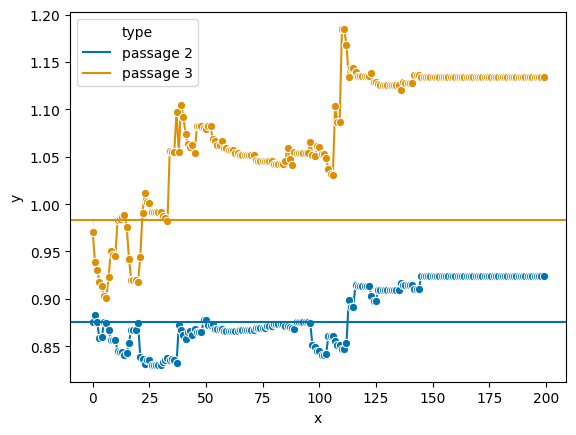

In [114]:
df_plt = pd.DataFrame(data={"x" : x, "y" : y, \
                            "type" : type_})
plt_ = sns.lineplot(data=df_plt, x="x", y="y", hue="type", palette=palette_, marker='o')

for pass_ in range(2):
    plt_.axhline(y=RMSE_mat_full[pass_, 0], c=palette_[pass_])

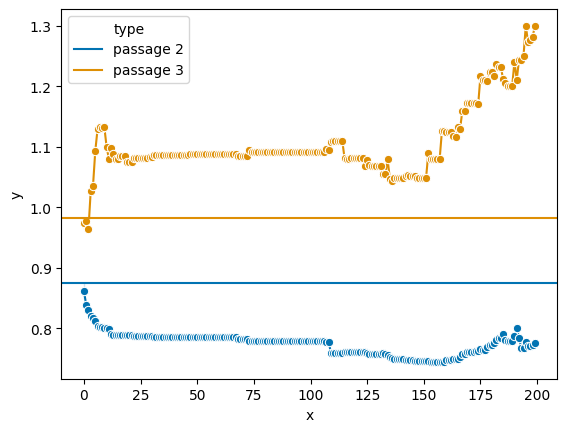

In [79]:
df_plt = pd.DataFrame(data={"x" : x, "y" : y, \
                            "type" : type_})
plt_ = sns.lineplot(data=df_plt, x="x", y="y", hue="type", palette=palette_, marker='o')

for pass_ in range(2):
    plt_.axhline(y=RMSE_mat_full[pass_, 0], c=palette_[pass_])

In [123]:
id_pareto = pareto_optimal_solution(RMSE_traj[:, 0, 0], RMSE_traj[:, 1, 0])
objectives = np.column_stack((RMSE_traj[:, 0, 0], RMSE_traj[:, 1, 0]))
print(id_pareto)
print(objectives[id_pareto])

[3, 4, 6, 16, 21, 26, 27, 28, 29, 30, 31, 32, 33]
[[0.85824108 0.91806643]
 [0.85919217 0.91333241]
 [0.87453225 0.90068995]
 [0.8536389  0.94249929]
 [0.83910037 0.94464285]
 [0.83024472 0.99174828]
 [0.83024472 0.99174828]
 [0.83024472 0.99174828]
 [0.83024472 0.99174828]
 [0.83024414 0.9917899 ]
 [0.83378585 0.986982  ]
 [0.83565211 0.98497207]
 [0.83771275 0.98178243]]


## fit dynamic Ri with greedily seleced metabs removed

In [145]:
## fit dynamic Ri with greedily seleced metabs removed
date_ = '20230530'
n_repeats = 10
rand_seed = 7363
np.random.seed(rand_seed)
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]


num_metabs_clust = df_speciesMetab.shape[1]
id_rm = np.array(metab_rm_list)[range(22)]
id_ = list(set(range(num_metabs_clust)) - set(list(id_rm)))
# id_ = np.where(sum_ > 0)[0]
len(id_)
df_speciesMetab_tmp = df_speciesMetab.copy()
df_speciesMetab_tmp = df_speciesMetab_tmp.iloc[:, id_]

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_compare_greedy_rm_metabs' + \
                                        f'_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2_2to3_remove_metabs_greedy_pareto'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_for_paper_Ri_fit_dynamic' + \
                                         f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'.pickle'))
Ri_dynamic_obj = {}
# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_cluster, \
#                                 df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                 df_speciesAbun_ratio_mdl, p_vec_new, \
#                                 file_save, num_passages=5, pass_rm=[1, 2, 3, 4])
pass_keep = np.arange(num_passages - 1)
id_keep = list(pass_keep) + list(pass_keep + num_passages - 1) + list(pass_keep + 2 * (num_passages - 1))
pass_rm = [2, 3, 4]
Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_tmp, \
                                df_speciesAbun_prev_mdl.iloc[:, id_keep], \
                                df_speciesAbun_next_mdl.iloc[:, id_keep], \
                                df_speciesAbun_ratio_mdl.iloc[:, id_keep], p_vec_new, \
                                file_save, num_passages=5, pass_rm=pass_rm, num_brep=3)
# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab, \
#                                       df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                       df_speciesAbun_ratio_mdl, p_vec_new, \
#                                       file_save, num_passages=5, pass_rm=[3, 4])
# Ri_dynamic_obj = fit_ss_Ri(df_speciesMetab, df_speciesAbun_mdl, \
#                                       df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                       df_speciesAbun_ratio_mdl, \
#                                       file_save, num_passages=6, pass_rm=[0, 1, 2])
# Ri_ss_obj =  fit_ss_Ri(df_speciesMetab_cluster, df_speciesAbun_mdl, \
#                        df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                        df_speciesAbun_ratio_mdl, \
#                        file_save=file_save, num_passages=6, pass_rm=pass_rm)

with open(file_save, "wb") as file_:
     pickle.dump(Ri_dynamic_obj, file_) 

count = 0, p_tmp = 0.001


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 1, p_tmp = 0.01


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 2, p_tmp = 0.05


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 3, p_tmp = 0.06


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 4, p_tmp = 0.07


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 5, p_tmp = 0.08


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 6, p_tmp = 0.09


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 7, p_tmp = 0.1


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 8, p_tmp = 0.125


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 9, p_tmp = 0.15


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 10, p_tmp = 0.175


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 11, p_tmp = 0.2


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 12, p_tmp = 0.3


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 13, p_tmp = 0.4


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/

count = 14, p_tmp = 0.5


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/Tar

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/Tar

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/Tar

count = 15, p_tmp = 0.55


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 16, p_tmp = 0.6


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 17, p_tmp = 0.65


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 18, p_tmp = 0.7


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

In [297]:
date_ = '20230530'
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
pass_rm = [0, 1, 2]
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_compare_greedy_rm_metabs' + \
                                        f'_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2_2to3_remove_metabs_greedy_pareto'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_for_paper_Ri_fit_dynamic' + \
                                         f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'.pickle'))

with open(file_save, "rb") as file_:
    Ri_dynamic_obj = pickle.load(file_) 
    
Ri_noMicrocosm_dynamicAll_fit_all = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_all']
Ri_noMicrocosm_dynamicAll_fit_avg = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_avg']
Ri_noMicrocosm_dynamicAll_fit_joint = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_joint']

In [298]:
num_metabs_clust = df_speciesMetab.shape[1]
id_rm = np.array(metab_rm_list)[range(22)]
id_ = list(set(range(num_metabs_clust)) - set(list(id_rm)))
len(id_)
df_speciesMetab_tmp = df_speciesMetab.copy()
df_speciesMetab_tmp = df_speciesMetab_tmp.iloc[:, id_]
count_p = 7
RMSE_mat_full_tmp = np.zeros((num_passages - 1, 2))
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
Ri_fit = {0: Ri_avg}
# RMSE_sens_complete_full = np.zeros((num_passages - 1, 2))
sens_obj_all, RMSE_obj_all = \
    blindly_pred_abun_growth_without_inoc([p_vec_new[count_p]], df_speciesMetab_tmp, \
                                          df_speciesAbun_inoc, df_speciesAbun_mdl, \
                                          df_speciesAbun_prev_mdl, \
                                          df_speciesAbun_ratio_mdl, \
                                          Ri_fit, "dummy", "dummy", \
                                          "dummy", num_passages=6, num_iter=100, \
                                          thresh_zero=1e-8, Ri_ss=False, plot_=False, \
                                          save_data_obj=False, \
                                          return_sensitivity_ana=True)
for pass_ in range(num_passages - 1):
    RMSE_mat_full_tmp[pass_, 0] = RMSE_obj_all[pass_]["abundance"]
    RMSE_mat_full_tmp[pass_, 1] = RMSE_obj_all[pass_]["growth_ratio"]

In [197]:
count_p

7

In [299]:
RMSE_mat_full_tmp

array([[0.83910037, 0.82198798],
       [0.94464285, 1.10551485],
       [1.36763096, 1.32721971],
       [1.58495394, 1.15404242],
       [1.85213993, 1.16688582]])

In [227]:
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
id_order = np.argsort(-Ri_avg)

num_metabs_clust = df_speciesMetab.shape[1]
id_rm = np.array(metab_rm_list)[range(22)]
id_ = list(set(range(num_metabs_clust)) - set(list(id_rm)))
metab_names_tmp = np.array(metab_names.copy())
metab_names_tmp = metab_names_tmp[id_]

df_metabs_tmp = pd.DataFrame(data={"metabs" : metab_names_tmp[id_order], \
                                   "Ri" : Ri_avg[id_order]})
df_metabs_tmp.iloc[range(20), :]

,metabs,Ri
0,BETA-ALANINE_0,0.120033
1,IS_4-CHLORO-PHENYLALANINE_2,0.067832
2,2-(4-HYDROXYPHENYL)PROPIONIC ACID,0.052769
3,3-DEHYDROSHIKIMIC ACID,0.052436
4,"2,6-DIAMINOHEPTANEDIOIC ACID",0.050307
5,SPERMIDINE,0.047581
6,GLYCERIC ACID,0.045585
7,MANNOSE 6-PHOSPHATE,0.043308
8,1-METHYLADENOSINE,0.042723
9,N6-(DELTA2-ISOPENTENYL)-ADENINE,0.025282


In [225]:
len(Ri_avg)

270

In [226]:
id_order

array([  8, 130,  24,  90, 206,  21,  75,   5,  34, 230, 224,  31, 106,
       115,  43, 139, 212,  59,  74, 249, 252, 248, 140, 246,  68, 134,
       180, 135,  47, 129,  16,  64, 170, 196,  44, 127, 155, 200,   6,
       261, 205, 240,  19,  91,  49, 184, 214, 225, 123, 119,   3, 198,
        33,  29,  22, 111, 269, 150,  57, 192, 193, 194, 195,  25, 197,
        23, 199,  20, 201, 202, 203, 204,  18,  17, 207, 208, 209, 210,
       211,  15, 213, 191, 190, 189, 188, 166, 167, 168, 169,  28, 171,
       172, 173, 174, 175,  14, 176, 178, 179,  27, 181, 182, 183,  26,
       185, 186, 187, 177, 215, 216, 217, 245,   9, 247,   7,   4, 250,
       251,   2, 253, 254, 255, 256, 257, 258, 259, 260,   1, 262, 263,
       264, 265, 266, 267, 244, 165, 243, 241, 218, 219, 220, 221, 222,
       223,  13,  12, 226, 227, 228, 229,  11, 231, 232, 233, 234, 235,
       236, 237, 238, 239,  10, 242, 164, 163, 162,  85,  86,  87,  88,
        89,  50,  48,  92,  93,  94,  84,  95,  97,  98,  99, 10

In [201]:
Ri_avg[id_order[range(20)]]

array([0.12003326, 0.06783157, 0.05276887, 0.05243617, 0.05030718,
       0.04758148, 0.04558505, 0.0433078 , 0.0427233 , 0.02528152,
       0.02169161, 0.02106566, 0.02100862, 0.0200745 , 0.01862581,
       0.01318594, 0.01280332, 0.01277685, 0.01268077, 0.01014802])

## Blind prediction of abundance and growth ratio

In [300]:
## Blind prediction of abundance and growth ratio
num_iter = 100
fig, axes = plt.subplots(2, int(num_passages / 2), \
                             figsize=(40, 35), sharey="row", sharex="col")
fig.supylabel('predicted abundance (log scale)', fontsize=60)
fig.supxlabel('observed abundance (log scale)', fontsize=60)
for pass_ in range(num_passages - 1):
    ax_row_ = int(pass_ / 3)
    ax_col_ = int(pass_ % 3)
    print(f'row = {ax_row_}, col = {ax_col_}')


    if pass_ <= 1:
        growth_rate_all = sens_obj_all[pass_]['growth_rate_all']
        df_speciesAbun_prev_tmp_ = sens_obj_all[pass_]['df_speciesAbun_prev']
        df_tmp = pd.DataFrame()
        for col_ in df_speciesAbun_prev_tmp_.columns.values:
            df_tmp[col_] = \
                growth_rate_all.copy()[col_].values * \
                df_speciesAbun_prev_tmp_[col_].values
            df_tmp[col_] /= np.sum(df_tmp[col_].values)
#         df_tmp = df_speciesAbun_next_mdl.iloc[:, [pass_, \
#                                                     pass_ + (num_passages - 1), \
#                                                     pass_ + 2 * (num_passages - 1)]].copy()

    b_ = range(3)
    x = \
        np.array(df_speciesAbun_mdl.copy().iloc[:, [pass_ + 1, \
                                                    pass_ + 1 + num_passages, \
                                                    pass_ + 1 + 2 * num_passages]])
#     x = 10**(np.mean(np.log10(x), axis=1)).flatten()
    x = x.flatten()
    y = np.array(df_tmp.copy())[:, :].flatten()
    thresh_zero = 1e-8
    y[y == 0] = thresh_zero
    id_ = np.where((x > 0) & (y > 0))[0]
    id_ord = np.where((x > 0) & (y > 0))[0]
    x = np.log10(x[id_])
    y = np.log10(y[id_])
    y[y <= -8] = -8

    plt_ = sns.scatterplot(x=x, \
                            y=y, s=100, ax=axes[ax_row_, ax_col_])

    plt_ = sns.kdeplot(x=x, y=y, fill=True, alpha=0.6, cmap="Reds", \
                    ax=axes[ax_row_, ax_col_])
    plt_.plot([-8, 0], [-8, 0], c="red", linewidth=3)

    corr_val_pe = scipy.stats.pearsonr(10**x, 10**y)
    corr_val_pe_log = scipy.stats.pearsonr(x, y)
    corr_val_sp = scipy.stats.spearmanr(x, y)
    # abs_mean_error = np.median(np.abs(y - x))
    abs_mean_error = np.sqrt(np.mean(np.power(y - x, 2)))
    std_error = np.sqrt(np.std(np.power(y - x, 2)))

    id_notzero_zero = np.where((x > -8) & (y <= -8))[0]

    frac_zero = len(id_notzero_zero) / len(x)

    model = sm.OLS(10**y, 10**x).fit()
    slope = model.params[0]
    slope_pval = model.pvalues[0]

    model_log = sm.OLS(y, x).fit()
    slope_log = model_log.params[0]
    slope_log_pval = model_log.pvalues[0]

    # plt_.plot([-8, 0], [np.log10(slope * (1e-8)), np.log10(slope * 1)], c="green")
    plt_.plot([-8, 0], [(slope_log * (-8)), (slope_log * 0)], c="green", \
                linewidth=3)

    # title_ = f'pearson cc (linear) = {np.round(corr_val_pe[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe[1]) + \
    #         f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe_log[1]) + \
    #         f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_sp[1]) + \
    #         f'\n slope = {np.round(slope, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_pval) + \
    #         f', slope_log = {np.round(slope_log, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_log_pval) + \
    #         f'\n abs_median_error = {np.round(abs_mean_error, 3)}' + \
    #         f'\n fit with p = {p_tmp}'
    title_ = f'predicted vs observed abundance at passage {pass_ + 1}' + \
            f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_pe_log[1]) + \
            f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_sp[1]) + \
            f'\n slope_log = {np.round(slope_log, 3)} pvalue = ' + \
                    '{:.3e}'.format(slope_log_pval) + \
            f'\n RMSE = {np.round(abs_mean_error, 3)}'

    axes[ax_row_, ax_col_].set_title(title_, size=30)
    if ax_row_ == 1:
        plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
    if ax_col_ == 0:
        plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_compare_greedy_rm_metabs' + \
                                        f'_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2_2to3_remove_metabs_greedy_pareto'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'predicted_vs_observed_abundance_' + \
                                            f'consolidated' + \
                                            f'_with_p{p_vec_new[count_p]}_dynamics_till_passage3.png'))

fig.figure.savefig(file_save, \
                    dpi=300, transparent=False, facecolor="white")
plt.close(fig.figure)

row = 0, col = 0


/tmp/ipykernel_15756/396791075.py:97: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 0, col = 1
row = 0, col = 2
row = 1, col = 0


/tmp/ipykernel_15756/396791075.py:95: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
/tmp/ipykernel_15756/396791075.py:97: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 1, col = 1


/tmp/ipykernel_15756/396791075.py:95: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)


In [301]:
num_iter = 100
fig, axes = plt.subplots(2, int(num_passages / 2), \
                             figsize=(40, 35), sharey="row", sharex="col")
fig.supylabel('predicted abundance (log scale)', fontsize=60)
fig.supxlabel('observed abundance (log scale)', fontsize=60)
for pass_ in range(num_passages - 1):
    ax_row_ = int(pass_ / 3)
    ax_col_ = int(pass_ % 3)
    print(f'row = {ax_row_}, col = {ax_col_}')


    if pass_ <= 0:
        growth_rate_all = sens_obj_all[pass_]['growth_rate_all']
        df_speciesAbun_prev_tmp_ = sens_obj_all[pass_]['df_speciesAbun_prev']
        df_tmp = pd.DataFrame()
        for col_ in df_speciesAbun_prev_tmp_.columns.values:
            df_tmp[col_] = \
                growth_rate_all.copy()[col_].values * \
                df_speciesAbun_prev_tmp_[col_].values
            df_tmp[col_] /= np.sum(df_tmp[col_].values)
#         df_tmp = df_speciesAbun_next_mdl.iloc[:, [pass_, \
#                                                     pass_ + (num_passages - 1), \
#                                                     pass_ + 2 * (num_passages - 1)]].copy()

    b_ = range(3)
    x = \
        np.array(df_speciesAbun_mdl.copy().iloc[:, [pass_ + 1, \
                                                    pass_ + 1 + num_passages, \
                                                    pass_ + 1 + 2 * num_passages]])
#     x = 10**(np.mean(np.log10(x), axis=1)).flatten()
    x = x.flatten()
    y = np.array(df_tmp.copy())[:, :].flatten()
    thresh_zero = 1e-8
    y[y == 0] = thresh_zero
    id_ = np.where((x > 0) & (y > 0))[0]
    id_ord = np.where((x > 0) & (y > 0))[0]
    x = np.log10(x[id_])
    y = np.log10(y[id_])
    y[y <= -8] = -8

    plt_ = sns.scatterplot(x=x, \
                            y=y, s=100, ax=axes[ax_row_, ax_col_])

    plt_ = sns.kdeplot(x=x, y=y, fill=True, alpha=0.6, cmap="Reds", \
                    ax=axes[ax_row_, ax_col_])
    plt_.plot([-8, 0], [-8, 0], c="red", linewidth=3)

    corr_val_pe = scipy.stats.pearsonr(10**x, 10**y)
    corr_val_pe_log = scipy.stats.pearsonr(x, y)
    corr_val_sp = scipy.stats.spearmanr(x, y)
    # abs_mean_error = np.median(np.abs(y - x))
    abs_mean_error = np.sqrt(np.mean(np.power(y - x, 2)))
    std_error = np.sqrt(np.std(np.power(y - x, 2)))

    id_notzero_zero = np.where((x > -8) & (y <= -8))[0]

    frac_zero = len(id_notzero_zero) / len(x)

    model = sm.OLS(10**y, 10**x).fit()
    slope = model.params[0]
    slope_pval = model.pvalues[0]

    model_log = sm.OLS(y, x).fit()
    slope_log = model_log.params[0]
    slope_log_pval = model_log.pvalues[0]

    # plt_.plot([-8, 0], [np.log10(slope * (1e-8)), np.log10(slope * 1)], c="green")
    plt_.plot([-8, 0], [(slope_log * (-8)), (slope_log * 0)], c="green", \
                linewidth=3)

    # title_ = f'pearson cc (linear) = {np.round(corr_val_pe[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe[1]) + \
    #         f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe_log[1]) + \
    #         f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_sp[1]) + \
    #         f'\n slope = {np.round(slope, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_pval) + \
    #         f', slope_log = {np.round(slope_log, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_log_pval) + \
    #         f'\n abs_median_error = {np.round(abs_mean_error, 3)}' + \
    #         f'\n fit with p = {p_tmp}'
    title_ = f'predicted vs observed abundance at passage {pass_ + 1}' + \
            f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_pe_log[1]) + \
            f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_sp[1]) + \
            f'\n slope_log = {np.round(slope_log, 3)} pvalue = ' + \
                    '{:.3e}'.format(slope_log_pval) + \
            f'\n RMSE = {np.round(abs_mean_error, 3)}'

    axes[ax_row_, ax_col_].set_title(title_, size=30)
    if ax_row_ == 1:
        plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
    if ax_col_ == 0:
        plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_compare_greedy_rm_metabs' + \
                                        f'_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2_2to3_remove_metabs_greedy_pareto'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'predicted_vs_observed_abundance_' + \
                                            f'consolidated' + \
                                            f'_with_p{p_vec_new[count_p]}_dynamics_till_passage2.png'))

fig.figure.savefig(file_save, \
                    dpi=300, transparent=False, facecolor="white")
plt.close(fig.figure)

row = 0, col = 0


/tmp/ipykernel_15756/213438869.py:96: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 0, col = 1
row = 0, col = 2
row = 1, col = 0


/tmp/ipykernel_15756/213438869.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
/tmp/ipykernel_15756/213438869.py:96: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 1, col = 1


/tmp/ipykernel_15756/213438869.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)


In [302]:
num_iter = 100
fig, axes = plt.subplots(2, int(num_passages / 2), \
                             figsize=(40, 35), sharey="row", sharex="col")
fig.supylabel('predicted abundance (log scale)', fontsize=60)
fig.supxlabel('observed abundance (log scale)', fontsize=60)
for pass_ in range(num_passages - 1):
    ax_row_ = int(pass_ / 3)
    ax_col_ = int(pass_ % 3)
    print(f'row = {ax_row_}, col = {ax_col_}')


    if pass_ <= 10:
        growth_rate_all = sens_obj_all[pass_]['growth_rate_all']
        df_speciesAbun_prev_tmp_ = sens_obj_all[pass_]['df_speciesAbun_prev']
        df_tmp = pd.DataFrame()
        for col_ in df_speciesAbun_prev_tmp_.columns.values:
            df_tmp[col_] = \
                growth_rate_all.copy()[col_].values * \
                df_speciesAbun_prev_tmp_[col_].values
            df_tmp[col_] /= np.sum(df_tmp[col_].values)
#         df_tmp = df_speciesAbun_next_mdl.iloc[:, [pass_, \
#                                                     pass_ + (num_passages - 1), \
#                                                     pass_ + 2 * (num_passages - 1)]].copy()

    b_ = range(3)
    x = \
        np.array(df_speciesAbun_mdl.copy().iloc[:, [pass_ + 1, \
                                                    pass_ + 1 + num_passages, \
                                                    pass_ + 1 + 2 * num_passages]])
#     x = 10**(np.mean(np.log10(x), axis=1)).flatten()
    x = x.flatten()
    y = np.array(df_tmp.copy())[:, :].flatten()
    thresh_zero = 1e-8
    y[y == 0] = thresh_zero
    id_ = np.where((x > 0) & (y > 0))[0]
    id_ord = np.where((x > 0) & (y > 0))[0]
    x = np.log10(x[id_])
    y = np.log10(y[id_])
    y[y <= -8] = -8

    plt_ = sns.scatterplot(x=x, \
                            y=y, s=100, ax=axes[ax_row_, ax_col_])

    plt_ = sns.kdeplot(x=x, y=y, fill=True, alpha=0.6, cmap="Reds", \
                    ax=axes[ax_row_, ax_col_])
    plt_.plot([-8, 0], [-8, 0], c="red", linewidth=3)

    corr_val_pe = scipy.stats.pearsonr(10**x, 10**y)
    corr_val_pe_log = scipy.stats.pearsonr(x, y)
    corr_val_sp = scipy.stats.spearmanr(x, y)
    # abs_mean_error = np.median(np.abs(y - x))
    abs_mean_error = np.sqrt(np.mean(np.power(y - x, 2)))
    std_error = np.sqrt(np.std(np.power(y - x, 2)))

    id_notzero_zero = np.where((x > -8) & (y <= -8))[0]

    frac_zero = len(id_notzero_zero) / len(x)

    model = sm.OLS(10**y, 10**x).fit()
    slope = model.params[0]
    slope_pval = model.pvalues[0]

    model_log = sm.OLS(y, x).fit()
    slope_log = model_log.params[0]
    slope_log_pval = model_log.pvalues[0]

    # plt_.plot([-8, 0], [np.log10(slope * (1e-8)), np.log10(slope * 1)], c="green")
    plt_.plot([-8, 0], [(slope_log * (-8)), (slope_log * 0)], c="green", \
                linewidth=3)

    # title_ = f'pearson cc (linear) = {np.round(corr_val_pe[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe[1]) + \
    #         f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe_log[1]) + \
    #         f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_sp[1]) + \
    #         f'\n slope = {np.round(slope, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_pval) + \
    #         f', slope_log = {np.round(slope_log, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_log_pval) + \
    #         f'\n abs_median_error = {np.round(abs_mean_error, 3)}' + \
    #         f'\n fit with p = {p_tmp}'
    title_ = f'predicted vs observed abundance at passage {pass_ + 1}' + \
            f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_pe_log[1]) + \
            f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_sp[1]) + \
            f'\n slope_log = {np.round(slope_log, 3)} pvalue = ' + \
                    '{:.3e}'.format(slope_log_pval) + \
            f'\n RMSE = {np.round(abs_mean_error, 3)}'

    axes[ax_row_, ax_col_].set_title(title_, size=30)
    if ax_row_ == 1:
        plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
    if ax_col_ == 0:
        plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_compare_greedy_rm_metabs' + \
                                        f'_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2_2to3_remove_metabs_greedy_pareto'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'predicted_vs_observed_abundance_' + \
                                            f'consolidated' + \
                                            f'_with_p{p_vec_new[count_p]}_dynamics_till_passage6.png'))

fig.figure.savefig(file_save, \
                    dpi=300, transparent=False, facecolor="white")
plt.close(fig.figure)

row = 0, col = 0


/tmp/ipykernel_15756/1476487864.py:96: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 0, col = 1
row = 0, col = 2
row = 1, col = 0


/tmp/ipykernel_15756/1476487864.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
/tmp/ipykernel_15756/1476487864.py:96: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 1, col = 1


/tmp/ipykernel_15756/1476487864.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)


## growth ratio

In [303]:
num_iter = 100
fig, axes = plt.subplots(2, int(num_passages / 2), \
                             figsize=(40, 35), sharey="row", sharex="col")
fig.supylabel('predicted growth  (log scale)', fontsize=60)
fig.supxlabel('observed abundance (log scale)', fontsize=60)
for pass_ in range(num_passages - 1):
    ax_row_ = int(pass_ / 3)
    ax_col_ = int(pass_ % 3)
    print(f'row = {ax_row_}, col = {ax_col_}')


    if pass_ <= 10:
        growth_rate_all = sens_obj_all[pass_]['growth_rate_all']
        df_speciesAbun_prev_tmp_ = sens_obj_all[pass_]['df_speciesAbun_prev']
        df_tmp = pd.DataFrame()
        for col_ in df_speciesAbun_prev_tmp_.columns.values:
            df_tmp[col_] = \
                growth_rate_all.copy()[col_].values * \
                df_speciesAbun_prev_tmp_[col_].values
            df_tmp[col_] /= np.sum(df_tmp[col_].values)
#         df_tmp = df_speciesAbun_next_mdl.iloc[:, [pass_, \
#                                                     pass_ + (num_passages - 1), \
#                                                     pass_ + 2 * (num_passages - 1)]].copy()

    b_ = range(3)
#     x = \
#         np.array(df_speciesAbun_mdl.copy().iloc[:, [pass_ + 1, \
#                                                     pass_ + 1 + num_passages, \
#                                                     pass_ + 1 + 2 * num_passages]])
#     x = 10**(np.mean(np.log10(x), axis=1)).flatten()
    
    x = \
        np.array(df_speciesAbun_ratio_mdl.copy().iloc[:, [pass_, \
                                                    pass_ + num_passages - 1, \
                                                    pass_ + 2 * (num_passages - 1)]])
    x = x.flatten()
#     y = np.array(df_tmp.copy())[:, :].flatten()
    y = np.array(growth_rate_all.copy()).flatten()
    thresh_zero = 1e-4
    y[y == 0] = thresh_zero
    id_ = np.where((x > 0) & (y > 0))[0]
    id_ord = np.where((x > 0) & (y > 0))[0]
    x = np.log10(x[id_])
    y = np.log10(y[id_])
    y[y <= -4] = -4

    plt_ = sns.scatterplot(x=x, \
                            y=y, s=100, ax=axes[ax_row_, ax_col_])

    plt_ = sns.kdeplot(x=x, y=y, fill=True, alpha=0.6, cmap="Reds", \
                    ax=axes[ax_row_, ax_col_])
    plt_.plot([-4, 2], [-4, 2], c="red", linewidth=3)

    corr_val_pe = scipy.stats.pearsonr(10**x, 10**y)
    corr_val_pe_log = scipy.stats.pearsonr(x, y)
    corr_val_sp = scipy.stats.spearmanr(x, y)
    # abs_mean_error = np.median(np.abs(y - x))
    abs_mean_error = np.sqrt(np.mean(np.power(y - x, 2)))
    std_error = np.sqrt(np.std(np.power(y - x, 2)))

    id_notzero_zero = np.where((x > -4) & (y <= -4))[0]

    frac_zero = len(id_notzero_zero) / len(x)

    model = sm.OLS(10**y, 10**x).fit()
    slope = model.params[0]
    slope_pval = model.pvalues[0]

    model_log = sm.OLS(y, x).fit()
    slope_log = model_log.params[0]
    slope_log_pval = model_log.pvalues[0]

    # plt_.plot([-8, 0], [np.log10(slope * (1e-8)), np.log10(slope * 1)], c="green")
    plt_.plot([-4, 2], [(slope_log * (-4)), (slope_log * 2)], c="green", \
                linewidth=3)

    # title_ = f'pearson cc (linear) = {np.round(corr_val_pe[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe[1]) + \
    #         f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe_log[1]) + \
    #         f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_sp[1]) + \
    #         f'\n slope = {np.round(slope, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_pval) + \
    #         f', slope_log = {np.round(slope_log, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_log_pval) + \
    #         f'\n abs_median_error = {np.round(abs_mean_error, 3)}' + \
    #         f'\n fit with p = {p_tmp}'
    title_ = f'predicted vs observed abundance at passage {pass_ + 1}' + \
            f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_pe_log[1]) + \
            f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_sp[1]) + \
            f'\n slope_log = {np.round(slope_log, 3)} pvalue = ' + \
                    '{:.3e}'.format(slope_log_pval) + \
            f'\n RMSE = {np.round(abs_mean_error, 3)}'

    axes[ax_row_, ax_col_].set_title(title_, size=30)
    if ax_row_ == 1:
        plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
    if ax_col_ == 0:
        plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_compare_greedy_rm_metabs' + \
                                        f'_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2_2to3_remove_metabs_greedy_pareto'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'predicted_vs_observed_growth_' + \
                                            f'consolidated' + \
                                            f'_with_p{p_vec_new[count_p]}_dynamics_till_passage6.png'))

fig.figure.savefig(file_save, \
                    dpi=300, transparent=False, facecolor="white")
plt.close(fig.figure)

row = 0, col = 0


/tmp/ipykernel_15756/1940231001.py:102: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 0, col = 1
row = 0, col = 2
row = 1, col = 0


/tmp/ipykernel_15756/1940231001.py:100: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
/tmp/ipykernel_15756/1940231001.py:102: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 1, col = 1


/tmp/ipykernel_15756/1940231001.py:100: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)


## Blind prediction of abundance and growth ratio for Ri trained with noMicrocosm (greedily remove metabs) and prediction for agar

In [304]:
## Blind prediction of abundance and growth ratio for Ri trained with noMicrocosm (greedily remove metabs) and prediction for agar
num_metabs_clust = df_speciesMetab.shape[1]
id_rm = np.array(metab_rm_list)[range(22)]
id_ = list(set(range(num_metabs_clust)) - set(list(id_rm)))
len(id_)
df_speciesMetab_tmp = df_speciesMetab.copy()
df_speciesMetab_tmp = df_speciesMetab_tmp.iloc[:, id_]
count_p = 7
RMSE_mat_full_tmp = np.zeros((num_passages - 1, 2))
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
Ri_fit = {0: Ri_avg}
# RMSE_sens_complete_full = np.zeros((num_passages - 1, 2))
sens_obj_all, RMSE_obj_all = \
    blindly_pred_abun_growth_without_inoc([p_vec_new[count_p]], df_speciesMetab_tmp, \
                                          df_speciesAbun_inoc, df_speciesAbun_super_agar, \
                                          df_speciesAbun_super_agar_prev, \
                                          df_speciesAbun_super_agar_ratio, \
                                          Ri_fit, "dummy", "dummy", \
                                          "dummy", num_passages=6, num_iter=100, \
                                          thresh_zero=1e-8, Ri_ss=False, plot_=False, \
                                          save_data_obj=False, \
                                          return_sensitivity_ana=True)
for pass_ in range(num_passages - 1):
    RMSE_mat_full_tmp[pass_, 0] = RMSE_obj_all[pass_]["abundance"]
    RMSE_mat_full_tmp[pass_, 1] = RMSE_obj_all[pass_]["growth_ratio"]

In [305]:
RMSE_mat_full_tmp

array([[1.03837713, 1.04433038],
       [1.54845926, 1.08851527],
       [2.09585896, 1.28466597],
       [2.43118319, 1.16709744],
       [2.76545003, 1.13758869]])

In [306]:
num_iter = 100
fig, axes = plt.subplots(2, int(num_passages / 2), \
                             figsize=(40, 35), sharey="row", sharex="col")
fig.supylabel('predicted abundance (log scale)', fontsize=60)
fig.supxlabel('observed abundance (log scale)', fontsize=60)
for pass_ in range(num_passages - 1):
    ax_row_ = int(pass_ / 3)
    ax_col_ = int(pass_ % 3)
    print(f'row = {ax_row_}, col = {ax_col_}')


    if pass_ <= 1:
        growth_rate_all = sens_obj_all[pass_]['growth_rate_all']
        df_speciesAbun_prev_tmp_ = sens_obj_all[pass_]['df_speciesAbun_prev']
        df_tmp = pd.DataFrame()
        for col_ in df_speciesAbun_prev_tmp_.columns.values:
            df_tmp[col_] = \
                growth_rate_all.copy()[col_].values * \
                df_speciesAbun_prev_tmp_[col_].values
            df_tmp[col_] /= np.sum(df_tmp[col_].values)
#         df_tmp = df_speciesAbun_next_mdl.iloc[:, [pass_, \
#                                                     pass_ + (num_passages - 1), \
#                                                     pass_ + 2 * (num_passages - 1)]].copy()

    b_ = range(3)
    x = \
        np.array(df_speciesAbun_super_agar.copy().iloc[:, [pass_ + 1, \
                                                    pass_ + 1 + num_passages, \
                                                    pass_ + 1 + 2 * num_passages]])
#     x = 10**(np.mean(np.log10(x), axis=1)).flatten()
    x = x.flatten()
    y = np.array(df_tmp.copy())[:, :].flatten()
    thresh_zero = 1e-8
    y[y == 0] = thresh_zero
    id_ = np.where((x > 0) & (y > 0))[0]
    id_ord = np.where((x > 0) & (y > 0))[0]
    x = np.log10(x[id_])
    y = np.log10(y[id_])
    y[y <= -8] = -8

    plt_ = sns.scatterplot(x=x, \
                            y=y, s=100, ax=axes[ax_row_, ax_col_])

    plt_ = sns.kdeplot(x=x, y=y, fill=True, alpha=0.6, cmap="Reds", \
                    ax=axes[ax_row_, ax_col_])
    plt_.plot([-8, 0], [-8, 0], c="red", linewidth=3)

    corr_val_pe = scipy.stats.pearsonr(10**x, 10**y)
    corr_val_pe_log = scipy.stats.pearsonr(x, y)
    corr_val_sp = scipy.stats.spearmanr(x, y)
    # abs_mean_error = np.median(np.abs(y - x))
    abs_mean_error = np.sqrt(np.mean(np.power(y - x, 2)))
    std_error = np.sqrt(np.std(np.power(y - x, 2)))

    id_notzero_zero = np.where((x > -8) & (y <= -8))[0]

    frac_zero = len(id_notzero_zero) / len(x)

    model = sm.OLS(10**y, 10**x).fit()
    slope = model.params[0]
    slope_pval = model.pvalues[0]

    model_log = sm.OLS(y, x).fit()
    slope_log = model_log.params[0]
    slope_log_pval = model_log.pvalues[0]

    # plt_.plot([-8, 0], [np.log10(slope * (1e-8)), np.log10(slope * 1)], c="green")
    plt_.plot([-8, 0], [(slope_log * (-8)), (slope_log * 0)], c="green", \
                linewidth=3)

    # title_ = f'pearson cc (linear) = {np.round(corr_val_pe[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe[1]) + \
    #         f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe_log[1]) + \
    #         f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_sp[1]) + \
    #         f'\n slope = {np.round(slope, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_pval) + \
    #         f', slope_log = {np.round(slope_log, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_log_pval) + \
    #         f'\n abs_median_error = {np.round(abs_mean_error, 3)}' + \
    #         f'\n fit with p = {p_tmp}'
    title_ = f'predicted vs observed abundance at passage {pass_ + 1}' + \
            f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_pe_log[1]) + \
            f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_sp[1]) + \
            f'\n slope_log = {np.round(slope_log, 3)} pvalue = ' + \
                    '{:.3e}'.format(slope_log_pval) + \
            f'\n RMSE = {np.round(abs_mean_error, 3)}'

    axes[ax_row_, ax_col_].set_title(title_, size=30)
    if ax_row_ == 1:
        plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
    if ax_col_ == 0:
        plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_compare_greedy_rm_metabs' + \
                                        f'_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2_2to3_remove_metabs_greedy_pareto'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'predicted_vs_observed_abundance_' + \
                                            f'consolidated' + \
                                            f'_with_p{p_vec_new[count_p]}_dynamics_till_passage2_agar.png'))

fig.figure.savefig(file_save, \
                    dpi=300, transparent=False, facecolor="white")
plt.close(fig.figure)

row = 0, col = 0


/tmp/ipykernel_15756/1356428500.py:96: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 0, col = 1
row = 0, col = 2
row = 1, col = 0


/tmp/ipykernel_15756/1356428500.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
/tmp/ipykernel_15756/1356428500.py:96: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 1, col = 1


/tmp/ipykernel_15756/1356428500.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)


In [307]:
num_iter = 100
fig, axes = plt.subplots(2, int(num_passages / 2), \
                             figsize=(40, 35), sharey="row", sharex="col")
fig.supylabel('predicted growth ratio  (log scale)', fontsize=60)
fig.supxlabel('observed growth ratio (log scale)', fontsize=60)
for pass_ in range(num_passages - 1):
    ax_row_ = int(pass_ / 3)
    ax_col_ = int(pass_ % 3)
    print(f'row = {ax_row_}, col = {ax_col_}')


    if pass_ <= 10:
        growth_rate_all = sens_obj_all[pass_]['growth_rate_all']
        df_speciesAbun_prev_tmp_ = sens_obj_all[pass_]['df_speciesAbun_prev']
        df_tmp = pd.DataFrame()
        for col_ in df_speciesAbun_prev_tmp_.columns.values:
            df_tmp[col_] = \
                growth_rate_all.copy()[col_].values * \
                df_speciesAbun_prev_tmp_[col_].values
            df_tmp[col_] /= np.sum(df_tmp[col_].values)
#         df_tmp = df_speciesAbun_next_mdl.iloc[:, [pass_, \
#                                                     pass_ + (num_passages - 1), \
#                                                     pass_ + 2 * (num_passages - 1)]].copy()

    b_ = range(3)
#     x = \
#         np.array(df_speciesAbun_mdl.copy().iloc[:, [pass_ + 1, \
#                                                     pass_ + 1 + num_passages, \
#                                                     pass_ + 1 + 2 * num_passages]])
#     x = 10**(np.mean(np.log10(x), axis=1)).flatten()
    
    x = \
        np.array(df_speciesAbun_super_agar_ratio.copy().iloc[:, [pass_, \
                                                    pass_ + num_passages - 1, \
                                                    pass_ + 2 * (num_passages - 1)]])
    x = x.flatten()
#     y = np.array(df_tmp.copy())[:, :].flatten()
    y = np.array(growth_rate_all.copy()).flatten()
    thresh_zero = 1e-4
    y[y == 0] = thresh_zero
    id_ = np.where((x > 0) & (y > 0))[0]
    id_ord = np.where((x > 0) & (y > 0))[0]
    x = np.log10(x[id_])
    y = np.log10(y[id_])
    y[y <= -4] = -4

    plt_ = sns.scatterplot(x=x, \
                            y=y, s=100, ax=axes[ax_row_, ax_col_])

    plt_ = sns.kdeplot(x=x, y=y, fill=True, alpha=0.6, cmap="Reds", \
                    ax=axes[ax_row_, ax_col_])
    plt_.plot([-4, 2], [-4, 2], c="red", linewidth=3)

    corr_val_pe = scipy.stats.pearsonr(10**x, 10**y)
    corr_val_pe_log = scipy.stats.pearsonr(x, y)
    corr_val_sp = scipy.stats.spearmanr(x, y)
    # abs_mean_error = np.median(np.abs(y - x))
    abs_mean_error = np.sqrt(np.mean(np.power(y - x, 2)))
    std_error = np.sqrt(np.std(np.power(y - x, 2)))

    id_notzero_zero = np.where((x > -4) & (y <= -4))[0]

    frac_zero = len(id_notzero_zero) / len(x)

    model = sm.OLS(10**y, 10**x).fit()
    slope = model.params[0]
    slope_pval = model.pvalues[0]

    model_log = sm.OLS(y, x).fit()
    slope_log = model_log.params[0]
    slope_log_pval = model_log.pvalues[0]

    # plt_.plot([-8, 0], [np.log10(slope * (1e-8)), np.log10(slope * 1)], c="green")
    plt_.plot([-4, 2], [(slope_log * (-4)), (slope_log * 2)], c="green", \
                linewidth=3)

    # title_ = f'pearson cc (linear) = {np.round(corr_val_pe[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe[1]) + \
    #         f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe_log[1]) + \
    #         f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_sp[1]) + \
    #         f'\n slope = {np.round(slope, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_pval) + \
    #         f', slope_log = {np.round(slope_log, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_log_pval) + \
    #         f'\n abs_median_error = {np.round(abs_mean_error, 3)}' + \
    #         f'\n fit with p = {p_tmp}'
    title_ = f'predicted vs observed growth ratio at passage {pass_ + 1}' + \
            f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_pe_log[1]) + \
            f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_sp[1]) + \
            f'\n slope_log = {np.round(slope_log, 3)} pvalue = ' + \
                    '{:.3e}'.format(slope_log_pval) + \
            f'\n RMSE = {np.round(abs_mean_error, 3)}'

    axes[ax_row_, ax_col_].set_title(title_, size=30)
    if ax_row_ == 1:
        plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
    if ax_col_ == 0:
        plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_compare_greedy_rm_metabs' + \
                                        f'_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2_2to3_remove_metabs_greedy_pareto'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'predicted_vs_observed_growth_' + \
                                            f'consolidated' + \
                                            f'_with_p{p_vec_new[count_p]}_dynamics_till_passage2_agar.png'))

fig.figure.savefig(file_save, \
                    dpi=300, transparent=False, facecolor="white")
plt.close(fig.figure)

row = 0, col = 0


/tmp/ipykernel_15756/1042543274.py:102: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 0, col = 1
row = 0, col = 2
row = 1, col = 0


/tmp/ipykernel_15756/1042543274.py:100: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
/tmp/ipykernel_15756/1042543274.py:102: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 1, col = 1


/tmp/ipykernel_15756/1042543274.py:100: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)


## Blind prediction of abundance and growth ratio for Ri trained with noMicrocosm (greedily remove metabs) and prediction for mucin

In [308]:
num_metabs_clust = df_speciesMetab.shape[1]
id_rm = np.array(metab_rm_list)[range(22)]
id_ = list(set(range(num_metabs_clust)) - set(list(id_rm)))
len(id_)
df_speciesMetab_tmp = df_speciesMetab.copy()
df_speciesMetab_tmp = df_speciesMetab_tmp.iloc[:, id_]
count_p = 7
RMSE_mat_full_tmp = np.zeros((num_passages - 1, 2))
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
Ri_fit = {0: Ri_avg}
# RMSE_sens_complete_full = np.zeros((num_passages - 1, 2))
sens_obj_all, RMSE_obj_all = \
    blindly_pred_abun_growth_without_inoc([p_vec_new[count_p]], df_speciesMetab_tmp, \
                                          df_speciesAbun_inoc, df_speciesAbun_mucin, \
                                          df_speciesAbun_mucin_prev, \
                                          df_speciesAbun_mucin_ratio, \
                                          Ri_fit, "dummy", "dummy", \
                                          "dummy", num_passages=6, num_iter=100, \
                                          thresh_zero=1e-8, Ri_ss=False, plot_=False, \
                                          save_data_obj=False, \
                                          return_sensitivity_ana=True)
for pass_ in range(num_passages - 1):
    RMSE_mat_full_tmp[pass_, 0] = RMSE_obj_all[pass_]["abundance"]
    RMSE_mat_full_tmp[pass_, 1] = RMSE_obj_all[pass_]["growth_ratio"]

In [309]:
RMSE_mat_full_tmp

array([[1.06915075, 1.08495294],
       [1.803991  , 1.14081536],
       [2.28424831, 1.14425441],
       [2.59872377, 1.33726925],
       [2.92026952, 1.21321604]])

In [310]:
num_iter = 100
fig, axes = plt.subplots(2, int(num_passages / 2), \
                             figsize=(40, 35), sharey="row", sharex="col")
fig.supylabel('predicted abundance (log scale)', fontsize=60)
fig.supxlabel('observed abundance (log scale)', fontsize=60)
for pass_ in range(num_passages - 1):
    ax_row_ = int(pass_ / 3)
    ax_col_ = int(pass_ % 3)
    print(f'row = {ax_row_}, col = {ax_col_}')


    if pass_ <= 1:
        growth_rate_all = sens_obj_all[pass_]['growth_rate_all']
        df_speciesAbun_prev_tmp_ = sens_obj_all[pass_]['df_speciesAbun_prev']
        df_tmp = pd.DataFrame()
        for col_ in df_speciesAbun_prev_tmp_.columns.values:
            df_tmp[col_] = \
                growth_rate_all.copy()[col_].values * \
                df_speciesAbun_prev_tmp_[col_].values
            df_tmp[col_] /= np.sum(df_tmp[col_].values)
#         df_tmp = df_speciesAbun_next_mdl.iloc[:, [pass_, \
#                                                     pass_ + (num_passages - 1), \
#                                                     pass_ + 2 * (num_passages - 1)]].copy()

    b_ = range(3)
    x = \
        np.array(df_speciesAbun_mucin.copy().iloc[:, [pass_ + 1, \
                                                    pass_ + 1 + num_passages, \
                                                    pass_ + 1 + 2 * num_passages]])
#     x = 10**(np.mean(np.log10(x), axis=1)).flatten()
    x = x.flatten()
    y = np.array(df_tmp.copy())[:, :].flatten()
    thresh_zero = 1e-8
    y[y == 0] = thresh_zero
    id_ = np.where((x > 0) & (y > 0))[0]
    id_ord = np.where((x > 0) & (y > 0))[0]
    x = np.log10(x[id_])
    y = np.log10(y[id_])
    y[y <= -8] = -8

    plt_ = sns.scatterplot(x=x, \
                            y=y, s=100, ax=axes[ax_row_, ax_col_])

    plt_ = sns.kdeplot(x=x, y=y, fill=True, alpha=0.6, cmap="Reds", \
                    ax=axes[ax_row_, ax_col_])
    plt_.plot([-8, 0], [-8, 0], c="red", linewidth=3)

    corr_val_pe = scipy.stats.pearsonr(10**x, 10**y)
    corr_val_pe_log = scipy.stats.pearsonr(x, y)
    corr_val_sp = scipy.stats.spearmanr(x, y)
    # abs_mean_error = np.median(np.abs(y - x))
    abs_mean_error = np.sqrt(np.mean(np.power(y - x, 2)))
    std_error = np.sqrt(np.std(np.power(y - x, 2)))

    id_notzero_zero = np.where((x > -8) & (y <= -8))[0]

    frac_zero = len(id_notzero_zero) / len(x)

    model = sm.OLS(10**y, 10**x).fit()
    slope = model.params[0]
    slope_pval = model.pvalues[0]

    model_log = sm.OLS(y, x).fit()
    slope_log = model_log.params[0]
    slope_log_pval = model_log.pvalues[0]

    # plt_.plot([-8, 0], [np.log10(slope * (1e-8)), np.log10(slope * 1)], c="green")
    plt_.plot([-8, 0], [(slope_log * (-8)), (slope_log * 0)], c="green", \
                linewidth=3)

    # title_ = f'pearson cc (linear) = {np.round(corr_val_pe[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe[1]) + \
    #         f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe_log[1]) + \
    #         f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_sp[1]) + \
    #         f'\n slope = {np.round(slope, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_pval) + \
    #         f', slope_log = {np.round(slope_log, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_log_pval) + \
    #         f'\n abs_median_error = {np.round(abs_mean_error, 3)}' + \
    #         f'\n fit with p = {p_tmp}'
    title_ = f'predicted vs observed abundance at passage {pass_ + 1}' + \
            f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_pe_log[1]) + \
            f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_sp[1]) + \
            f'\n slope_log = {np.round(slope_log, 3)} pvalue = ' + \
                    '{:.3e}'.format(slope_log_pval) + \
            f'\n RMSE = {np.round(abs_mean_error, 3)}'

    axes[ax_row_, ax_col_].set_title(title_, size=30)
    if ax_row_ == 1:
        plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
    if ax_col_ == 0:
        plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_compare_greedy_rm_metabs' + \
                                        f'_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2_2to3_remove_metabs_greedy_pareto'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'predicted_vs_observed_abundance_' + \
                                            f'consolidated' + \
                                            f'_with_p{p_vec_new[count_p]}_dynamics_till_passage3_mucin.png'))

fig.figure.savefig(file_save, \
                    dpi=300, transparent=False, facecolor="white")
plt.close(fig.figure)

row = 0, col = 0


/tmp/ipykernel_15756/593128092.py:96: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 0, col = 1
row = 0, col = 2
row = 1, col = 0


/tmp/ipykernel_15756/593128092.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
/tmp/ipykernel_15756/593128092.py:96: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 1, col = 1


/tmp/ipykernel_15756/593128092.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)


In [311]:
num_iter = 100
fig, axes = plt.subplots(2, int(num_passages / 2), \
                             figsize=(40, 35), sharey="row", sharex="col")
fig.supylabel('predicted growth ratio  (log scale)', fontsize=60)
fig.supxlabel('observed growth ratio (log scale)', fontsize=60)
for pass_ in range(num_passages - 1):
    ax_row_ = int(pass_ / 3)
    ax_col_ = int(pass_ % 3)
    print(f'row = {ax_row_}, col = {ax_col_}')


    if pass_ <= 10:
        growth_rate_all = sens_obj_all[pass_]['growth_rate_all']
        df_speciesAbun_prev_tmp_ = sens_obj_all[pass_]['df_speciesAbun_prev']
        df_tmp = pd.DataFrame()
        for col_ in df_speciesAbun_prev_tmp_.columns.values:
            df_tmp[col_] = \
                growth_rate_all.copy()[col_].values * \
                df_speciesAbun_prev_tmp_[col_].values
            df_tmp[col_] /= np.sum(df_tmp[col_].values)
#         df_tmp = df_speciesAbun_next_mdl.iloc[:, [pass_, \
#                                                     pass_ + (num_passages - 1), \
#                                                     pass_ + 2 * (num_passages - 1)]].copy()

    b_ = range(3)
#     x = \
#         np.array(df_speciesAbun_mdl.copy().iloc[:, [pass_ + 1, \
#                                                     pass_ + 1 + num_passages, \
#                                                     pass_ + 1 + 2 * num_passages]])
#     x = 10**(np.mean(np.log10(x), axis=1)).flatten()
    
    x = \
        np.array(df_speciesAbun_mucin_ratio.copy().iloc[:, [pass_, \
                                                    pass_ + num_passages - 1, \
                                                    pass_ + 2 * (num_passages - 1)]])
    x = x.flatten()
#     y = np.array(df_tmp.copy())[:, :].flatten()
    y = np.array(growth_rate_all.copy()).flatten()
    thresh_zero = 1e-4
    y[y == 0] = thresh_zero
    id_ = np.where((x > 0) & (y > 0))[0]
    id_ord = np.where((x > 0) & (y > 0))[0]
    x = np.log10(x[id_])
    y = np.log10(y[id_])
    y[y <= -4] = -4

    plt_ = sns.scatterplot(x=x, \
                            y=y, s=100, ax=axes[ax_row_, ax_col_])

    plt_ = sns.kdeplot(x=x, y=y, fill=True, alpha=0.6, cmap="Reds", \
                    ax=axes[ax_row_, ax_col_])
    plt_.plot([-4, 2], [-4, 2], c="red", linewidth=3)

    corr_val_pe = scipy.stats.pearsonr(10**x, 10**y)
    corr_val_pe_log = scipy.stats.pearsonr(x, y)
    corr_val_sp = scipy.stats.spearmanr(x, y)
    # abs_mean_error = np.median(np.abs(y - x))
    abs_mean_error = np.sqrt(np.mean(np.power(y - x, 2)))
    std_error = np.sqrt(np.std(np.power(y - x, 2)))

    id_notzero_zero = np.where((x > -4) & (y <= -4))[0]

    frac_zero = len(id_notzero_zero) / len(x)

    model = sm.OLS(10**y, 10**x).fit()
    slope = model.params[0]
    slope_pval = model.pvalues[0]

    model_log = sm.OLS(y, x).fit()
    slope_log = model_log.params[0]
    slope_log_pval = model_log.pvalues[0]

    # plt_.plot([-8, 0], [np.log10(slope * (1e-8)), np.log10(slope * 1)], c="green")
    plt_.plot([-4, 2], [(slope_log * (-4)), (slope_log * 2)], c="green", \
                linewidth=3)

    # title_ = f'pearson cc (linear) = {np.round(corr_val_pe[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe[1]) + \
    #         f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe_log[1]) + \
    #         f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_sp[1]) + \
    #         f'\n slope = {np.round(slope, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_pval) + \
    #         f', slope_log = {np.round(slope_log, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_log_pval) + \
    #         f'\n abs_median_error = {np.round(abs_mean_error, 3)}' + \
    #         f'\n fit with p = {p_tmp}'
    title_ = f'predicted vs observed growth ratio at passage {pass_ + 1}' + \
            f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_pe_log[1]) + \
            f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_sp[1]) + \
            f'\n slope_log = {np.round(slope_log, 3)} pvalue = ' + \
                    '{:.3e}'.format(slope_log_pval) + \
            f'\n RMSE = {np.round(abs_mean_error, 3)}'

    axes[ax_row_, ax_col_].set_title(title_, size=30)
    if ax_row_ == 1:
        plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
    if ax_col_ == 0:
        plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_compare_greedy_rm_metabs' + \
                                        f'_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2_2to3_remove_metabs_greedy_pareto'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'predicted_vs_observed_growth_' + \
                                            f'consolidated' + \
                                            f'_with_p{p_vec_new[count_p]}_dynamics_till_passage6_mucin.png'))

fig.figure.savefig(file_save, \
                    dpi=300, transparent=False, facecolor="white")
plt.close(fig.figure)

row = 0, col = 0


/tmp/ipykernel_15756/1333224918.py:102: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 0, col = 1
row = 0, col = 2
row = 1, col = 0


/tmp/ipykernel_15756/1333224918.py:100: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
/tmp/ipykernel_15756/1333224918.py:102: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 1, col = 1


/tmp/ipykernel_15756/1333224918.py:100: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)


## cluster metabolites and perform analysis

In [233]:
num_metabs_clust = df_speciesMetab.shape[1]
id_rm = np.array(metab_rm_list)[range(22)]
id_ = list(set(range(num_metabs_clust)) - set(list(id_rm)))
df_metabs_clusters, df_speciesMetab_new = \
    get_metabs_clusters(df_speciesMetab.iloc[:, :].copy(), bin_thresh=0.3, species_num_thresh=5, \
                        n_clusters_hclust=10, distance_metric="euclidean", \
                        method_cluster="ward")

In [234]:
df_speciesMetab_cluster = avg_consumption_df(df_speciesMetab_new, df_metabs_clusters, \
                                             metab_cluster_mean_func="linear")

In [235]:
df_speciesMetab_cluster.shape

(63, 98)

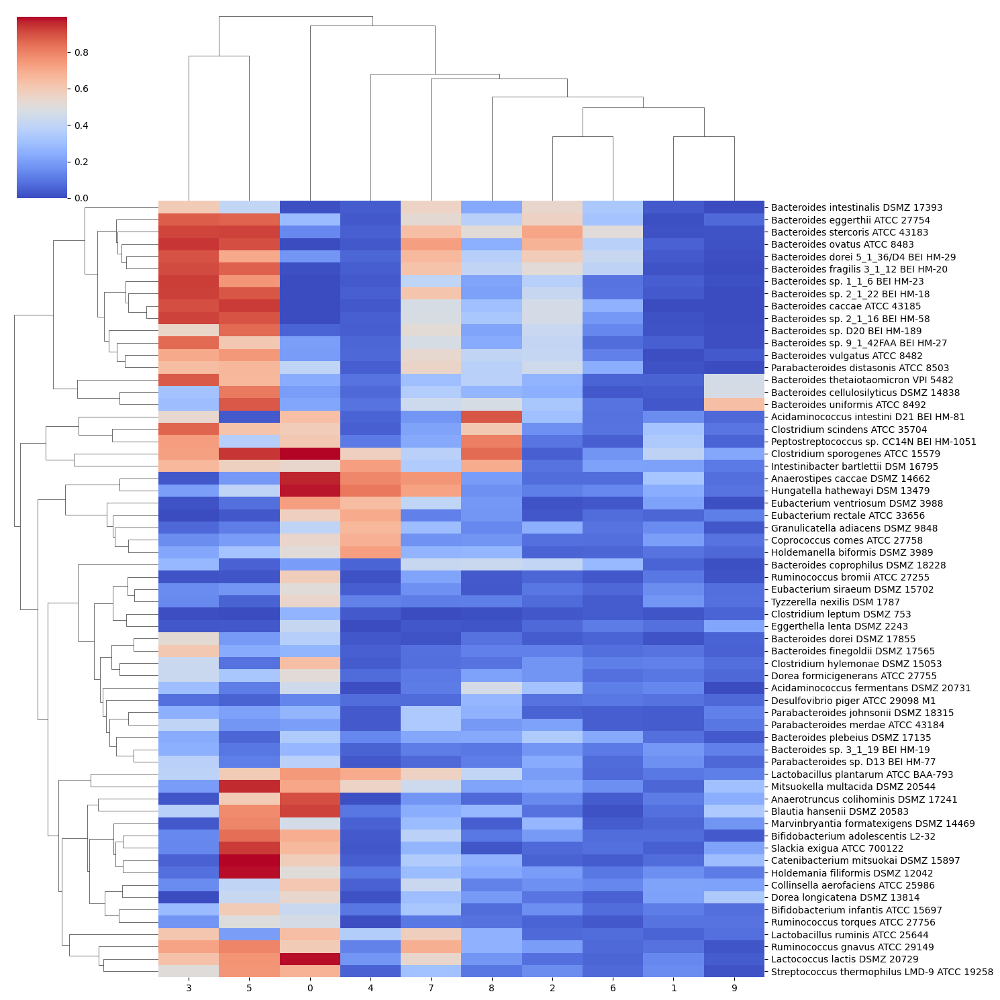

In [236]:
plt_ = sns.clustermap(df_speciesMetab_cluster.iloc[:, range(10)], \
                      cmap="coolwarm", figsize=(15, 15), \
                      metric=distance_metric, xticklabels=True, yticklabels=True)

In [209]:
df_metabs_clusters

,cluster_labels,cluster_counts,cluster_metab_IDs,cluser_metab_names
0,0,5,"[70, 72, 114, 125, 134]","[5'-METHYLTHIOADENOSINE, ADENINE, NICOTINAMIDE..."
1,1,25,"[1, 6, 7, 24, 48, 62, 64, 66, 78, 83, 86, 90, ...","[NICOTINIC ACID, 1-METHYL-HYDANTOIN, SUCCINIC ..."
2,2,30,"[0, 16, 25, 26, 28, 30, 37, 38, 40, 41, 43, 46...","[N-METHYL-ASPARTIC ACID_0, STEARIC ACID, CITRI..."
3,3,5,"[35, 80, 93, 95, 106]","[3-UREIDOPROPIONATE, ASPARAGINE, GLUTAMINE, GL..."
4,4,15,"[5, 13, 18, 19, 20, 22, 23, 45, 56, 57, 82, 85...","[BETA-ALANINE_0, OMEGA-HYDROXYDODECANOIC ACID,..."
...,...,...,...,...
93,93,1,[219],[SN-GLYCERO-3-PHOSPHOCHOLINE]
94,94,1,[220],[TRANEXAMIC ACID]
95,95,1,[221],[TRYPTOPHAN]
96,96,1,[222],[TYRAMINE]


## fit dynamic Ri for passage transition 1->2 and 2->3 for clustered metabs

In [237]:
date_ = '20230530'
n_repeats = 10
rand_seed = 7363
np.random.seed(rand_seed)
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]


num_metabs_clust = df_speciesMetab_cluster.shape[1]
df_speciesMetab_tmp = df_speciesMetab_cluster.copy()

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_compare_greedy_rm_metabs' + \
                                        f'_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2_2to3_notremove_metabs_greedy_pareto_clusteredMetabs'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_for_paper_Ri_fit_dynamic' + \
                                         f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'.pickle'))
Ri_dynamic_obj = {}
# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_cluster, \
#                                 df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                 df_speciesAbun_ratio_mdl, p_vec_new, \
#                                 file_save, num_passages=5, pass_rm=[1, 2, 3, 4])
pass_keep = np.arange(num_passages - 1)
id_keep = list(pass_keep) + list(pass_keep + num_passages - 1) + list(pass_keep + 2 * (num_passages - 1))
pass_rm = [2, 3, 4]
Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_tmp, \
                                df_speciesAbun_prev_mdl.iloc[:, id_keep], \
                                df_speciesAbun_next_mdl.iloc[:, id_keep], \
                                df_speciesAbun_ratio_mdl.iloc[:, id_keep], p_vec_new, \
                                file_save, num_passages=5, pass_rm=pass_rm, num_brep=3)
# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab, \
#                                       df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                       df_speciesAbun_ratio_mdl, p_vec_new, \
#                                       file_save, num_passages=5, pass_rm=[3, 4])
# Ri_dynamic_obj = fit_ss_Ri(df_speciesMetab, df_speciesAbun_mdl, \
#                                       df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                       df_speciesAbun_ratio_mdl, \
#                                       file_save, num_passages=6, pass_rm=[0, 1, 2])
# Ri_ss_obj =  fit_ss_Ri(df_speciesMetab_cluster, df_speciesAbun_mdl, \
#                        df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                        df_speciesAbun_ratio_mdl, \
#                        file_save=file_save, num_passages=6, pass_rm=pass_rm)

with open(file_save, "wb") as file_:
     pickle.dump(Ri_dynamic_obj, file_) 

count = 0, p_tmp = 0.001


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 1, p_tmp = 0.01


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 2, p_tmp = 0.05


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 3, p_tmp = 0.06


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 4, p_tmp = 0.07


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 5, p_tmp = 0.08


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 6, p_tmp = 0.09


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 7, p_tmp = 0.1


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 8, p_tmp = 0.125


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 9, p_tmp = 0.15


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 10, p_tmp = 0.175


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 11, p_tmp = 0.2


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 12, p_tmp = 0.3


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 13, p_tmp = 0.4


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 14, p_tmp = 0.5


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/Tar

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/Tar

count = 15, p_tmp = 0.55


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 16, p_tmp = 0.6


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 17, p_tmp = 0.65


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 18, p_tmp = 0.7


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

In [238]:
date_ = '20230530'
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
pass_rm = [0, 1, 2]
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_compare_greedy_rm_metabs' + \
                                        f'_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2_2to3_notremove_metabs_greedy_pareto_clusteredMetabs'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_for_paper_Ri_fit_dynamic' + \
                                         f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'.pickle'))

with open(file_save, "rb") as file_:
    Ri_dynamic_obj = pickle.load(file_) 
    
Ri_noMicrocosm_dynamicAll_fit_all = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_all']
Ri_noMicrocosm_dynamicAll_fit_avg = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_avg']
Ri_noMicrocosm_dynamicAll_fit_joint = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_joint']

In [239]:
num_metabs_clust = df_speciesMetab_cluster.shape[1]
df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
count_p = 7

RMSE_mat_full_tmp = np.zeros((num_passages - 1, 2))
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
Ri_fit = {0: Ri_avg}
# RMSE_sens_complete_full = np.zeros((num_passages - 1, 2))
sens_obj_all, RMSE_obj_all = \
    blindly_pred_abun_growth_without_inoc([p_vec_new[count_p]], df_speciesMetab_tmp, \
                                          df_speciesAbun_inoc, df_speciesAbun_mdl, \
                                          df_speciesAbun_prev_mdl, \
                                          df_speciesAbun_ratio_mdl, \
                                          Ri_fit, "dummy", "dummy", \
                                          "dummy", num_passages=6, num_iter=100, \
                                          thresh_zero=1e-8, Ri_ss=False, plot_=False, \
                                          save_data_obj=False, \
                                          return_sensitivity_ana=True)
for pass_ in range(num_passages - 1):
    RMSE_mat_full[pass_, 0] = RMSE_obj_all[pass_]["abundance"]
    RMSE_mat_full[pass_, 1] = RMSE_obj_all[pass_]["growth_ratio"]

In [241]:
RMSE_mat_full

array([[1.0110901 , 0.99058308],
       [1.36270352, 1.28152281],
       [1.85615815, 1.41433793],
       [2.09921914, 1.27247411],
       [2.3803446 , 1.28786355]])

In [242]:
num_metabs_rm = 200
metab_rm_list = []
RMSE_traj = -1 * np.ones((num_metabs_rm, num_passages - 1, 2))

date_ = '20230530'
n_repeats = 100
perc_metabs_keep = 0.9
rand_seed = 7363
np.random.seed(rand_seed)
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
count_p = 7
num_metabs_clust = df_speciesMetab_cluster.shape[1]
for l_ in range(num_metabs_rm):
    print(f'loop = {l_}')
    if l_ == 0:
        id_nnz_metabs = np.where(Ri_noMicrocosm_dynamicAll_fit_joint[count_p] > 0)[0]
    else:
        id_nnz_metabs = np.where(Ri_running > 0)[0]
    
    # Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_cluster, \
    #                                 df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
    #                                 df_speciesAbun_ratio_mdl, p_vec_new, \
    #                                 file_save, num_passages=5, pass_rm=[1, 2, 3, 4])
    RMSE_mat = -1 * np.ones((len(id_nnz_metabs), num_passages - 1, 2))
    nnz_metabs = np.zeros((len(id_nnz_metabs)))

    id_rm_vec_list = []
    for count_a, id_rm in enumerate(id_nnz_metabs):
        id_rm_list = metab_rm_list + [id_rm]
        id_rm_vec_list.append(id_rm_list)
    
    out = Parallel(n_jobs=10, verbose=100, pre_dispatch='1.5*n_jobs')(
        delayed(Ri_fit_func)(df_speciesMetab_cluster, id_rm_vec_list[sample_], \
                             df_speciesAbun_inoc, df_speciesAbun_mdl, \
                             df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
                             df_speciesAbun_ratio_mdl, p_vec_new[count_p], \
                             num_passages, num_bioRep=num_bioRep) for sample_ in range(len(id_nnz_metabs)))
    for count_a, d in enumerate(out):
        RMSE_mat[count_a, :, :] = d['RMSE'].copy()
    
#     for count_a, id_rm in enumerate(id_nnz_metabs):
# #         print(f'loop = {count_a}')
#         df_speciesMetab_tmp = df_speciesMetab.copy()
#         id_rm_list = metab_rm_list + [id_rm]
#         id_keep = list(set(range(num_metabs_clust)) - set(id_rm_list))
#         df_speciesMetab_tmp = df_speciesMetab_tmp.iloc[:, id_keep]
#         Ri_obj = fit_dynamic_Ri(df_speciesMetab_tmp, \
#                                 df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                 df_speciesAbun_ratio_mdl, [p_vec_new[count_p]], \
#                                 file_save, num_passages=5, pass_rm=[1, 2, 3, 4], \
#                                 save_data=False, verbose=False, method="linear", alpha=0, \
#                                 use_loo=False)
        
#         Ri_avg = Ri_obj['Ri_noMicrocosm_dynamicAll_fit_joint'][0].copy()
#         Ri_tmp = np.zeros((num_metabs_clust))
#         Ri_tmp[id_keep] = Ri_avg.copy()
# #         nnz_metabs[count_a] = len(np.where((Ri_avg > 0) & (Ri_tmp == 0))[0])


#         Ri_fit = {0: Ri_avg}
#         RMSE_sens_complete = np.zeros((num_passages - 1, 2))
#         sens_obj_all, RMSE_obj_all = \
#             blindly_pred_abun_growth_without_inoc([p_vec_new[count_p]], df_speciesMetab_tmp, \
#                                                   df_speciesAbun_inoc, df_speciesAbun_mdl, \
#                                                   df_speciesAbun_prev_mdl, \
#                                                   df_speciesAbun_ratio_mdl, \
#                                                   Ri_fit, "dummy", "dummy", \
#                                                   "dummy", num_passages=6, num_iter=100, \
#                                                   thresh_zero=1e-8, Ri_ss=False, plot_=False, \
#                                                   save_data_obj=False, \
#                                                   return_sensitivity_ana=True)
#         for pass_ in range(num_passages - 1):
#             RMSE_mat[count_a, pass_, 0] = RMSE_obj_all[pass_]["abundance"]
#             RMSE_mat[count_a, pass_, 1] = RMSE_obj_all[pass_]["growth_ratio"]
            
#     id_ = np.where(RMSE_mat[:, 0, 0] == np.min(RMSE_mat[:, 0, 0]))[0][0]
    if l_ > 0:
        obj_1 = np.hstack([RMSE_traj[l_ - 1, 0, 0], RMSE_mat[:, 0, 0]])
        obj_2 = np.hstack([RMSE_traj[l_ - 1, 1, 0], RMSE_mat[:, 1, 0]])
    else:
        obj_1 = np.hstack([np.inf, RMSE_mat[:, 0, 0]])
        obj_2 = np.hstack([np.inf, RMSE_mat[:, 1, 0]])
    id_ = pareto_optimal_solution(obj_1, obj_2)
    if (len(id_) > 1) or (len(id_) == 1 and id_[0] != 0):
        id_ = np.array(list(set(list(id_)) - set([0])))
        id_ = np.random.choice(id_, 1, replace=False)[0] - 1
        df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
        id_rm_list = metab_rm_list + [id_nnz_metabs[id_]]
        id_keep = list(set(range(num_metabs_clust)) - set(id_rm_list))
        df_speciesMetab_tmp = df_speciesMetab_tmp.iloc[:, id_keep]
        Ri_obj = fit_dynamic_Ri(df_speciesMetab_tmp, \
                                df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
                                df_speciesAbun_ratio_mdl, [p_vec_new[count_p]], \
                                file_save, num_passages=5, pass_rm=[1, 2, 3, 4], \
                                save_data=False, verbose=False, method="linear", alpha=0, \
                                use_loo=False)

        Ri_avg = Ri_obj['Ri_noMicrocosm_dynamicAll_fit_joint'][0].copy()
        Ri_running = np.zeros((num_metabs_clust))
        Ri_running[id_keep] = Ri_avg.copy()
        metab_rm_list += [id_nnz_metabs[id_]]
        RMSE_traj[l_, :, 0] = RMSE_mat[id_, :, 0].copy()
        RMSE_traj[l_, :, 1] = RMSE_mat[id_, :, 1].copy()
    else:
        metab_rm_list += [-1]
        if (len(id_) == 1 and id_[0] == 0 and l_ > 0):
            RMSE_traj[l_, :, 0] = RMSE_traj[l_ - 1, :, 0].copy()
            RMSE_traj[l_, :, 1] = RMSE_traj[l_ - 1, :, 1].copy()
    print(f'loop = {l_}, RMSE pass 1 = {RMSE_mat[id_, 0, 0]}')
    print(f'loop = {l_}, RMSE pass 2 = {RMSE_mat[id_, 1, 0]}')
    
save_obj = {"metab_rm_list" : metab_rm_list, \
            "RMSE_traj" : RMSE_traj}


save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_compare_greedy_rm_metabs' + \
                                        f'_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2_2to3_notremove_metabs_greedy_pareto_clusteredMetabs'))
save_file = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_greedily_remove_metabs_cluster' + \
                                         f'.pickle'))
with open(save_file, "wb") as file_:
     pickle.dump(save_obj, file_) 

loop = 0
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    4.3s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    6.0s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    6.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    6.2s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    7.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    8.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    9.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    9.5s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    9.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    9.7s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    9.7s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:   10.0s
[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:   10.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:   10.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:   10.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   11.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   12.3s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:   12.4s
[Parallel(n_jobs=10)]: Done  27 out of  40 | elapsed:   12.5s remaining:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  28 out of  40 | elapsed:   12.8s remaining:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 out of  40 | elapsed:   13.2s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  30 out of  40 | elapsed:   13.3s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 out of  40 | elapsed:   13.5s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  32 out of  40 | elapsed:   14.2s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  33 out of  40 | elapsed:   14.2s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  34 out of  40 | elapsed:   14.5s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  35 out of  40 | elapsed:   15.0s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  36 out of  40 | elapsed:   15.1s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  37 out of  40 | elapsed:   15.3s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  38 out of  40 | elapsed:   15.7s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  40 out of  40 | elapsed:   16.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  40 out of  40 | elapsed:   16.0s finished
loop = 0, RMSE pass 1 = 1.004654701921739
loop = 0, RMSE pass 2 = 1.354366856064681
loop = 1
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    4.7s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  22 out of  35 | elapsed:    8.0s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  23 out of  35 | elapsed:    8.9s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 out of  35 | elapsed:    9.6s remaining:    4.4s
[Parallel(n_jobs=10)]: Done  25 out of  35 | elapsed:    9.7s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  35 | elapsed:    9.9s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  27 out of  35 | elapsed:   11.2s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  28 out of  35 | elapsed:   11.8s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  29 out of  35 | elapsed:   11.8s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  30 out of  35 | elapsed:   11.8s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  31 out of  35 | elapsed:   11.8s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  32 out of  35 | elapsed:   11.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  33 out of  35 | elapsed:   11.8s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  35 out of  35 | elapsed:   12.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  35 out of  35 | elapsed:   12.2s finished
loop = 1, RMSE pass 1 = 0.9979752031981317
loop = 1, RMSE pass 2 = 1.375117107676475
loop = 2
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.9s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.0s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    6.7s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    6.7s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    6.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    8.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 out of  36 | elapsed:    9.2s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 out of  36 | elapsed:    9.5s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  25 out of  36 | elapsed:    9.5s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  36 | elapsed:    9.8s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  27 out of  36 | elapsed:   10.0s remaining:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 out of  36 | elapsed:   10.1s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  29 out of  36 | elapsed:   10.3s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  30 out of  36 | elapsed:   10.6s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  31 out of  36 | elapsed:   11.1s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  32 out of  36 | elapsed:   11.4s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  33 out of  36 | elapsed:   11.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  34 out of  36 | elapsed:   12.0s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  36 out of  36 | elapsed:   12.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  36 out of  36 | elapsed:   12.3s finished
loop = 2, RMSE pass 1 = 1.0048632728542046
loop = 2, RMSE pass 2 = 1.351660227120662
loop = 3
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    4.9s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.9s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    7.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    8.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.0s
[Parallel(n_jobs=10)]: Done  25 out of  38 | elapsed:   10.1s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  26 out of  38 | elapsed:   10.1s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  27 out of  38 | elapsed:   10.3s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 out of  38 | elapsed:   10.6s remaining:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 out of  38 | elapsed:   10.8s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  30 out of  38 | elapsed:   11.0s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  31 out of  38 | elapsed:   11.2s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  32 out of  38 | elapsed:   11.5s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  33 out of  38 | elapsed:   11.5s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  34 out of  38 | elapsed:   12.6s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  35 out of  38 | elapsed:   12.7s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  36 out of  38 | elapsed:   12.7s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  38 out of  38 | elapsed:   12.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  38 out of  38 | elapsed:   12.9s finished
loop = 3, RMSE pass 1 = 1.002155305318512
loop = 3, RMSE pass 2 = 1.2521302869022688
loop = 4
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.0s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.0s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    7.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  24 out of  37 | elapsed:    9.7s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  25 out of  37 | elapsed:    9.8s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  37 | elapsed:   10.1s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  27 out of  37 | elapsed:   10.2s remaining:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 out of  37 | elapsed:   10.4s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  29 out of  37 | elapsed:   10.4s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  30 out of  37 | elapsed:   10.9s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  31 out of  37 | elapsed:   11.5s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  32 out of  37 | elapsed:   11.6s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  33 out of  37 | elapsed:   11.6s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  34 out of  37 | elapsed:   12.4s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  35 out of  37 | elapsed:   12.5s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  37 out of  37 | elapsed:   12.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  37 out of  37 | elapsed:   12.6s finished
loop = 4, RMSE pass 1 = 0.9907765514909448
loop = 4, RMSE pass 2 = 1.2229820469024786
loop = 5
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.1s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.2s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.3s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    6.7s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    6.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    9.0s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.0s
[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:    9.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:    9.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  39 | elapsed:   10.0s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 out of  39 | elapsed:   10.3s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 out of  39 | elapsed:   10.7s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 out of  39 | elapsed:   11.1s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  30 out of  39 | elapsed:   11.1s remaining:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 out of  39 | elapsed:   11.6s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  32 out of  39 | elapsed:   11.7s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  33 out of  39 | elapsed:   11.8s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  34 out of  39 | elapsed:   11.9s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  35 out of  39 | elapsed:   12.4s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  36 out of  39 | elapsed:   13.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  37 out of  39 | elapsed:   13.2s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  39 out of  39 | elapsed:   13.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  39 out of  39 | elapsed:   13.7s finished
loop = 5, RMSE pass 1 = 1.005223398316373
loop = 5, RMSE pass 2 = 1.212498896870236
loop = 6
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.7s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.0s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.6s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    6.7s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.3s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    8.9s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:    9.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:    9.9s
[Parallel(n_jobs=10)]: Done  26 out of  39 | elapsed:   10.0s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 out of  39 | elapsed:   10.2s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  28 out of  39 | elapsed:   10.3s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 out of  39 | elapsed:   10.6s remaining:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 out of  39 | elapsed:   11.1s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  31 out of  39 | elapsed:   11.7s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  32 out of  39 | elapsed:   11.7s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  33 out of  39 | elapsed:   12.0s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  34 out of  39 | elapsed:   12.1s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  35 out of  39 | elapsed:   12.4s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  36 out of  39 | elapsed:   12.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  37 out of  39 | elapsed:   13.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  39 out of  39 | elapsed:   13.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  39 out of  39 | elapsed:   13.5s finished
loop = 6, RMSE pass 1 = 0.9983568979723104
loop = 6, RMSE pass 2 = 1.2009870341638365
loop = 7
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.1s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.0s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.8s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    8.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:    8.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:   10.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  39 | elapsed:   10.4s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  27 out of  39 | elapsed:   10.4s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 out of  39 | elapsed:   10.6s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 out of  39 | elapsed:   10.8s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  30 out of  39 | elapsed:   10.9s remaining:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 out of  39 | elapsed:   11.2s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  32 out of  39 | elapsed:   11.4s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  33 out of  39 | elapsed:   11.5s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  34 out of  39 | elapsed:   11.8s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  35 out of  39 | elapsed:   12.9s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  36 out of  39 | elapsed:   13.1s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  37 out of  39 | elapsed:   13.3s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  39 out of  39 | elapsed:   13.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  39 out of  39 | elapsed:   13.4s finished
loop = 7, RMSE pass 1 = 0.9973310923522937
loop = 7, RMSE pass 2 = 1.204498315748866
loop = 8
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.0s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.9s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.3s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    7.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    8.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:   10.1s
[Parallel(n_jobs=10)]: Done  25 out of  38 | elapsed:   10.3s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  26 out of  38 | elapsed:   10.3s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  27 out of  38 | elapsed:   10.5s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  28 out of  38 | elapsed:   10.6s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  29 out of  38 | elapsed:   10.7s remaining:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  30 out of  38 | elapsed:   10.8s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  31 out of  38 | elapsed:   10.9s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  32 out of  38 | elapsed:   11.0s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  33 out of  38 | elapsed:   11.1s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  34 out of  38 | elapsed:   12.6s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  35 out of  38 | elapsed:   12.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  36 out of  38 | elapsed:   12.9s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  38 out of  38 | elapsed:   13.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  38 out of  38 | elapsed:   13.0s finished
loop = 8, RMSE pass 1 = 0.9941656083270782
loop = 8, RMSE pass 2 = 1.1947350173394873
loop = 9
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.5s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.5s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.5s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    6.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.0s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.0s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    8.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:    9.7s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:    9.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  39 | elapsed:   10.1s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  27 out of  39 | elapsed:   10.3s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 out of  39 | elapsed:   10.3s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 out of  39 | elapsed:   10.8s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  30 out of  39 | elapsed:   10.9s remaining:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  31 out of  39 | elapsed:   11.1s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  32 out of  39 | elapsed:   11.1s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  33 out of  39 | elapsed:   11.9s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  34 out of  39 | elapsed:   12.8s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  35 out of  39 | elapsed:   13.0s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  36 out of  39 | elapsed:   13.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  37 out of  39 | elapsed:   13.4s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  39 out of  39 | elapsed:   13.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  39 out of  39 | elapsed:   13.6s finished
loop = 9, RMSE pass 1 = 0.993252058951493
loop = 9, RMSE pass 2 = 1.1955698086773845
loop = 10
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.7s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.5s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    6.9s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    6.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    7.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    8.1s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    8.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:    9.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 out of  38 | elapsed:   10.2s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  38 | elapsed:   10.5s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  27 out of  38 | elapsed:   10.5s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  28 out of  38 | elapsed:   10.7s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  29 out of  38 | elapsed:   10.7s remaining:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  30 out of  38 | elapsed:   10.8s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  31 out of  38 | elapsed:   11.1s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  32 out of  38 | elapsed:   11.2s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  33 out of  38 | elapsed:   11.4s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  34 out of  38 | elapsed:   12.1s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  35 out of  38 | elapsed:   12.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  36 out of  38 | elapsed:   12.9s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  38 out of  38 | elapsed:   13.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  38 out of  38 | elapsed:   13.2s finished
loop = 10, RMSE pass 1 = 0.9902492808706922
loop = 10, RMSE pass 2 = 1.2021981931666632
loop = 11
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.8s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.2s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    6.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    6.9s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.0s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.6s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    8.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    8.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:    9.1s
[Parallel(n_jobs=10)]: Done  25 out of  38 | elapsed:    9.2s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  38 | elapsed:    9.8s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  27 out of  38 | elapsed:    9.8s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 out of  38 | elapsed:   10.7s remaining:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  29 out of  38 | elapsed:   10.9s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  30 out of  38 | elapsed:   11.0s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  31 out of  38 | elapsed:   11.2s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  32 out of  38 | elapsed:   11.4s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  33 out of  38 | elapsed:   11.5s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  34 out of  38 | elapsed:   12.1s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  35 out of  38 | elapsed:   12.2s remaining:    1.0s
[Parallel(n_jobs=10)]: Done  36 out of  38 | elapsed:   12.6s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  38 out of  38 | elapsed:   13.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  38 out of  38 | elapsed:   13.0s finished
loop = 11, RMSE pass 1 = 0.9794935199400834
loop = 11, RMSE pass 2 = 1.243354410380122
loop = 12
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.6s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.1s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.1s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.1s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    6.1s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    8.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 out of  36 | elapsed:    9.1s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  24 out of  36 | elapsed:    9.2s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 out of  36 | elapsed:    9.4s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  26 out of  36 | elapsed:    9.5s remaining:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 out of  36 | elapsed:    9.8s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  28 out of  36 | elapsed:   10.0s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  29 out of  36 | elapsed:   10.6s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  30 out of  36 | elapsed:   10.7s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  31 out of  36 | elapsed:   10.8s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  32 out of  36 | elapsed:   11.5s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  33 out of  36 | elapsed:   11.7s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  34 out of  36 | elapsed:   11.9s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  36 out of  36 | elapsed:   12.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  36 out of  36 | elapsed:   12.0s finished
loop = 12, RMSE pass 1 = 0.9831073525303452
loop = 12, RMSE pass 2 = 1.2376520356657221
loop = 13
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s
[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    4.7s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.8s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    7.9s
[Parallel(n_jobs=10)]: Done  22 out of  35 | elapsed:    8.0s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 out of  35 | elapsed:    9.6s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  24 out of  35 | elapsed:    9.8s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 out of  35 | elapsed:    9.8s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  35 | elapsed:   10.3s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  27 out of  35 | elapsed:   10.6s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  28 out of  35 | elapsed:   10.6s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  29 out of  35 | elapsed:   11.1s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  30 out of  35 | elapsed:   11.1s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  31 out of  35 | elapsed:   11.3s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  32 out of  35 | elapsed:   11.4s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  33 out of  35 | elapsed:   11.9s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  35 out of  35 | elapsed:   12.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  35 out of  35 | elapsed:   12.3s finished
loop = 13, RMSE pass 1 = 0.9828799706179989
loop = 13, RMSE pass 2 = 1.2365437933291492
loop = 14
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.4s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.0s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.2s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    6.7s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    6.7s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    6.7s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    6.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 out of  34 | elapsed:    8.2s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 out of  34 | elapsed:    8.6s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 out of  34 | elapsed:    9.2s remaining:    4.4s
[Parallel(n_jobs=10)]: Done  24 out of  34 | elapsed:    9.3s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 out of  34 | elapsed:    9.5s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  26 out of  34 | elapsed:    9.9s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  27 out of  34 | elapsed:   10.0s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  28 out of  34 | elapsed:   10.1s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  29 out of  34 | elapsed:   10.4s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  30 out of  34 | elapsed:   10.5s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  31 out of  34 | elapsed:   10.7s remaining:    1.0s
[Parallel(n_jobs=10)]: Done  32 out of  34 | elapsed:   11.4s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  34 out of  34 | elapsed:   11.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  34 out of  34 | elapsed:   11.7s finished
loop = 14, RMSE pass 1 = 0.9828799706179989
loop = 14, RMSE pass 2 = 1.2365437933291492
loop = 15
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.2s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.2s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.0s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.2s
[Parallel(n_jobs=10)]: Done  22 out of  35 | elapsed:    8.3s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  23 out of  35 | elapsed:    8.3s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  24 out of  35 | elapsed:    8.5s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 out of  35 | elapsed:   10.0s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  26 out of  35 | elapsed:   10.0s remaining:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 out of  35 | elapsed:   10.3s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  28 out of  35 | elapsed:   10.4s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  29 out of  35 | elapsed:   10.7s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  30 out of  35 | elapsed:   10.8s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  31 out of  35 | elapsed:   10.8s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  32 out of  35 | elapsed:   11.1s remaining:    1.0s
[Parallel(n_jobs=10)]: Done  33 out of  35 | elapsed:   11.3s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  35 out of  35 | elapsed:   12.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  35 out of  35 | elapsed:   12.6s finished
loop = 15, RMSE pass 1 = 0.9828799706179989
loop = 15, RMSE pass 2 = 1.2365437933291492
loop = 16
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.8s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.7s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    6.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    6.9s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    8.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    9.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 out of  37 | elapsed:    9.3s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 out of  37 | elapsed:    9.8s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  37 | elapsed:   10.2s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  27 out of  37 | elapsed:   10.3s remaining:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  28 out of  37 | elapsed:   10.4s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  29 out of  37 | elapsed:   10.6s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  30 out of  37 | elapsed:   10.6s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  31 out of  37 | elapsed:   11.1s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  32 out of  37 | elapsed:   11.6s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  33 out of  37 | elapsed:   11.7s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  34 out of  37 | elapsed:   12.2s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  35 out of  37 | elapsed:   12.3s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  37 out of  37 | elapsed:   12.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  37 out of  37 | elapsed:   12.8s finished
loop = 16, RMSE pass 1 = 0.9828799706179989
loop = 16, RMSE pass 2 = 1.2365437933291492
loop = 17
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.8s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    5.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.8s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    6.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.6s
[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    7.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    8.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 out of  36 | elapsed:    8.8s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  24 out of  36 | elapsed:    8.9s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  25 out of  36 | elapsed:    9.7s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  36 | elapsed:   10.1s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  27 out of  36 | elapsed:   10.4s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  28 out of  36 | elapsed:   10.9s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  29 out of  36 | elapsed:   11.1s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  30 out of  36 | elapsed:   11.2s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  31 out of  36 | elapsed:   11.2s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  32 out of  36 | elapsed:   11.4s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  33 out of  36 | elapsed:   11.6s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  34 out of  36 | elapsed:   12.0s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  36 out of  36 | elapsed:   12.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  36 out of  36 | elapsed:   12.4s finished
loop = 17, RMSE pass 1 = 0.9813120594779576
loop = 17, RMSE pass 2 = 1.2184612472222007
loop = 18
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.9s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.9s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.1s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.1s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    6.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    6.4s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    8.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 out of  35 | elapsed:    8.7s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 out of  35 | elapsed:    9.3s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  24 out of  35 | elapsed:    9.4s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  25 out of  35 | elapsed:    9.4s remaining:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  26 out of  35 | elapsed:    9.6s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  27 out of  35 | elapsed:    9.9s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  28 out of  35 | elapsed:   10.0s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  29 out of  35 | elapsed:   10.3s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  30 out of  35 | elapsed:   10.5s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  31 out of  35 | elapsed:   10.9s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  32 out of  35 | elapsed:   11.5s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  33 out of  35 | elapsed:   11.7s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  35 out of  35 | elapsed:   12.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  35 out of  35 | elapsed:   12.1s finished
loop = 18, RMSE pass 1 = 0.9813120594779576
loop = 18, RMSE pass 2 = 1.2184612472222007
loop = 19
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.2s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.3s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.9s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 out of  34 | elapsed:    8.8s remaining:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 out of  34 | elapsed:    9.4s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 out of  34 | elapsed:    9.8s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 out of  34 | elapsed:   10.0s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  25 out of  34 | elapsed:   10.2s remaining:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  26 out of  34 | elapsed:   10.2s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  27 out of  34 | elapsed:   10.4s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  28 out of  34 | elapsed:   10.6s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  29 out of  34 | elapsed:   10.9s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  30 out of  34 | elapsed:   11.1s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  31 out of  34 | elapsed:   11.2s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  32 out of  34 | elapsed:   11.7s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  34 out of  34 | elapsed:   12.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  34 out of  34 | elapsed:   12.4s finished
loop = 19, RMSE pass 1 = 0.9813120594779576
loop = 19, RMSE pass 2 = 1.2184612472222007
loop = 20
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.1s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    4.6s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.0s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.7s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.7s
[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    7.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  20 out of  33 | elapsed:    7.9s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 out of  33 | elapsed:    8.2s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  22 out of  33 | elapsed:    8.2s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 out of  33 | elapsed:    9.1s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  24 out of  33 | elapsed:    9.4s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  25 out of  33 | elapsed:    9.4s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  26 out of  33 | elapsed:   11.4s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  27 out of  33 | elapsed:   11.5s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  28 out of  33 | elapsed:   11.6s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  29 out of  33 | elapsed:   11.6s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  30 out of  33 | elapsed:   11.7s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  31 out of  33 | elapsed:   11.8s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  33 out of  33 | elapsed:   12.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  33 out of  33 | elapsed:   12.4s finished
loop = 20, RMSE pass 1 = 0.9813120594779576
loop = 20, RMSE pass 2 = 1.2184612472222007
loop = 21
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.7s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.1s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.1s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    6.4s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    6.9s
[Parallel(n_jobs=10)]: Done  19 out of  32 | elapsed:    7.0s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  20 out of  32 | elapsed:    7.0s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 out of  32 | elapsed:    8.4s remaining:    4.4s
[Parallel(n_jobs=10)]: Done  22 out of  32 | elapsed:    8.5s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 out of  32 | elapsed:    8.8s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  24 out of  32 | elapsed:    9.1s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  25 out of  32 | elapsed:    9.6s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  26 out of  32 | elapsed:   10.1s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  27 out of  32 | elapsed:   10.2s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  28 out of  32 | elapsed:   10.3s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  29 out of  32 | elapsed:   10.3s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  30 out of  32 | elapsed:   10.5s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  32 out of  32 | elapsed:   10.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  32 out of  32 | elapsed:   10.8s finished
loop = 21, RMSE pass 1 = 0.9813120594779576
loop = 21, RMSE pass 2 = 1.2184612472222007
loop = 22
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.8s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.0s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.0s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.0s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.0s
[Parallel(n_jobs=10)]: Done  19 out of  32 | elapsed:    7.1s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  20 out of  32 | elapsed:    7.3s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 out of  32 | elapsed:    8.5s remaining:    4.4s
[Parallel(n_jobs=10)]: Done  22 out of  32 | elapsed:    8.6s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 out of  32 | elapsed:    9.3s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  24 out of  32 | elapsed:    9.5s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  25 out of  32 | elapsed:    9.6s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  26 out of  32 | elapsed:    9.6s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  27 out of  32 | elapsed:    9.6s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  28 out of  32 | elapsed:    9.9s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  29 out of  32 | elapsed:   10.4s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  30 out of  32 | elapsed:   10.5s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  32 out of  32 | elapsed:   11.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  32 out of  32 | elapsed:   11.3s finished
loop = 22, RMSE pass 1 = 0.9813120594779576
loop = 22, RMSE pass 2 = 1.2184612472222007
loop = 23
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    4.7s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.6s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.7s
[Parallel(n_jobs=10)]: Done  19 out of  32 | elapsed:    7.7s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  20 out of  32 | elapsed:    7.8s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  21 out of  32 | elapsed:    7.8s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  22 out of  32 | elapsed:    7.8s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  23 out of  32 | elapsed:    7.8s remaining:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  24 out of  32 | elapsed:    9.3s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  25 out of  32 | elapsed:    9.6s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  26 out of  32 | elapsed:    9.7s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  27 out of  32 | elapsed:   10.1s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  28 out of  32 | elapsed:   10.4s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  29 out of  32 | elapsed:   10.5s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  30 out of  32 | elapsed:   10.8s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  32 out of  32 | elapsed:   11.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  32 out of  32 | elapsed:   11.0s finished
loop = 23, RMSE pass 1 = 0.9813120594779576
loop = 23, RMSE pass 2 = 1.2184612472222007
loop = 24
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.8s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.4s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.4s
[Parallel(n_jobs=10)]: Done  18 out of  31 | elapsed:    7.4s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  19 out of  31 | elapsed:    7.6s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  20 out of  31 | elapsed:    7.6s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  21 out of  31 | elapsed:    7.7s remaining:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 out of  31 | elapsed:    8.8s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  23 out of  31 | elapsed:    8.9s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  24 out of  31 | elapsed:    9.4s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  25 out of  31 | elapsed:    9.6s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  26 out of  31 | elapsed:   10.0s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  27 out of  31 | elapsed:   10.1s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  28 out of  31 | elapsed:   10.4s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  29 out of  31 | elapsed:   10.8s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  31 out of  31 | elapsed:   10.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  31 out of  31 | elapsed:   10.9s finished
loop = 24, RMSE pass 1 = 0.9920745231031288
loop = 24, RMSE pass 2 = 1.2096514810431112
loop = 25
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    4.8s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.3s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 out of  31 | elapsed:    7.6s remaining:    5.5s
[Parallel(n_jobs=10)]: Done  19 out of  31 | elapsed:    7.7s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 out of  31 | elapsed:    7.8s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  21 out of  31 | elapsed:    7.8s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  22 out of  31 | elapsed:    7.9s remaining:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 out of  31 | elapsed:    8.5s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  24 out of  31 | elapsed:    9.7s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  25 out of  31 | elapsed:    9.8s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  26 out of  31 | elapsed:   10.4s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  27 out of  31 | elapsed:   10.4s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  28 out of  31 | elapsed:   10.6s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  29 out of  31 | elapsed:   10.6s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  31 out of  31 | elapsed:   11.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  31 out of  31 | elapsed:   11.1s finished
loop = 25, RMSE pass 1 = 0.9904345421042668
loop = 25, RMSE pass 2 = 1.32475936313364
loop = 26
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    4.7s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.9s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  17 out of  30 | elapsed:    7.1s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  18 out of  30 | elapsed:    7.3s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  19 out of  30 | elapsed:    7.5s remaining:    4.4s
[Parallel(n_jobs=10)]: Done  20 out of  30 | elapsed:    7.7s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  21 out of  30 | elapsed:    7.7s remaining:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 out of  30 | elapsed:    7.8s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  23 out of  30 | elapsed:    9.6s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  24 out of  30 | elapsed:    9.6s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  25 out of  30 | elapsed:    9.6s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  26 out of  30 | elapsed:    9.8s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  27 out of  30 | elapsed:    9.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  28 out of  30 | elapsed:   10.0s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  30 out of  30 | elapsed:   10.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  30 out of  30 | elapsed:   10.6s finished
loop = 26, RMSE pass 1 = 0.990434542104267
loop = 26, RMSE pass 2 = 1.3247593631336394
loop = 27
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    4.9s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 out of  32 | elapsed:    7.6s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  20 out of  32 | elapsed:    7.6s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  21 out of  32 | elapsed:    7.7s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  22 out of  32 | elapsed:    7.9s remaining:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  23 out of  32 | elapsed:    8.6s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  24 out of  32 | elapsed:    9.3s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  25 out of  32 | elapsed:    9.4s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  26 out of  32 | elapsed:    9.5s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  27 out of  32 | elapsed:   10.1s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  28 out of  32 | elapsed:   10.3s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  29 out of  32 | elapsed:   10.4s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  30 out of  32 | elapsed:   10.5s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  32 out of  32 | elapsed:   10.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  32 out of  32 | elapsed:   10.7s finished
loop = 27, RMSE pass 1 = 0.9894667131734558
loop = 27, RMSE pass 2 = 1.3233344984339992
loop = 28
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.1s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.2s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    6.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 out of  30 | elapsed:    6.6s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  18 out of  30 | elapsed:    6.6s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 out of  30 | elapsed:    7.0s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  20 out of  30 | elapsed:    7.0s remaining:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 out of  30 | elapsed:    8.5s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  22 out of  30 | elapsed:    8.6s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  23 out of  30 | elapsed:    9.0s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  24 out of  30 | elapsed:    9.0s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  25 out of  30 | elapsed:    9.4s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  26 out of  30 | elapsed:    9.4s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  27 out of  30 | elapsed:    9.6s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  28 out of  30 | elapsed:    9.6s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  30 out of  30 | elapsed:    9.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  30 out of  30 | elapsed:    9.8s finished
loop = 28, RMSE pass 1 = 1.0233767221731986
loop = 28, RMSE pass 2 = 1.3159940004456356
loop = 29
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    4.7s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    7.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 tasks      | elapsed:    7.7s
[Parallel(n_jobs=10)]: Done  19 out of  32 | elapsed:    7.7s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  20 out of  32 | elapsed:    7.7s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  21 out of  32 | elapsed:    7.8s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  22 out of  32 | elapsed:    7.8s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  23 out of  32 | elapsed:    7.8s remaining:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  24 out of  32 | elapsed:    8.0s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  25 out of  32 | elapsed:    9.6s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  26 out of  32 | elapsed:    9.7s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  27 out of  32 | elapsed:    9.8s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  28 out of  32 | elapsed:   10.3s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  29 out of  32 | elapsed:   10.4s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  30 out of  32 | elapsed:   10.4s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  32 out of  32 | elapsed:   10.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  32 out of  32 | elapsed:   10.9s finished
loop = 29, RMSE pass 1 = 1.0644321339836544
loop = 29, RMSE pass 2 = 1.2933451053697225
loop = 30
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.3s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.6s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.7s
[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    6.8s
[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    6.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 out of  31 | elapsed:    7.2s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  19 out of  31 | elapsed:    7.3s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 out of  31 | elapsed:    7.7s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  21 out of  31 | elapsed:    7.8s remaining:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 out of  31 | elapsed:    8.8s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  23 out of  31 | elapsed:    9.0s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  24 out of  31 | elapsed:    9.0s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  25 out of  31 | elapsed:    9.4s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  26 out of  31 | elapsed:    9.7s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  27 out of  31 | elapsed:    9.9s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  28 out of  31 | elapsed:   10.1s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  29 out of  31 | elapsed:   10.4s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  31 out of  31 | elapsed:   10.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  31 out of  31 | elapsed:   10.6s finished
loop = 30, RMSE pass 1 = 1.0561580537115391
loop = 30, RMSE pass 2 = 1.487043310063237
loop = 31
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.6s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.6s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  18 out of  31 | elapsed:    7.2s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  19 out of  31 | elapsed:    7.2s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  20 out of  31 | elapsed:    7.2s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 out of  31 | elapsed:    7.8s remaining:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  22 out of  31 | elapsed:    8.2s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  23 out of  31 | elapsed:    8.5s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  24 out of  31 | elapsed:    8.6s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  25 out of  31 | elapsed:    9.3s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  26 out of  31 | elapsed:    9.3s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  27 out of  31 | elapsed:    9.9s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  28 out of  31 | elapsed:   10.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  29 out of  31 | elapsed:   10.0s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  31 out of  31 | elapsed:   10.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  31 out of  31 | elapsed:   10.2s finished
loop = 31, RMSE pass 1 = 1.0561580537115391
loop = 31, RMSE pass 2 = 1.487043310063237
loop = 32
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.1s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.7s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.3s
[Parallel(n_jobs=10)]: Done  16 out of  29 | elapsed:    6.3s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 out of  29 | elapsed:    7.2s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  18 out of  29 | elapsed:    7.2s remaining:    4.4s
[Parallel(n_jobs=10)]: Done  19 out of  29 | elapsed:    7.2s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  20 out of  29 | elapsed:    7.3s remaining:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 out of  29 | elapsed:    7.6s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  22 out of  29 | elapsed:    7.7s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  23 out of  29 | elapsed:    8.3s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  24 out of  29 | elapsed:    8.8s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  25 out of  29 | elapsed:    8.9s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  26 out of  29 | elapsed:    9.2s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  27 out of  29 | elapsed:    9.5s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  29 out of  29 | elapsed:    9.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  29 out of  29 | elapsed:    9.7s finished
loop = 32, RMSE pass 1 = 1.1014378217169962
loop = 32, RMSE pass 2 = 1.4096603067550926
loop = 33
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.3s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    5.8s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 tasks      | elapsed:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 out of  30 | elapsed:    6.8s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  18 out of  30 | elapsed:    7.0s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 out of  30 | elapsed:    7.0s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  20 out of  30 | elapsed:    7.2s remaining:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 out of  30 | elapsed:    7.7s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  22 out of  30 | elapsed:    8.2s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  23 out of  30 | elapsed:    8.3s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  24 out of  30 | elapsed:    8.9s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  25 out of  30 | elapsed:    9.6s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  26 out of  30 | elapsed:    9.6s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  27 out of  30 | elapsed:    9.7s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  28 out of  30 | elapsed:   10.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  30 out of  30 | elapsed:   10.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  30 out of  30 | elapsed:   10.3s finished
loop = 33, RMSE pass 1 = 1.095227456159944
loop = 33, RMSE pass 2 = 1.3906361880989129
loop = 34
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    4.7s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.9s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 out of  29 | elapsed:    7.2s remaining:    5.8s
[Parallel(n_jobs=10)]: Done  17 out of  29 | elapsed:    7.3s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 out of  29 | elapsed:    7.4s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  19 out of  29 | elapsed:    7.4s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 out of  29 | elapsed:    7.7s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  21 out of  29 | elapsed:    7.8s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  22 out of  29 | elapsed:    8.0s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  23 out of  29 | elapsed:    9.1s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  24 out of  29 | elapsed:    9.3s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  25 out of  29 | elapsed:    9.6s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  26 out of  29 | elapsed:    9.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  27 out of  29 | elapsed:    9.8s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  29 out of  29 | elapsed:   10.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  29 out of  29 | elapsed:   10.0s finished
loop = 34, RMSE pass 1 = 1.0935707827824463
loop = 34, RMSE pass 2 = 1.3957640863600553
loop = 35
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.3s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    7.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 out of  29 | elapsed:    7.5s remaining:    6.1s
[Parallel(n_jobs=10)]: Done  17 out of  29 | elapsed:    7.6s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  18 out of  29 | elapsed:    7.6s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  19 out of  29 | elapsed:    7.7s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  20 out of  29 | elapsed:    7.7s remaining:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  21 out of  29 | elapsed:    8.3s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  22 out of  29 | elapsed:    8.4s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  23 out of  29 | elapsed:    9.4s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  24 out of  29 | elapsed:   10.3s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  25 out of  29 | elapsed:   10.5s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  26 out of  29 | elapsed:   10.7s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  27 out of  29 | elapsed:   10.9s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  29 out of  29 | elapsed:   11.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  29 out of  29 | elapsed:   11.1s finished
loop = 35, RMSE pass 1 = 1.0888692051144782
loop = 35, RMSE pass 2 = 1.4206984807183431
loop = 36
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    6.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.4s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    6.8s
[Parallel(n_jobs=10)]: Done  15 tasks      | elapsed:    6.9s
[Parallel(n_jobs=10)]: Done  16 out of  29 | elapsed:    7.0s remaining:    5.7s
[Parallel(n_jobs=10)]: Done  17 out of  29 | elapsed:    7.0s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  18 out of  29 | elapsed:    7.6s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  19 out of  29 | elapsed:    7.6s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  20 out of  29 | elapsed:    7.6s remaining:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  21 out of  29 | elapsed:    9.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  22 out of  29 | elapsed:    9.5s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  23 out of  29 | elapsed:    9.6s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  24 out of  29 | elapsed:    9.9s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  25 out of  29 | elapsed:   10.0s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  26 out of  29 | elapsed:   10.1s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  27 out of  29 | elapsed:   10.2s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  29 out of  29 | elapsed:   10.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  29 out of  29 | elapsed:   10.5s finished
loop = 36, RMSE pass 1 = 1.086748309007401
loop = 36, RMSE pass 2 = 1.4110272900827767
loop = 37
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.3s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    6.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  15 out of  28 | elapsed:    7.2s remaining:    6.2s
[Parallel(n_jobs=10)]: Done  16 out of  28 | elapsed:    7.2s remaining:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  17 out of  28 | elapsed:    7.4s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  18 out of  28 | elapsed:    7.5s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  19 out of  28 | elapsed:    7.7s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  20 out of  28 | elapsed:    7.8s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  21 out of  28 | elapsed:    9.0s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  22 out of  28 | elapsed:    9.1s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  23 out of  28 | elapsed:    9.1s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  24 out of  28 | elapsed:   10.0s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  25 out of  28 | elapsed:   10.0s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  26 out of  28 | elapsed:   10.0s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  28 out of  28 | elapsed:   10.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  28 out of  28 | elapsed:   10.2s finished
loop = 37, RMSE pass 1 = 1.0867483090074008
loop = 37, RMSE pass 2 = 1.4110272900827767
loop = 38
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.9s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    6.0s
[Parallel(n_jobs=10)]: Done  13 out of  26 | elapsed:    6.1s remaining:    6.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  14 out of  26 | elapsed:    6.2s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  26 | elapsed:    6.5s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 out of  26 | elapsed:    7.0s remaining:    4.4s
[Parallel(n_jobs=10)]: Done  17 out of  26 | elapsed:    7.0s remaining:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  18 out of  26 | elapsed:    7.3s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  19 out of  26 | elapsed:    7.6s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  20 out of  26 | elapsed:    7.7s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  21 out of  26 | elapsed:    8.8s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  22 out of  26 | elapsed:    8.8s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  23 out of  26 | elapsed:    8.8s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  24 out of  26 | elapsed:    8.8s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  26 out of  26 | elapsed:    9.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  26 out of  26 | elapsed:    9.6s finished
loop = 38, RMSE pass 1 = 1.0867483090074008
loop = 38, RMSE pass 2 = 1.4110272900827767
loop = 39
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  26 | elapsed:    5.7s remaining:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  26 | elapsed:    6.2s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  26 | elapsed:    6.5s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 out of  26 | elapsed:    6.8s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  17 out of  26 | elapsed:    6.8s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  18 out of  26 | elapsed:    6.8s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  19 out of  26 | elapsed:    6.9s remaining:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  20 out of  26 | elapsed:    7.3s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  21 out of  26 | elapsed:    7.9s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  22 out of  26 | elapsed:    8.1s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  23 out of  26 | elapsed:    8.3s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  24 out of  26 | elapsed:    8.8s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  26 out of  26 | elapsed:    9.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  26 out of  26 | elapsed:    9.1s finished
loop = 39, RMSE pass 1 = 1.0850076135915685
loop = 39, RMSE pass 2 = 1.4117978248277125
loop = 40
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    4.9s
[Parallel(n_jobs=10)]: Done  12 out of  25 | elapsed:    5.0s remaining:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  25 | elapsed:    5.2s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  25 | elapsed:    6.0s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  25 | elapsed:    6.5s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 out of  25 | elapsed:    6.8s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  17 out of  25 | elapsed:    7.1s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  18 out of  25 | elapsed:    7.2s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  19 out of  25 | elapsed:    7.3s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  20 out of  25 | elapsed:    7.3s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  21 out of  25 | elapsed:    7.5s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  22 out of  25 | elapsed:    7.6s remaining:    1.0s
[Parallel(n_jobs=10)]: Done  23 out of  25 | elapsed:    8.2s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  25 out of  25 | elapsed:    8.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  25 out of  25 | elapsed:    8.9s finished
loop = 40, RMSE pass 1 = 1.0832495794631223
loop = 40, RMSE pass 2 = 1.4107836665454947
loop = 41
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  25 | elapsed:    5.2s remaining:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  25 | elapsed:    5.9s remaining:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  25 | elapsed:    6.3s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  25 | elapsed:    6.5s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  16 out of  25 | elapsed:    6.5s remaining:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 out of  25 | elapsed:    7.1s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  18 out of  25 | elapsed:    7.2s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  19 out of  25 | elapsed:    7.3s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  20 out of  25 | elapsed:    7.4s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  21 out of  25 | elapsed:    7.4s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  22 out of  25 | elapsed:    8.2s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  23 out of  25 | elapsed:    8.3s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  25 out of  25 | elapsed:    8.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  25 out of  25 | elapsed:    8.8s finished
loop = 41, RMSE pass 1 = 1.0751503617868277
loop = 41, RMSE pass 2 = 1.4301412119175294
loop = 42
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    4.7s remaining:    5.5s
[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    4.7s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.4s remaining:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    7.1s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    7.2s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    7.2s remaining:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.4s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.6s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.6s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.7s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    7.7s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    7.7s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    9.3s finished
loop = 42, RMSE pass 1 = 1.092212228175397
loop = 42, RMSE pass 2 = 1.413978395257006
loop = 43
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  25 | elapsed:    5.4s remaining:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  25 | elapsed:    5.6s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  25 | elapsed:    6.0s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  25 | elapsed:    6.5s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 out of  25 | elapsed:    6.8s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  17 out of  25 | elapsed:    7.0s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  18 out of  25 | elapsed:    7.1s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  19 out of  25 | elapsed:    7.2s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  20 out of  25 | elapsed:    7.4s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  21 out of  25 | elapsed:    7.6s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  22 out of  25 | elapsed:    7.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  23 out of  25 | elapsed:    8.3s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  25 out of  25 | elapsed:    8.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  25 out of  25 | elapsed:    8.8s finished
loop = 43, RMSE pass 1 = 1.1088514423371945
loop = 43, RMSE pass 2 = 1.4136954678312992
loop = 44
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.6s remaining:    6.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.9s remaining:    5.9s
[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    6.1s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.4s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.4s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    6.5s remaining:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    7.0s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    7.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    7.3s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    7.4s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    8.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.4s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.8s finished
loop = 44, RMSE pass 1 = 1.1043266687512332
loop = 44, RMSE pass 2 = 1.4541987948147608
loop = 45
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  24 | elapsed:    5.4s remaining:    6.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  24 | elapsed:    5.9s remaining:    5.9s
[Parallel(n_jobs=10)]: Done  13 out of  24 | elapsed:    5.9s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  14 out of  24 | elapsed:    6.0s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  15 out of  24 | elapsed:    6.1s remaining:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  16 out of  24 | elapsed:    6.2s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  17 out of  24 | elapsed:    6.2s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  18 out of  24 | elapsed:    6.4s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  19 out of  24 | elapsed:    6.6s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  20 out of  24 | elapsed:    6.9s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  21 out of  24 | elapsed:    8.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  22 out of  24 | elapsed:    8.2s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  24 out of  24 | elapsed:    8.3s finished
loop = 45, RMSE pass 1 = 1.1043061564976566
loop = 45, RMSE pass 2 = 1.4550637743709718
loop = 46
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  10 out of  23 | elapsed:    4.0s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  23 | elapsed:    4.6s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  23 | elapsed:    4.9s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  23 | elapsed:    5.4s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  23 | elapsed:    6.5s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  15 out of  23 | elapsed:    6.6s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  16 out of  23 | elapsed:    6.9s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  17 out of  23 | elapsed:    7.0s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  18 out of  23 | elapsed:    7.1s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  19 out of  23 | elapsed:    7.2s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  20 out of  23 | elapsed:    7.3s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  21 out of  23 | elapsed:    7.4s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  23 out of  23 | elapsed:    8.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  23 out of  23 | elapsed:    8.2s finished
loop = 46, RMSE pass 1 = 1.1043061564976566
loop = 46, RMSE pass 2 = 1.4550637743709718
loop = 47
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.9s remaining:    5.6s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.9s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.7s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.9s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    4.9s remaining:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.6s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.9s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.0s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.1s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.2s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.2s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.4s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s finished
loop = 47, RMSE pass 1 = [1.13397832]
loop = 47, RMSE pass 2 = [1.48035617]
loop = 48
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.5s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.7s remaining:    5.7s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.8s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.9s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.0s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.1s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.2s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.4s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.6s remaining:    1.0s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.6s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.2s finished
loop = 48, RMSE pass 1 = [1.13397832]
loop = 48, RMSE pass 2 = [1.48035617]
loop = 49
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.2s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.9s remaining:    5.6s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.9s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.7s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.4s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.2s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.2s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.8s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.9s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.0s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.0s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.1s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.2s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s finished
loop = 49, RMSE pass 1 = [1.13397832]
loop = 49, RMSE pass 2 = [1.48035617]
loop = 50
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.6s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.6s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.2s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.9s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.0s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.1s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.1s remaining:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.1s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.2s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.5s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.7s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.8s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.3s finished
loop = 50, RMSE pass 1 = [1.13397832]
loop = 50, RMSE pass 2 = [1.48035617]
loop = 51
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.9s remaining:    5.7s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    4.0s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.8s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.2s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.4s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.5s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.0s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.1s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.3s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.4s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.4s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s finished
loop = 51, RMSE pass 1 = [1.13397832]
loop = 51, RMSE pass 2 = [1.48035617]
loop = 52
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.5s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.6s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.2s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.5s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.7s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.8s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    5.9s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.1s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.3s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.8s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.0s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s finished
loop = 52, RMSE pass 1 = [1.13397832]
loop = 52, RMSE pass 2 = [1.48035617]
loop = 53
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.8s remaining:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.8s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.9s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.5s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.2s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.4s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.0s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.1s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.1s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.3s finished
loop = 53, RMSE pass 1 = [1.13397832]
loop = 53, RMSE pass 2 = [1.48035617]
loop = 54
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.4s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.4s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.2s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.7s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.9s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.1s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.4s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.5s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.6s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.7s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.7s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.0s finished
loop = 54, RMSE pass 1 = [1.13397832]
loop = 54, RMSE pass 2 = [1.48035617]
loop = 55
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.3s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.7s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.0s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.1s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.1s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.5s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.8s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.0s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.0s finished
loop = 55, RMSE pass 1 = [1.13397832]
loop = 55, RMSE pass 2 = [1.48035617]
loop = 56
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.6s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.6s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.1s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.5s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.8s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.2s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.4s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.5s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.6s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.7s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.8s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s finished
loop = 56, RMSE pass 1 = [1.13397832]
loop = 56, RMSE pass 2 = [1.48035617]
loop = 57
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.8s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.7s remaining:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    6.1s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.2s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.4s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.6s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.8s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.9s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.9s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.9s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.5s finished
loop = 57, RMSE pass 1 = [1.13397832]
loop = 57, RMSE pass 2 = [1.48035617]
loop = 58
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    4.0s remaining:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    4.1s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.7s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.1s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.5s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.7s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.9s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.0s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.1s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.3s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.3s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.3s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s finished
loop = 58, RMSE pass 1 = [1.13397832]
loop = 58, RMSE pass 2 = [1.48035617]
loop = 59
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.8s remaining:    5.8s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.8s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.0s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.1s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.2s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.2s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.3s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.6s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.6s remaining:    1.0s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.0s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.2s finished
loop = 59, RMSE pass 1 = [1.13397832]
loop = 59, RMSE pass 2 = [1.48035617]
loop = 60
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.9s remaining:    5.6s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    4.0s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.9s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.1s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.2s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.2s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.7s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.7s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.8s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.9s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.4s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s finished
loop = 60, RMSE pass 1 = [1.13397832]
loop = 60, RMSE pass 2 = [1.48035617]
loop = 61
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.9s remaining:    5.7s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    4.0s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.0s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.0s remaining:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.5s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    7.1s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.3s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.4s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.4s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.5s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.5s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s finished
loop = 61, RMSE pass 1 = [1.13397832]
loop = 61, RMSE pass 2 = [1.48035617]
loop = 62
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.4s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.5s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.8s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.2s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.4s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.6s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.6s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.7s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s finished
loop = 62, RMSE pass 1 = [1.13397832]
loop = 62, RMSE pass 2 = [1.48035617]
loop = 63
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.5s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.8s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.8s remaining:    5.8s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.9s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.0s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.2s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.3s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.4s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.6s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.8s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.1s finished
loop = 63, RMSE pass 1 = [1.13397832]
loop = 63, RMSE pass 2 = [1.48035617]
loop = 64
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.9s remaining:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.9s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.1s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.7s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.9s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.9s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.2s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.2s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.5s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.9s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.1s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.2s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.0s finished
loop = 64, RMSE pass 1 = [1.13397832]
loop = 64, RMSE pass 2 = [1.48035617]
loop = 65
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.5s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.5s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.2s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.6s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.9s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.3s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.5s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.7s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.9s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.9s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.0s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s finished
loop = 65, RMSE pass 1 = [1.13397832]
loop = 65, RMSE pass 2 = [1.48035617]
loop = 66
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.8s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.4s remaining:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.9s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.0s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.3s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.6s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.6s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.7s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.1s finished
loop = 66, RMSE pass 1 = [1.13397832]
loop = 66, RMSE pass 2 = [1.48035617]
loop = 67
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.8s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.1s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.4s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.5s remaining:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.3s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.3s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.9s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s finished
loop = 67, RMSE pass 1 = [1.13397832]
loop = 67, RMSE pass 2 = [1.48035617]
loop = 68
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.6s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.4s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.4s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.0s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.4s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.5s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.6s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.6s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.7s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s finished
loop = 68, RMSE pass 1 = [1.13397832]
loop = 68, RMSE pass 2 = [1.48035617]
loop = 69
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.1s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.6s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.8s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.0s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.8s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.8s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.9s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s finished
loop = 69, RMSE pass 1 = [1.13397832]
loop = 69, RMSE pass 2 = [1.48035617]
loop = 70
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.8s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.9s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.0s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.2s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.2s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.2s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.4s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.1s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.1s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.1s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.2s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.3s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.4s finished
loop = 70, RMSE pass 1 = [1.13397832]
loop = 70, RMSE pass 2 = [1.48035617]
loop = 71
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.3s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.4s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.8s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.0s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.5s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.7s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.9s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s finished
loop = 71, RMSE pass 1 = [1.13397832]
loop = 71, RMSE pass 2 = [1.48035617]
loop = 72
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.2s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.3s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.8s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.1s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.2s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.4s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.7s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.7s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.0s finished
loop = 72, RMSE pass 1 = [1.13397832]
loop = 72, RMSE pass 2 = [1.48035617]
loop = 73
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.8s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.5s remaining:    5.5s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.6s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.6s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.1s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.3s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.6s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.8s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.0s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s finished
loop = 73, RMSE pass 1 = [1.13397832]
loop = 73, RMSE pass 2 = [1.48035617]
loop = 74
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.5s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.8s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.3s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.5s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.7s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.9s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.1s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.2s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.5s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.7s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.7s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.8s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s finished
loop = 74, RMSE pass 1 = [1.13397832]
loop = 74, RMSE pass 2 = [1.48035617]
loop = 75
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.9s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.7s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.9s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    7.0s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    7.0s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.1s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.2s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.2s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.2s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.3s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.4s finished
loop = 75, RMSE pass 1 = [1.13397832]
loop = 75, RMSE pass 2 = [1.48035617]
loop = 76
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.6s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.1s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.1s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.3s remaining:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.3s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.5s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.7s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.8s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.8s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.0s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.4s finished
loop = 76, RMSE pass 1 = [1.13397832]
loop = 76, RMSE pass 2 = [1.48035617]
loop = 77
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.8s remaining:    5.5s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.9s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.3s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.7s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.0s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    7.1s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    7.3s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.3s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.5s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.5s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.6s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.6s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.5s finished
loop = 77, RMSE pass 1 = [1.13397832]
loop = 77, RMSE pass 2 = [1.48035617]
loop = 78
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.8s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.4s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.5s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.7s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.1s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.2s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.6s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.6s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.6s remaining:    1.0s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s finished
loop = 78, RMSE pass 1 = [1.13397832]
loop = 78, RMSE pass 2 = [1.48035617]
loop = 79
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.8s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.8s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.7s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.5s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.7s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.7s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.8s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.8s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.0s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.3s finished
loop = 79, RMSE pass 1 = [1.13397832]
loop = 79, RMSE pass 2 = [1.48035617]
loop = 80
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.5s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.5s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.6s remaining:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.8s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.9s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.0s remaining:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.1s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.2s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.4s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.8s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.0s finished
loop = 80, RMSE pass 1 = [1.13397832]
loop = 80, RMSE pass 2 = [1.48035617]
loop = 81
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.5s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.5s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.5s remaining:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.8s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.0s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.0s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.1s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.1s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.5s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.5s remaining:    1.0s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.8s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.0s finished
loop = 81, RMSE pass 1 = [1.13397832]
loop = 81, RMSE pass 2 = [1.48035617]
loop = 82
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.9s remaining:    5.7s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    4.0s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.9s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.3s remaining:    4.4s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.3s remaining:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.6s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.3s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.7s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.0s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.1s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.2s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.3s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s finished
loop = 82, RMSE pass 1 = [1.13397832]
loop = 82, RMSE pass 2 = [1.48035617]
loop = 83
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.5s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.6s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.1s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.7s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.9s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.9s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.0s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.1s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.2s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.8s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.0s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s finished
loop = 83, RMSE pass 1 = [1.13397832]
loop = 83, RMSE pass 2 = [1.48035617]
loop = 84
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.6s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.6s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.4s remaining:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.9s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.0s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.2s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.2s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.3s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.3s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.5s remaining:    1.0s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.8s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.1s finished
loop = 84, RMSE pass 1 = [1.13397832]
loop = 84, RMSE pass 2 = [1.48035617]
loop = 85
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.6s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.6s remaining:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.8s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.1s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.1s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.2s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.2s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.2s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.4s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.0s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.2s finished
loop = 85, RMSE pass 1 = [1.13397832]
loop = 85, RMSE pass 2 = [1.48035617]
loop = 86
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    4.0s remaining:    5.8s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    4.0s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.6s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.7s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.9s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.9s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    7.0s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.0s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.2s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.4s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.5s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.6s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s finished
loop = 86, RMSE pass 1 = [1.13397832]
loop = 86, RMSE pass 2 = [1.48035617]
loop = 87
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.6s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.6s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.1s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.2s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.4s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.7s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.1s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.0s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.1s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.1s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s finished
loop = 87, RMSE pass 1 = [1.13397832]
loop = 87, RMSE pass 2 = [1.48035617]
loop = 88
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.6s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.4s
[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.2s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.9s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.9s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.1s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.2s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.3s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.3s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.4s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.7s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.7s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.1s finished
loop = 88, RMSE pass 1 = [1.13397832]
loop = 88, RMSE pass 2 = [1.48035617]
loop = 89
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.8s remaining:    5.5s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.8s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.9s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.0s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.8s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.1s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.4s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.6s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.9s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.0s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.2s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.2s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s finished
loop = 89, RMSE pass 1 = [1.13397832]
loop = 89, RMSE pass 2 = [1.48035617]
loop = 90
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.6s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.0s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.1s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.0s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.1s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.6s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.8s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.0s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.1s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.4s finished
loop = 90, RMSE pass 1 = [1.13397832]
loop = 90, RMSE pass 2 = [1.48035617]
loop = 91
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.9s remaining:    5.6s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.9s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.9s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.0s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.3s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.6s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.1s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.2s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.2s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.3s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.3s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.4s finished
loop = 91, RMSE pass 1 = [1.13397832]
loop = 91, RMSE pass 2 = [1.48035617]
loop = 92
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.6s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.3s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.4s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.0s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.1s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.3s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.4s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.0s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.0s finished
loop = 92, RMSE pass 1 = [1.13397832]
loop = 92, RMSE pass 2 = [1.48035617]
loop = 93
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.9s remaining:    5.7s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.9s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.7s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.0s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.9s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.3s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    7.0s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.3s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.4s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.4s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.5s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.5s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s finished
loop = 93, RMSE pass 1 = [1.13397832]
loop = 93, RMSE pass 2 = [1.48035617]
loop = 94
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.6s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.3s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.5s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.7s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.8s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.0s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.2s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.4s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.5s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.7s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.8s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s finished
loop = 94, RMSE pass 1 = [1.13397832]
loop = 94, RMSE pass 2 = [1.48035617]
loop = 95
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.9s remaining:    5.7s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.9s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.9s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.9s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.4s remaining:    4.4s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.7s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.7s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.8s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.8s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.9s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.2s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.3s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s finished
loop = 95, RMSE pass 1 = [1.13397832]
loop = 95, RMSE pass 2 = [1.48035617]
loop = 96
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.5s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.8s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.3s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.8s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.9s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.9s remaining:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.2s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.5s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.7s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.9s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.9s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.1s finished
loop = 96, RMSE pass 1 = [1.13397832]
loop = 96, RMSE pass 2 = [1.48035617]
loop = 97
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.6s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.4s
[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.5s remaining:    5.5s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.6s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.8s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.1s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.2s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.4s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.5s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.6s remaining:    1.0s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.8s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.0s finished
loop = 97, RMSE pass 1 = [1.13397832]
loop = 97, RMSE pass 2 = [1.48035617]
loop = 98
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    4.1s remaining:    5.9s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    4.1s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.6s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.6s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.2s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.5s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    7.0s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.0s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.4s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.4s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.6s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.6s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s finished
loop = 98, RMSE pass 1 = [1.13397832]
loop = 98, RMSE pass 2 = [1.48035617]
loop = 99
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.5s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.6s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.2s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.6s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.6s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.1s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.1s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.4s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.5s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.6s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.7s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.8s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s finished
loop = 99, RMSE pass 1 = [1.13397832]
loop = 99, RMSE pass 2 = [1.48035617]
loop = 100
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.9s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.9s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.0s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.3s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.4s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.6s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.9s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.1s finished
loop = 100, RMSE pass 1 = [1.13397832]
loop = 100, RMSE pass 2 = [1.48035617]
loop = 101
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.8s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.9s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.4s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.6s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.9s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.5s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.6s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.6s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.7s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s finished
loop = 101, RMSE pass 1 = [1.13397832]
loop = 101, RMSE pass 2 = [1.48035617]
loop = 102
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.5s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.0s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.7s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.0s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.2s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.6s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.9s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.3s finished
loop = 102, RMSE pass 1 = [1.13397832]
loop = 102, RMSE pass 2 = [1.48035617]
loop = 103
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    4.0s remaining:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    4.1s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.6s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.8s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.2s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.9s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    7.0s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.2s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.4s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.5s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.5s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.6s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s finished
loop = 103, RMSE pass 1 = [1.13397832]
loop = 103, RMSE pass 2 = [1.48035617]
loop = 104
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.5s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.1s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.3s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.7s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.8s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.2s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.4s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.5s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.7s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.9s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s finished
loop = 104, RMSE pass 1 = [1.13397832]
loop = 104, RMSE pass 2 = [1.48035617]
loop = 105
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.8s remaining:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.9s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.8s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.1s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.5s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.2s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.4s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.6s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.7s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.1s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.1s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.2s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s finished
loop = 105, RMSE pass 1 = [1.13397832]
loop = 105, RMSE pass 2 = [1.48035617]
loop = 106
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.6s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.6s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.2s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.3s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.9s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.2s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.3s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.3s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.4s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.7s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.9s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s finished
loop = 106, RMSE pass 1 = [1.13397832]
loop = 106, RMSE pass 2 = [1.48035617]
loop = 107
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.9s remaining:    5.7s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.9s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.7s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.9s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.2s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.5s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.6s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.0s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.2s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.3s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.3s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.3s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s finished
loop = 107, RMSE pass 1 = [1.13397832]
loop = 107, RMSE pass 2 = [1.48035617]
loop = 108
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    4.0s remaining:    5.7s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    4.0s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.7s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.8s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    4.8s remaining:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.2s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.5s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.0s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.1s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.2s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.2s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.2s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.4s finished
loop = 108, RMSE pass 1 = [1.13397832]
loop = 108, RMSE pass 2 = [1.48035617]
loop = 109
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.8s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.8s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.3s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.4s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.6s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.8s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.0s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.6s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.7s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.8s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.1s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.2s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s finished
loop = 109, RMSE pass 1 = [1.13397832]
loop = 109, RMSE pass 2 = [1.48035617]
loop = 110
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.2s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.5s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.1s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.2s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.7s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.1s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.1s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.4s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.4s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.5s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s finished
loop = 110, RMSE pass 1 = [1.13397832]
loop = 110, RMSE pass 2 = [1.48035617]
loop = 111
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.8s remaining:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    4.1s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.0s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.4s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.5s remaining:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.3s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.8s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.2s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.2s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.3s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.4s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.4s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s finished
loop = 111, RMSE pass 1 = [1.13397832]
loop = 111, RMSE pass 2 = [1.48035617]
loop = 112
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.9s remaining:    5.6s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    4.0s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.7s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.9s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.0s remaining:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.4s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.8s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.9s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.0s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.1s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.2s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.3s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s finished
loop = 112, RMSE pass 1 = [1.13397832]
loop = 112, RMSE pass 2 = [1.48035617]
loop = 113
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.6s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.1s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.2s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.4s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.7s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.8s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.8s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.9s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.1s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.1s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.3s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.4s finished
loop = 113, RMSE pass 1 = [1.13397832]
loop = 113, RMSE pass 2 = [1.48035617]
loop = 114
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.6s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.1s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.1s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.7s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.9s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    7.1s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.1s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.1s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.2s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.2s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.3s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.3s finished
loop = 114, RMSE pass 1 = [1.13397832]
loop = 114, RMSE pass 2 = [1.48035617]
loop = 115
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.4s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.5s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.9s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.9s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.0s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.2s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.4s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.5s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.6s remaining:    1.0s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.7s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s finished
loop = 115, RMSE pass 1 = [1.13397832]
loop = 115, RMSE pass 2 = [1.48035617]
loop = 116
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.8s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.2s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.4s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.8s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.9s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.1s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.2s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.4s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.9s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s finished
loop = 116, RMSE pass 1 = [1.13397832]
loop = 116, RMSE pass 2 = [1.48035617]
loop = 117
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.9s remaining:    5.7s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    4.0s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.9s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.1s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.5s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.6s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.0s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.1s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.2s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.3s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.3s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s finished
loop = 117, RMSE pass 1 = [1.13397832]
loop = 117, RMSE pass 2 = [1.48035617]
loop = 118
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.8s remaining:    5.5s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.8s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.7s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.8s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    4.8s remaining:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.8s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.0s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.0s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.2s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.3s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.3s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.4s finished
loop = 118, RMSE pass 1 = [1.13397832]
loop = 118, RMSE pass 2 = [1.48035617]
loop = 119
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.8s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.9s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.0s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.5s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.6s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.3s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.0s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.1s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.1s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.3s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.4s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.4s finished
loop = 119, RMSE pass 1 = [1.13397832]
loop = 119, RMSE pass 2 = [1.48035617]
loop = 120
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.6s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.9s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.1s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.8s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.1s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.1s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.5s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.5s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.5s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.7s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.1s finished
loop = 120, RMSE pass 1 = [1.13397832]
loop = 120, RMSE pass 2 = [1.48035617]
loop = 121
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.5s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.6s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.5s remaining:    5.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.9s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.9s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.0s remaining:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.4s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.6s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.6s remaining:    1.0s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.8s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.1s finished
loop = 121, RMSE pass 1 = [1.13397832]
loop = 121, RMSE pass 2 = [1.48035617]
loop = 122
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.6s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.6s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.3s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.3s remaining:    4.4s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.4s remaining:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.5s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.8s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.0s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.0s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.1s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s finished
loop = 122, RMSE pass 1 = [1.13397832]
loop = 122, RMSE pass 2 = [1.48035617]
loop = 123
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    4.0s remaining:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    4.1s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.9s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.1s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.4s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    7.1s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.2s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.3s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.5s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.5s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.5s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s finished
loop = 123, RMSE pass 1 = [1.13397832]
loop = 123, RMSE pass 2 = [1.48035617]
loop = 124
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.8s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.9s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.4s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.7s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.1s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.1s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.2s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.7s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.9s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s finished
loop = 124, RMSE pass 1 = [1.13397832]
loop = 124, RMSE pass 2 = [1.48035617]
loop = 125
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.2s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.4s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.7s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.8s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.0s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.5s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.7s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.9s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s finished
loop = 125, RMSE pass 1 = [1.13397832]
loop = 125, RMSE pass 2 = [1.48035617]
loop = 126
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.8s remaining:    5.5s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.8s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.3s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.4s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.5s remaining:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.1s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.7s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.7s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.0s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s finished
loop = 126, RMSE pass 1 = [1.13397832]
loop = 126, RMSE pass 2 = [1.48035617]
loop = 127
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.5s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.6s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.3s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.5s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.0s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.2s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.4s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.4s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.6s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.7s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.7s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.9s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.1s finished
loop = 127, RMSE pass 1 = [1.13397832]
loop = 127, RMSE pass 2 = [1.48035617]
loop = 128
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.8s remaining:    5.5s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.9s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.1s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.5s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.6s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.7s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.9s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.9s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.0s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.1s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s finished
loop = 128, RMSE pass 1 = [1.13397832]
loop = 128, RMSE pass 2 = [1.48035617]
loop = 129
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.2s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.5s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.6s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.9s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.1s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.1s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.5s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.6s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.9s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s finished
loop = 129, RMSE pass 1 = [1.13397832]
loop = 129, RMSE pass 2 = [1.48035617]
loop = 130
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.4s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.5s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.7s remaining:    5.7s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.9s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.1s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.1s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.1s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.3s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.4s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.4s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.4s remaining:    1.0s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.8s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.1s finished
loop = 130, RMSE pass 1 = [1.13397832]
loop = 130, RMSE pass 2 = [1.48035617]
loop = 131
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.5s remaining:    5.5s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.5s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.8s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.9s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.1s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.1s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.2s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.6s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.8s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s finished
loop = 131, RMSE pass 1 = [1.13397832]
loop = 131, RMSE pass 2 = [1.48035617]
loop = 132
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.9s remaining:    5.6s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.9s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.8s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.0s remaining:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.4s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.9s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.0s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.0s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.2s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.3s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.3s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s finished
loop = 132, RMSE pass 1 = [1.13397832]
loop = 132, RMSE pass 2 = [1.48035617]
loop = 133
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.6s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.6s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.5s remaining:    5.5s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.6s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.7s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.8s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.2s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.4s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.5s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.5s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.6s remaining:    1.0s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.7s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s finished
loop = 133, RMSE pass 1 = [1.13397832]
loop = 133, RMSE pass 2 = [1.48035617]
loop = 134
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.9s remaining:    5.6s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.9s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.9s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.9s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.5s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.2s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.7s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.7s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.9s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s finished
loop = 134, RMSE pass 1 = [1.13397832]
loop = 134, RMSE pass 2 = [1.48035617]
loop = 135
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.8s remaining:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    6.1s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.2s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.2s remaining:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.3s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.4s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.6s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.4s finished
loop = 135, RMSE pass 1 = [1.13397832]
loop = 135, RMSE pass 2 = [1.48035617]
loop = 136
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    4.0s remaining:    5.7s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    4.0s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.5s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.6s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.2s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.9s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.9s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.9s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.3s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.6s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.6s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.6s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s finished
loop = 136, RMSE pass 1 = [1.13397832]
loop = 136, RMSE pass 2 = [1.48035617]
loop = 137
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.6s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.6s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.0s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.7s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.7s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.1s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.1s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.2s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.3s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.4s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.7s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.9s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s finished
loop = 137, RMSE pass 1 = [1.13397832]
loop = 137, RMSE pass 2 = [1.48035617]
loop = 138
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.8s remaining:    5.5s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.9s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.7s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.9s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    4.9s remaining:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.8s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.3s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.8s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.0s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.0s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.2s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.4s finished
loop = 138, RMSE pass 1 = [1.13397832]
loop = 138, RMSE pass 2 = [1.48035617]
loop = 139
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.5s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.5s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.3s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.4s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.7s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.9s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.3s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.4s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.5s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.5s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.7s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.8s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s finished
loop = 139, RMSE pass 1 = [1.13397832]
loop = 139, RMSE pass 2 = [1.48035617]
loop = 140
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    4.0s remaining:    5.8s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    4.0s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.7s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.9s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.3s remaining:    4.4s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.6s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.6s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.1s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.2s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.4s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.4s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.5s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s finished
loop = 140, RMSE pass 1 = [1.13397832]
loop = 140, RMSE pass 2 = [1.48035617]
loop = 141
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.3s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.3s remaining:    4.4s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.3s remaining:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.3s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.4s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.6s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.6s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.8s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.2s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s finished
loop = 141, RMSE pass 1 = [1.13397832]
loop = 141, RMSE pass 2 = [1.48035617]
loop = 142
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.5s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.5s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.9s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.9s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.1s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.3s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.4s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.4s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.5s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.5s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.7s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.8s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s finished
loop = 142, RMSE pass 1 = [1.13397832]
loop = 142, RMSE pass 2 = [1.48035617]
loop = 143
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    4.0s remaining:    5.8s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    4.0s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.0s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    7.0s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    7.1s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    7.2s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.2s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.3s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.5s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.5s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.6s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.0s finished
loop = 143, RMSE pass 1 = [1.13397832]
loop = 143, RMSE pass 2 = [1.48035617]
loop = 144
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    4.0s remaining:    5.8s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    4.0s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.2s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.2s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.1s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.4s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    7.1s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.5s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.5s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.5s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.6s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.7s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s finished
loop = 144, RMSE pass 1 = [1.13397832]
loop = 144, RMSE pass 2 = [1.48035617]
loop = 145
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.6s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.6s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.4s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.5s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.8s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.0s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.8s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.9s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.0s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s finished
loop = 145, RMSE pass 1 = [1.13397832]
loop = 145, RMSE pass 2 = [1.48035617]
loop = 146
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.5s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.5s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.2s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.5s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.8s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.9s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.0s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.6s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.6s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.7s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.7s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s finished
loop = 146, RMSE pass 1 = [1.13397832]
loop = 146, RMSE pass 2 = [1.48035617]
loop = 147
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.9s remaining:    5.6s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.9s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.9s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.3s remaining:    4.4s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.5s remaining:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.5s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.3s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.0s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.1s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.1s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.1s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.2s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s finished
loop = 147, RMSE pass 1 = [1.13397832]
loop = 147, RMSE pass 2 = [1.48035617]
loop = 148
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.9s remaining:    5.7s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.9s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.7s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.8s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    4.8s remaining:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.6s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.7s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.0s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.0s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.1s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.3s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.5s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s finished
loop = 148, RMSE pass 1 = [1.13397832]
loop = 148, RMSE pass 2 = [1.48035617]
loop = 149
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.9s remaining:    5.6s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.9s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.9s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.9s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    4.9s remaining:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.8s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    7.0s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.1s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.1s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.2s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.2s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.3s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s finished
loop = 149, RMSE pass 1 = [1.13397832]
loop = 149, RMSE pass 2 = [1.48035617]
loop = 150
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.6s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.0s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.8s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.8s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.2s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.3s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.7s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.9s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.0s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.1s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.1s finished
loop = 150, RMSE pass 1 = [1.13397832]
loop = 150, RMSE pass 2 = [1.48035617]
loop = 151
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.8s remaining:    5.6s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.9s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.1s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.2s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.8s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.3s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.6s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.7s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.9s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.1s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.1s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.2s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s finished
loop = 151, RMSE pass 1 = [1.13397832]
loop = 151, RMSE pass 2 = [1.48035617]
loop = 152
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.6s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.8s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.3s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.8s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.9s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.0s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.1s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.6s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.7s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.9s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.0s finished
loop = 152, RMSE pass 1 = [1.13397832]
loop = 152, RMSE pass 2 = [1.48035617]
loop = 153
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.6s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.2s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.5s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.8s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.9s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.0s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.5s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.7s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.7s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.8s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s finished
loop = 153, RMSE pass 1 = [1.13397832]
loop = 153, RMSE pass 2 = [1.48035617]
loop = 154
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.4s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.5s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.2s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.5s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.6s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.2s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.3s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.7s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.8s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.0s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s finished
loop = 154, RMSE pass 1 = [1.13397832]
loop = 154, RMSE pass 2 = [1.48035617]
loop = 155
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.9s remaining:    5.7s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.9s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.8s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    4.9s remaining:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    7.0s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.1s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.1s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.1s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.4s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.5s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s finished
loop = 155, RMSE pass 1 = [1.13397832]
loop = 155, RMSE pass 2 = [1.48035617]
loop = 156
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.8s remaining:    5.5s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.8s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.0s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.3s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.0s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.1s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.2s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.4s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.5s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.9s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.0s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s finished
loop = 156, RMSE pass 1 = [1.13397832]
loop = 156, RMSE pass 2 = [1.48035617]
loop = 157
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.6s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.3s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    6.1s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.2s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.3s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.3s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.3s remaining:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.4s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.5s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.5s remaining:    1.0s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.0s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.4s finished
loop = 157, RMSE pass 1 = [1.13397832]
loop = 157, RMSE pass 2 = [1.48035617]
loop = 158
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.6s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.4s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.6s remaining:    4.6s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.6s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.7s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.6s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.6s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.7s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.7s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.0s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s finished
loop = 158, RMSE pass 1 = [1.13397832]
loop = 158, RMSE pass 2 = [1.48035617]
loop = 159
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.8s remaining:    5.5s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.8s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.2s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.7s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.8s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.9s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.0s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.4s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.6s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.6s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.0s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.0s finished
loop = 159, RMSE pass 1 = [1.13397832]
loop = 159, RMSE pass 2 = [1.48035617]
loop = 160
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.9s remaining:    5.7s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    4.0s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.7s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.8s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.5s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.6s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.8s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.1s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.1s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.4s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.5s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.5s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s finished
loop = 160, RMSE pass 1 = [1.13397832]
loop = 160, RMSE pass 2 = [1.48035617]
loop = 161
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.5s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.6s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.3s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.4s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.9s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.1s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.2s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.5s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.6s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.7s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.7s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s finished
loop = 161, RMSE pass 1 = [1.13397832]
loop = 161, RMSE pass 2 = [1.48035617]
loop = 162
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    4.0s remaining:    5.7s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    4.0s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.7s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.7s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.4s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.9s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.9s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.0s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.2s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.3s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.3s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.5s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s finished
loop = 162, RMSE pass 1 = [1.13397832]
loop = 162, RMSE pass 2 = [1.48035617]
loop = 163
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.6s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.2s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.6s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.7s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.2s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.3s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.3s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.4s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.0s finished
loop = 163, RMSE pass 1 = [1.13397832]
loop = 163, RMSE pass 2 = [1.48035617]
loop = 164
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.9s remaining:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    4.0s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.9s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.2s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.6s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.4s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.7s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.9s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.9s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.2s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.4s finished
loop = 164, RMSE pass 1 = [1.13397832]
loop = 164, RMSE pass 2 = [1.48035617]
loop = 165
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.8s remaining:    5.5s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.8s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.4s remaining:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.6s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.6s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.6s remaining:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    5.9s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.4s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.5s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.5s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.9s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s finished
loop = 165, RMSE pass 1 = [1.13397832]
loop = 165, RMSE pass 2 = [1.48035617]
loop = 166
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.9s remaining:    5.7s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    4.0s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.0s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.1s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.7s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    7.1s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.2s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.3s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.3s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.3s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.5s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s finished
loop = 166, RMSE pass 1 = [1.13397832]
loop = 166, RMSE pass 2 = [1.48035617]
loop = 167
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.1s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.9s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.0s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.1s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.2s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.3s remaining:    1.8s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.3s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.0s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.2s finished
loop = 167, RMSE pass 1 = [1.13397832]
loop = 167, RMSE pass 2 = [1.48035617]
loop = 168
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.9s remaining:    5.7s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    4.0s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.7s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.9s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    4.9s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.5s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    7.1s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.1s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.6s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.6s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.6s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.7s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.0s finished
loop = 168, RMSE pass 1 = [1.13397832]
loop = 168, RMSE pass 2 = [1.48035617]
loop = 169
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.5s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.6s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.2s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.6s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.7s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.9s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.3s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.8s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.9s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.0s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.2s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.3s finished
loop = 169, RMSE pass 1 = [1.13397832]
loop = 169, RMSE pass 2 = [1.48035617]
loop = 170
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.9s remaining:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    4.0s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.2s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.4s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.9s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.4s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.4s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.9s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.1s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.1s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.4s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s finished
loop = 170, RMSE pass 1 = [1.13397832]
loop = 170, RMSE pass 2 = [1.48035617]
loop = 171
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.9s remaining:    5.6s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.9s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.8s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.1s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.4s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.5s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.6s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.6s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.9s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.1s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.2s finished
loop = 171, RMSE pass 1 = [1.13397832]
loop = 171, RMSE pass 2 = [1.48035617]
loop = 172
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.6s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.9s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.2s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.4s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.9s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.9s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.5s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.6s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.7s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.8s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.1s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.3s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s finished
loop = 172, RMSE pass 1 = [1.13397832]
loop = 172, RMSE pass 2 = [1.48035617]
loop = 173
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.4s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.5s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.3s remaining:    5.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.9s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.9s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.1s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.2s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.4s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.4s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.5s remaining:    1.0s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.5s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.2s finished
loop = 173, RMSE pass 1 = [1.13397832]
loop = 173, RMSE pass 2 = [1.48035617]
loop = 174
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.8s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.1s remaining:    5.1s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.3s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.2s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.4s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.5s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.6s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.8s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.9s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.0s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s finished
loop = 174, RMSE pass 1 = [1.13397832]
loop = 174, RMSE pass 2 = [1.48035617]
loop = 175
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.6s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.1s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.6s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.7s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.8s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.0s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.6s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.0s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.0s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.0s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s finished
loop = 175, RMSE pass 1 = [1.13397832]
loop = 175, RMSE pass 2 = [1.48035617]
loop = 176
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.8s remaining:    5.5s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.9s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.0s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.1s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.3s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.3s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.7s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.0s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.0s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.1s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.3s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.3s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.3s finished
loop = 176, RMSE pass 1 = [1.13397832]
loop = 176, RMSE pass 2 = [1.48035617]
loop = 177
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.9s remaining:    5.6s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.9s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.0s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.0s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.4s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.4s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.8s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.8s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.9s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.1s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.3s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.3s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.4s finished
loop = 177, RMSE pass 1 = [1.13397832]
loop = 177, RMSE pass 2 = [1.48035617]
loop = 178
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.7s remaining:    5.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    6.0s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.1s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.1s remaining:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.7s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.8s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.8s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.9s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.0s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.2s finished
loop = 178, RMSE pass 1 = [1.13397832]
loop = 178, RMSE pass 2 = [1.48035617]
loop = 179
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.3s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.3s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.6s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.8s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.3s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.4s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.5s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.6s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.7s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.9s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s finished
loop = 179, RMSE pass 1 = [1.13397832]
loop = 179, RMSE pass 2 = [1.48035617]
loop = 180
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.8s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.4s remaining:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.6s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.6s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.4s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.5s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.6s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.6s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.7s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.8s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.0s finished
loop = 180, RMSE pass 1 = [1.13397832]
loop = 180, RMSE pass 2 = [1.48035617]
loop = 181
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.5s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.6s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.2s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.4s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.7s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.9s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.3s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.3s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.6s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.7s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.8s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s finished
loop = 181, RMSE pass 1 = [1.13397832]
loop = 181, RMSE pass 2 = [1.48035617]
loop = 182
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.9s remaining:    5.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    4.0s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.0s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.0s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.3s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.9s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    7.1s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.2s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.3s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.3s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.4s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.4s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s finished
loop = 182, RMSE pass 1 = [1.13397832]
loop = 182, RMSE pass 2 = [1.48035617]
loop = 183
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.8s remaining:    5.5s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.9s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.9s remaining:    4.9s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.9s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.2s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.6s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.8s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.0s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.1s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.1s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.2s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.3s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.4s finished
loop = 183, RMSE pass 1 = [1.13397832]
loop = 183, RMSE pass 2 = [1.48035617]
loop = 184
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.5s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.6s remaining:    4.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.2s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    6.0s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.0s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.1s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.1s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.1s remaining:    2.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.3s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.4s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.6s remaining:    1.0s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.0s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.2s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.2s finished
loop = 184, RMSE pass 1 = [1.13397832]
loop = 184, RMSE pass 2 = [1.48035617]
loop = 185
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.9s remaining:    5.6s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.9s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.0s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.3s remaining:    4.4s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.3s remaining:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.1s remaining:    3.5s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.3s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.5s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.6s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.8s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.1s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s finished
loop = 185, RMSE pass 1 = [1.13397832]
loop = 185, RMSE pass 2 = [1.48035617]
loop = 186
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.4s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.5s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.9s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.0s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.2s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.5s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.5s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.9s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s finished
loop = 186, RMSE pass 1 = [1.13397832]
loop = 186, RMSE pass 2 = [1.48035617]
loop = 187
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.8s remaining:    5.5s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.9s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.2s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.3s remaining:    4.4s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.4s remaining:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.4s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.7s remaining:    3.1s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.8s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.9s remaining:    2.0s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.1s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.2s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.3s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s finished
loop = 187, RMSE pass 1 = [1.13397832]
loop = 187, RMSE pass 2 = [1.48035617]
loop = 188
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.6s remaining:    5.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.8s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.2s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.4s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.9s remaining:    4.1s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.2s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.3s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.4s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.4s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.9s finished
loop = 188, RMSE pass 1 = [1.13397832]
loop = 188, RMSE pass 2 = [1.48035617]
loop = 189
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    4.0s remaining:    5.8s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    4.1s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.5s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.7s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.3s remaining:    4.3s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.9s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    7.0s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.3s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.4s remaining:    2.2s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.6s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.6s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.6s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s finished
loop = 189, RMSE pass 1 = [1.13397832]
loop = 189, RMSE pass 2 = [1.48035617]
loop = 190
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.9s remaining:    4.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.2s remaining:    5.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.4s remaining:    4.5s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.6s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.7s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.4s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.8s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.0s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.0s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.2s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.3s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s finished
loop = 190, RMSE pass 1 = [1.13397832]
loop = 190, RMSE pass 2 = [1.48035617]
loop = 191
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.8s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.8s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.7s remaining:    5.7s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.7s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.8s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.9s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.0s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.1s remaining:    2.3s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.4s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.4s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.9s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.9s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.0s finished
loop = 191, RMSE pass 1 = [1.13397832]
loop = 191, RMSE pass 2 = [1.48035617]
loop = 192
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    4.0s remaining:    5.7s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    4.0s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.8s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    4.9s remaining:    3.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.9s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.9s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.0s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.1s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.2s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.4s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.4s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s finished
loop = 192, RMSE pass 1 = [1.13397832]
loop = 192, RMSE pass 2 = [1.48035617]
loop = 193
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.4s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.8s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.6s remaining:    5.6s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.7s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.8s remaining:    4.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.1s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.4s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.5s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.6s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.6s remaining:    1.0s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    8.3s finished
loop = 193, RMSE pass 1 = [1.13397832]
loop = 193, RMSE pass 2 = [1.48035617]
loop = 194
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.9s remaining:    5.6s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    4.0s remaining:    4.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.9s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.2s remaining:    3.6s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.8s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.9s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.0s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.1s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.2s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.3s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.4s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.5s finished
loop = 194, RMSE pass 1 = [1.13397832]
loop = 194, RMSE pass 2 = [1.48035617]
loop = 195
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.5s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.6s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.1s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.3s remaining:    5.3s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.4s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.8s remaining:    4.0s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.0s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.0s remaining:    2.8s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.5s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.5s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.8s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.1s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.1s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.8s finished
loop = 195, RMSE pass 1 = [1.13397832]
loop = 195, RMSE pass 2 = [1.48035617]
loop = 196
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.8s remaining:    5.5s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.9s remaining:    4.6s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.0s remaining:    5.0s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.0s remaining:    4.2s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.7s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.9s remaining:    3.4s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.4s remaining:    3.0s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.6s remaining:    2.5s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.0s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.0s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.1s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.2s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s finished
loop = 196, RMSE pass 1 = [1.13397832]
loop = 196, RMSE pass 2 = [1.48035617]
loop = 197
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.7s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    4.0s remaining:    5.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    4.1s remaining:    4.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.7s remaining:    4.7s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.7s remaining:    3.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    6.0s remaining:    4.2s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.7s remaining:    3.8s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    7.0s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.1s remaining:    2.6s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.3s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.6s remaining:    1.7s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.6s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.6s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.6s finished
loop = 197, RMSE pass 1 = [1.13397832]
loop = 197, RMSE pass 2 = [1.48035617]
loop = 198
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.4s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.9s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.2s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.3s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.7s remaining:    5.4s
[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.8s remaining:    4.5s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    4.8s remaining:    4.8s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    4.9s remaining:    4.1s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.3s remaining:    3.7s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    6.8s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    7.0s remaining:    3.3s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    7.1s remaining:    2.7s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    7.1s remaining:    2.1s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    7.1s remaining:    1.6s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    7.2s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    7.2s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.4s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.4s finished
loop = 198, RMSE pass 1 = [1.13397832]
loop = 198, RMSE pass 2 = [1.48035617]
loop = 199
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    2.8s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    3.5s
[Parallel(n_jobs=10)]: Done   9 out of  22 | elapsed:    3.5s remaining:    5.0s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

[Parallel(n_jobs=10)]: Done  10 out of  22 | elapsed:    3.7s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  11 out of  22 | elapsed:    5.2s remaining:    5.2s
[Parallel(n_jobs=10)]: Done  12 out of  22 | elapsed:    5.3s remaining:    4.4s


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


[Parallel(n_jobs=10)]: Done  13 out of  22 | elapsed:    5.6s remaining:    3.9s
[Parallel(n_jobs=10)]: Done  14 out of  22 | elapsed:    5.6s remaining:    3.2s
[Parallel(n_jobs=10)]: Done  15 out of  22 | elapsed:    6.2s remaining:    2.9s
[Parallel(n_jobs=10)]: Done  16 out of  22 | elapsed:    6.5s remaining:    2.4s
[Parallel(n_jobs=10)]: Done  17 out of  22 | elapsed:    6.6s remaining:    1.9s
[Parallel(n_jobs=10)]: Done  18 out of  22 | elapsed:    6.7s remaining:    1.5s
[Parallel(n_jobs=10)]: Done  19 out of  22 | elapsed:    6.8s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  20 out of  22 | elapsed:    6.8s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  22 out of  22 | elapsed:    7.7s finished
loop = 199, RMSE pass 1 = [1.13397832]
loop = 199, RMSE pass 2 = [1.48035617]


In [312]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_compare_greedy_rm_metabs' + \
                                        f'_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2_2to3_notremove_metabs_greedy_pareto_clusteredMetabs'))
save_file = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_greedily_remove_metabs_cluster' + \
                                         f'.pickle'))
with open(save_file, "rb") as file_:
     save_obj = pickle.load(file_) 
metab_rm_list = save_obj['metab_rm_list']

In [243]:
palette_ = sns.color_palette("colorblind", n_colors=2)
num_ = num_metabs_rm
id_ = np.arange(num_)
for pass_ in range(2):
    if pass_ == 0:
        y = np.hstack([np.array([RMSE_mat_full[pass_, 0]]), \
                       RMSE_traj[id_, pass_, 0].flatten()])
        type_ = [f'passage {pass_ + 2}'] * (len(id_) + 1)
        x = np.hstack([np.array([0]), \
                       id_])
    else:
        y_tmp = np.hstack([np.array([RMSE_mat_full[pass_, 0]]), \
                       RMSE_traj[id_, pass_, 0].flatten()])
        y = np.hstack([y, y_tmp])
        type_tmp = [f'passage {pass_ + 2}'] * (len(id_) + 1)
        type_ = np.hstack([type_, type_tmp])
        x_tmp = np.hstack([np.array([0]), \
                       id_])
        x = np.hstack([x, x_tmp])

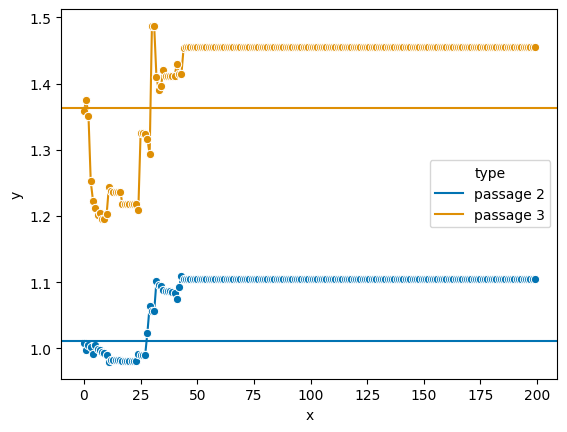

In [244]:
df_plt = pd.DataFrame(data={"x" : x, "y" : y, \
                            "type" : type_})
plt_ = sns.lineplot(data=df_plt, x="x", y="y", hue="type", palette=palette_, marker='o')

for pass_ in range(2):
    plt_.axhline(y=RMSE_mat_full[pass_, 0], c=palette_[pass_])

In [245]:
id_pareto = pareto_optimal_solution(RMSE_traj[:, 0, 0], RMSE_traj[:, 1, 0])
objectives = np.column_stack((RMSE_traj[:, 0, 0], RMSE_traj[:, 1, 0]))
print(id_pareto)
print(objectives[id_pareto])

[8, 9, 10, 11, 17, 18, 19, 20, 21, 22, 23]
[[0.99416561 1.19473502]
 [0.99325206 1.19556981]
 [0.99024928 1.20219819]
 [0.97949352 1.24335441]
 [0.98131206 1.21846125]
 [0.98131206 1.21846125]
 [0.98131206 1.21846125]
 [0.98131206 1.21846125]
 [0.98131206 1.21846125]
 [0.98131206 1.21846125]
 [0.98131206 1.21846125]]


## fit dynamic Ri with greedily seleced metabs removed

In [246]:
date_ = '20230530'
n_repeats = 10
rand_seed = 7363
np.random.seed(rand_seed)
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]


num_metabs_clust = df_speciesMetab_cluster.shape[1]
id_rm = np.array(metab_rm_list)[range(24)]
id_ = list(set(range(num_metabs_clust)) - set(list(id_rm)))
# id_ = np.where(sum_ > 0)[0]
len(id_)
df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
df_speciesMetab_tmp = df_speciesMetab_tmp.iloc[:, id_]

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_compare_greedy_rm_metabs' + \
                                        f'_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2_2to3_notremove_metabs_greedy_pareto_clusteredMetabs'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_for_paper_Ri_fit_dynamic' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'.pickle'))
Ri_dynamic_obj = {}
# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_cluster, \
#                                 df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                 df_speciesAbun_ratio_mdl, p_vec_new, \
#                                 file_save, num_passages=5, pass_rm=[1, 2, 3, 4])
pass_keep = np.arange(num_passages - 1)
id_keep = list(pass_keep) + list(pass_keep + num_passages - 1) + list(pass_keep + 2 * (num_passages - 1))
pass_rm = [2, 3, 4]
Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_tmp, \
                                df_speciesAbun_prev_mdl.iloc[:, id_keep], \
                                df_speciesAbun_next_mdl.iloc[:, id_keep], \
                                df_speciesAbun_ratio_mdl.iloc[:, id_keep], p_vec_new, \
                                file_save, num_passages=5, pass_rm=pass_rm, num_brep=3)
# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab, \
#                                       df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                       df_speciesAbun_ratio_mdl, p_vec_new, \
#                                       file_save, num_passages=5, pass_rm=[3, 4])
# Ri_dynamic_obj = fit_ss_Ri(df_speciesMetab, df_speciesAbun_mdl, \
#                                       df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                       df_speciesAbun_ratio_mdl, \
#                                       file_save, num_passages=6, pass_rm=[0, 1, 2])
# Ri_ss_obj =  fit_ss_Ri(df_speciesMetab_cluster, df_speciesAbun_mdl, \
#                        df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                        df_speciesAbun_ratio_mdl, \
#                        file_save=file_save, num_passages=6, pass_rm=pass_rm)

with open(file_save, "wb") as file_:
     pickle.dump(Ri_dynamic_obj, file_) 

count = 0, p_tmp = 0.001


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 1, p_tmp = 0.01


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 2, p_tmp = 0.05


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 3, p_tmp = 0.06


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 4, p_tmp = 0.07


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 5, p_tmp = 0.08


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 6, p_tmp = 0.09


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 7, p_tmp = 0.1


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 8, p_tmp = 0.125


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 9, p_tmp = 0.15


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 10, p_tmp = 0.175


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 11, p_tmp = 0.2


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 12, p_tmp = 0.3


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 13, p_tmp = 0.4


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 14, p_tmp = 0.5


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/Tar

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/Tar

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in sqrt
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/Tar

count = 15, p_tmp = 0.55


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 16, p_tmp = 0.6


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 17, p_tmp = 0.65


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

count = 18, p_tmp = 0.7


/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpoet/TarunHDD/maslov_lab/crn_gut_microbiome/src/utils.py:429: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)
/media/atheistpo

In [313]:
date_ = '20230530'
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
pass_rm = [0, 1, 2]
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_compare_greedy_rm_metabs' + \
                                        f'_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2_2to3_notremove_metabs_greedy_pareto_clusteredMetabs'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_for_paper_Ri_fit_dynamic' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'.pickle'))

with open(file_save, "rb") as file_:
    Ri_dynamic_obj = pickle.load(file_) 
    
Ri_noMicrocosm_dynamicAll_fit_all = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_all']
Ri_noMicrocosm_dynamicAll_fit_avg = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_avg']
Ri_noMicrocosm_dynamicAll_fit_joint = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_joint']

In [256]:
count_p = 7
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
id_order = np.argsort(-Ri_avg)

num_metabs_clust = df_speciesMetab_cluster.shape[1]
id_rm = np.array(metab_rm_list)[range(24)]
id_ = list(set(range(num_metabs_clust)) - set(list(id_rm)))

df_metabs_clusters_order = df_metabs_clusters.iloc[id_, :].copy()
df_metabs_clusters_order = df_metabs_clusters_order.iloc[id_order, :]
df_metabs_clusters_order['Ri'] = Ri_avg[id_order]

df_metabs_tmp = pd.DataFrame(data={"metabs" : metab_names_tmp[id_order], \
                                   "Ri" : Ri_avg[id_order]})
df_metabs_clusters_order.iloc[range(10), :]

,cluster_labels,cluster_counts,cluster_metab_IDs,cluser_metab_names,Ri
92,92,1,[218],[PYROGLUTAMIC ACID],0.201354
4,4,15,"[5, 13, 18, 19, 20, 22, 23, 45, 56, 57, 82, 85...","[BETA-ALANINE_0, OMEGA-HYDROXYDODECANOIC ACID,...",0.117621
5,5,5,"[15, 73, 96, 100, 135]","[1-METHYLADENOSINE, ADENOSINE, GUANOSINE, INOS...",0.089053
2,2,30,"[0, 16, 25, 26, 28, 30, 37, 38, 40, 41, 43, 46...","[N-METHYL-ASPARTIC ACID_0, STEARIC ACID, CITRI...",0.047511
45,45,1,[171],[ACETYLCHOLINE],0.041083
31,31,1,[157],[3-FUROIC ACID],0.041019
80,80,1,[206],[N-ACETYLTRYPTOPHAN],0.030271
90,90,1,[216],[PYRIDOXINE],0.024524
24,24,1,[150],"[IS_PHENYLALANINE-2,3,4,5,6-D5_1]",0.024245
26,26,1,[152],"[IS_INDOLE-2,4,5,6,7-D5-3-ACETIC ACID_0]",0.018786


In [253]:
id_rm

array([63, 10, 59,  7,  0, 82, 55, 33,  1, 44, 78, 66, 83, 32, 89, 88, 95,
        9, 38, 56, 30, 15, 65, 86])

In [254]:
df_metabs_clusters.iloc[id_rm, 3].values

array([list(['CREATINE']), list(['GALACTOSAMINE']), list(['AGMATINE']),
       list(['MANNOSE 6-PHOSPHATE', 'GLUCOSE', 'SUCROSE_1', 'GLYCERIC ACID', '1,6-ANHYDRO-B-GLUCOSE', 'HYPOXANTHINE', 'N-ACETYLNEURAMINATE']),
       list(["5'-METHYLTHIOADENOSINE", 'ADENINE', 'NICOTINAMIDE', "S-(5'-ADENOSYL)-L-HOMOCYSTEINE", 'URACIL']),
       list(['N-BUTYRYLGLYCINE']), list(['4-AMINOBENZOIC ACID']),
       list(['NORVALINE']),
       list(['NICOTINIC ACID', '1-METHYL-HYDANTOIN', 'SUCCINIC ACID', 'LACTIC ACID', 'LINOLEIC ACID', 'IS_PROGESTERONE-D9_1', '1-METHYLGUANIDINE', '2-AMINOBENZOIC ACID', 'ARGININE', 'CAPRYLOYL GLYCINE', 'CYSTATHIONINE', 'DETHIOBIOTIN', 'GLUTAMIC ACID', 'HIPPURIC ACID', 'METHIONINE', 'N6-(DELTA2-ISOPENTENYL)-ADENINE', 'OPHTHALMIC ACID', 'PANTOTHENIC ACID', 'PHENYLALANINE', 'PROLINE', 'RIBOFLAVIN', 'SPERMINE', 'THREONINE_1', 'TRYPTAMINE', 'TYROSINE']),
       list(['PHENYLETHANOLAMINE']), list(['N-ACETYLMURAMIC ACID']),
       list(['CYTOSINE']), list(['N-METHYL-GLUTAMATE'])

In [314]:
num_metabs_clust = df_speciesMetab_cluster.shape[1]
id_rm = np.array(metab_rm_list)[range(24)]
id_ = list(set(range(num_metabs_clust)) - set(list(id_rm)))
len(id_)
df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
df_speciesMetab_tmp = df_speciesMetab_tmp.iloc[:, id_]
count_p = 7
RMSE_mat_full_tmp = np.zeros((num_passages - 1, 2))
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
Ri_fit = {0: Ri_avg}
# RMSE_sens_complete_full = np.zeros((num_passages - 1, 2))
sens_obj_all, RMSE_obj_all = \
    blindly_pred_abun_growth_without_inoc([p_vec_new[count_p]], df_speciesMetab_tmp, \
                                          df_speciesAbun_inoc, df_speciesAbun_mdl, \
                                          df_speciesAbun_prev_mdl, \
                                          df_speciesAbun_ratio_mdl, \
                                          Ri_fit, "dummy", "dummy", \
                                          "dummy", num_passages=6, num_iter=100, \
                                          thresh_zero=1e-8, Ri_ss=False, plot_=False, \
                                          save_data_obj=False, \
                                          return_sensitivity_ana=True)
for pass_ in range(num_passages - 1):
    RMSE_mat_full_tmp[pass_, 0] = RMSE_obj_all[pass_]["abundance"]
    RMSE_mat_full_tmp[pass_, 1] = RMSE_obj_all[pass_]["growth_ratio"]

In [315]:
RMSE_mat_full_tmp

array([[0.98131206, 0.9618838 ],
       [1.21846125, 1.23487416],
       [1.71419018, 1.40162039],
       [2.02663981, 1.35756104],
       [2.27756452, 1.37991533]])

In [317]:
num_iter = 100
fig, axes = plt.subplots(2, int(num_passages / 2), \
                             figsize=(40, 35), sharey="row", sharex="col")
fig.supylabel('predicted abundance (log scale)', fontsize=60)
fig.supxlabel('observed abundance (log scale)', fontsize=60)
for pass_ in range(num_passages - 1):
    ax_row_ = int(pass_ / 3)
    ax_col_ = int(pass_ % 3)
    print(f'row = {ax_row_}, col = {ax_col_}')


    if pass_ <= 1:
        growth_rate_all = sens_obj_all[pass_]['growth_rate_all']
        df_speciesAbun_prev_tmp_ = sens_obj_all[pass_]['df_speciesAbun_prev']
        df_tmp = pd.DataFrame()
        for col_ in df_speciesAbun_prev_tmp_.columns.values:
            df_tmp[col_] = \
                growth_rate_all.copy()[col_].values * \
                df_speciesAbun_prev_tmp_[col_].values
            df_tmp[col_] /= np.sum(df_tmp[col_].values)
#         df_tmp = df_speciesAbun_next_mdl.iloc[:, [pass_, \
#                                                     pass_ + (num_passages - 1), \
#                                                     pass_ + 2 * (num_passages - 1)]].copy()

    b_ = range(3)
    x = \
        np.array(df_speciesAbun_mdl.copy().iloc[:, [pass_ + 1, \
                                                    pass_ + 1 + num_passages, \
                                                    pass_ + 1 + 2 * num_passages]])
#     x = 10**(np.mean(np.log10(x), axis=1)).flatten()
    x = x.flatten()
    y = np.array(df_tmp.copy())[:, :].flatten()
    thresh_zero = 1e-8
    y[y == 0] = thresh_zero
    id_ = np.where((x > 0) & (y > 0))[0]
    id_ord = np.where((x > 0) & (y > 0))[0]
    x = np.log10(x[id_])
    y = np.log10(y[id_])
    y[y <= -8] = -8

    plt_ = sns.scatterplot(x=x, \
                            y=y, s=100, ax=axes[ax_row_, ax_col_])

    plt_ = sns.kdeplot(x=x, y=y, fill=True, alpha=0.6, cmap="Reds", \
                    ax=axes[ax_row_, ax_col_])
    plt_.plot([-8, 0], [-8, 0], c="red", linewidth=3)

    corr_val_pe = scipy.stats.pearsonr(10**x, 10**y)
    corr_val_pe_log = scipy.stats.pearsonr(x, y)
    corr_val_sp = scipy.stats.spearmanr(x, y)
    # abs_mean_error = np.median(np.abs(y - x))
    abs_mean_error = np.sqrt(np.mean(np.power(y - x, 2)))
    std_error = np.sqrt(np.std(np.power(y - x, 2)))

    id_notzero_zero = np.where((x > -8) & (y <= -8))[0]

    frac_zero = len(id_notzero_zero) / len(x)

    model = sm.OLS(10**y, 10**x).fit()
    slope = model.params[0]
    slope_pval = model.pvalues[0]

    model_log = sm.OLS(y, x).fit()
    slope_log = model_log.params[0]
    slope_log_pval = model_log.pvalues[0]

    # plt_.plot([-8, 0], [np.log10(slope * (1e-8)), np.log10(slope * 1)], c="green")
    plt_.plot([-8, 0], [(slope_log * (-8)), (slope_log * 0)], c="green", \
                linewidth=3)

    # title_ = f'pearson cc (linear) = {np.round(corr_val_pe[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe[1]) + \
    #         f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe_log[1]) + \
    #         f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_sp[1]) + \
    #         f'\n slope = {np.round(slope, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_pval) + \
    #         f', slope_log = {np.round(slope_log, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_log_pval) + \
    #         f'\n abs_median_error = {np.round(abs_mean_error, 3)}' + \
    #         f'\n fit with p = {p_tmp}'
    title_ = f'predicted vs observed abundance at passage {pass_ + 1}' + \
            f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_pe_log[1]) + \
            f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_sp[1]) + \
            f'\n slope_log = {np.round(slope_log, 3)} pvalue = ' + \
                    '{:.3e}'.format(slope_log_pval) + \
            f'\n RMSE = {np.round(abs_mean_error, 3)}'

    axes[ax_row_, ax_col_].set_title(title_, size=30)
    if ax_row_ == 1:
        plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
    if ax_col_ == 0:
        plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_compare_greedy_rm_metabs' + \
                                        f'_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2_2to3_notremove_metabs_greedy_pareto_clusteredMetabs'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'predicted_vs_observed_abundance_' + \
                                            f'consolidated' + \
                                            f'_with_p{p_vec_new[count_p]}_dynamics_till_passage2_' + \
                                            f'clusterMetabs.png'))

fig.figure.savefig(file_save, \
                    dpi=300, transparent=False, facecolor="white")
plt.close(fig.figure)

row = 0, col = 0


/tmp/ipykernel_15756/4006429192.py:96: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 0, col = 1
row = 0, col = 2
row = 1, col = 0


/tmp/ipykernel_15756/4006429192.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
/tmp/ipykernel_15756/4006429192.py:96: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 1, col = 1


/tmp/ipykernel_15756/4006429192.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)


In [318]:
num_iter = 100
fig, axes = plt.subplots(2, int(num_passages / 2), \
                             figsize=(40, 35), sharey="row", sharex="col")
fig.supylabel('predicted abundance (log scale)', fontsize=60)
fig.supxlabel('observed abundance (log scale)', fontsize=60)
for pass_ in range(num_passages - 1):
    ax_row_ = int(pass_ / 3)
    ax_col_ = int(pass_ % 3)
    print(f'row = {ax_row_}, col = {ax_col_}')


    if pass_ <= 0:
        growth_rate_all = sens_obj_all[pass_]['growth_rate_all']
        df_speciesAbun_prev_tmp_ = sens_obj_all[pass_]['df_speciesAbun_prev']
        df_tmp = pd.DataFrame()
        for col_ in df_speciesAbun_prev_tmp_.columns.values:
            df_tmp[col_] = \
                growth_rate_all.copy()[col_].values * \
                df_speciesAbun_prev_tmp_[col_].values
            df_tmp[col_] /= np.sum(df_tmp[col_].values)
#         df_tmp = df_speciesAbun_next_mdl.iloc[:, [pass_, \
#                                                     pass_ + (num_passages - 1), \
#                                                     pass_ + 2 * (num_passages - 1)]].copy()

    b_ = range(3)
    x = \
        np.array(df_speciesAbun_mdl.copy().iloc[:, [pass_ + 1, \
                                                    pass_ + 1 + num_passages, \
                                                    pass_ + 1 + 2 * num_passages]])
#     x = 10**(np.mean(np.log10(x), axis=1)).flatten()
    x = x.flatten()
    y = np.array(df_tmp.copy())[:, :].flatten()
    thresh_zero = 1e-8
    y[y == 0] = thresh_zero
    id_ = np.where((x > 0) & (y > 0))[0]
    id_ord = np.where((x > 0) & (y > 0))[0]
    x = np.log10(x[id_])
    y = np.log10(y[id_])
    y[y <= -8] = -8

    plt_ = sns.scatterplot(x=x, \
                            y=y, s=100, ax=axes[ax_row_, ax_col_])

    plt_ = sns.kdeplot(x=x, y=y, fill=True, alpha=0.6, cmap="Reds", \
                    ax=axes[ax_row_, ax_col_])
    plt_.plot([-8, 0], [-8, 0], c="red", linewidth=3)

    corr_val_pe = scipy.stats.pearsonr(10**x, 10**y)
    corr_val_pe_log = scipy.stats.pearsonr(x, y)
    corr_val_sp = scipy.stats.spearmanr(x, y)
    # abs_mean_error = np.median(np.abs(y - x))
    abs_mean_error = np.sqrt(np.mean(np.power(y - x, 2)))
    std_error = np.sqrt(np.std(np.power(y - x, 2)))

    id_notzero_zero = np.where((x > -8) & (y <= -8))[0]

    frac_zero = len(id_notzero_zero) / len(x)

    model = sm.OLS(10**y, 10**x).fit()
    slope = model.params[0]
    slope_pval = model.pvalues[0]

    model_log = sm.OLS(y, x).fit()
    slope_log = model_log.params[0]
    slope_log_pval = model_log.pvalues[0]

    # plt_.plot([-8, 0], [np.log10(slope * (1e-8)), np.log10(slope * 1)], c="green")
    plt_.plot([-8, 0], [(slope_log * (-8)), (slope_log * 0)], c="green", \
                linewidth=3)

    # title_ = f'pearson cc (linear) = {np.round(corr_val_pe[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe[1]) + \
    #         f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe_log[1]) + \
    #         f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_sp[1]) + \
    #         f'\n slope = {np.round(slope, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_pval) + \
    #         f', slope_log = {np.round(slope_log, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_log_pval) + \
    #         f'\n abs_median_error = {np.round(abs_mean_error, 3)}' + \
    #         f'\n fit with p = {p_tmp}'
    title_ = f'predicted vs observed abundance at passage {pass_ + 1}' + \
            f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_pe_log[1]) + \
            f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_sp[1]) + \
            f'\n slope_log = {np.round(slope_log, 3)} pvalue = ' + \
                    '{:.3e}'.format(slope_log_pval) + \
            f'\n RMSE = {np.round(abs_mean_error, 3)}'

    axes[ax_row_, ax_col_].set_title(title_, size=30)
    if ax_row_ == 1:
        plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
    if ax_col_ == 0:
        plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_compare_greedy_rm_metabs' + \
                                        f'_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2_2to3_notremove_metabs_greedy_pareto_clusteredMetabs'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'predicted_vs_observed_abundance_' + \
                                            f'consolidated' + \
                                            f'_with_p{p_vec_new[count_p]}_dynamics_till_passage3_' + \
                                            f'clusterMetabs.png'))

fig.figure.savefig(file_save, \
                    dpi=300, transparent=False, facecolor="white")
plt.close(fig.figure)

row = 0, col = 0


/tmp/ipykernel_15756/227428733.py:96: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 0, col = 1
row = 0, col = 2
row = 1, col = 0


/tmp/ipykernel_15756/227428733.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
/tmp/ipykernel_15756/227428733.py:96: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 1, col = 1


/tmp/ipykernel_15756/227428733.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)


In [319]:
num_iter = 100
fig, axes = plt.subplots(2, int(num_passages / 2), \
                             figsize=(40, 35), sharey="row", sharex="col")
fig.supylabel('predicted abundance (log scale)', fontsize=60)
fig.supxlabel('observed abundance (log scale)', fontsize=60)
for pass_ in range(num_passages - 1):
    ax_row_ = int(pass_ / 3)
    ax_col_ = int(pass_ % 3)
    print(f'row = {ax_row_}, col = {ax_col_}')


    if pass_ <= 10:
        growth_rate_all = sens_obj_all[pass_]['growth_rate_all']
        df_speciesAbun_prev_tmp_ = sens_obj_all[pass_]['df_speciesAbun_prev']
        df_tmp = pd.DataFrame()
        for col_ in df_speciesAbun_prev_tmp_.columns.values:
            df_tmp[col_] = \
                growth_rate_all.copy()[col_].values * \
                df_speciesAbun_prev_tmp_[col_].values
            df_tmp[col_] /= np.sum(df_tmp[col_].values)
#         df_tmp = df_speciesAbun_next_mdl.iloc[:, [pass_, \
#                                                     pass_ + (num_passages - 1), \
#                                                     pass_ + 2 * (num_passages - 1)]].copy()

    b_ = range(3)
    x = \
        np.array(df_speciesAbun_mdl.copy().iloc[:, [pass_ + 1, \
                                                    pass_ + 1 + num_passages, \
                                                    pass_ + 1 + 2 * num_passages]])
#     x = 10**(np.mean(np.log10(x), axis=1)).flatten()
    x = x.flatten()
    y = np.array(df_tmp.copy())[:, :].flatten()
    thresh_zero = 1e-8
    y[y == 0] = thresh_zero
    id_ = np.where((x > 0) & (y > 0))[0]
    id_ord = np.where((x > 0) & (y > 0))[0]
    x = np.log10(x[id_])
    y = np.log10(y[id_])
    y[y <= -8] = -8

    plt_ = sns.scatterplot(x=x, \
                            y=y, s=100, ax=axes[ax_row_, ax_col_])

    plt_ = sns.kdeplot(x=x, y=y, fill=True, alpha=0.6, cmap="Reds", \
                    ax=axes[ax_row_, ax_col_])
    plt_.plot([-8, 0], [-8, 0], c="red", linewidth=3)

    corr_val_pe = scipy.stats.pearsonr(10**x, 10**y)
    corr_val_pe_log = scipy.stats.pearsonr(x, y)
    corr_val_sp = scipy.stats.spearmanr(x, y)
    # abs_mean_error = np.median(np.abs(y - x))
    abs_mean_error = np.sqrt(np.mean(np.power(y - x, 2)))
    std_error = np.sqrt(np.std(np.power(y - x, 2)))

    id_notzero_zero = np.where((x > -8) & (y <= -8))[0]

    frac_zero = len(id_notzero_zero) / len(x)

    model = sm.OLS(10**y, 10**x).fit()
    slope = model.params[0]
    slope_pval = model.pvalues[0]

    model_log = sm.OLS(y, x).fit()
    slope_log = model_log.params[0]
    slope_log_pval = model_log.pvalues[0]

    # plt_.plot([-8, 0], [np.log10(slope * (1e-8)), np.log10(slope * 1)], c="green")
    plt_.plot([-8, 0], [(slope_log * (-8)), (slope_log * 0)], c="green", \
                linewidth=3)

    # title_ = f'pearson cc (linear) = {np.round(corr_val_pe[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe[1]) + \
    #         f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe_log[1]) + \
    #         f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_sp[1]) + \
    #         f'\n slope = {np.round(slope, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_pval) + \
    #         f', slope_log = {np.round(slope_log, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_log_pval) + \
    #         f'\n abs_median_error = {np.round(abs_mean_error, 3)}' + \
    #         f'\n fit with p = {p_tmp}'
    title_ = f'predicted vs observed abundance at passage {pass_ + 1}' + \
            f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_pe_log[1]) + \
            f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_sp[1]) + \
            f'\n slope_log = {np.round(slope_log, 3)} pvalue = ' + \
                    '{:.3e}'.format(slope_log_pval) + \
            f'\n RMSE = {np.round(abs_mean_error, 3)}'

    axes[ax_row_, ax_col_].set_title(title_, size=30)
    if ax_row_ == 1:
        plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
    if ax_col_ == 0:
        plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_compare_greedy_rm_metabs' + \
                                        f'_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2_2to3_notremove_metabs_greedy_pareto_clusteredMetabs'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'predicted_vs_observed_abundance_' + \
                                            f'consolidated' + \
                                            f'_with_p{p_vec_new[count_p]}_dynamics_till_passage6_' + \
                                            f'clusterMetabs.png'))

fig.figure.savefig(file_save, \
                    dpi=300, transparent=False, facecolor="white")
plt.close(fig.figure)

row = 0, col = 0


/tmp/ipykernel_15756/2297374160.py:96: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 0, col = 1
row = 0, col = 2
row = 1, col = 0


/tmp/ipykernel_15756/2297374160.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
/tmp/ipykernel_15756/2297374160.py:96: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 1, col = 1


/tmp/ipykernel_15756/2297374160.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)


## growth ratio

In [320]:
num_iter = 100
fig, axes = plt.subplots(2, int(num_passages / 2), \
                             figsize=(40, 35), sharey="row", sharex="col")
fig.supylabel('predicted growth ratio  (log scale)', fontsize=60)
fig.supxlabel('observed growth ratio (log scale)', fontsize=60)
for pass_ in range(num_passages - 1):
    ax_row_ = int(pass_ / 3)
    ax_col_ = int(pass_ % 3)
    print(f'row = {ax_row_}, col = {ax_col_}')


    if pass_ <= 10:
        growth_rate_all = sens_obj_all[pass_]['growth_rate_all']
        df_speciesAbun_prev_tmp_ = sens_obj_all[pass_]['df_speciesAbun_prev']
        df_tmp = pd.DataFrame()
        for col_ in df_speciesAbun_prev_tmp_.columns.values:
            df_tmp[col_] = \
                growth_rate_all.copy()[col_].values * \
                df_speciesAbun_prev_tmp_[col_].values
            df_tmp[col_] /= np.sum(df_tmp[col_].values)
#         df_tmp = df_speciesAbun_next_mdl.iloc[:, [pass_, \
#                                                     pass_ + (num_passages - 1), \
#                                                     pass_ + 2 * (num_passages - 1)]].copy()

    b_ = range(3)
#     x = \
#         np.array(df_speciesAbun_mdl.copy().iloc[:, [pass_ + 1, \
#                                                     pass_ + 1 + num_passages, \
#                                                     pass_ + 1 + 2 * num_passages]])
#     x = 10**(np.mean(np.log10(x), axis=1)).flatten()
    
    x = \
        np.array(df_speciesAbun_ratio_mdl.copy().iloc[:, [pass_, \
                                                    pass_ + num_passages - 1, \
                                                    pass_ + 2 * (num_passages - 1)]])
    x = x.flatten()
#     y = np.array(df_tmp.copy())[:, :].flatten()
    y = np.array(growth_rate_all.copy()).flatten()
    thresh_zero = 1e-4
    y[y == 0] = thresh_zero
    id_ = np.where((x > 0) & (y > 0))[0]
    id_ord = np.where((x > 0) & (y > 0))[0]
    x = np.log10(x[id_])
    y = np.log10(y[id_])
    y[y <= -4] = -4

    plt_ = sns.scatterplot(x=x, \
                            y=y, s=100, ax=axes[ax_row_, ax_col_])

    plt_ = sns.kdeplot(x=x, y=y, fill=True, alpha=0.6, cmap="Reds", \
                    ax=axes[ax_row_, ax_col_])
    plt_.plot([-4, 2], [-4, 2], c="red", linewidth=3)

    corr_val_pe = scipy.stats.pearsonr(10**x, 10**y)
    corr_val_pe_log = scipy.stats.pearsonr(x, y)
    corr_val_sp = scipy.stats.spearmanr(x, y)
    # abs_mean_error = np.median(np.abs(y - x))
    abs_mean_error = np.sqrt(np.mean(np.power(y - x, 2)))
    std_error = np.sqrt(np.std(np.power(y - x, 2)))

    id_notzero_zero = np.where((x > -4) & (y <= -4))[0]

    frac_zero = len(id_notzero_zero) / len(x)

    model = sm.OLS(10**y, 10**x).fit()
    slope = model.params[0]
    slope_pval = model.pvalues[0]

    model_log = sm.OLS(y, x).fit()
    slope_log = model_log.params[0]
    slope_log_pval = model_log.pvalues[0]

    # plt_.plot([-8, 0], [np.log10(slope * (1e-8)), np.log10(slope * 1)], c="green")
    plt_.plot([-4, 2], [(slope_log * (-4)), (slope_log * 2)], c="green", \
                linewidth=3)

    # title_ = f'pearson cc (linear) = {np.round(corr_val_pe[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe[1]) + \
    #         f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe_log[1]) + \
    #         f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_sp[1]) + \
    #         f'\n slope = {np.round(slope, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_pval) + \
    #         f', slope_log = {np.round(slope_log, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_log_pval) + \
    #         f'\n abs_median_error = {np.round(abs_mean_error, 3)}' + \
    #         f'\n fit with p = {p_tmp}'
    title_ = f'predicted vs observed growth ratio at passage {pass_ + 1}' + \
            f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_pe_log[1]) + \
            f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_sp[1]) + \
            f'\n slope_log = {np.round(slope_log, 3)} pvalue = ' + \
                    '{:.3e}'.format(slope_log_pval) + \
            f'\n RMSE = {np.round(abs_mean_error, 3)}'

    axes[ax_row_, ax_col_].set_title(title_, size=30)
    if ax_row_ == 1:
        plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
    if ax_col_ == 0:
        plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_compare_greedy_rm_metabs' + \
                                        f'_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2_2to3_notremove_metabs_greedy_pareto_clusteredMetabs'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'predicted_vs_observed_growth_' + \
                                            f'consolidated' + \
                                            f'_with_p{p_vec_new[count_p]}_dynamics_till_passage3_' + \
                                            f'clusterMetabs.png'))

fig.figure.savefig(file_save, \
                    dpi=300, transparent=False, facecolor="white")
plt.close(fig.figure)

row = 0, col = 0


/tmp/ipykernel_15756/729518028.py:102: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 0, col = 1
row = 0, col = 2
row = 1, col = 0


/tmp/ipykernel_15756/729518028.py:100: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
/tmp/ipykernel_15756/729518028.py:102: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 1, col = 1


/tmp/ipykernel_15756/729518028.py:100: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)


## for agar

In [321]:
num_metabs_clust = df_speciesMetab_cluster.shape[1]
id_rm = np.array(metab_rm_list)[range(24)]
id_ = list(set(range(num_metabs_clust)) - set(list(id_rm)))
len(id_)
df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
df_speciesMetab_tmp = df_speciesMetab_tmp.iloc[:, id_]
count_p = 7
RMSE_mat_full_tmp = np.zeros((num_passages - 1, 2))
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
Ri_fit = {0: Ri_avg}
# RMSE_sens_complete_full = np.zeros((num_passages - 1, 2))
sens_obj_all, RMSE_obj_all = \
    blindly_pred_abun_growth_without_inoc([p_vec_new[count_p]], df_speciesMetab_tmp, \
                                          df_speciesAbun_inoc, df_speciesAbun_super_agar, \
                                          df_speciesAbun_super_agar_prev, \
                                          df_speciesAbun_super_agar_ratio, \
                                          Ri_fit, "dummy", "dummy", \
                                          "dummy", num_passages=6, num_iter=100, \
                                          thresh_zero=1e-8, Ri_ss=False, plot_=False, \
                                          save_data_obj=False, \
                                          return_sensitivity_ana=True)
for pass_ in range(num_passages - 1):
    RMSE_mat_full_tmp[pass_, 0] = RMSE_obj_all[pass_]["abundance"]
    RMSE_mat_full_tmp[pass_, 1] = RMSE_obj_all[pass_]["growth_ratio"]

In [322]:
RMSE_mat_full_tmp

array([[1.10955908, 1.1257923 ],
       [1.8017054 , 1.28127746],
       [2.59236094, 1.6090505 ],
       [2.97236971, 1.48714909],
       [3.1906879 , 1.45238052]])

## abundance agar

In [323]:
num_iter = 100
fig, axes = plt.subplots(2, int(num_passages / 2), \
                             figsize=(40, 35), sharey="row", sharex="col")
fig.supylabel('predicted abundance (log scale)', fontsize=60)
fig.supxlabel('observed abundance (log scale)', fontsize=60)
for pass_ in range(num_passages - 1):
    ax_row_ = int(pass_ / 3)
    ax_col_ = int(pass_ % 3)
    print(f'row = {ax_row_}, col = {ax_col_}')


    if pass_ <= 1:
        growth_rate_all = sens_obj_all[pass_]['growth_rate_all']
        df_speciesAbun_prev_tmp_ = sens_obj_all[pass_]['df_speciesAbun_prev']
        df_tmp = pd.DataFrame()
        for col_ in df_speciesAbun_prev_tmp_.columns.values:
            df_tmp[col_] = \
                growth_rate_all.copy()[col_].values * \
                df_speciesAbun_prev_tmp_[col_].values
            df_tmp[col_] /= np.sum(df_tmp[col_].values)
#         df_tmp = df_speciesAbun_next_mdl.iloc[:, [pass_, \
#                                                     pass_ + (num_passages - 1), \
#                                                     pass_ + 2 * (num_passages - 1)]].copy()

    b_ = range(3)
    x = \
        np.array(df_speciesAbun_super_agar.copy().iloc[:, [pass_ + 1, \
                                                    pass_ + 1 + num_passages, \
                                                    pass_ + 1 + 2 * num_passages]])
#     x = 10**(np.mean(np.log10(x), axis=1)).flatten()
    x = x.flatten()
    y = np.array(df_tmp.copy())[:, :].flatten()
    thresh_zero = 1e-8
    y[y == 0] = thresh_zero
    id_ = np.where((x > 0) & (y > 0))[0]
    id_ord = np.where((x > 0) & (y > 0))[0]
    x = np.log10(x[id_])
    y = np.log10(y[id_])
    y[y <= -8] = -8

    plt_ = sns.scatterplot(x=x, \
                            y=y, s=100, ax=axes[ax_row_, ax_col_])

    plt_ = sns.kdeplot(x=x, y=y, fill=True, alpha=0.6, cmap="Reds", \
                    ax=axes[ax_row_, ax_col_])
    plt_.plot([-8, 0], [-8, 0], c="red", linewidth=3)

    corr_val_pe = scipy.stats.pearsonr(10**x, 10**y)
    corr_val_pe_log = scipy.stats.pearsonr(x, y)
    corr_val_sp = scipy.stats.spearmanr(x, y)
    # abs_mean_error = np.median(np.abs(y - x))
    abs_mean_error = np.sqrt(np.mean(np.power(y - x, 2)))
    std_error = np.sqrt(np.std(np.power(y - x, 2)))

    id_notzero_zero = np.where((x > -8) & (y <= -8))[0]

    frac_zero = len(id_notzero_zero) / len(x)

    model = sm.OLS(10**y, 10**x).fit()
    slope = model.params[0]
    slope_pval = model.pvalues[0]

    model_log = sm.OLS(y, x).fit()
    slope_log = model_log.params[0]
    slope_log_pval = model_log.pvalues[0]

    # plt_.plot([-8, 0], [np.log10(slope * (1e-8)), np.log10(slope * 1)], c="green")
    plt_.plot([-8, 0], [(slope_log * (-8)), (slope_log * 0)], c="green", \
                linewidth=3)

    # title_ = f'pearson cc (linear) = {np.round(corr_val_pe[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe[1]) + \
    #         f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe_log[1]) + \
    #         f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_sp[1]) + \
    #         f'\n slope = {np.round(slope, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_pval) + \
    #         f', slope_log = {np.round(slope_log, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_log_pval) + \
    #         f'\n abs_median_error = {np.round(abs_mean_error, 3)}' + \
    #         f'\n fit with p = {p_tmp}'
    title_ = f'predicted vs observed abundance at passage {pass_ + 1}' + \
            f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_pe_log[1]) + \
            f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_sp[1]) + \
            f'\n slope_log = {np.round(slope_log, 3)} pvalue = ' + \
                    '{:.3e}'.format(slope_log_pval) + \
            f'\n RMSE = {np.round(abs_mean_error, 3)}'

    axes[ax_row_, ax_col_].set_title(title_, size=30)
    if ax_row_ == 1:
        plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
    if ax_col_ == 0:
        plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_compare_greedy_rm_metabs' + \
                                        f'_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2_2to3_notremove_metabs_greedy_pareto_clusteredMetabs'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'predicted_vs_observed_abundance_' + \
                                            f'consolidated' + \
                                            f'_with_p{p_vec_new[count_p]}_dynamics_till_passage3_agar_' + \
                                            f'clusterMetabs.png'))

fig.figure.savefig(file_save, \
                    dpi=300, transparent=False, facecolor="white")
plt.close(fig.figure)

row = 0, col = 0


/tmp/ipykernel_15756/2341569528.py:96: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 0, col = 1
row = 0, col = 2
row = 1, col = 0


/tmp/ipykernel_15756/2341569528.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
/tmp/ipykernel_15756/2341569528.py:96: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 1, col = 1


/tmp/ipykernel_15756/2341569528.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)


## growth ratio agar

In [324]:
num_iter = 100
fig, axes = plt.subplots(2, int(num_passages / 2), \
                             figsize=(40, 35), sharey="row", sharex="col")
fig.supylabel('predicted growth ratio  (log scale)', fontsize=60)
fig.supxlabel('observed growth ratio (log scale)', fontsize=60)
for pass_ in range(num_passages - 1):
    ax_row_ = int(pass_ / 3)
    ax_col_ = int(pass_ % 3)
    print(f'row = {ax_row_}, col = {ax_col_}')


    if pass_ <= 10:
        growth_rate_all = sens_obj_all[pass_]['growth_rate_all']
        df_speciesAbun_prev_tmp_ = sens_obj_all[pass_]['df_speciesAbun_prev']
        df_tmp = pd.DataFrame()
        for col_ in df_speciesAbun_prev_tmp_.columns.values:
            df_tmp[col_] = \
                growth_rate_all.copy()[col_].values * \
                df_speciesAbun_prev_tmp_[col_].values
            df_tmp[col_] /= np.sum(df_tmp[col_].values)
#         df_tmp = df_speciesAbun_next_mdl.iloc[:, [pass_, \
#                                                     pass_ + (num_passages - 1), \
#                                                     pass_ + 2 * (num_passages - 1)]].copy()

    b_ = range(3)
#     x = \
#         np.array(df_speciesAbun_mdl.copy().iloc[:, [pass_ + 1, \
#                                                     pass_ + 1 + num_passages, \
#                                                     pass_ + 1 + 2 * num_passages]])
#     x = 10**(np.mean(np.log10(x), axis=1)).flatten()
    
    x = \
        np.array(df_speciesAbun_super_agar_ratio.copy().iloc[:, [pass_, \
                                                    pass_ + num_passages - 1, \
                                                    pass_ + 2 * (num_passages - 1)]])
    x = x.flatten()
#     y = np.array(df_tmp.copy())[:, :].flatten()
    y = np.array(growth_rate_all.copy()).flatten()
    thresh_zero = 1e-4
    y[y == 0] = thresh_zero
    id_ = np.where((x > 0) & (y > 0))[0]
    id_ord = np.where((x > 0) & (y > 0))[0]
    x = np.log10(x[id_])
    y = np.log10(y[id_])
    y[y <= -4] = -4

    plt_ = sns.scatterplot(x=x, \
                            y=y, s=100, ax=axes[ax_row_, ax_col_])

    plt_ = sns.kdeplot(x=x, y=y, fill=True, alpha=0.6, cmap="Reds", \
                    ax=axes[ax_row_, ax_col_])
    plt_.plot([-4, 2], [-4, 2], c="red", linewidth=3)

    corr_val_pe = scipy.stats.pearsonr(10**x, 10**y)
    corr_val_pe_log = scipy.stats.pearsonr(x, y)
    corr_val_sp = scipy.stats.spearmanr(x, y)
    # abs_mean_error = np.median(np.abs(y - x))
    abs_mean_error = np.sqrt(np.mean(np.power(y - x, 2)))
    std_error = np.sqrt(np.std(np.power(y - x, 2)))

    id_notzero_zero = np.where((x > -4) & (y <= -4))[0]

    frac_zero = len(id_notzero_zero) / len(x)

    model = sm.OLS(10**y, 10**x).fit()
    slope = model.params[0]
    slope_pval = model.pvalues[0]

    model_log = sm.OLS(y, x).fit()
    slope_log = model_log.params[0]
    slope_log_pval = model_log.pvalues[0]

    # plt_.plot([-8, 0], [np.log10(slope * (1e-8)), np.log10(slope * 1)], c="green")
    plt_.plot([-4, 2], [(slope_log * (-4)), (slope_log * 2)], c="green", \
                linewidth=3)

    # title_ = f'pearson cc (linear) = {np.round(corr_val_pe[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe[1]) + \
    #         f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe_log[1]) + \
    #         f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_sp[1]) + \
    #         f'\n slope = {np.round(slope, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_pval) + \
    #         f', slope_log = {np.round(slope_log, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_log_pval) + \
    #         f'\n abs_median_error = {np.round(abs_mean_error, 3)}' + \
    #         f'\n fit with p = {p_tmp}'
    title_ = f'predicted vs observed growth ratio at passage {pass_ + 1}' + \
            f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_pe_log[1]) + \
            f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_sp[1]) + \
            f'\n slope_log = {np.round(slope_log, 3)} pvalue = ' + \
                    '{:.3e}'.format(slope_log_pval) + \
            f'\n RMSE = {np.round(abs_mean_error, 3)}'

    axes[ax_row_, ax_col_].set_title(title_, size=30)
    if ax_row_ == 1:
        plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
    if ax_col_ == 0:
        plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_compare_greedy_rm_metabs' + \
                                        f'_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2_2to3_notremove_metabs_greedy_pareto_clusteredMetabs'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'predicted_vs_observed_growth_' + \
                                            f'consolidated' + \
                                            f'_with_p{p_vec_new[count_p]}_dynamics_till_passage3_agar_' + \
                                            f'clusterMetabs.png'))

fig.figure.savefig(file_save, \
                    dpi=300, transparent=False, facecolor="white")
plt.close(fig.figure)

row = 0, col = 0


/tmp/ipykernel_15756/2810443545.py:102: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 0, col = 1
row = 0, col = 2
row = 1, col = 0


/tmp/ipykernel_15756/2810443545.py:100: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
/tmp/ipykernel_15756/2810443545.py:102: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 1, col = 1


/tmp/ipykernel_15756/2810443545.py:100: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)


## for mucin

In [325]:
num_metabs_clust = df_speciesMetab_cluster.shape[1]
id_rm = np.array(metab_rm_list)[range(24)]
id_ = list(set(range(num_metabs_clust)) - set(list(id_rm)))
len(id_)
df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
df_speciesMetab_tmp = df_speciesMetab_tmp.iloc[:, id_]
count_p = 7
RMSE_mat_full_tmp = np.zeros((num_passages - 1, 2))
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
Ri_fit = {0: Ri_avg}
# RMSE_sens_complete_full = np.zeros((num_passages - 1, 2))
sens_obj_all, RMSE_obj_all = \
    blindly_pred_abun_growth_without_inoc([p_vec_new[count_p]], df_speciesMetab_tmp, \
                                          df_speciesAbun_inoc, df_speciesAbun_mucin, \
                                          df_speciesAbun_mucin_prev, \
                                          df_speciesAbun_mucin_ratio, \
                                          Ri_fit, "dummy", "dummy", \
                                          "dummy", num_passages=6, num_iter=100, \
                                          thresh_zero=1e-8, Ri_ss=False, plot_=False, \
                                          save_data_obj=False, \
                                          return_sensitivity_ana=True)
for pass_ in range(num_passages - 1):
    RMSE_mat_full_tmp[pass_, 0] = RMSE_obj_all[pass_]["abundance"]
    RMSE_mat_full_tmp[pass_, 1] = RMSE_obj_all[pass_]["growth_ratio"]

In [326]:
RMSE_mat_full_tmp

array([[1.16521197, 1.19673496],
       [2.06550307, 1.40334446],
       [2.76930404, 1.4855912 ],
       [3.13989037, 1.60383626],
       [3.3806822 , 1.59213203]])

## abundance mucin

In [ ]:
num_iter = 100
fig, axes = plt.subplots(2, int(num_passages / 2), \
                             figsize=(40, 35), sharey="row", sharex="col")
fig.supylabel('predicted abundance (log scale)', fontsize=60)
fig.supxlabel('observed abundance (log scale)', fontsize=60)
for pass_ in range(num_passages - 1):
    ax_row_ = int(pass_ / 3)
    ax_col_ = int(pass_ % 3)
    print(f'row = {ax_row_}, col = {ax_col_}')


    if pass_ <= 1:
        growth_rate_all = sens_obj_all[pass_]['growth_rate_all']
        df_speciesAbun_prev_tmp_ = sens_obj_all[pass_]['df_speciesAbun_prev']
        df_tmp = pd.DataFrame()
        for col_ in df_speciesAbun_prev_tmp_.columns.values:
            df_tmp[col_] = \
                growth_rate_all.copy()[col_].values * \
                df_speciesAbun_prev_tmp_[col_].values
            df_tmp[col_] /= np.sum(df_tmp[col_].values)
#         df_tmp = df_speciesAbun_next_mdl.iloc[:, [pass_, \
#                                                     pass_ + (num_passages - 1), \
#                                                     pass_ + 2 * (num_passages - 1)]].copy()

    b_ = range(3)
    x = \
        np.array(df_speciesAbun_mucin.copy().iloc[:, [pass_ + 1, \
                                                    pass_ + 1 + num_passages, \
                                                    pass_ + 1 + 2 * num_passages]])
#     x = 10**(np.mean(np.log10(x), axis=1)).flatten()
    x = x.flatten()
    y = np.array(df_tmp.copy())[:, :].flatten()
    thresh_zero = 1e-8
    y[y == 0] = thresh_zero
    id_ = np.where((x > 0) & (y > 0))[0]
    id_ord = np.where((x > 0) & (y > 0))[0]
    x = np.log10(x[id_])
    y = np.log10(y[id_])
    y[y <= -8] = -8

    plt_ = sns.scatterplot(x=x, \
                            y=y, s=100, ax=axes[ax_row_, ax_col_])

    plt_ = sns.kdeplot(x=x, y=y, fill=True, alpha=0.6, cmap="Reds", \
                    ax=axes[ax_row_, ax_col_])
    plt_.plot([-8, 0], [-8, 0], c="red", linewidth=3)

    corr_val_pe = scipy.stats.pearsonr(10**x, 10**y)
    corr_val_pe_log = scipy.stats.pearsonr(x, y)
    corr_val_sp = scipy.stats.spearmanr(x, y)
    # abs_mean_error = np.median(np.abs(y - x))
    abs_mean_error = np.sqrt(np.mean(np.power(y - x, 2)))
    std_error = np.sqrt(np.std(np.power(y - x, 2)))

    id_notzero_zero = np.where((x > -8) & (y <= -8))[0]

    frac_zero = len(id_notzero_zero) / len(x)

    model = sm.OLS(10**y, 10**x).fit()
    slope = model.params[0]
    slope_pval = model.pvalues[0]

    model_log = sm.OLS(y, x).fit()
    slope_log = model_log.params[0]
    slope_log_pval = model_log.pvalues[0]

    # plt_.plot([-8, 0], [np.log10(slope * (1e-8)), np.log10(slope * 1)], c="green")
    plt_.plot([-8, 0], [(slope_log * (-8)), (slope_log * 0)], c="green", \
                linewidth=3)

    # title_ = f'pearson cc (linear) = {np.round(corr_val_pe[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe[1]) + \
    #         f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe_log[1]) + \
    #         f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_sp[1]) + \
    #         f'\n slope = {np.round(slope, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_pval) + \
    #         f', slope_log = {np.round(slope_log, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_log_pval) + \
    #         f'\n abs_median_error = {np.round(abs_mean_error, 3)}' + \
    #         f'\n fit with p = {p_tmp}'
    title_ = f'predicted vs observed abundance at passage {pass_ + 1}' + \
            f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_pe_log[1]) + \
            f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_sp[1]) + \
            f'\n slope_log = {np.round(slope_log, 3)} pvalue = ' + \
                    '{:.3e}'.format(slope_log_pval) + \
            f'\n RMSE = {np.round(abs_mean_error, 3)}'

    axes[ax_row_, ax_col_].set_title(title_, size=30)
    if ax_row_ == 1:
        plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
    if ax_col_ == 0:
        plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_compare_greedy_rm_metabs' + \
                                        f'_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2_2to3_notremove_metabs_greedy_pareto_clusteredMetabs'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'predicted_vs_observed_abundance_' + \
                                            f'consolidated' + \
                                            f'_with_p{p_vec_new[count_p]}_dynamics_till_passage3_mucin_' + \
                                            f'clusterMetabs.png'))

fig.figure.savefig(file_save, \
                    dpi=300, transparent=False, facecolor="white")
plt.close(fig.figure)

row = 0, col = 0


/tmp/ipykernel_15756/360304826.py:96: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 0, col = 1
row = 0, col = 2
row = 1, col = 0


/tmp/ipykernel_15756/360304826.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
/tmp/ipykernel_15756/360304826.py:96: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 1, col = 1


/tmp/ipykernel_15756/360304826.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)


## growth ratio mucin

row = 0, col = 0


/tmp/ipykernel_15756/1377465534.py:102: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 0, col = 1
row = 0, col = 2
row = 1, col = 0


/tmp/ipykernel_15756/1377465534.py:100: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
/tmp/ipykernel_15756/1377465534.py:102: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)


row = 1, col = 1


/tmp/ipykernel_15756/1377465534.py:100: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)


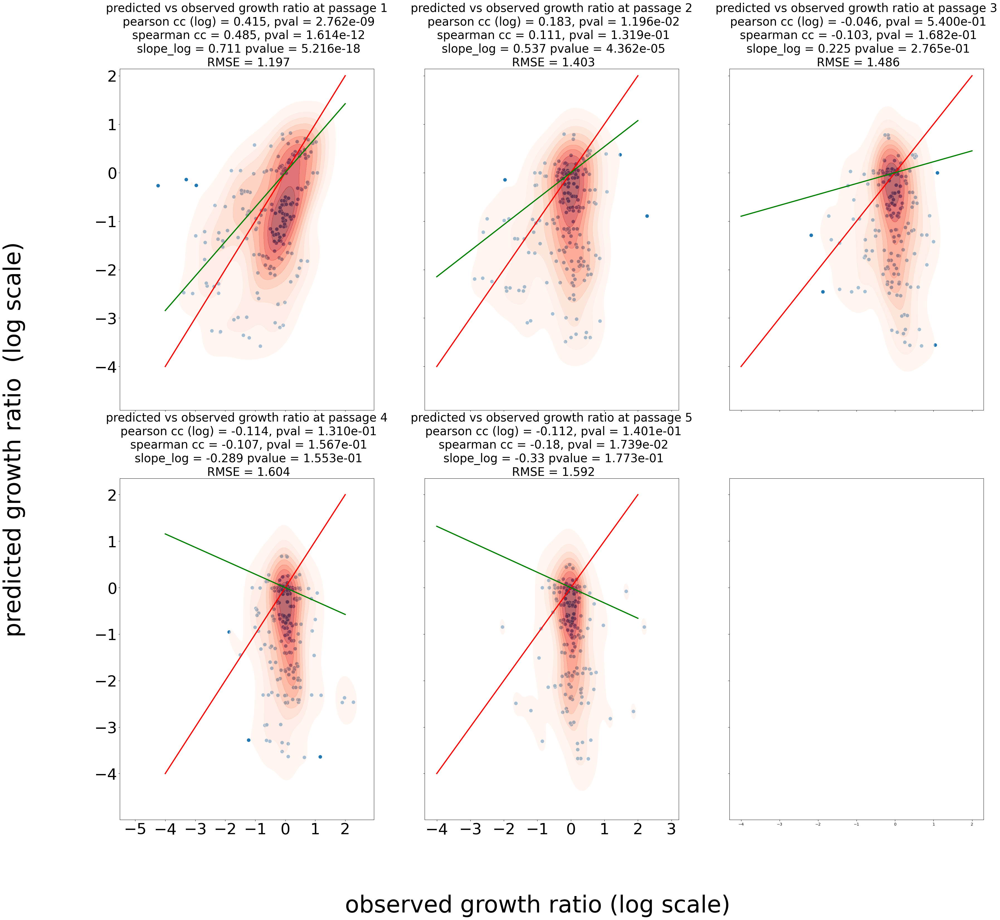

In [295]:
num_iter = 100
fig, axes = plt.subplots(2, int(num_passages / 2), \
                             figsize=(40, 35), sharey="row", sharex="col")
fig.supylabel('predicted growth ratio  (log scale)', fontsize=60)
fig.supxlabel('observed growth ratio (log scale)', fontsize=60)
for pass_ in range(num_passages - 1):
    ax_row_ = int(pass_ / 3)
    ax_col_ = int(pass_ % 3)
    print(f'row = {ax_row_}, col = {ax_col_}')


    if pass_ <= 10:
        growth_rate_all = sens_obj_all[pass_]['growth_rate_all']
        df_speciesAbun_prev_tmp_ = sens_obj_all[pass_]['df_speciesAbun_prev']
        df_tmp = pd.DataFrame()
        for col_ in df_speciesAbun_prev_tmp_.columns.values:
            df_tmp[col_] = \
                growth_rate_all.copy()[col_].values * \
                df_speciesAbun_prev_tmp_[col_].values
            df_tmp[col_] /= np.sum(df_tmp[col_].values)
#         df_tmp = df_speciesAbun_next_mdl.iloc[:, [pass_, \
#                                                     pass_ + (num_passages - 1), \
#                                                     pass_ + 2 * (num_passages - 1)]].copy()

    b_ = range(3)
#     x = \
#         np.array(df_speciesAbun_mdl.copy().iloc[:, [pass_ + 1, \
#                                                     pass_ + 1 + num_passages, \
#                                                     pass_ + 1 + 2 * num_passages]])
#     x = 10**(np.mean(np.log10(x), axis=1)).flatten()
    
    x = \
        np.array(df_speciesAbun_mucin_ratio.copy().iloc[:, [pass_, \
                                                    pass_ + num_passages - 1, \
                                                    pass_ + 2 * (num_passages - 1)]])
    x = x.flatten()
#     y = np.array(df_tmp.copy())[:, :].flatten()
    y = np.array(growth_rate_all.copy()).flatten()
    thresh_zero = 1e-4
    y[y == 0] = thresh_zero
    id_ = np.where((x > 0) & (y > 0))[0]
    id_ord = np.where((x > 0) & (y > 0))[0]
    x = np.log10(x[id_])
    y = np.log10(y[id_])
    y[y <= -4] = -4

    plt_ = sns.scatterplot(x=x, \
                            y=y, s=100, ax=axes[ax_row_, ax_col_])

    plt_ = sns.kdeplot(x=x, y=y, fill=True, alpha=0.6, cmap="Reds", \
                    ax=axes[ax_row_, ax_col_])
    plt_.plot([-4, 2], [-4, 2], c="red", linewidth=3)

    corr_val_pe = scipy.stats.pearsonr(10**x, 10**y)
    corr_val_pe_log = scipy.stats.pearsonr(x, y)
    corr_val_sp = scipy.stats.spearmanr(x, y)
    # abs_mean_error = np.median(np.abs(y - x))
    abs_mean_error = np.sqrt(np.mean(np.power(y - x, 2)))
    std_error = np.sqrt(np.std(np.power(y - x, 2)))

    id_notzero_zero = np.where((x > -4) & (y <= -4))[0]

    frac_zero = len(id_notzero_zero) / len(x)

    model = sm.OLS(10**y, 10**x).fit()
    slope = model.params[0]
    slope_pval = model.pvalues[0]

    model_log = sm.OLS(y, x).fit()
    slope_log = model_log.params[0]
    slope_log_pval = model_log.pvalues[0]

    # plt_.plot([-8, 0], [np.log10(slope * (1e-8)), np.log10(slope * 1)], c="green")
    plt_.plot([-4, 2], [(slope_log * (-4)), (slope_log * 2)], c="green", \
                linewidth=3)

    # title_ = f'pearson cc (linear) = {np.round(corr_val_pe[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe[1]) + \
    #         f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_pe_log[1]) + \
    #         f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
    #                 '{:.3e}'.format(corr_val_sp[1]) + \
    #         f'\n slope = {np.round(slope, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_pval) + \
    #         f', slope_log = {np.round(slope_log, 3)} pvalue = ' + \
    #                 '{:.3e}'.format(slope_log_pval) + \
    #         f'\n abs_median_error = {np.round(abs_mean_error, 3)}' + \
    #         f'\n fit with p = {p_tmp}'
    title_ = f'predicted vs observed growth ratio at passage {pass_ + 1}' + \
            f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_pe_log[1]) + \
            f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
                    '{:.3e}'.format(corr_val_sp[1]) + \
            f'\n slope_log = {np.round(slope_log, 3)} pvalue = ' + \
                    '{:.3e}'.format(slope_log_pval) + \
            f'\n RMSE = {np.round(abs_mean_error, 3)}'

    axes[ax_row_, ax_col_].set_title(title_, size=30)
    if ax_row_ == 1:
        plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
    if ax_col_ == 0:
        plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_}_for_paper_compare_greedy_rm_metabs' + \
                                        f'_predict_abundance_blind_growth_ratio' + \
                                        f'_Ri_fit_dynamic' + \
                                        f'_nocluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2_2to3_notremove_metabs_greedy_pareto_clusteredMetabs'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'predicted_vs_observed_growth_' + \
                                            f'consolidated' + \
                                            f'_with_p{p_vec_new[count_p]}_dynamics_till_passage3_mucin_' + \
                                            f'clusterMetabs.png'))

fig.figure.savefig(file_save, \
                    dpi=300, transparent=False, facecolor="white")
plt.close(fig.figure)